# Script Analysis Environment

This notebook contains the implementation of deep learning methodology for ancient script stylistic analysis, focusing on relationships between Indus, Proto-Cuneiform, Proto-Elamite and Naxi-Dongba writing systems.

# **1. Environment Setup and Dependencies**

In [ ]:
!pip install torch torchvision timm transformers matplotlib scikit-learn \
    opencv-python pandas seaborn umap-learn Pillow fontTools beautifulsoup4 requests tqdm

# ========== System & Utility Imports ==========
import os
import math
import sys
import importlib.util
import random
import shutil
import zipfile
import pickle
import warnings
import traceback
import base64
from io import BytesIO
from datetime import datetime

# ========== Numerical & Data Science Libraries ==========
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import matplotlib.font_manager as fm
import json

# ========== Machine Learning & Deep Learning Libraries ==========
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchsummary import summary
from torch.utils.data import Dataset, DataLoader, ConcatDataset, random_split, TensorDataset

# ========== Computer Vision Libraries ==========
import cv2
from PIL import Image, ImageDraw, ImageFont, ImageFilter, ImageEnhance, ImageOps
from fontTools.ttLib import TTFont

# ========== Deep Learning Model Utilities ==========
import timm
from timm.data import resolve_data_config
from timm.loss import LabelSmoothingCrossEntropy

# ========== Torchvision (Image Processing) ==========
import torchvision.transforms.functional as TF
from torchvision import transforms
from torchvision.utils import make_grid, save_image

# ========== Web Scraping & Requests ==========
import requests
from bs4 import BeautifulSoup

# ========== Visualization & Plotting ==========
import plotly.express as px
import plotly.io as pio
from mpl_toolkits.mplot3d import Axes3D

# ========== Dimensionality Reduction & Clustering ==========
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    confusion_matrix, classification_report
)

# ========== Hierarchical Clustering ==========
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.cluster import hierarchy
from scipy.spatial import distance
from scipy.spatial.distance import pdist
from scipy.stats import ttest_ind

# ========== Graph Theory & Network Analysis ==========
import networkx as nx

# ========== Progress Bar ==========
from tqdm.notebook import tqdm

# ========== Google Colab Specific ==========
from google.colab import drive, files

# Set device for PyTorch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Mount Google Drive (if using Colab)
drive.mount('/content/drive')

Using device: cuda
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **3. Dataset Loading, Preprocessing, and Augmentation**

## 3.1. Loading and Preprocessing Pipeline

Prepares and loads script datasets  
- Applies denoising, padding, and resizing.  
- Constructs labeled datasets and DataLoaders.  
- Enables selective denoising for Old Naxi.  
- Combines multiple script datasets for training.  

Indus dataset: 715 images found
Visualizing preprocessing for a sample from Indus


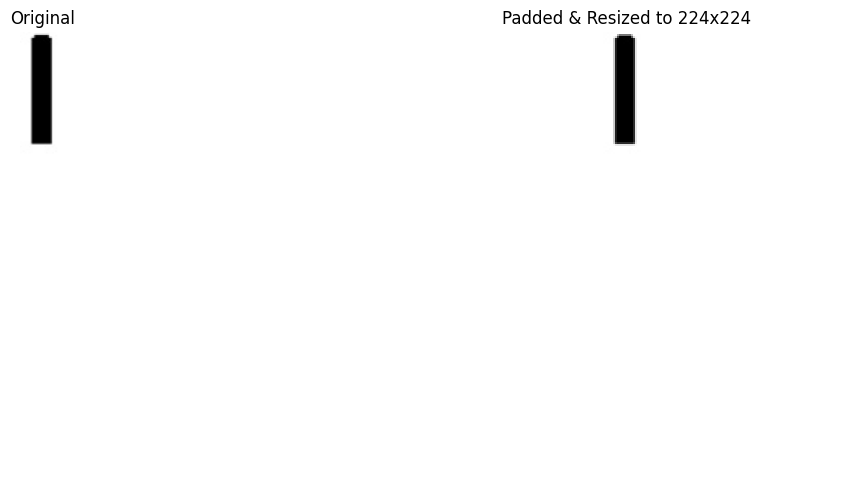

Successfully loaded a batch: shape=torch.Size([1, 3, 224, 224])
Proto-Cuneiform dataset: 2089 images found
Visualizing preprocessing for a sample from Proto-Cuneiform


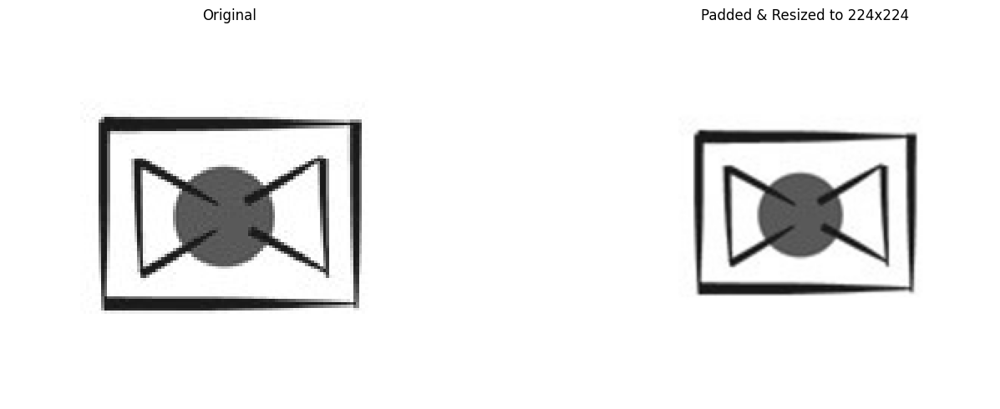

Successfully loaded a batch: shape=torch.Size([1, 3, 224, 224])
Proto-Elamite dataset: 1510 images found
Visualizing preprocessing for a sample from Proto-Elamite


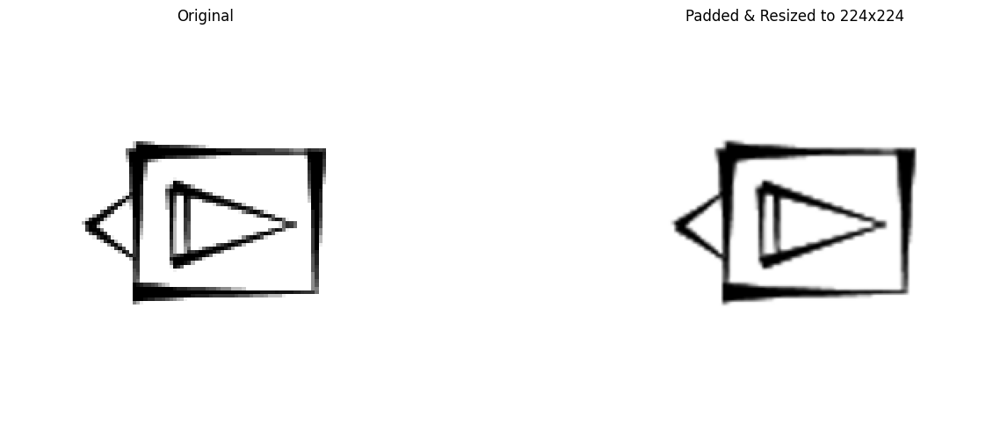

Successfully loaded a batch: shape=torch.Size([1, 3, 224, 224])
Naxi Dongba dataset: 2121 images found
Visualizing preprocessing for a sample from Naxi Dongba


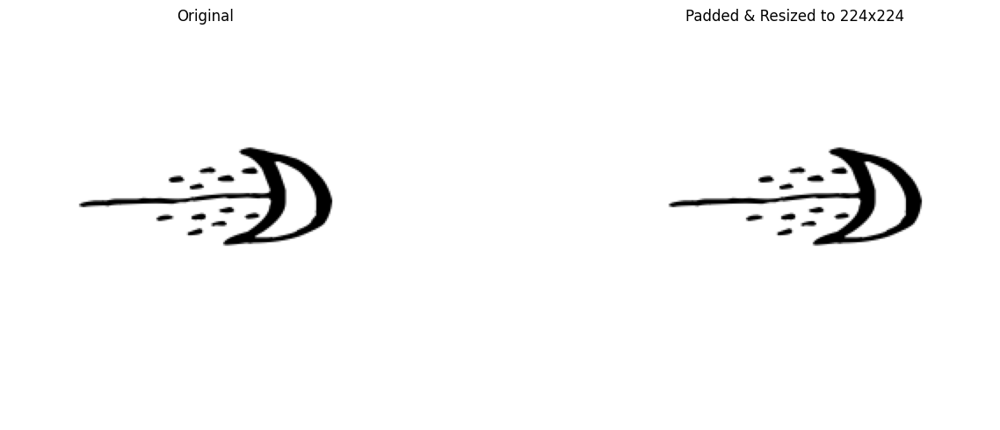

Successfully loaded a batch: shape=torch.Size([1, 3, 224, 224])
Old-Naxi dataset: 2380 images found
Visualizing preprocessing for a sample from Old-Naxi


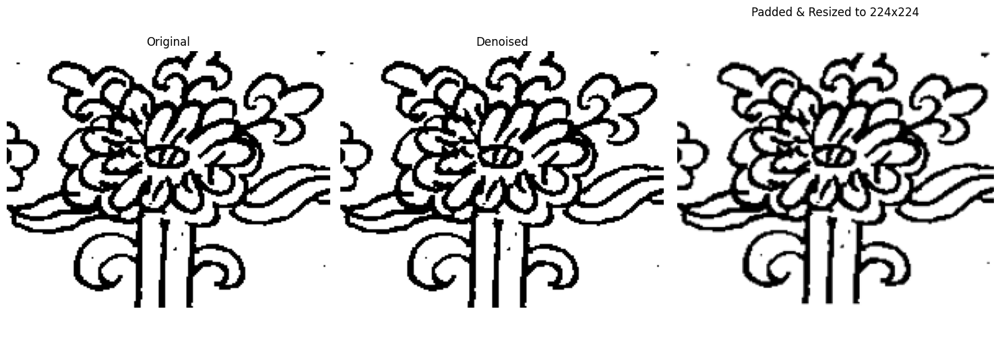

Successfully loaded a batch: shape=torch.Size([1, 3, 224, 224])

Checking TYC subfolders:
TYC-yi dataset: 2922 images found
Visualizing preprocessing for a sample from TYC-yi


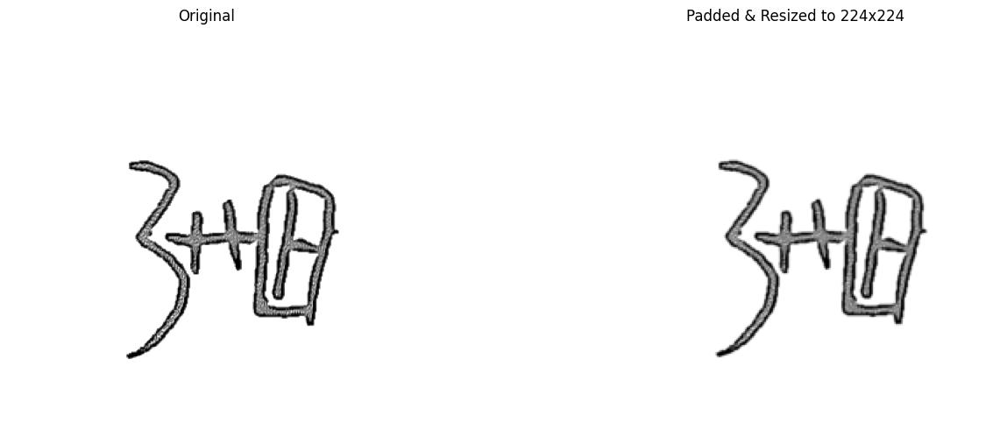

Successfully loaded a batch: shape=torch.Size([1, 3, 224, 224])
Visualizing a sample from TYC/yi


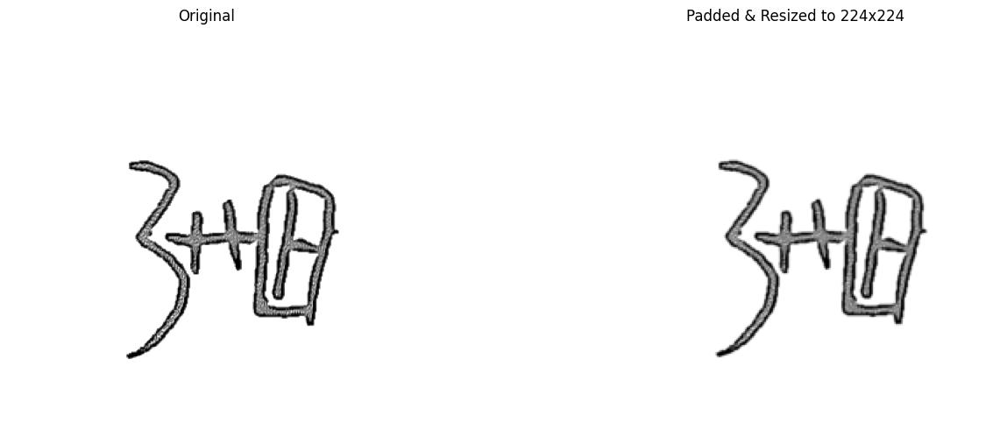

TYC-ba-shu dataset: 2922 images found
Visualizing preprocessing for a sample from TYC-ba-shu


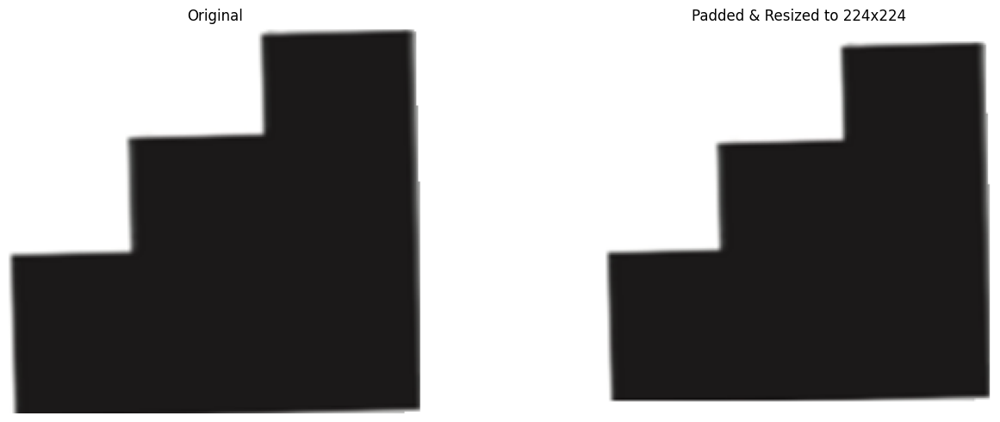

Successfully loaded a batch: shape=torch.Size([1, 3, 224, 224])
Visualizing a sample from TYC/ba-shu


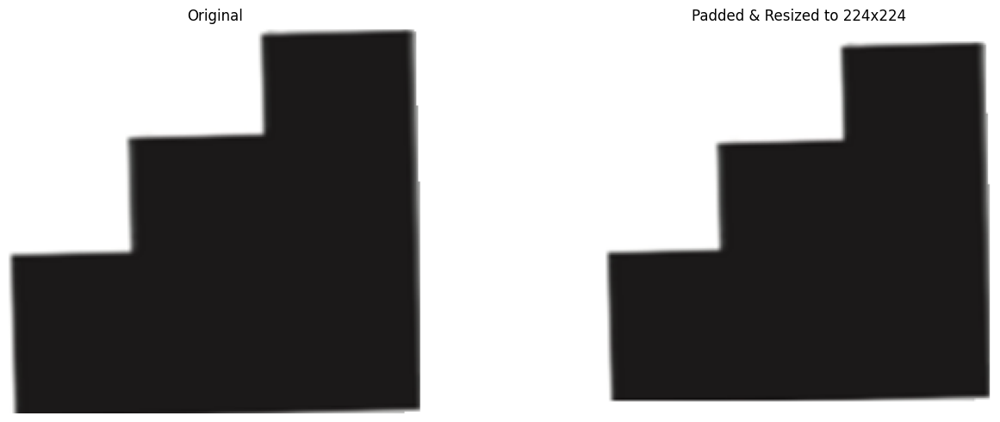

TYC-old_naxi dataset: 2922 images found
Visualizing preprocessing for a sample from TYC-old_naxi


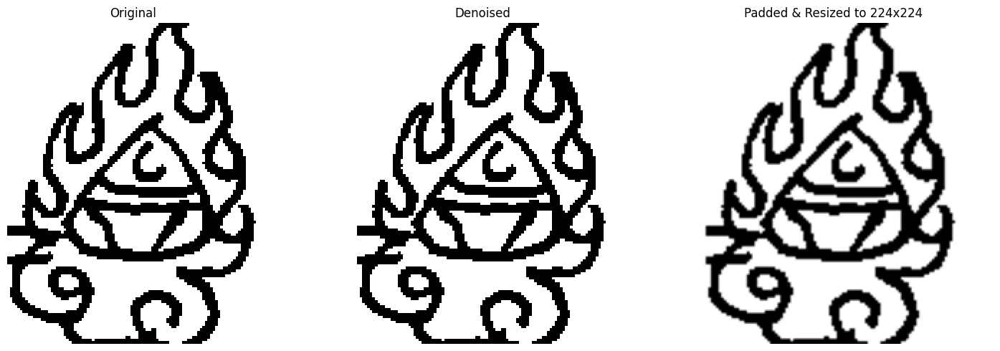

Successfully loaded a batch: shape=torch.Size([1, 3, 224, 224])
Visualizing a sample from TYC/old_naxi


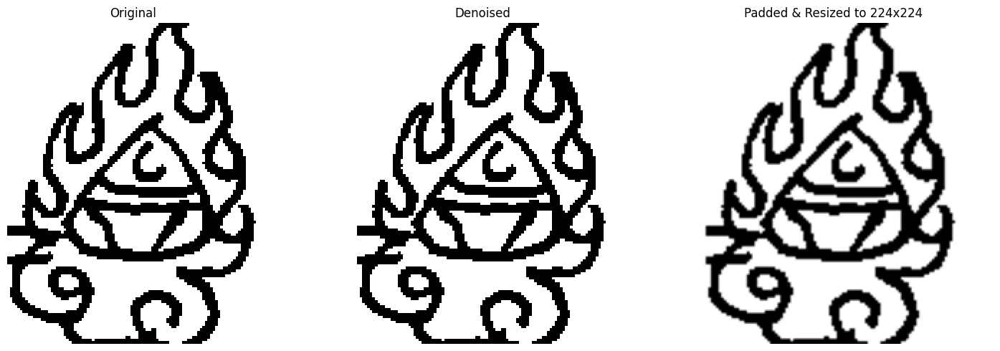

TYC dataset: 8766 total images found


In [ ]:
import torchvision.transforms as T

INDUS_PATH = '/content/drive/MyDrive/script_analysis/indus/'
PROTO_CUNEIFORM_PATH = '/content/drive/MyDrive/script_analysis/proto_cuneiform/'
PROTO_ELAMITE_PATH = '/content/drive/MyDrive/script_analysis/proto_elamite/'
NAXI_DONGBA_PATH = '/content/drive/MyDrive/script_analysis/naxi_dongba/'
OLD_NAXI_PATH = '/content/drive/MyDrive/script_analysis/old_naxi/'
TYC_PATH = '/content/drive/MyDrive/script_analysis/tyc/'

class ScriptDataset(Dataset):
    def __init__(self, image_paths, transform=None, script_type=None, denoise_types=None):
        self.image_paths = image_paths
        self.transform = transform
        self.script_type = script_type
        self.denoise_types = denoise_types or []

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]

        try:
            image = Image.open(image_path).convert('RGB')

            if self.script_type in self.denoise_types:
                image = denoise_image(image, image_path)

            if self.transform:
                image = self.transform(image)

            if self.script_type is not None:
                return image, self.script_type
            return image

        except Exception as e:
            print(f"Error loading {image_path}: {e}")
            if self.transform:
                placeholder = torch.zeros((3, 224, 224))
                if self.script_type is not None:
                    return placeholder, self.script_type
                return placeholder
            else:
                placeholder = Image.new('RGB', (224, 224), color='white')
                if self.script_type is not None:
                    return placeholder, self.script_type
                return placeholder

def denoise_image(image, image_path=None):

    if image_path and not image_path.lower().endswith(('.jpg', '.jpeg')):
        return image

    np_image = np.array(image)

    is_color = len(np_image.shape) == 3 and np_image.shape[2] == 3
    if is_color:
        gray = cv2.cvtColor(np_image, cv2.COLOR_RGB2GRAY)
    else:
        gray = np_image.copy()

    binary = cv2.adaptiveThreshold(
        gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY, 11, 2
    )

    kernel = np.ones((2, 2), np.uint8)
    morphed = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

    denoised = cv2.fastNlMeansDenoising(morphed, None, 10, 7, 21)

    if is_color:
        result = np.stack([denoised] * 3, axis=2)
    else:
        result = denoised

    return Image.fromarray(result)

def pad_to_square(image, background_color='white'):

    if isinstance(image, Image.Image):
        np_image = np.array(image)
    else:
        np_image = image

    height, width = np_image.shape[:2]

    size = max(height, width)

    if len(np_image.shape) == 3:
        if background_color == 'white':
            square = np.ones((size, size, 3), dtype=np.uint8) * 255
        else:
            square = np.zeros((size, size, 3), dtype=np.uint8)
    else:
        if background_color == 'white':
            square = np.ones((size, size), dtype=np.uint8) * 255
        else:
            square = np.zeros((size, size), dtype=np.uint8)

    pad_height = (size - height) // 2
    pad_width = (size - width) // 2

    if len(np_image.shape) == 3:
        square[pad_height:pad_height+height, pad_width:pad_width+width, :] = np_image
    else:
        square[pad_height:pad_height+height, pad_width:pad_width+width] = np_image

    if isinstance(image, Image.Image):
        return Image.fromarray(square)
    return square

class SquarePad:
    def __init__(self, background_color='white'):
        self.background_color = background_color

    def __call__(self, image):
        return pad_to_square(image, self.background_color)

def get_train_transforms(img_size=224, background_color='white'):
    return T.Compose([
        SquarePad(background_color),
        T.Resize(img_size),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

def get_test_transforms(img_size=224, background_color='white'):
    """
    Returns transforms for validation/test images optimized for Swin Transformer.
    """
    return T.Compose([
        SquarePad(background_color),
        T.Resize(img_size),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

def load_image_paths(directory):
    """
    Loads all valid image paths from a directory recursively.
    """
    image_paths = []
    valid_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff']

    if not os.path.exists(directory):
        print(f"Warning: Directory {directory} does not exist!")
        return image_paths

    for root, _, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in valid_extensions):
                image_paths.append(os.path.join(root, file))

    return image_paths

def create_dataloader(directory, transform, batch_size=32, script_type=None, shuffle=True, denoise_types=None):
    image_paths = load_image_paths(directory)

    if len(image_paths) == 0:
        print(f"Warning: No images found in {directory}")

    dataset = ScriptDataset(image_paths, transform, script_type, denoise_types=denoise_types)

    return DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        num_workers=2,
        pin_memory=True
    )

def visualize_preprocessing(image_path, img_size=224, apply_denoise=False):
    """
    Visualizes the steps of preprocessing to verify the glyph is properly handled.
    """
    original = Image.open(image_path).convert('RGB')

    if apply_denoise:
        denoised = denoise_image(original, image_path)
        padded = pad_to_square(denoised, 'white')
    else:
        padded = pad_to_square(original, 'white')

    resized = padded.resize((img_size, img_size))

    fig, axes = plt.subplots(1, 3 if apply_denoise else 2, figsize=(15, 5))

    axes[0].imshow(original)
    axes[0].set_title("Original")
    axes[0].axis('off')

    if apply_denoise:
        axes[1].imshow(denoised, cmap='gray')
        axes[1].set_title("Denoised")
        axes[1].axis('off')

        axes[2].imshow(resized)
        axes[2].set_title(f"Padded & Resized to {img_size}x{img_size}")
        axes[2].axis('off')
    else:
        axes[1].imshow(resized)
        axes[1].set_title(f"Padded & Resized to {img_size}x{img_size}")
        axes[1].axis('off')

    plt.tight_layout()
    plt.show()

def check_dataset(path, dataset_name, apply_denoise=False):
    """
    Checks that a dataset can be loaded and visualizes a sample with preprocessing.
    """
    paths = load_image_paths(path)
    print(f"{dataset_name} dataset: {len(paths)} images found")

    if len(paths) > 0:
        print(f"Visualizing preprocessing for a sample from {dataset_name}")
        visualize_preprocessing(paths[0], apply_denoise=apply_denoise)

        transform = get_test_transforms(background_color='white')

        denoise_types = ["Old Naxi", "TYC-old_naxi"] if apply_denoise else []

        loader = create_dataloader(
            path,
            transform,
            batch_size=1,
            script_type=dataset_name,
            denoise_types=denoise_types
        )

        try:
            sample, label = next(iter(loader))
            print(f"Successfully loaded a batch: shape={sample.shape}")
        except Exception as e:
            print(f"Error loading batch: {e}")
    else:
        print(f"No images found in {path}")

def create_combined_dataloader(batch_size=32, img_size=224, shuffle=True):
    """
    Creates a combined dataloader for all script types.
    TYC includes all subfolders, while Ba-shu and Yi are also accessible separately.
    """
    transform = get_train_transforms(img_size=img_size)

    denoise_types = ["Old-Naxi", "TYC-old_naxi"]
    datasets = []

    if os.path.exists(INDUS_PATH):
        indus_paths = load_image_paths(INDUS_PATH)
        if indus_paths:
            datasets.append(ScriptDataset(indus_paths, transform, "Indus", denoise_types))
            print(f"Added {len(indus_paths)} Indus images")

    if os.path.exists(PROTO_CUNEIFORM_PATH):
        cuneiform_paths = load_image_paths(PROTO_CUNEIFORM_PATH)
        if cuneiform_paths:
            datasets.append(ScriptDataset(cuneiform_paths, transform, "Proto-Cuneiform", denoise_types))
            print(f"Added {len(cuneiform_paths)} Proto-Cuneiform images")

    if os.path.exists(PROTO_ELAMITE_PATH):
        elamite_paths = load_image_paths(PROTO_ELAMITE_PATH)
        if elamite_paths:
            datasets.append(ScriptDataset(elamite_paths, transform, "Proto-Elamite", denoise_types))
            print(f"Added {len(elamite_paths)} Proto-Elamite images")

    if os.path.exists(NAXI_DONGBA_PATH):
        dongba_paths = load_image_paths(NAXI_DONGBA_PATH)
        if dongba_paths:
            datasets.append(ScriptDataset(dongba_paths, transform, "Naxi-Dongba", denoise_types))
            print(f"Added {len(dongba_paths)} Naxi Dongba images")

    if os.path.exists(OLD_NAXI_PATH):
        old_naxi_paths = load_image_paths(OLD_NAXI_PATH)
        if old_naxi_paths:
            datasets.append(ScriptDataset(old_naxi_paths, transform, "Old-Naxi", denoise_types))
            print(f"Added {len(old_naxi_paths)} Old Naxi images")

    if os.path.exists(TYC_PATH):
        for subfolder in ['yi', 'ba-shu', 'old_naxi']:
            subfolder_path = os.path.join(TYC_PATH, subfolder)
            if os.path.exists(subfolder_path):
                subfolder_paths = load_image_paths(subfolder_path)
                if subfolder_paths:
                    script_type = f"TYC-{subfolder}"
                    datasets.append(ScriptDataset(subfolder_paths, transform, script_type, denoise_types))
                    print(f"Added {len(subfolder_paths)} TYC/{subfolder} images")

    combined_dataset = torch.utils.data.ConcatDataset(datasets)

    return DataLoader(
        combined_dataset,
        batch_size=batch_size,
        shuffle=shuffle,
        num_workers=2,
        pin_memory=True
    )

def check_all_datasets():
    check_dataset(INDUS_PATH, "Indus", apply_denoise=False)
    check_dataset(PROTO_CUNEIFORM_PATH, "Proto-Cuneiform", apply_denoise=False)
    check_dataset(PROTO_ELAMITE_PATH, "Proto-Elamite", apply_denoise=False)
    check_dataset(NAXI_DONGBA_PATH, "Naxi Dongba", apply_denoise=False)
    check_dataset(OLD_NAXI_PATH, "Old-Naxi", apply_denoise=True)

    print("\nChecking TYC subfolders:")
    for subfolder in ['yi', 'ba-shu', 'old_naxi']:
        subfolder_path = os.path.join(TYC_PATH, subfolder)
        if os.path.exists(subfolder_path):
            apply_denoise = (subfolder == 'old_naxi')
            script_type = f"TYC-{subfolder}"

            paths = load_image_paths(subfolder_path)
            if paths:
                check_dataset(subfolder_path, script_type, apply_denoise=apply_denoise)

                print(f"Visualizing a sample from TYC/{subfolder}")
                visualize_preprocessing(paths[0], apply_denoise=apply_denoise)

    tyc_total = 0
    for subfolder in ['yi', 'ba-shu', 'old_naxi']:
        subfolder_path = os.path.join(TYC_PATH, subfolder)
        if os.path.exists(subfolder_path):
            paths = load_image_paths(subfolder_path)
            tyc_total += len(paths)

    print(f"TYC dataset: {tyc_total} total images found")

check_all_datasets()

## 3.2 Custom Augmentation Pipeline

Generates intense augmentations for script datasets  
- Applies rotation, brightness, contrast, noise, blur, and elastic transformations.  
- Preserves glyph structure while simulating real-world degradation.  
- Creates an augmented dataset with multiple variations per image.  
- Constructs DataLoaders for model training and visualizes augmentations.  

Creating in-memory augmented datasets...
Created dataset for Indus: 715 original images + 2860 augmentations
Created dataset for Proto-Cuneiform: 2089 original images + 8356 augmentations
Created dataset for Proto-Elamite: 1510 original images + 6040 augmentations

Augmented dataset statistics:
- Total images: 34837
- Batch size: 32
- Batches per epoch: 1089

Visualizing Indus script augmentations:


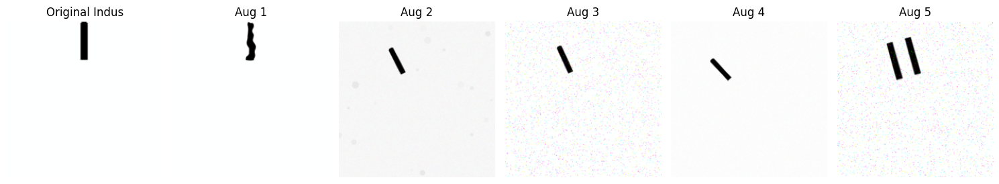


Visualizing Proto-Cuneiform augmentations:


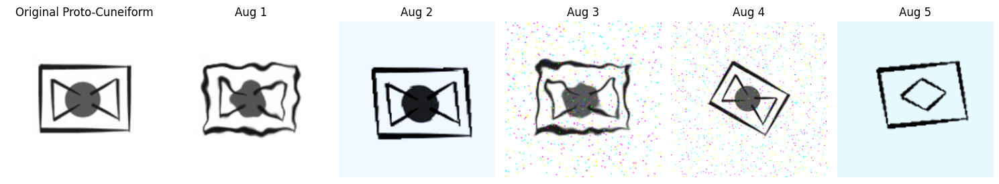


Visualizing Proto-Elamite augmentations:


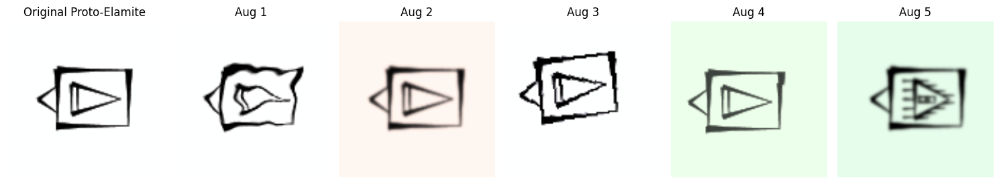

In [ ]:
class AugmentationPipeline:

    def __init__(self):

        self.rotation_range = (-45, 45)
        self.brightness_range = (0.7, 1.5)
        self.contrast_range = (0.7, 1.5)
        self.sharpness_range = (0.7, 1.6)
        self.noise_range = (0.01, 0.05)
        self.blur_range = (0.5, 1.2)
        self.scale_range = (0.85, 1.15)

    def rotate(self, image):
        """Apply rotation with white background - more extreme rotation"""
        angle = random.uniform(*self.rotation_range)

        rgba = image.convert('RGBA')

        rotated = rgba.rotate(angle, resample=Image.BICUBIC, expand=True)

        white_bg = Image.new('RGBA', rotated.size, (255, 255, 255, 255))

        result = Image.alpha_composite(white_bg, rotated)

        return result.convert('RGB')

    def adjust_brightness(self, image):
        """Adjust brightness with more extreme range"""
        factor = random.uniform(*self.brightness_range)
        enhancer = ImageEnhance.Brightness(image)
        return enhancer.enhance(factor)

    def adjust_contrast(self, image):
        """Adjust contrast with more extreme range"""
        factor = random.uniform(*self.contrast_range)
        enhancer = ImageEnhance.Contrast(image)
        return enhancer.enhance(factor)

    def adjust_sharpness(self, image):
        """Adjust sharpness with more extreme range"""
        factor = random.uniform(*self.sharpness_range)
        enhancer = ImageEnhance.Sharpness(image)
        return enhancer.enhance(factor)

    def add_noise(self, image):
        """Add more noticeable noise"""
        noise_factor = random.uniform(*self.noise_range)
        img_array = np.array(image).astype(np.float32)
        noise = np.random.normal(0, noise_factor * 255, img_array.shape)
        noisy_img = np.clip(img_array + noise, 0, 255).astype(np.uint8)
        return Image.fromarray(noisy_img)

    def add_speckle_noise(self, image):
        """Add speckle noise that simulates degradation"""
        img_array = np.array(image)
        row, col, ch = img_array.shape

        speckle = np.random.rand(row, col, ch)
        speckle = (speckle > 0.99) * 255

        black_speckle = np.random.rand(row, col, ch)
        black_speckle = (black_speckle > 0.99) * -255

        noisy = img_array + speckle + black_speckle
        return Image.fromarray(np.clip(noisy, 0, 255).astype(np.uint8))

    def blur(self, image):
        """Apply blur with varying intensity"""
        radius = random.uniform(*self.blur_range)
        return image.filter(ImageFilter.GaussianBlur(radius=radius))

    def color_jitter(self, image):
        """Add slight color variation while preserving structure"""

        r, g, b = image.split()

        channels = []
        for ch in [r, g, b]:
            enhancer = ImageEnhance.Brightness(ch)

            factor = random.uniform(0.9, 1.1)
            channels.append(enhancer.enhance(factor))

        return Image.merge("RGB", channels)

    def add_background_texture(self, image):
        """Add subtle texture to the background"""

        texture_size = image.size
        texture = np.zeros(texture_size + (3,), dtype=np.uint8)

        for ch in range(3):
            texture[:, :, ch] = np.random.randint(240, 255, texture_size)

        for _ in range(20):
            x, y = np.random.randint(0, texture_size[0]), np.random.randint(0, texture_size[1])
            radius = np.random.randint(3, 10)
            color = np.random.randint(230, 250)
            cv2.circle(texture, (x, y), radius, (color, color, color), -1)

        img_array = np.array(image)

        mask = np.all(img_array > 240, axis=2)

        for ch in range(3):
            img_array[:, :, ch][mask] = texture[:, :, ch][mask]

        return Image.fromarray(img_array)

    def slight_affine(self, image):
        """Apply a slight affine transformation with fixed TF.affine call"""

        angle = random.uniform(-10, 10)
        scale = random.uniform(*self.scale_range)

        width, height = image.size

        translate_x = int(random.uniform(-0.1, 0.1) * width)
        translate_y = int(random.uniform(-0.1, 0.1) * height)

        return TF.affine(
            image,
            angle=angle,
            translate=[translate_x, translate_y],
            scale=scale,
            shear=random.uniform(-5, 5),
            fill=255
        )

    def elastic_transform(self, image, alpha=40, sigma=4):
        """Apply elastic deformation to simulate material warping"""
        img_array = np.array(image)
        shape = img_array.shape[:2]

        dx = np.random.rand(*shape) * 2 - 1
        dy = np.random.rand(*shape) * 2 - 1

        dx = cv2.GaussianBlur(dx, (0, 0), sigma) * alpha
        dy = cv2.GaussianBlur(dy, (0, 0), sigma) * alpha

        x, y = np.meshgrid(np.arange(shape[1]), np.arange(shape[0]))

        indices_x = np.clip(x + dx, 0, shape[1]-1).astype(np.float32)
        indices_y = np.clip(y + dy, 0, shape[0]-1).astype(np.float32)

        distorted = cv2.remap(img_array, indices_x, indices_y,
                             interpolation=cv2.INTER_LINEAR,
                             borderMode=cv2.BORDER_CONSTANT,
                             borderValue=(255, 255, 255))

        return Image.fromarray(distorted)

    def generate_augmentations(self, image, num_variations=4):
        """Generate multiple augmentations for a single image"""
        augmented_images = []

        augmentation_types = [

            lambda img: self.add_noise(self.adjust_brightness(self.rotate(img))),

            lambda img: self.color_jitter(self.adjust_contrast(self.slight_affine(img))),

            lambda img: self.adjust_sharpness(self.add_speckle_noise(self.rotate(img))),

            lambda img: self.adjust_contrast(self.elastic_transform(img)),

            lambda img: self.add_background_texture(self.rotate(img)),

            lambda img: self.add_noise(self.adjust_contrast(
                       self.adjust_brightness(self.rotate(img)))),

            lambda img: self.color_jitter(self.adjust_contrast(self.blur(img))),

            lambda img: self.add_speckle_noise(self.elastic_transform(img))
        ]

        selected_augmentations = random.sample(augmentation_types, min(num_variations, len(augmentation_types)))

        for augment_func in selected_augmentations:
            try:
                aug_img = augment_func(image)
                augmented_images.append(aug_img)
            except Exception as e:
                print(f"Augmentation error: {e}")

                augmented_images.append(image)

            if len(augmented_images) >= num_variations:
                break

        while len(augmented_images) < num_variations:
            try:

                aug_img = self.rotate(image)
                augmented_images.append(aug_img)
            except Exception as e:
                print(f"Fallback augmentation error: {e}")
                augmented_images.append(image)

        return augmented_images

class AugmentedScriptDataset(Dataset):
    """Dataset class that generates augmentations on-the-fly"""

    def __init__(self, image_paths, transform=None, script_type=None,
                 denoise_types=None, augmentations_per_image=4):
        self.original_paths = image_paths
        self.transform = transform
        self.script_type = script_type
        self.denoise_types = denoise_types or []
        self.augmentations_per_image = augmentations_per_image
        self.augmenter = AugmentationPipeline()

        self.total_len = len(self.original_paths) * (1 + augmentations_per_image)

        print(f"Created dataset for {script_type}: {len(self.original_paths)} original images + "
              f"{len(self.original_paths) * augmentations_per_image} augmentations")

    def __len__(self):
        return self.total_len

    def __getitem__(self, idx):

        original_count = len(self.original_paths)

        if idx < original_count:

            image_path = self.original_paths[idx]
            try:
                image = Image.open(image_path).convert('RGB')

                if self.script_type in self.denoise_types:
                    image = denoise_image(image, image_path)

                image = pad_to_square(image, 'white')

                if self.transform:
                    image = self.transform(image)

                if self.script_type is not None:
                    return image, self.script_type
                return image

            except Exception as e:
                print(f"Error loading {image_path}: {e}")
                placeholder = torch.zeros((3, 224, 224))
                if self.script_type is not None:
                    return placeholder, self.script_type
                return placeholder
        else:

            original_idx = (idx - original_count) // self.augmentations_per_image
            aug_variation = (idx - original_count) % self.augmentations_per_image

            if original_idx < len(self.original_paths):
                original_path = self.original_paths[original_idx]
            else:

                original_path = self.original_paths[0]

            try:

                original = Image.open(original_path).convert('RGB')

                if self.script_type in self.denoise_types:
                    original = denoise_image(original, original_path)

                original = pad_to_square(original, 'white')

                augmented_images = self.augmenter.generate_augmentations(
                    original, self.augmentations_per_image)

                if aug_variation < len(augmented_images):
                    aug_image = augmented_images[aug_variation]
                else:

                    aug_image = original

                if self.transform:
                    aug_image = self.transform(aug_image)

                if self.script_type is not None:
                    return aug_image, self.script_type
                return aug_image

            except Exception as e:
                print(f"Error processing augmentation for {original_path}: {e}")
                placeholder = torch.zeros((3, 224, 224))
                if self.script_type is not None:
                    return placeholder, self.script_type
                return placeholder

print("Creating in-memory augmented datasets...")

indus_paths = load_image_paths(INDUS_PATH)
cuneiform_paths = load_image_paths(PROTO_CUNEIFORM_PATH)
elamite_paths = load_image_paths(PROTO_ELAMITE_PATH)
dongba_paths = load_image_paths(NAXI_DONGBA_PATH)
old_naxi_paths = load_image_paths(OLD_NAXI_PATH)
subfolder_paths = load_image_paths(TYC_PATH)

train_transform = get_train_transforms(img_size=224)
test_transform = get_test_transforms(img_size=224)

denoise_types = ["Old Naxi", "TYC-old_naxi"]

indus_dataset = AugmentedScriptDataset(
    indus_paths, train_transform, "Indus", denoise_types, augmentations_per_image=4
)

cuneiform_dataset = AugmentedScriptDataset(
    cuneiform_paths, train_transform, "Proto-Cuneiform", denoise_types, augmentations_per_image=4
)

elamite_dataset = AugmentedScriptDataset(
    elamite_paths, train_transform, "Proto-Elamite", denoise_types, augmentations_per_image=4
)

dongba_dataset = ScriptDataset(dongba_paths, train_transform, "Naxi Dongba", denoise_types)
old_naxi_dataset = ScriptDataset(old_naxi_paths, train_transform, "Old Naxi", denoise_types)
tyc_dataset = ScriptDataset(subfolder_paths, train_transform, "TYC", denoise_types)

all_datasets = [
    indus_dataset,
    cuneiform_dataset,
    elamite_dataset,
    dongba_dataset,
    old_naxi_dataset,
    tyc_dataset
]

all_datasets = [ds for ds in all_datasets if len(ds) > 0]

combined_dataset = ConcatDataset(all_datasets)

batch_size = 32
augmented_train_loader = DataLoader(
    combined_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

print(f"\nAugmented dataset statistics:")
print(f"- Total images: {len(combined_dataset)}")
print(f"- Batch size: {batch_size}")
print(f"- Batches per epoch: {len(augmented_train_loader)}")

def visualize_augmentations(dataset_idx=0, num_augmentations=5):
    """
    Visualize original image and its augmentations

    Args:
        dataset_idx: Index of the dataset in all_datasets list
        num_augmentations: Number of augmentations to show
    """
    if len(all_datasets) <= dataset_idx:
        print("Dataset index out of range")
        return

    dataset = all_datasets[dataset_idx]
    if not hasattr(dataset, 'augmenter'):
        print("Selected dataset does not support augmentation")
        return

    original_idx = 0
    original_img, label = dataset[original_idx]

    augmented_images = []
    aug_start_idx = len(dataset.original_paths)
    for i in range(num_augmentations):
        aug_idx = aug_start_idx + (original_idx * dataset.augmentations_per_image) + i
        if aug_idx < len(dataset):
            aug_img, _ = dataset[aug_idx]
            augmented_images.append(aug_img)

    plt.figure(figsize=(15, 5))

    plt.subplot(1, num_augmentations+1, 1)

    if isinstance(original_img, torch.Tensor):
        img = original_img.permute(1, 2, 0).numpy()

        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img = np.clip(img, 0, 1)
        plt.imshow(img)
    else:
        plt.imshow(np.array(original_img))

    plt.title(f"Original {label}")
    plt.axis('off')

    for i, aug_img in enumerate(augmented_images):
        plt.subplot(1, num_augmentations+1, i+2)

        if isinstance(aug_img, torch.Tensor):
            img = aug_img.permute(1, 2, 0).numpy()

            img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
            img = np.clip(img, 0, 1)
            plt.imshow(img)
        else:
            plt.imshow(np.array(aug_img))

        plt.title(f"Aug {i+1}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

print("\nVisualizing Indus script augmentations:")
visualize_augmentations(dataset_idx=0, num_augmentations=5)

print("\nVisualizing Proto-Cuneiform augmentations:")
visualize_augmentations(dataset_idx=1, num_augmentations=5)

print("\nVisualizing Proto-Elamite augmentations:")
visualize_augmentations(dataset_idx=2, num_augmentations=5)

# **4. Hybrid Training for Script Feature Extraction**

## 4.1 Self-Supervised CNN-Swin Transformer with Contrastive Learning

**S**cript **C**lassification and **R**ecognition with **I**ntegrated **B**idirectional **E**mbeddings (SCRIBE)

Hybrid CNN-Transformer feature extractor with contrastive learning  
- Combines ResNet and Swin Transformer for script feature extraction.  
- Uses NT-Xent loss with variance regularization to prevent collapse.  
- Implements contrastive training with a projection head and cosine scheduler.  
- Saves the best model and plots training history.  

In [ ]:
def set_seed(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

MODEL_DIR = '/content/drive/MyDrive/script_analysis/models'
os.makedirs(MODEL_DIR, exist_ok=True)
RESULTS_DIR = '/content/drive/MyDrive/script_analysis/results'
os.makedirs(RESULTS_DIR, exist_ok=True)

dataset_paths = {
    'Indus': INDUS_PATH,
    'Proto-Cuneiform': PROTO_CUNEIFORM_PATH,
    'Proto-Elamite': PROTO_ELAMITE_PATH,
    'Naxi-Dongba': NAXI_DONGBA_PATH,
    'Old-Naxi': OLD_NAXI_PATH
}

class SCRIBE(nn.Module):
    """
    Hybrid model combining CNN and Transformer for better feature extraction
    and prevention of representation collapse
    """
    def __init__(self,
                 cnn_model='resnet18',
                 transformer_model='swin_base_patch4_window7_224',
                 fusion_dim=512,
                 pretrained=True):
        super(SCRIBE, self).__init__()

        self.cnn = timm.create_model(
            cnn_model,
            pretrained=pretrained,
            num_classes=0,
            global_pool='avg'
        )
        self.cnn_feature_dim = self.cnn.num_features

        self.transformer = timm.create_model(
            transformer_model,
            pretrained=pretrained,
            num_classes=0,
            global_pool='avg'
        )
        self.transformer_feature_dim = self.transformer.num_features

        self.embedding_dim = self.cnn_feature_dim + self.transformer_feature_dim

        self.model_name = f"{cnn_model}+{transformer_model}"

    def forward(self, x):
        cnn_features = self.cnn(x)

        transformer_features = self.transformer(x)

        combined = torch.cat([cnn_features, transformer_features], dim=1)

        return combined

    def extract_features(self, x):
        with torch.no_grad():
            return self.forward(x)

def nt_xent_loss(z_i, z_j, temperature=0.1, lambda_reg=2.0):
    batch_size = z_i.size(0)
    z_i = F.normalize(z_i, dim=1)
    z_j = F.normalize(z_j, dim=1)
    representations = torch.cat([z_i, z_j], dim=0)

    similarity_matrix = F.cosine_similarity(representations.unsqueeze(1), representations.unsqueeze(0), dim=2)
    mask = torch.zeros_like(similarity_matrix)
    mask[range(batch_size), range(batch_size, 2*batch_size)] = 1.
    mask[range(batch_size, 2*batch_size), range(batch_size)] = 1.

    similarity_matrix = similarity_matrix / temperature

    sim_row_max, _ = torch.max(similarity_matrix, dim=1, keepdim=True)
    similarity_matrix = similarity_matrix - sim_row_max.detach()

    exp_sim = torch.exp(similarity_matrix)
    mask_no_diag = torch.ones_like(similarity_matrix) - torch.eye(2*batch_size, device=similarity_matrix.device)
    exp_sim_sum = torch.sum(exp_sim * mask_no_diag, dim=1, keepdim=True)

    log_prob = similarity_matrix - torch.log(exp_sim_sum + 1e-8)
    mean_log_prob = torch.sum(mask * log_prob) / (2 * batch_size)

    z_mean = torch.mean(representations, dim=0)
    z_diff = representations - z_mean
    feature_variance = torch.mean(torch.norm(z_diff, dim=1)**2)
    variance_term = lambda_reg / (feature_variance + 1e-4)

    pdist = torch.pdist(representations)
    uniformity_term = torch.log(torch.mean(torch.exp(-2 * pdist)))

    if random.random() < 0.01:
        print(f"Contrastive: {-mean_log_prob:.4f}, Variance: {feature_variance:.4f}, Penalty: {variance_term:.4f}")

    total_loss = -mean_log_prob + variance_term + 0.1 * uniformity_term

    return total_loss

def prepare_val_test_loaders(script_name, script_paths, val_split=0.2, test_split=0.1):
    """Create validation and test loaders for a script type"""

    test_transform = get_test_transforms(img_size=224)

    total_size = len(script_paths)
    test_size = int(test_split * total_size)
    val_size = int(val_split * total_size)
    train_size = total_size - val_size - test_size

    val_paths = script_paths[train_size:train_size+val_size]
    test_paths = script_paths[train_size+val_size:]

    denoise_types = ["Old Naxi", "TYC-old_naxi"]
    val_dataset = ScriptDataset(val_paths, test_transform, script_name, denoise_types)
    test_dataset = ScriptDataset(test_paths, test_transform, script_name, denoise_types)

    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2, pin_memory=True)

    return val_loader, test_loader

def train_hybrid_feature_extractor(
    script_name,
    train_loader,
    val_loader,
    device,
    lr=3e-5,
    epochs=20,
    weight_decay=1e-3,
    patience=5,
    output_dir=MODEL_DIR
):
    """
    Train a hybrid feature extraction model for a specific script using contrastive learning
    """
    warnings.filterwarnings("ignore", category=UserWarning, module="torch.optim.lr_scheduler")

    model = SCRIBE(
        cnn_model='resnet18',
        transformer_model='swin_base_patch4_window7_224',
        pretrained=True
    ).to(device)

    # feature dimension (combined CNN + Transformer)
    feature_dim = model.embedding_dim
    print(f"Combined feature dimension: {feature_dim}")

    projection_head = nn.Sequential(
        nn.Linear(feature_dim, 1024),
        nn.BatchNorm1d(1024, momentum=0.01),
        nn.Dropout(0.1),
        nn.ReLU(),
        nn.Linear(1024, 256),
        nn.BatchNorm1d(256, momentum=0.01)
    ).to(device)

    optimizer = optim.AdamW(
        list(model.parameters()) + list(projection_head.parameters()),
        lr=lr,
        weight_decay=weight_decay,
        betas=(0.9, 0.98)
    )

    def warmup_cosine_schedule(step, total_steps, warmup=0.1):
        if step < warmup * total_steps:
            return float(step) / float(max(1.0, warmup * total_steps))
        progress = float(step - warmup * total_steps) / float(max(1.0, total_steps - warmup * total_steps))
        return 0.5 * (1.0 + math.cos(math.pi * progress))

    total_steps = epochs * len(train_loader)
    scheduler = torch.optim.lr_scheduler.LambdaLR(
        optimizer,
        lr_lambda=lambda step: warmup_cosine_schedule(step, total_steps)
    )

    scaler = torch.amp.GradScaler()

    best_val_loss = float('inf')
    best_epoch = 0
    epochs_no_improve = 0
    global_step = 0

    history = {
        'train_loss': [],
        'val_loss': [],
        'learning_rates': []
    }

    for epoch in range(epochs):
        model.train()
        projection_head.train()
        train_loss = 0

        for batch_idx, (inputs, _) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train]")):
            inputs = inputs.to(device)

            if inputs.size(0) > 1:
                idx = torch.randperm(inputs.size(0))
                x_i, x_j = inputs, inputs[idx]

                optimizer.zero_grad()
                with torch.amp.autocast(device_type=device.type):

                    h_i = model(x_i)
                    h_j = model(x_j)


                    z_i = projection_head(h_i)
                    z_j = projection_head(h_j)


                    loss = nt_xent_loss(z_i, z_j)

                scaler.scale(loss).backward()

                scaler.unscale_(optimizer)
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                torch.nn.utils.clip_grad_norm_(projection_head.parameters(), 1.0)

                scaler.step(optimizer)
                scaler.update()
                scheduler.step()

                train_loss += loss.item()
                history['learning_rates'].append(scheduler.get_last_lr()[0])

                global_step += 1

                if (batch_idx + 1) % 10 == 0 or (batch_idx + 1) == len(train_loader):
                    print(f"Train Batch: {batch_idx+1}/{len(train_loader)} | Loss: {loss.item():.4f} | LR: {scheduler.get_last_lr()[0]:.6f}")

        train_loss = train_loss / len(train_loader) if len(train_loader) > 0 else float('inf')

        model.eval()
        projection_head.eval()
        val_loss = 0

        with torch.no_grad():
            for batch_idx, (inputs, _) in enumerate(tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} [Val]")):
                inputs = inputs.to(device)

                if inputs.size(0) > 1:
                    idx = torch.randperm(inputs.size(0))
                    x_i, x_j = inputs, inputs[idx]

                    h_i = model(x_i)
                    h_j = model(x_j)

                    z_i = projection_head(h_i)
                    z_j = projection_head(h_j)

                    loss = nt_xent_loss(z_i, z_j)

                    val_loss += loss.item()

        val_loss = val_loss / len(val_loader) if len(val_loader) > 0 else float('inf')

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)

        print(f"\nEpoch {epoch+1}/{epochs}")
        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Loss: {val_loss:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_epoch = epoch
            epochs_no_improve = 0

            model_path = os.path.join(output_dir, f"{script_name}_hybrid_extractor_best.pth")
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'projection_head_state_dict': projection_head.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_loss': val_loss,
            }, model_path)
            print(f"Best model saved to {model_path}")
        else:
            epochs_no_improve += 1
            print(f"No improvement for {epochs_no_improve} epochs")

        if epochs_no_improve >= patience:
            print(f"Early stopping triggered after epoch {epoch+1}")
            break

    # save final model
    final_model_path = os.path.join(output_dir, f"{script_name}_hybrid_extractor_final.pth")
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'projection_head_state_dict': projection_head.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'val_loss': val_loss,
    }, final_model_path)
    print(f"Final model saved to {final_model_path}")

    # plot training history
    plt.figure(figsize=(15, 5))

    # plot loss
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Val Loss')
    plt.title(f'{script_name} Hybrid Feature Extractor Training')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # plot learning rate
    plt.subplot(1, 2, 2)
    plt.plot(history['learning_rates'])
    plt.title('Learning Rate Schedule')
    plt.xlabel('Training Step')
    plt.ylabel('Learning Rate')
    plt.grid(True)

    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f"{script_name}_hybrid_extractor_history.png"))
    plt.show()

    print(f"Training completed. Best validation loss: {best_val_loss:.4f} at epoch {best_epoch+1}")

    return model, projection_head

## 4.2 Preliminary Indus Model



Implementation of specialized Indus script feature extraction using contrastive learning framework.

- **Architecture**: Swin Transformer base with 1024D feature representation
- **Training Strategy**: Self-supervised learning on augmented Indus corpus
- **Hyperparameters**:
  - Learning rate: 2e-4 with cosine decay
  - Training budget: 15 epochs with patience=4 early stopping
  - Batch processing: Mixed precision for memory efficiency
- **Validation**: Script-specific validation split for performance monitoring
- **Persistence**: Complete model architecture with projection head saved to external storage

Training simplified hybrid feature extractor for Indus (quick version)
Using device: cuda
Created dataset for Indus: 391 original images + 782 augmentations
Created Indus-specific dataloader with 1173 samples
Created validation loader for Indus
Combined feature dimension: 1536


Epoch 1/5 [Train]:   0%|          | 0/37 [00:00<?, ?it/s]

Train Batch: 10/37 | Loss: 9.9306 | LR: 0.000027
Contrastive: 5.9266, Variance: 0.9992, Penalty: 2.0014
Train Batch: 20/37 | Loss: 7.9280 | LR: 0.000050
Train Batch: 30/37 | Loss: 7.3437 | LR: 0.000049
Train Batch: 37/37 | Loss: 6.8490 | LR: 0.000048


Epoch 1/5 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 1/5
Train Loss: 8.3531
Val Loss: 9.8745
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_hybrid_extractor_best.pth


Epoch 2/5 [Train]:   0%|          | 0/37 [00:00<?, ?it/s]

Train Batch: 10/37 | Loss: 6.8298 | LR: 0.000046
Train Batch: 20/37 | Loss: 6.3015 | LR: 0.000044
Train Batch: 30/37 | Loss: 7.0411 | LR: 0.000040
Train Batch: 37/37 | Loss: 6.1900 | LR: 0.000038


Epoch 2/5 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 2/5
Train Loss: 6.8942
Val Loss: 9.8512
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_hybrid_extractor_best.pth


Epoch 3/5 [Train]:   0%|          | 0/37 [00:00<?, ?it/s]

Train Batch: 10/37 | Loss: 6.8330 | LR: 0.000033
Train Batch: 20/37 | Loss: 6.6117 | LR: 0.000029
Train Batch: 30/37 | Loss: 6.7183 | LR: 0.000024
Train Batch: 37/37 | Loss: 6.2224 | LR: 0.000021


Epoch 3/5 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 3/5
Train Loss: 6.7000
Val Loss: 9.7149
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_hybrid_extractor_best.pth


Epoch 4/5 [Train]:   0%|          | 0/37 [00:00<?, ?it/s]

Contrastive: 5.0472, Variance: 0.9990, Penalty: 2.0018
Train Batch: 10/37 | Loss: 7.0082 | LR: 0.000016
Train Batch: 20/37 | Loss: 6.6531 | LR: 0.000012
Train Batch: 30/37 | Loss: 6.8587 | LR: 0.000008
Train Batch: 37/37 | Loss: 5.9999 | LR: 0.000006


Epoch 4/5 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 4/5
Train Loss: 6.6996
Val Loss: 9.5550
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_hybrid_extractor_best.pth


Epoch 5/5 [Train]:   0%|          | 0/37 [00:00<?, ?it/s]

Train Batch: 10/37 | Loss: 6.5358 | LR: 0.000003
Train Batch: 20/37 | Loss: 6.6803 | LR: 0.000001
Train Batch: 30/37 | Loss: 6.3060 | LR: 0.000000
Train Batch: 37/37 | Loss: 5.8953 | LR: 0.000000


Epoch 5/5 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 5/5
Train Loss: 6.5858
Val Loss: 10.2405
No improvement for 1 epochs
Final model saved to /content/drive/MyDrive/script_analysis/models/Indus_hybrid_extractor_final.pth


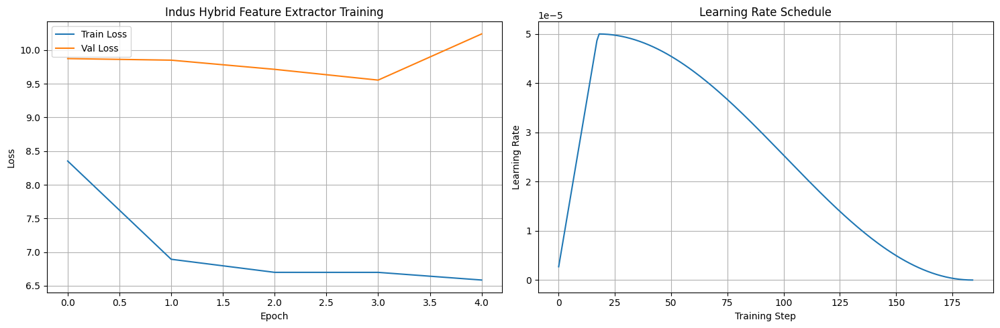

Training completed. Best validation loss: 9.5550 at epoch 4
Quick Indus model training complete!


In [ ]:
print("Training simplified hybrid feature extractor for Indus (quick version)")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

set_seed(42)

indus_paths = load_image_paths(INDUS_PATH)
train_transform = get_train_transforms(img_size=224)
denoise_types = ["Old Naxi", "TYC-old_naxi"]

indus_dataset = AugmentedScriptDataset(
    indus_paths, train_transform, "Indus", denoise_types, augmentations_per_image=2
)

batch_size = 32
indus_train_loader = DataLoader(
    indus_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

print(f"Created Indus-specific dataloader with {len(indus_dataset)} samples")

val_loader, _ = prepare_val_test_loaders("Indus", indus_paths)
print(f"Created validation loader for Indus")

indus_model, indus_proj_head = train_hybrid_feature_extractor(
    script_name='Indus',
    train_loader=indus_train_loader,
    val_loader=val_loader,
    device=device,
    lr=5e-5,
    epochs=5,
    patience=2,
    output_dir=MODEL_DIR
)

torch.save({
    'model_state_dict': indus_model.state_dict(),
    'projection_head_state_dict': indus_proj_head.state_dict()
}, os.path.join(MODEL_DIR, 'Indus_quick_model.pth'))

print("Quick Indus model training complete!")

Extracting embeddings for preliminary analysis...
Created dataset for Indus with 391 samples
Created dataset for Proto-Cuneiform with 2089 samples
Created dataset for Proto-Elamite with 1510 samples
Created dataset for Naxi-Dongba with 2122 samples
Created dataset for Old-Naxi with 253 samples
Created dataset for TYC with 8766 samples
Extracting embeddings for Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

  Extracted 391 embeddings
Extracting embeddings for Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

  Extracted 2089 embeddings
Extracting embeddings for Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

  Extracted 1510 embeddings
Extracting embeddings for Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

  Extracted 2122 embeddings
Extracting embeddings for Old-Naxi...


  0%|          | 0/8 [00:00<?, ?it/s]

  Extracted 253 embeddings
Extracting embeddings for TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

  Extracted 8766 embeddings

Preliminary similarity analysis:
Similarity between Indus and Indus: 1.0000
Similarity between Indus and Proto-Cuneiform: 0.8692
Similarity between Indus and Proto-Elamite: 0.8704
Similarity between Indus and Naxi-Dongba: 0.8238
Similarity between Indus and Old-Naxi: 0.8175
Similarity between Indus and TYC: 0.8931
Running t-SNE with perplexity 30 on 300 samples...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


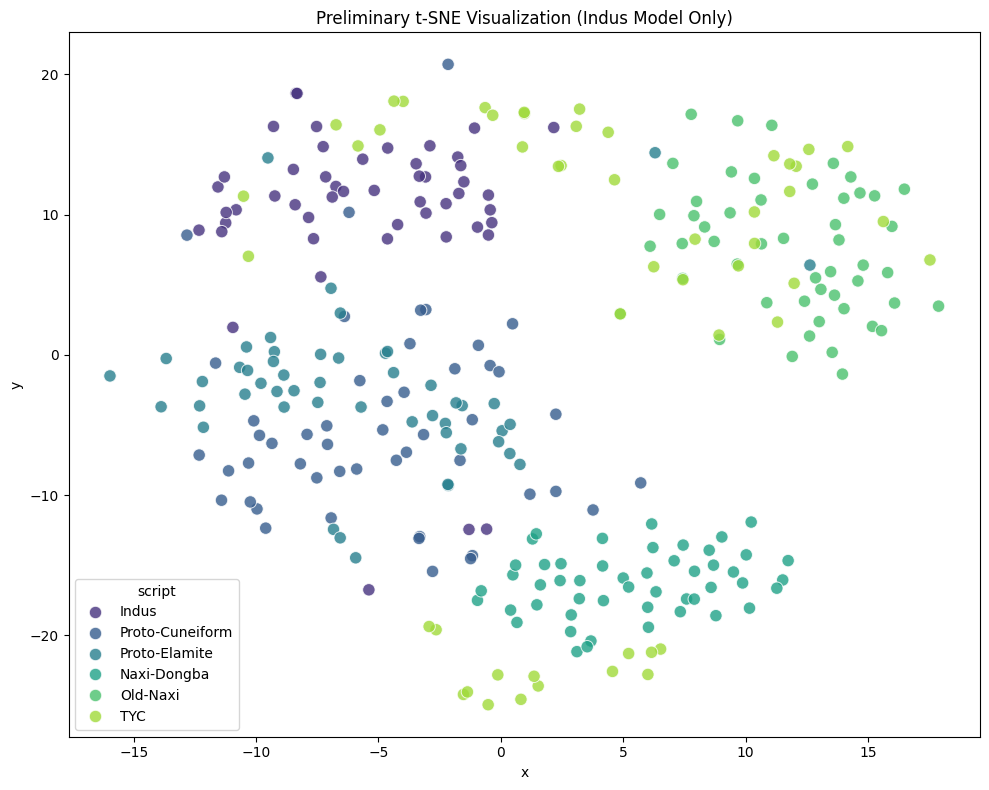


Preliminary analysis complete! You now have a working system to build upon.


In [ ]:
print("Extracting embeddings for preliminary analysis...")

test_transform = get_test_transforms(img_size=224)

script_datasets = {}
for name, path in {
    'Indus': INDUS_PATH,
    'Proto-Cuneiform': PROTO_CUNEIFORM_PATH,
    'Proto-Elamite': PROTO_ELAMITE_PATH,
    'Naxi-Dongba': NAXI_DONGBA_PATH,
    'Old-Naxi': OLD_NAXI_PATH,
    'TYC': TYC_PATH
}.items():
    paths = load_image_paths(path)
    if paths and len(paths) > 0:
        dataset = ScriptDataset(paths, test_transform, name, denoise_types=["Old Naxi", "TYC-old-naxi"])
        script_datasets[name] = dataset
        print(f"Created dataset for {name} with {len(dataset)} samples")

script_loaders = {name: DataLoader(dataset, batch_size=32, shuffle=False, num_workers=2)
                 for name, dataset in script_datasets.items()}

indus_model.eval()
all_embeddings = {}

with torch.no_grad():
    for script_name, loader in script_loaders.items():
        print(f"Extracting embeddings for {script_name}...")
        script_embeddings = []
        for inputs, _ in tqdm(loader):
            inputs = inputs.to(device)
            features = indus_model.extract_features(inputs)
            script_embeddings.append(features.cpu().numpy())
        if script_embeddings:
            all_embeddings[script_name] = np.vstack(script_embeddings)
            print(f"  Extracted {len(all_embeddings[script_name])} embeddings")

print("\nPreliminary similarity analysis:")
source_centroid = np.mean(all_embeddings['Indus'], axis=0)

similarities = {}
for script_name, embeddings in all_embeddings.items():
    if len(embeddings) > 0:
        target_centroid = np.mean(embeddings, axis=0)
        similarity = np.dot(source_centroid, target_centroid) / (
            np.linalg.norm(source_centroid) * np.linalg.norm(target_centroid))
        similarities[script_name] = similarity
        print(f"Similarity between Indus and {script_name}: {similarity:.4f}")

combined_embeddings = []
labels = []

for script, script_embeddings in all_embeddings.items():
    if len(script_embeddings) > 0:
        sample_size = min(50, len(script_embeddings))
        indices = np.random.choice(len(script_embeddings), sample_size, replace=False)
        for idx in indices:
            combined_embeddings.append(script_embeddings[idx])
            labels.append(script)

combined_embeddings = np.array(combined_embeddings)

if len(combined_embeddings) > 3:
    perplexity_value = min(30, len(combined_embeddings) - 1)
    print(f"Running t-SNE with perplexity {perplexity_value} on {len(combined_embeddings)} samples...")
    tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity_value, n_iter=1000)
    embeddings_2d = tsne.fit_transform(combined_embeddings)
    df = pd.DataFrame({
        'x': embeddings_2d[:, 0],
        'y': embeddings_2d[:, 1],
        'script': labels
    })
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x='x', y='y', hue='script', data=df, palette='viridis', s=80, alpha=0.8)
    plt.title('Preliminary t-SNE Visualization (Indus Model Only)')
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_DIR, "preliminary_tsne.png"))
    plt.show()
else:
    print("Not enough samples for t-SNE visualization. Skipping visualization step.")

print("\nPreliminary analysis complete! You now have a working system to build upon.")

#4.3 Ensemble Training Functions

### Trains an ensemble of Hybrid CNN-Transformer models  



- Trains multiple models with different random seeds for robustness.  
- Uses augmented datasets with contrastive learning.  
- Saves the best model per run and logs validation losses.  
- Generates a summary of ensemble performance.  

In [ ]:
def train_ensemble(
    script_name,
    num_models=5,
    epochs=20,
    lr=3e-5,
    weight_decay=1e-3,
    augmentations_per_image=3,
    base_seed=42
):
    """
    Train an ensemble of models for a specific script

    Parameters:
    -----------
    script_name : str - Name of the script (e.g., 'Indus')
    num_models : int - Number of models in the ensemble
    epochs : int - Number of epochs to train each model
    lr : float - Learning rate
    weight_decay : float - Weight decay for regularization
    augmentations_per_image : int - Number of augmentations per image
    base_seed : int - Starting seed (will increment for each model)

    Returns:
    --------
    results_df : pd.DataFrame - Results summary for all models
    """
    ensemble_dir = os.path.join(MODEL_DIR, f"{script_name}_ensemble")
    os.makedirs(ensemble_dir, exist_ok=True)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Training ensemble of {num_models} {script_name} models on {device}")

    script_path_var = f"{script_name.upper().replace('-', '_')}_PATH"
    script_paths = load_image_paths(globals()[script_path_var])

    results = []

    for model_idx in range(num_models):
        current_seed = base_seed + model_idx
        set_seed(current_seed)

        print(f"\n{'='*60}")
        print(f"Training {script_name} Model {model_idx+1}/{num_models} with seed {current_seed}")
        print(f"{'='*60}")

        train_transform = get_train_transforms(img_size=224)
        denoise_types = ["Old Naxi", "TYC-old_naxi"]

        script_dataset = AugmentedScriptDataset(
            script_paths,
            train_transform,
            script_name,
            denoise_types,
            augmentations_per_image=augmentations_per_image
        )

        train_loader = DataLoader(
            script_dataset,
            batch_size=16,
            shuffle=True,
            num_workers=2,
            pin_memory=True
        )

        print(f"Created dataset with {len(script_dataset)} samples")

        val_loader, _ = prepare_val_test_loaders(script_name, script_paths)

        model, proj_head = train_hybrid_feature_extractor(
            script_name=f"{script_name}_ensemble_{model_idx+1}",
            train_loader=train_loader,
            val_loader=val_loader,
            device=device,
            lr=lr,
            epochs=epochs,
            weight_decay=weight_decay,
            patience=5,
            output_dir=ensemble_dir
        )

        best_model_path = os.path.join(ensemble_dir, f"{script_name}_ensemble_{model_idx+1}_hybrid_extractor_best.pth")
        checkpoint = torch.load(best_model_path)

        results.append({
            'model_idx': model_idx + 1,
            'seed': current_seed,
            'val_loss': checkpoint['val_loss'],
            'epoch': checkpoint['epoch'] + 1,
            'model_path': best_model_path
        })

    results_df = pd.DataFrame(results)

    summary_path = os.path.join(ensemble_dir, f"{script_name}_ensemble_summary.csv")
    results_df.to_csv(summary_path, index=False)

    print(f"\n{'='*60}")
    print(f"Ensemble Training Summary for {script_name}")
    print(f"{'='*60}")
    print(results_df)
    print(f"\nAverage validation loss: {results_df['val_loss'].mean():.4f}")
    print(f"Best validation loss: {results_df['val_loss'].min():.4f}")
    print(f"Summary saved to {summary_path}")

    return results_df

### Loads ensemble models and extracts embeddings  


In [ ]:
def load_ensemble_models(script_name, ensemble_dir=None, device=None):
    """
    Load all trained models for a script ensemble

    Parameters:
    -----------
    script_name : str - Name of the script
    ensemble_dir : str - Directory containing ensemble models (default: MODEL_DIR/script_name_ensemble)
    device : torch.device - Device to load models on

    Returns:
    --------
    models : list - List of loaded models
    proj_heads : list - List of projection heads
    summary : pd.DataFrame - Summary of loaded models
    """
    if ensemble_dir is None:
        ensemble_dir = os.path.join(MODEL_DIR, f"{script_name}_ensemble")

    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    summary_path = os.path.join(ensemble_dir, f"{script_name}_ensemble_summary.csv")
    if os.path.exists(summary_path):
        summary = pd.read_csv(summary_path)
    else:
        model_files = [f for f in os.listdir(ensemble_dir) if f.endswith('_best.pth')]
        summary = pd.DataFrame({
            'model_idx': range(1, len(model_files) + 1),
            'model_path': [os.path.join(ensemble_dir, f) for f in model_files]
        })

    models = []
    proj_heads = []

    for _, row in summary.iterrows():
        model = SCRIBE(
            cnn_model='resnet18',
            transformer_model='swin_base_patch4_window7_224',
            pretrained=True
        ).to(device)

        feature_dim = model.embedding_dim
        proj_head = nn.Sequential(
            nn.Linear(feature_dim, 1024),
            nn.BatchNorm1d(1024, momentum=0.01),
            nn.Dropout(0.1),
            nn.ReLU(),
            nn.Linear(1024, 256),
            nn.BatchNorm1d(256, momentum=0.01)
        ).to(device)

        checkpoint = torch.load(row['model_path'], map_location=device)
        model.load_state_dict(checkpoint['model_state_dict'])
        proj_head.load_state_dict(checkpoint['projection_head_state_dict'])

        model.eval()
        proj_head.eval()

        models.append(model)
        proj_heads.append(proj_head)

    print(f"Loaded {len(models)} {script_name} ensemble models")
    return models, proj_heads, summary

def extract_ensemble_embeddings(ensemble_models, script_loaders, device=None):
    """
    Extract embeddings from all scripts using ensemble models

    Parameters:
    -----------
    ensemble_models : list - List of trained models
    script_loaders : dict - Dictionary of script dataloaders
    device : torch.device - Device to run extraction on

    Returns:
    --------
    all_embeddings : dict - Dictionary with structure {model_idx: {script_name: embeddings}}
    """
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    all_embeddings = {}

    for model_idx, model in enumerate(ensemble_models):
        model.eval()
        model_embeddings = {}

        print(f"Extracting embeddings using model {model_idx+1}/{len(ensemble_models)}...")

        # extract embeddings for each script
        with torch.no_grad():
            for script_name, loader in script_loaders.items():
                print(f"  Processing {script_name}...")
                script_embeddings = []

                for inputs, _ in tqdm(loader):
                    inputs = inputs.to(device)
                    features = model.extract_features(inputs)
                    script_embeddings.append(features.cpu().numpy())

                if script_embeddings:
                    model_embeddings[script_name] = np.vstack(script_embeddings)
                    print(f"    Extracted {len(model_embeddings[script_name])} embeddings")

        all_embeddings[model_idx] = model_embeddings

    return all_embeddings

### Analyzes and visualizes script similarities from ensemble models  


In [ ]:
def analyze_ensemble_similarities(all_embeddings, source_script):
    """
    Calculate similarities from ensemble models and perform statistical analysis

    Parameters:
    -----------
    all_embeddings : dict - Embeddings from ensemble models
    source_script : str - Source script to compare others against

    Returns:
    --------
    similarity_df : pd.DataFrame - Similarity statistics
    """
    all_similarities = {}

    for model_idx, model_embeddings in all_embeddings.items():
        if source_script not in model_embeddings:
            continue

        source_centroid = np.mean(model_embeddings[source_script], axis=0)

        for script_name, embeddings in model_embeddings.items():
            if len(embeddings) == 0:
                continue

            target_centroid = np.mean(embeddings, axis=0)
            similarity = np.dot(source_centroid, target_centroid) / (
                np.linalg.norm(source_centroid) * np.linalg.norm(target_centroid))


            if script_name not in all_similarities:
                all_similarities[script_name] = []
            all_similarities[script_name].append(similarity)

    stats = []
    for script_name, similarities in all_similarities.items():
        stats.append({
            'Script': script_name,
            'Mean Similarity': np.mean(similarities),
            'Std Dev': np.std(similarities),
            'Min': np.min(similarities),
            'Max': np.max(similarities),
            '95% CI Lower': np.mean(similarities) - 1.96 * np.std(similarities) / np.sqrt(len(similarities)),
            '95% CI Upper': np.mean(similarities) + 1.96 * np.std(similarities) / np.sqrt(len(similarities))
        })

    similarity_df = pd.DataFrame(stats)
    similarity_df = similarity_df.sort_values('Mean Similarity', ascending=False)

    plt.figure(figsize=(10, 6))

    plt.errorbar(
        x=range(len(similarity_df)),
        y=similarity_df['Mean Similarity'],
        yerr=similarity_df['Std Dev'],
        fmt='o',
        capsize=5,
        elinewidth=2,
        markersize=8
    )

    plt.xticks(range(len(similarity_df)), similarity_df['Script'], rotation=45)

    plt.ylabel('Cosine Similarity')
    plt.title(f'Script Similarities to {source_script} (Ensemble Average ± Std Dev)')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()

    plt.savefig(os.path.join(RESULTS_DIR, f'{source_script}_ensemble_similarities.png'))
    plt.show()

    return similarity_df

def visualize_ensemble_tsne(all_embeddings, perplexity=30, sample_size=50):
    """
    Create t-SNE visualization combining results from all ensemble models

    Parameters:
    -----------
    all_embeddings : dict - Embeddings from ensemble models
    perplexity : int - Perplexity parameter for t-SNE
    sample_size : int - Maximum samples to use per script per model
    """
    combined_embeddings = []
    labels = []
    model_ids = []

    for model_idx, model_embeddings in all_embeddings.items():
        for script_name, embeddings in model_embeddings.items():
            if len(embeddings) > 0:
                this_sample_size = min(sample_size, len(embeddings))
                indices = np.random.choice(len(embeddings), this_sample_size, replace=False)

                for idx in indices:
                    combined_embeddings.append(embeddings[idx])
                    labels.append(script_name)
                    model_ids.append(f"Model {model_idx+1}")

    combined_embeddings = np.array(combined_embeddings)

    print(f"Running t-SNE with perplexity {perplexity} on {len(combined_embeddings)} samples...")
    tsne = TSNE(n_components=2, random_state=42, perplexity=perplexity, n_iter=2000)
    embeddings_2d = tsne.fit_transform(combined_embeddings)

    df = pd.DataFrame({
        'x': embeddings_2d[:, 0],
        'y': embeddings_2d[:, 1],
        'script': labels,
        'model': model_ids
    })

    plt.figure(figsize=(12, 10))
    sns.scatterplot(x='x', y='y', hue='script', data=df, palette='viridis', s=80, alpha=0.7)
    plt.title('t-SNE Visualization of Script Embeddings (All Ensemble Models)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_DIR, "ensemble_tsne_by_script.png"))
    plt.show()

    plt.figure(figsize=(12, 10))
    sns.scatterplot(x='x', y='y', hue='model', style='script', data=df, palette='Set2', s=80, alpha=0.7)
    plt.title('t-SNE Visualization of Script Embeddings (By Model)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_DIR, "ensemble_tsne_by_model.png"))
    plt.show()

### Full Ensemble Training and Analysis Pipeline  


In [ ]:
def run_ensemble_pipeline(script_names, num_models=5, epochs=20, save_embeddings=True):
    """
    Complete pipeline for training ensembles for multiple scripts,
    extracting embeddings, and comparing similarities

    Parameters:
    -----------
    script_names : list - List of scripts to train ensembles for
    num_models : int - Number of models per ensemble
    epochs : int - Number of training epochs per model
    save_embeddings : bool - Whether to save embeddings to disk

    Returns:
    --------
    results : dict - Dictionary containing full analysis results
    """
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    run_dir = os.path.join(RESULTS_DIR, f"ensemble_run_{timestamp}")
    os.makedirs(run_dir, exist_ok=True)

    results = {
        "summaries": {},
        "similarities": {},
        "cross_similarities": {}
    }

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    print(f"\n{'='*80}")
    print(f"Starting Ensemble Pipeline on {device}")
    print(f"Scripts: {', '.join(script_names)}")
    print(f"Models per ensemble: {num_models}")
    print(f"Training epochs: {epochs}")
    print(f"Results directory: {run_dir}")
    print(f"{'='*80}\n")

    for script_name in script_names:
        print(f"\n{'='*50}")
        print(f"Training ensemble for {script_name}")
        print(f"{'='*50}\n")

        summary_df = train_ensemble(
            script_name=script_name,
            num_models=num_models,
            epochs=epochs,
            lr=3e-5,
            weight_decay=1e-3,
            augmentations_per_image=3,
            base_seed=42
        )

        results["summaries"][script_name] = summary_df

    print("\nCreating test datasets for all scripts...")

    script_datasets = {}
    all_scripts = list(dataset_paths.keys()) + ['TYC']

    for name in all_scripts:
        try:
            if name == 'TYC':
                path_var = 'TYC_PATH'
            else:
                path_var = f"{name.upper().replace('-', '_')}_PATH"

            if path_var in globals():
                paths = load_image_paths(globals()[path_var])
                if paths and len(paths) > 0:
                    test_transform = get_test_transforms(img_size=224)
                    dataset = ScriptDataset(paths, test_transform, name, denoise_types=["Old Naxi", "TYC-old_naxi"])
                    script_datasets[name] = dataset
                    print(f"Created test dataset for {name} with {len(dataset)} samples")
        except Exception as e:
            print(f"Error creating dataset for {name}: {str(e)}")

    script_loaders = {
        name: DataLoader(dataset, batch_size=32, shuffle=False, num_workers=2)
        for name, dataset in script_datasets.items()
    }

    for source_script in script_names:
        print(f"\n{'='*50}")
        print(f"Analyzing {source_script} ensemble models")
        print(f"{'='*50}\n")

        ensemble_models, _, _ = load_ensemble_models(source_script, device=device)

        embeddings = extract_ensemble_embeddings(ensemble_models, script_loaders, device)

        if save_embeddings:
            embeddings_path = os.path.join(run_dir, f"{source_script}_embeddings.pkl")
            with open(embeddings_path, 'wb') as f:
                pickle.dump(embeddings, f)
            print(f"Saved {source_script} embeddings to {embeddings_path}")

        similarity_df = analyze_ensemble_similarities(embeddings, source_script)
        results["similarities"][source_script] = similarity_df

        similarity_path = os.path.join(run_dir, f"{source_script}_similarities.csv")
        similarity_df.to_csv(similarity_path, index=False)
        print(f"Saved similarity results to {similarity_path}")

        visualize_ensemble_tsne(embeddings)

    if len(script_names) > 1:
        print("\nPerforming cross-script similarity analysis...")

        cross_similarities = []

        for source_script in script_names:
            for target_script in script_names:
                if source_script != target_script:
                    source_df = results["similarities"][source_script]
                    target_row = source_df[source_df['Script'] == target_script]

                    if not target_row.empty:
                        cross_similarities.append({
                            'Source': source_script,
                            'Target': target_script,
                            'Mean Similarity': target_row['Mean Similarity'].values[0],
                            'Std Dev': target_row['Std Dev'].values[0],
                            '95% CI Lower': target_row['95% CI Lower'].values[0],
                            '95% CI Upper': target_row['95% CI Upper'].values[0]
                        })

        cross_df = pd.DataFrame(cross_similarities)
        results["cross_similarities"] = cross_df

        cross_path = os.path.join(run_dir, "cross_script_similarities.csv")
        cross_df.to_csv(cross_path, index=False)
        print(f"Saved cross-script similarity results to {cross_path}")

        if len(script_names) > 2:
            plt.figure(figsize=(10, 8))
            pivot_df = cross_df.pivot(index='Source', columns='Target', values='Mean Similarity')
            sns.heatmap(pivot_df, annot=True, cmap='YlGnBu', fmt='.4f', cbar_kws={'label': 'Similarity'})
            plt.title('Cross-Script Similarities (Source → Target)')
            plt.tight_layout()
            plt.savefig(os.path.join(run_dir, "cross_script_heatmap.png"))
            plt.show()

    summary_path = os.path.join(run_dir, "ensemble_pipeline_summary.json")
    with open(summary_path, 'w') as f:
        summary_json = {
            "timestamp": timestamp,
            "scripts": script_names,
            "num_models": num_models,
            "epochs": epochs,
            "script_counts": {name: len(dataset) for name, dataset in script_datasets.items()}
        }
        json.dump(summary_json, f, indent=4)

    print(f"\n{'='*80}")
    print(f"Ensemble pipeline completed successfully!")
    print(f"Full results saved to {run_dir}")
    print(f"{'='*80}")

    return results

### Full Analysis

In [ ]:
def run_full_research_analysis():
    """
    Run the full research analysis comparing Indus, Proto-Cuneiform, and Proto-Elamite
    to determine script relationships
    """
    print("\n" + "="*80)
    print("STARTING FULL RESEARCH ANALYSIS")
    print("This will train ensemble models for all three key scripts and perform comprehensive analysis")
    print("="*80 + "\n")

    start_time = datetime.now()
    print(f"Analysis started at: {start_time.strftime('%Y-%m-%d %H:%M:%S')}")

    plt.rcParams['figure.dpi'] = 150
    plt.rcParams['savefig.dpi'] = 300

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    research_dir = os.path.join(RESULTS_DIR, f"full_research_{timestamp}")
    os.makedirs(research_dir, exist_ok=True)

    results = run_ensemble_pipeline(
        script_names=["Indus", "Proto-Cuneiform", "Proto-Elamite"],
        num_models=5,
        epochs=20,
        save_embeddings=True
    )

    print("\nCreating combined visualizations across all model types...")

    all_script_embeddings = {}
    for script in ["Indus", "Proto-Cuneiform", "Proto-Elamite"]:
        embeddings_path = os.path.join(research_dir, f"{script}_embeddings.pkl")
        with open(embeddings_path, 'rb') as f:
            all_script_embeddings[script] = pickle.load(f)

    script_rankings = {}
    for script in ["Indus", "Proto-Cuneiform", "Proto-Elamite"]:

        sim_df = results["similarities"][script]

        rankings = sim_df[sim_df['Script'] != script].copy()

        script_rankings[script] = rankings

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    for i, script in enumerate(["Indus", "Proto-Cuneiform", "Proto-Elamite"]):
        ax = axes[i]
        df = script_rankings[script].sort_values('Mean Similarity', ascending=False)

        ax.bar(
            df['Script'],
            df['Mean Similarity'],
            yerr=df['Std Dev'],
            capsize=5,
            alpha=0.7
        )

        ax.set_title(f"Similarities to {script}")
        ax.set_ylim(0.5, 1.0)
        ax.set_ylabel('Similarity Score')
        ax.tick_params(axis='x', rotation=45)
        ax.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig(os.path.join(research_dir, "script_similarity_comparison.png"))
    plt.show()

    print("\nCreating combined t-SNE visualization...")

    combined_samples = []
    combined_labels = []
    combined_model_types = []

    for model_type in ["Indus", "Proto-Cuneiform", "Proto-Elamite"]:

        model_embeddings = all_script_embeddings[model_type]

        for model_idx, script_embeddings in model_embeddings.items():

            for script_name, embeddings in script_embeddings.items():
                if len(embeddings) > 0:

                    sample_size = min(30, len(embeddings))
                    indices = np.random.choice(len(embeddings), sample_size, replace=False)

                    for idx in indices:
                        combined_samples.append(embeddings[idx])
                        combined_labels.append(script_name)
                        combined_model_types.append(model_type)

    combined_samples = np.array(combined_samples)

    print(f"Running t-SNE on {len(combined_samples)} samples...")
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=3000)
    embedded = tsne.fit_transform(combined_samples)

    tsne_df = pd.DataFrame({
        'x': embedded[:, 0],
        'y': embedded[:, 1],
        'script': combined_labels,
        'model_type': combined_model_types
    })

    plt.figure(figsize=(12, 10))
    sns.scatterplot(
        x='x', y='y',
        hue='script',
        style='model_type',
        data=tsne_df,
        palette='viridis',
        s=80, alpha=0.7
    )
    plt.title('Combined t-SNE: Script Embeddings Across All Model Types')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(os.path.join(research_dir, "combined_tsne_by_script.png"))
    plt.show()

    plt.figure(figsize=(12, 10))
    sns.scatterplot(
        x='x', y='y',
        hue='model_type',
        style='script',
        data=tsne_df,
        palette='Set1',
        s=80, alpha=0.7
    )
    plt.title('Combined t-SNE: Model Types Across All Scripts')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(os.path.join(research_dir, "combined_tsne_by_model.png"))
    plt.show()

    print("\nCalculating mean pairwise distances...")

    script_groups = {}
    for script in set(combined_labels):
        mask = np.array(combined_labels) == script
        script_groups[script] = combined_samples[mask]

    distance_data = []
    for script1 in script_groups:
        for script2 in script_groups:

            samples1 = script_groups[script1]
            samples2 = script_groups[script2]

            if len(samples1) > 100:
                indices1 = np.random.choice(len(samples1), 100, replace=False)
                samples1 = samples1[indices1]

            if len(samples2) > 100:
                indices2 = np.random.choice(len(samples2), 100, replace=False)
                samples2 = samples2[indices2]

            distances = []
            for i in range(len(samples1)):
                for j in range(len(samples2)):
                    if script1 == script2 and i == j:
                        continue

                    cos_sim = np.dot(samples1[i], samples2[j]) / (
                        np.linalg.norm(samples1[i]) * np.linalg.norm(samples2[j]))
                    cos_dist = 1 - cos_sim
                    distances.append(cos_dist)

            distance_data.append({
                'Script1': script1,
                'Script2': script2,
                'Mean Distance': np.mean(distances),
                'Std Dev': np.std(distances),
                'Min': np.min(distances),
                'Max': np.max(distances),
                'Count': len(distances)
            })

    distance_df = pd.DataFrame(distance_data)

    distance_df.to_csv(os.path.join(research_dir, "pairwise_distances.csv"), index=False)

    plt.figure(figsize=(10, 8))
    pivot_df = distance_df.pivot(index='Script1', columns='Script2', values='Mean Distance')
    sns.heatmap(pivot_df, annot=True, cmap='YlGnBu_r', fmt='.4f', cbar_kws={'label': 'Cosine Distance'})
    plt.title('Mean Pairwise Distances Between Scripts')
    plt.tight_layout()
    plt.savefig(os.path.join(research_dir, "distance_heatmap.png"))
    plt.show()

    end_time = datetime.now()
    elapsed = end_time - start_time

    print("\nGenerating research summary...")

    indus_highest = script_rankings['Indus'].iloc[0]
    pc_highest = script_rankings['Proto-Cuneiform'].iloc[0]
    pe_highest = script_rankings['Proto-Elamite'].iloc[0]

    summary_text = f"""# Ancient Script Analysis Research Summary

This analysis examined relationships between the Indus script, Proto-Cuneiform, Proto-Elamite, and control scripts
using ensemble deep learning models.

- **Models Used:** 5 ensemble models per script type
- **Architecture:** Hybrid CNN (ResNet18) + Transformer (Swin)
- **Analysis Date:** {datetime.now().strftime('%Y-%m-%d')}
- **Total Processing Time:** {str(elapsed).split('.')[0]}

- Most similar script: {indus_highest['Script']} ({indus_highest['Mean Similarity']:.4f} ± {indus_highest['Std Dev']:.4f})
- Top 3 similarities:
  {script_rankings['Indus'].iloc[:3][['Script', 'Mean Similarity', 'Std Dev']].to_string(index=False)}

- Most similar script: {pc_highest['Script']} ({pc_highest['Mean Similarity']:.4f} ± {pc_highest['Std Dev']:.4f})
- Top 3 similarities:
  {script_rankings['Proto-Cuneiform'].iloc[:3][['Script', 'Mean Similarity', 'Std Dev']].to_string(index=False)}

- Most similar script: {pe_highest['Script']} ({pe_highest['Mean Similarity']:.4f} ± {pe_highest['Std Dev']:.4f})
- Top 3 similarities:
  {script_rankings['Proto-Elamite'].iloc[:3][['Script', 'Mean Similarity', 'Std Dev']].to_string(index=False)}

The pattern of similarities suggests:

1. The Indus script shows strongest similarity to {indus_highest['Script']}.
2. Proto-Cuneiform is most similar to {pc_highest['Script']}.
3. Proto-Elamite shares greatest similarity with {pe_highest['Script']}.

"""

    script_counts = {name: len(dataset) for name, dataset in script_datasets.items()}
    for script, count in script_counts.items():
        summary_text += f"- {script}: {count} samples\n"

    with open(os.path.join(research_dir, "research_summary.md"), 'w') as f:
        f.write(summary_text)

    print(f"\n{'='*80}")
    print(f"Research completed! Analysis took {str(elapsed).split('.')[0]}")
    print(f"Results and visualizations saved to: {research_dir}")
    print(f"{'='*80}")

    return results, research_dir

### Trains a single model for an ensemble  

In [ ]:
def train_single_ensemble_model(
    script_name,
    model_idx,
    paths,
    epochs=15,
    lr=3e-5,
    weight_decay=1e-3,
    seed=42,
    augmentations_per_image=3,
    ensemble_dir=None
):
    """
    Train a single model for an ensemble

    This function allows you to train models one at a time, which is useful
    if you want to run them in parallel on multiple instances or
    continue training after interruptions.

    Parameters:
    -----------
    script_name : str - Name of the script (e.g., 'Indus')
    model_idx : int - Index of this model in the ensemble (1-based)
    paths : list - List of image paths for the script
    epochs : int - Number of epochs to train
    lr : float - Learning rate
    weight_decay : float - Weight decay for regularization
    seed : int - Random seed for this model
    augmentations_per_image : int - Number of augmentations per image
    ensemble_dir : str - Directory to save model (default: MODEL_DIR/{script_name}_ensemble)

    Returns:
    --------
    model : SCRIBE - Trained model
    proj_head : nn.Module - Trained projection head
    val_loss : float - Best validation loss achieved
    """

    if ensemble_dir is None:
        ensemble_dir = os.path.join(MODEL_DIR, f"{script_name}_ensemble")
    os.makedirs(ensemble_dir, exist_ok=True)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    print(f"\n{'='*60}")
    print(f"Training {script_name} Model {model_idx} with seed {seed}")
    print(f"{'='*60}")

    set_seed(seed)

    train_transform = get_train_transforms(img_size=224)
    denoise_types = ["Old Naxi", "TYC-old_naxi"]

    script_dataset = AugmentedScriptDataset(
        paths,
        train_transform,
        script_name,
        denoise_types,
        augmentations_per_image=augmentations_per_image
    )

    train_loader = DataLoader(
        script_dataset,
        batch_size=16,
        shuffle=True,
        num_workers=2,
        pin_memory=True
    )

    print(f"Created dataset with {len(script_dataset)} samples")

    val_loader, _ = prepare_val_test_loaders(script_name, paths)

    model_name = f"{script_name}_model_{model_idx}"
    model, proj_head = train_hybrid_feature_extractor(
        script_name=model_name,
        train_loader=train_loader,
        val_loader=val_loader,
        device=device,
        lr=lr,
        epochs=epochs,
        weight_decay=weight_decay,
        patience=5,
        output_dir=ensemble_dir
    )

    best_model_path = os.path.join(ensemble_dir, f"{model_name}_hybrid_extractor_best.pth")
    checkpoint = torch.load(best_model_path)
    model.load_state_dict(checkpoint['model_state_dict'])
    proj_head.load_state_dict(checkpoint['projection_head_state_dict'])
    val_loss = checkpoint['val_loss']

    model_metadata = {
        'script_name': script_name,
        'model_idx': model_idx,
        'seed': seed,
        'epochs': epochs,
        'val_loss': val_loss.item() if isinstance(val_loss, torch.Tensor) else val_loss,
        'timestamp': datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
        'augmentations_per_image': augmentations_per_image,
        'lr': lr,
        'weight_decay': weight_decay,
        'device': str(device),
        'model_path': best_model_path
    }

    metadata_path = os.path.join(ensemble_dir, f"{model_name}_metadata.json")
    with open(metadata_path, 'w') as f:
        json.dump(model_metadata, f, indent=4)

    print(f"\nModel {model_idx} training complete!")
    print(f"Best validation loss: {val_loss:.4f}")
    print(f"Model saved to: {best_model_path}")
    print(f"Metadata saved to: {metadata_path}")

    return model, proj_head, val_loss

## 4.4 Ensemble Model Training


After fine-tuning my ensemble parameters on low-epoch iterations of training my Indus model, I ran a full analysis of my complete ensemble. I noticed through the differences between my Proto-Cuneiform training and my Indus training that I made a methodological mistake in removing hapaxes from the Indus data (frequency < 2), since I wasn't maintaining that throughout the rest of my datasets. So I will need to train another Indus ensemble.


STARTING FULL RESEARCH ANALYSIS
This will train ensemble models for all three key scripts and perform comprehensive analysis

Analysis started at: 2025-03-05 16:03:46

Starting Ensemble Pipeline on cuda
Scripts: Indus, Proto-Cuneiform, Proto-Elamite
Models per ensemble: 5
Training epochs: 20
Results directory: /content/drive/MyDrive/script_analysis/results/ensemble_run_20250305_160346


Training ensemble for Indus

Training ensemble of 5 Indus models on cuda

Training Indus Model 1/5 with seed 42
Created dataset for Indus: 391 original images + 1173 augmentations
Created dataset with 1564 samples


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/46.8M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/353M [00:00<?, ?B/s]

Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 8.9216 | LR: 0.000002
Contrastive: 6.8659, Variance: 0.9997, Penalty: 2.0004
Train Batch: 20/98 | Loss: 8.5866 | LR: 0.000003
Train Batch: 30/98 | Loss: 8.9101 | LR: 0.000005
Train Batch: 40/98 | Loss: 8.1436 | LR: 0.000006
Train Batch: 50/98 | Loss: 8.7295 | LR: 0.000008
Train Batch: 60/98 | Loss: 7.5067 | LR: 0.000009
Train Batch: 70/98 | Loss: 6.6027 | LR: 0.000011
Train Batch: 80/98 | Loss: 7.5976 | LR: 0.000012
Train Batch: 90/98 | Loss: 6.4731 | LR: 0.000014
Train Batch: 98/98 | Loss: 7.8053 | LR: 0.000015


Epoch 1/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 7.8060
Val Loss: 9.4881
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_1_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.6116 | LR: 0.000017
Train Batch: 20/98 | Loss: 6.0915 | LR: 0.000018
Contrastive: 4.4933, Variance: 0.9997, Penalty: 2.0003
Train Batch: 30/98 | Loss: 5.5002 | LR: 0.000020
Train Batch: 40/98 | Loss: 6.0578 | LR: 0.000021
Train Batch: 50/98 | Loss: 6.0097 | LR: 0.000023
Train Batch: 60/98 | Loss: 5.9650 | LR: 0.000024
Train Batch: 70/98 | Loss: 5.5549 | LR: 0.000026
Train Batch: 80/98 | Loss: 6.2663 | LR: 0.000027
Train Batch: 90/98 | Loss: 6.0113 | LR: 0.000029
Train Batch: 98/98 | Loss: 5.3102 | LR: 0.000030


Epoch 2/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.9056
Val Loss: 10.5011
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.6556 | LR: 0.000030
Train Batch: 20/98 | Loss: 5.0743 | LR: 0.000030
Train Batch: 30/98 | Loss: 5.5834 | LR: 0.000030
Train Batch: 40/98 | Loss: 5.8680 | LR: 0.000030
Train Batch: 50/98 | Loss: 5.8776 | LR: 0.000030
Train Batch: 60/98 | Loss: 5.2394 | LR: 0.000030
Contrastive: 3.5532, Variance: 0.9994, Penalty: 2.0011
Train Batch: 70/98 | Loss: 5.4776 | LR: 0.000030
Train Batch: 80/98 | Loss: 5.5467 | LR: 0.000030
Contrastive: 3.8614, Variance: 0.9996, Penalty: 2.0006
Train Batch: 90/98 | Loss: 5.5094 | LR: 0.000030
Contrastive: 3.2096, Variance: 0.9997, Penalty: 2.0003
Train Batch: 98/98 | Loss: 5.4310 | LR: 0.000030


Epoch 3/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.6560
Val Loss: 10.5080
No improvement for 2 epochs


Epoch 4/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.8319 | LR: 0.000030
Train Batch: 20/98 | Loss: 4.8896 | LR: 0.000030
Train Batch: 30/98 | Loss: 5.6024 | LR: 0.000030
Train Batch: 40/98 | Loss: 5.1485 | LR: 0.000030
Train Batch: 50/98 | Loss: 5.3695 | LR: 0.000029
Train Batch: 60/98 | Loss: 5.8930 | LR: 0.000029
Contrastive: 3.7687, Variance: 0.9992, Penalty: 2.0014
Train Batch: 70/98 | Loss: 5.6303 | LR: 0.000029
Train Batch: 80/98 | Loss: 6.3112 | LR: 0.000029
Train Batch: 90/98 | Loss: 5.9532 | LR: 0.000029
Contrastive: 3.8881, Variance: 0.9989, Penalty: 2.0019
Train Batch: 98/98 | Loss: 6.3419 | LR: 0.000029


Epoch 4/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.5257
Val Loss: 10.7468
No improvement for 3 epochs


Epoch 5/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.2297 | LR: 0.000029
Train Batch: 20/98 | Loss: 5.4101 | LR: 0.000029
Contrastive: 3.4943, Variance: 0.9988, Penalty: 2.0022
Train Batch: 30/98 | Loss: 5.9085 | LR: 0.000029
Train Batch: 40/98 | Loss: 5.6149 | LR: 0.000029
Train Batch: 50/98 | Loss: 5.4970 | LR: 0.000029
Train Batch: 60/98 | Loss: 5.6478 | LR: 0.000028
Train Batch: 70/98 | Loss: 5.4628 | LR: 0.000028
Contrastive: 3.9196, Variance: 0.9988, Penalty: 2.0022
Train Batch: 80/98 | Loss: 5.1500 | LR: 0.000028
Train Batch: 90/98 | Loss: 5.7719 | LR: 0.000028
Train Batch: 98/98 | Loss: 5.0911 | LR: 0.000028


Epoch 5/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5570
Val Loss: 9.7295
No improvement for 4 epochs


Epoch 6/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 4.9761 | LR: 0.000028
Train Batch: 20/98 | Loss: 5.7879 | LR: 0.000028
Train Batch: 30/98 | Loss: 5.0730 | LR: 0.000028
Train Batch: 40/98 | Loss: 5.3978 | LR: 0.000027
Train Batch: 50/98 | Loss: 5.5898 | LR: 0.000027
Train Batch: 60/98 | Loss: 5.7092 | LR: 0.000027
Train Batch: 70/98 | Loss: 5.1379 | LR: 0.000027
Train Batch: 80/98 | Loss: 5.3182 | LR: 0.000027
Train Batch: 90/98 | Loss: 5.2809 | LR: 0.000027
Train Batch: 98/98 | Loss: 5.4083 | LR: 0.000026


Epoch 6/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.5238
Val Loss: 10.1889
No improvement for 5 epochs
Early stopping triggered after epoch 6
Final model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_1_hybrid_extractor_final.pth


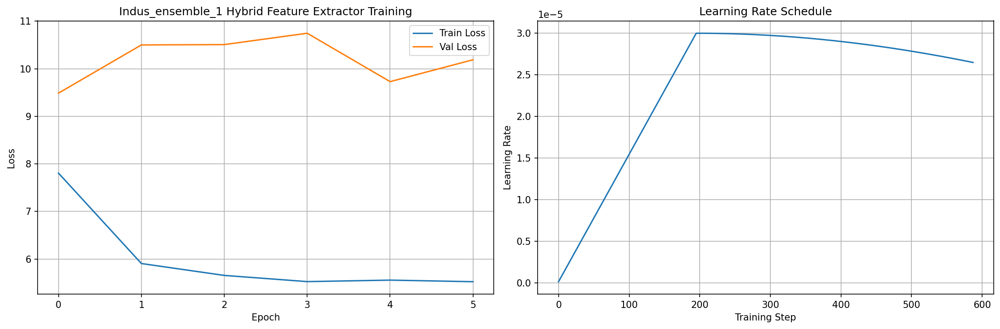

Training completed. Best validation loss: 9.4881 at epoch 1


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Indus Model 2/5 with seed 43
Created dataset for Indus: 391 original images + 1173 augmentations
Created dataset with 1564 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 8.4156 | LR: 0.000002
Train Batch: 20/98 | Loss: 7.9771 | LR: 0.000003
Train Batch: 30/98 | Loss: 8.9160 | LR: 0.000005
Train Batch: 40/98 | Loss: 8.7342 | LR: 0.000006
Train Batch: 50/98 | Loss: 7.8954 | LR: 0.000008
Train Batch: 60/98 | Loss: 7.4512 | LR: 0.000009
Train Batch: 70/98 | Loss: 7.6657 | LR: 0.000011
Contrastive: 6.0654, Variance: 0.9988, Penalty: 2.0021
Train Batch: 80/98 | Loss: 7.0323 | LR: 0.000012
Train Batch: 90/98 | Loss: 6.1275 | LR: 0.000014
Train Batch: 98/98 | Loss: 6.0950 | LR: 0.000015


Epoch 1/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 7.8655
Val Loss: 9.4568
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_2_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 6.8104 | LR: 0.000017
Train Batch: 20/98 | Loss: 6.4018 | LR: 0.000018
Contrastive: 4.8591, Variance: 0.9992, Penalty: 2.0015
Train Batch: 30/98 | Loss: 6.1901 | LR: 0.000020
Train Batch: 40/98 | Loss: 5.8599 | LR: 0.000021
Train Batch: 50/98 | Loss: 6.5109 | LR: 0.000023
Train Batch: 60/98 | Loss: 6.1732 | LR: 0.000024
Train Batch: 70/98 | Loss: 6.1046 | LR: 0.000026
Train Batch: 80/98 | Loss: 5.5998 | LR: 0.000027
Train Batch: 90/98 | Loss: 5.7757 | LR: 0.000029
Train Batch: 98/98 | Loss: 5.2734 | LR: 0.000030


Epoch 2/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.9355
Val Loss: 9.4115
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_2_hybrid_extractor_best.pth


Epoch 3/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.0963 | LR: 0.000030
Train Batch: 20/98 | Loss: 5.7058 | LR: 0.000030
Train Batch: 30/98 | Loss: 5.8942 | LR: 0.000030
Train Batch: 40/98 | Loss: 5.5239 | LR: 0.000030
Train Batch: 50/98 | Loss: 5.0163 | LR: 0.000030
Train Batch: 60/98 | Loss: 5.4811 | LR: 0.000030
Train Batch: 70/98 | Loss: 5.1631 | LR: 0.000030
Train Batch: 80/98 | Loss: 5.3067 | LR: 0.000030
Train Batch: 90/98 | Loss: 6.0554 | LR: 0.000030
Train Batch: 98/98 | Loss: 5.6574 | LR: 0.000030


Epoch 3/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.6219
Val Loss: 12.8895
No improvement for 1 epochs


Epoch 4/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.9494 | LR: 0.000030
Train Batch: 20/98 | Loss: 5.7861 | LR: 0.000030
Train Batch: 30/98 | Loss: 5.6404 | LR: 0.000030
Train Batch: 40/98 | Loss: 6.0752 | LR: 0.000030
Train Batch: 50/98 | Loss: 5.4669 | LR: 0.000029
Train Batch: 60/98 | Loss: 5.4570 | LR: 0.000029
Train Batch: 70/98 | Loss: 5.4456 | LR: 0.000029
Train Batch: 80/98 | Loss: 5.6877 | LR: 0.000029
Train Batch: 90/98 | Loss: 5.6277 | LR: 0.000029
Contrastive: 4.0682, Variance: 0.9965, Penalty: 2.0069
Train Batch: 98/98 | Loss: 5.5367 | LR: 0.000029


Epoch 4/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.6045
Val Loss: 10.7510
No improvement for 2 epochs


Epoch 5/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.4253 | LR: 0.000029
Train Batch: 20/98 | Loss: 5.5369 | LR: 0.000029
Train Batch: 30/98 | Loss: 5.2602 | LR: 0.000029
Train Batch: 40/98 | Loss: 5.5926 | LR: 0.000029
Train Batch: 50/98 | Loss: 4.9911 | LR: 0.000029
Train Batch: 60/98 | Loss: 5.3797 | LR: 0.000028
Train Batch: 70/98 | Loss: 5.3545 | LR: 0.000028
Train Batch: 80/98 | Loss: 5.4252 | LR: 0.000028
Train Batch: 90/98 | Loss: 5.2769 | LR: 0.000028
Train Batch: 98/98 | Loss: 4.9833 | LR: 0.000028


Epoch 5/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5846
Val Loss: 10.5084
No improvement for 3 epochs


Epoch 6/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.7218 | LR: 0.000028
Train Batch: 20/98 | Loss: 5.8790 | LR: 0.000028
Train Batch: 30/98 | Loss: 5.3817 | LR: 0.000028
Train Batch: 40/98 | Loss: 5.3530 | LR: 0.000027
Train Batch: 50/98 | Loss: 5.6235 | LR: 0.000027
Train Batch: 60/98 | Loss: 5.8755 | LR: 0.000027
Contrastive: 3.2782, Variance: 0.9982, Penalty: 2.0035
Train Batch: 70/98 | Loss: 5.6557 | LR: 0.000027
Train Batch: 80/98 | Loss: 5.4165 | LR: 0.000027
Train Batch: 90/98 | Loss: 4.8987 | LR: 0.000027
Train Batch: 98/98 | Loss: 5.4726 | LR: 0.000026


Epoch 6/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.5400
Val Loss: 9.8843
No improvement for 4 epochs


Epoch 7/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.7482 | LR: 0.000026
Train Batch: 20/98 | Loss: 5.3582 | LR: 0.000026
Train Batch: 30/98 | Loss: 5.9243 | LR: 0.000026
Train Batch: 40/98 | Loss: 5.8344 | LR: 0.000026
Train Batch: 50/98 | Loss: 5.5071 | LR: 0.000026
Train Batch: 60/98 | Loss: 5.6125 | LR: 0.000025
Train Batch: 70/98 | Loss: 5.3900 | LR: 0.000025
Train Batch: 80/98 | Loss: 5.2002 | LR: 0.000025
Train Batch: 90/98 | Loss: 5.9483 | LR: 0.000025
Train Batch: 98/98 | Loss: 5.2119 | LR: 0.000025


Epoch 7/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 7/20
Train Loss: 5.6689
Val Loss: 19.4410
No improvement for 5 epochs
Early stopping triggered after epoch 7
Final model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_2_hybrid_extractor_final.pth


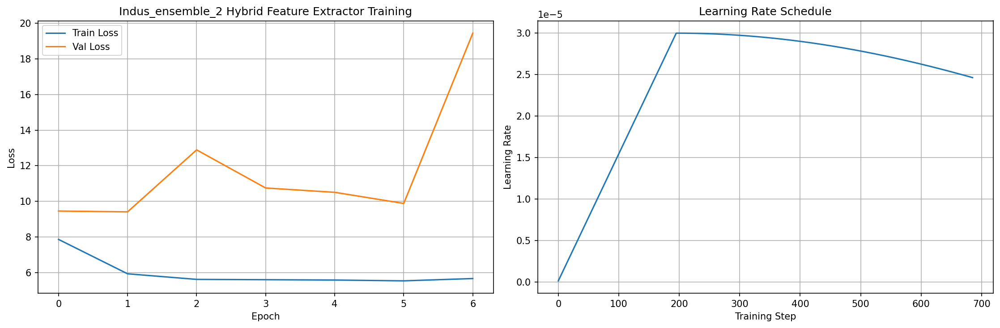

Training completed. Best validation loss: 9.4115 at epoch 2


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Indus Model 3/5 with seed 44
Created dataset for Indus: 391 original images + 1173 augmentations
Created dataset with 1564 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Contrastive: 5.6329, Variance: 0.9993, Penalty: 2.0011
Train Batch: 10/98 | Loss: 8.3828 | LR: 0.000002
Train Batch: 20/98 | Loss: 8.5257 | LR: 0.000003
Train Batch: 30/98 | Loss: 8.5176 | LR: 0.000005
Train Batch: 40/98 | Loss: 7.5568 | LR: 0.000006
Train Batch: 50/98 | Loss: 7.9558 | LR: 0.000008
Train Batch: 60/98 | Loss: 7.7760 | LR: 0.000009
Train Batch: 70/98 | Loss: 6.8293 | LR: 0.000011
Contrastive: 5.9055, Variance: 0.9993, Penalty: 2.0012
Train Batch: 80/98 | Loss: 7.6234 | LR: 0.000012
Train Batch: 90/98 | Loss: 6.1049 | LR: 0.000014
Train Batch: 98/98 | Loss: 6.2051 | LR: 0.000015


Epoch 1/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 7.7704
Val Loss: 10.0930
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_3_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 6.2851 | LR: 0.000017
Train Batch: 20/98 | Loss: 5.6048 | LR: 0.000018
Train Batch: 30/98 | Loss: 6.5467 | LR: 0.000020
Train Batch: 40/98 | Loss: 5.0366 | LR: 0.000021
Contrastive: 4.1348, Variance: 0.9994, Penalty: 2.0011
Train Batch: 50/98 | Loss: 5.8350 | LR: 0.000023
Train Batch: 60/98 | Loss: 6.0496 | LR: 0.000024
Train Batch: 70/98 | Loss: 6.1603 | LR: 0.000026
Train Batch: 80/98 | Loss: 5.3406 | LR: 0.000027
Train Batch: 90/98 | Loss: 5.9782 | LR: 0.000029
Train Batch: 98/98 | Loss: 4.9124 | LR: 0.000030


Epoch 2/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.8427
Val Loss: 14.5860
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Contrastive: 3.8378, Variance: 0.9989, Penalty: 2.0021
Train Batch: 10/98 | Loss: 5.6565 | LR: 0.000030
Contrastive: 3.8433, Variance: 0.9996, Penalty: 2.0006
Train Batch: 20/98 | Loss: 5.5579 | LR: 0.000030
Train Batch: 30/98 | Loss: 5.6611 | LR: 0.000030
Train Batch: 40/98 | Loss: 5.4723 | LR: 0.000030
Train Batch: 50/98 | Loss: 5.5775 | LR: 0.000030
Train Batch: 60/98 | Loss: 5.9550 | LR: 0.000030
Train Batch: 70/98 | Loss: 5.4527 | LR: 0.000030
Train Batch: 80/98 | Loss: 5.4360 | LR: 0.000030
Train Batch: 90/98 | Loss: 5.9966 | LR: 0.000030
Train Batch: 98/98 | Loss: 4.8850 | LR: 0.000030


Epoch 3/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.5691
Val Loss: 10.0521
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_3_hybrid_extractor_best.pth


Epoch 4/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.6689 | LR: 0.000030
Train Batch: 20/98 | Loss: 5.5165 | LR: 0.000030
Train Batch: 30/98 | Loss: 6.5736 | LR: 0.000030
Train Batch: 40/98 | Loss: 5.4929 | LR: 0.000030
Train Batch: 50/98 | Loss: 5.3855 | LR: 0.000029
Contrastive: 3.8761, Variance: 0.9988, Penalty: 2.0022
Train Batch: 60/98 | Loss: 5.6049 | LR: 0.000029
Train Batch: 70/98 | Loss: 5.2865 | LR: 0.000029
Train Batch: 80/98 | Loss: 5.6564 | LR: 0.000029
Train Batch: 90/98 | Loss: 5.7258 | LR: 0.000029
Train Batch: 98/98 | Loss: 5.2007 | LR: 0.000029


Epoch 4/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.6374
Val Loss: 9.0155
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_3_hybrid_extractor_best.pth


Epoch 5/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.5323 | LR: 0.000029
Train Batch: 20/98 | Loss: 5.4266 | LR: 0.000029
Train Batch: 30/98 | Loss: 5.9905 | LR: 0.000029
Train Batch: 40/98 | Loss: 5.3541 | LR: 0.000029
Train Batch: 50/98 | Loss: 5.1174 | LR: 0.000029
Train Batch: 60/98 | Loss: 5.5880 | LR: 0.000028
Train Batch: 70/98 | Loss: 5.6806 | LR: 0.000028
Train Batch: 80/98 | Loss: 5.7044 | LR: 0.000028
Train Batch: 90/98 | Loss: 5.1749 | LR: 0.000028
Train Batch: 98/98 | Loss: 5.9486 | LR: 0.000028


Epoch 5/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5572
Val Loss: 10.9588
No improvement for 1 epochs


Epoch 6/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.6069 | LR: 0.000028
Train Batch: 20/98 | Loss: 5.7346 | LR: 0.000028
Train Batch: 30/98 | Loss: 5.3862 | LR: 0.000028
Train Batch: 40/98 | Loss: 5.9358 | LR: 0.000027
Train Batch: 50/98 | Loss: 5.8585 | LR: 0.000027
Train Batch: 60/98 | Loss: 5.4730 | LR: 0.000027
Train Batch: 70/98 | Loss: 5.8758 | LR: 0.000027
Train Batch: 80/98 | Loss: 5.4566 | LR: 0.000027
Train Batch: 90/98 | Loss: 5.8184 | LR: 0.000027
Train Batch: 98/98 | Loss: 5.3693 | LR: 0.000026


Epoch 6/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.6013
Val Loss: 9.8841
No improvement for 2 epochs


Epoch 7/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.3180 | LR: 0.000026
Train Batch: 20/98 | Loss: 5.3318 | LR: 0.000026
Contrastive: 3.4076, Variance: 0.9995, Penalty: 2.0009
Train Batch: 30/98 | Loss: 6.2974 | LR: 0.000026
Contrastive: 3.8477, Variance: 0.9992, Penalty: 2.0013
Train Batch: 40/98 | Loss: 5.4246 | LR: 0.000026
Train Batch: 50/98 | Loss: 5.9950 | LR: 0.000026
Train Batch: 60/98 | Loss: 5.6410 | LR: 0.000025
Train Batch: 70/98 | Loss: 5.2945 | LR: 0.000025
Train Batch: 80/98 | Loss: 5.4095 | LR: 0.000025
Train Batch: 90/98 | Loss: 4.9564 | LR: 0.000025
Contrastive: 3.4899, Variance: 0.9989, Penalty: 2.0020
Train Batch: 98/98 | Loss: 5.2048 | LR: 0.000025


Epoch 7/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 7/20
Train Loss: 5.5578
Val Loss: 9.3560
No improvement for 3 epochs


Epoch 8/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.7717 | LR: 0.000024
Contrastive: 3.4387, Variance: 0.9990, Penalty: 2.0017
Train Batch: 20/98 | Loss: 5.9747 | LR: 0.000024
Train Batch: 30/98 | Loss: 5.5547 | LR: 0.000024
Contrastive: 3.9142, Variance: 0.9988, Penalty: 2.0022
Train Batch: 40/98 | Loss: 5.4874 | LR: 0.000024
Train Batch: 50/98 | Loss: 5.4841 | LR: 0.000024
Train Batch: 60/98 | Loss: 5.8849 | LR: 0.000023
Train Batch: 70/98 | Loss: 5.8729 | LR: 0.000023
Train Batch: 80/98 | Loss: 5.6870 | LR: 0.000023
Train Batch: 90/98 | Loss: 5.6393 | LR: 0.000023
Train Batch: 98/98 | Loss: 4.8553 | LR: 0.000023


Epoch 8/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 8/20
Train Loss: 5.5027
Val Loss: 10.2470
No improvement for 4 epochs


Epoch 9/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.2995 | LR: 0.000022
Train Batch: 20/98 | Loss: 5.8737 | LR: 0.000022
Train Batch: 30/98 | Loss: 5.7320 | LR: 0.000022
Train Batch: 40/98 | Loss: 5.7771 | LR: 0.000022
Train Batch: 50/98 | Loss: 5.1000 | LR: 0.000021
Train Batch: 60/98 | Loss: 5.6521 | LR: 0.000021
Train Batch: 70/98 | Loss: 5.5485 | LR: 0.000021
Train Batch: 80/98 | Loss: 5.1587 | LR: 0.000021
Train Batch: 90/98 | Loss: 5.6120 | LR: 0.000020
Contrastive: 3.5837, Variance: 0.9988, Penalty: 2.0022
Train Batch: 98/98 | Loss: 5.3289 | LR: 0.000020


Epoch 9/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 9/20
Train Loss: 5.5427
Val Loss: 9.4846
No improvement for 5 epochs
Early stopping triggered after epoch 9
Final model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_3_hybrid_extractor_final.pth


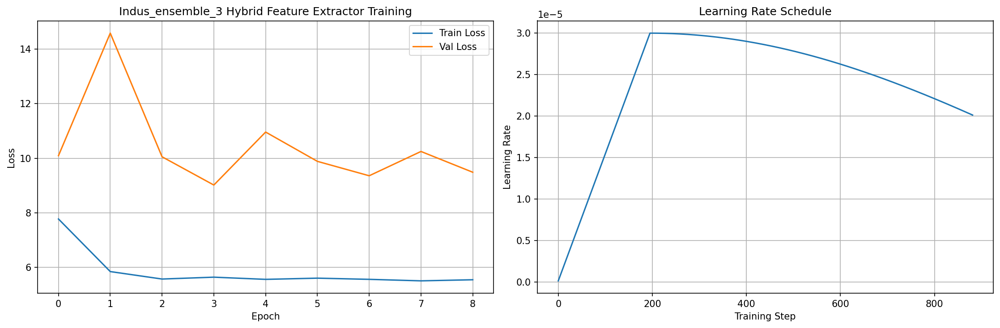

Training completed. Best validation loss: 9.0155 at epoch 4


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Indus Model 4/5 with seed 45
Created dataset for Indus: 391 original images + 1173 augmentations
Created dataset with 1564 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 8.8624 | LR: 0.000002
Train Batch: 20/98 | Loss: 8.7282 | LR: 0.000003
Train Batch: 30/98 | Loss: 8.2556 | LR: 0.000005
Train Batch: 40/98 | Loss: 8.4156 | LR: 0.000006
Train Batch: 50/98 | Loss: 7.5299 | LR: 0.000008
Train Batch: 60/98 | Loss: 7.5299 | LR: 0.000009
Train Batch: 70/98 | Loss: 7.8740 | LR: 0.000011
Train Batch: 80/98 | Loss: 7.5927 | LR: 0.000012
Train Batch: 90/98 | Loss: 7.3442 | LR: 0.000014
Train Batch: 98/98 | Loss: 5.7822 | LR: 0.000015


Epoch 1/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 7.6639
Val Loss: 9.9815
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_4_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 6.1489 | LR: 0.000017
Train Batch: 20/98 | Loss: 5.9237 | LR: 0.000018
Train Batch: 30/98 | Loss: 5.8345 | LR: 0.000020
Train Batch: 40/98 | Loss: 5.7514 | LR: 0.000021
Train Batch: 50/98 | Loss: 5.6237 | LR: 0.000023
Train Batch: 60/98 | Loss: 5.6310 | LR: 0.000024
Train Batch: 70/98 | Loss: 5.8268 | LR: 0.000026
Train Batch: 80/98 | Loss: 5.5523 | LR: 0.000027
Train Batch: 90/98 | Loss: 5.9304 | LR: 0.000029
Train Batch: 98/98 | Loss: 5.5121 | LR: 0.000030


Epoch 2/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.8507
Val Loss: 10.2926
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.6157 | LR: 0.000030
Train Batch: 20/98 | Loss: 5.5310 | LR: 0.000030
Train Batch: 30/98 | Loss: 5.2477 | LR: 0.000030
Train Batch: 40/98 | Loss: 6.0989 | LR: 0.000030
Train Batch: 50/98 | Loss: 5.9436 | LR: 0.000030
Train Batch: 60/98 | Loss: 5.5488 | LR: 0.000030
Train Batch: 70/98 | Loss: 5.8351 | LR: 0.000030
Contrastive: 3.7278, Variance: 0.9994, Penalty: 2.0010
Train Batch: 80/98 | Loss: 5.5616 | LR: 0.000030
Train Batch: 90/98 | Loss: 5.5336 | LR: 0.000030
Train Batch: 98/98 | Loss: 5.4331 | LR: 0.000030


Epoch 3/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.6340
Val Loss: 10.4860
No improvement for 2 epochs


Epoch 4/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.6497 | LR: 0.000030
Train Batch: 20/98 | Loss: 5.2948 | LR: 0.000030
Train Batch: 30/98 | Loss: 4.8698 | LR: 0.000030
Train Batch: 40/98 | Loss: 6.3072 | LR: 0.000030
Train Batch: 50/98 | Loss: 5.2696 | LR: 0.000029
Train Batch: 60/98 | Loss: 6.4211 | LR: 0.000029
Contrastive: 4.3769, Variance: 0.9973, Penalty: 2.0052
Train Batch: 70/98 | Loss: 5.6731 | LR: 0.000029
Train Batch: 80/98 | Loss: 5.7629 | LR: 0.000029
Train Batch: 90/98 | Loss: 6.1438 | LR: 0.000029
Train Batch: 98/98 | Loss: 5.5400 | LR: 0.000029


Epoch 4/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.6846
Val Loss: 13.0810
No improvement for 3 epochs


Epoch 5/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 6.3965 | LR: 0.000029
Train Batch: 20/98 | Loss: 5.6846 | LR: 0.000029
Train Batch: 30/98 | Loss: 5.7591 | LR: 0.000029
Train Batch: 40/98 | Loss: 5.5932 | LR: 0.000029
Train Batch: 50/98 | Loss: 5.2768 | LR: 0.000029
Train Batch: 60/98 | Loss: 6.1695 | LR: 0.000028
Train Batch: 70/98 | Loss: 5.2621 | LR: 0.000028
Train Batch: 80/98 | Loss: 5.0795 | LR: 0.000028
Train Batch: 90/98 | Loss: 6.0216 | LR: 0.000028
Train Batch: 98/98 | Loss: 5.3386 | LR: 0.000028


Epoch 5/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.6349
Val Loss: 10.4369
No improvement for 4 epochs


Epoch 6/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.5809 | LR: 0.000028
Train Batch: 20/98 | Loss: 5.5139 | LR: 0.000028
Train Batch: 30/98 | Loss: 5.4320 | LR: 0.000028
Train Batch: 40/98 | Loss: 5.6026 | LR: 0.000027
Train Batch: 50/98 | Loss: 5.9192 | LR: 0.000027
Contrastive: 3.6011, Variance: 0.9988, Penalty: 2.0022
Train Batch: 60/98 | Loss: 5.9075 | LR: 0.000027
Train Batch: 70/98 | Loss: 5.6306 | LR: 0.000027
Train Batch: 80/98 | Loss: 5.1936 | LR: 0.000027
Train Batch: 90/98 | Loss: 5.5628 | LR: 0.000027
Train Batch: 98/98 | Loss: 5.8339 | LR: 0.000026


Epoch 6/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.5231
Val Loss: 10.8114
No improvement for 5 epochs
Early stopping triggered after epoch 6
Final model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_4_hybrid_extractor_final.pth


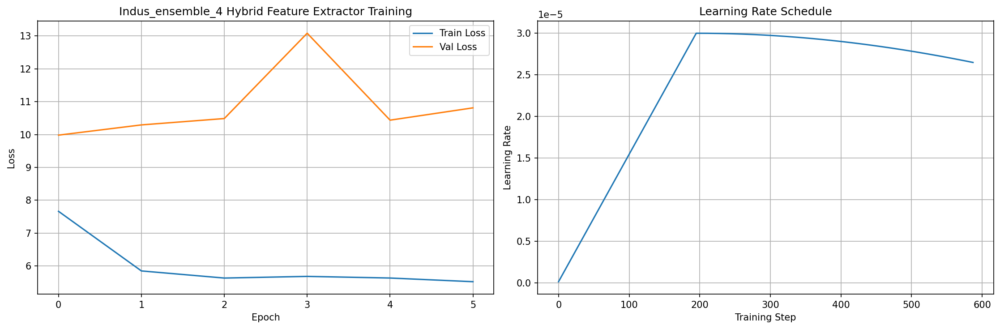

Training completed. Best validation loss: 9.9815 at epoch 1


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Indus Model 5/5 with seed 46
Created dataset for Indus: 391 original images + 1173 augmentations
Created dataset with 1564 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 8.2055 | LR: 0.000002
Train Batch: 20/98 | Loss: 8.8436 | LR: 0.000003
Train Batch: 30/98 | Loss: 8.0527 | LR: 0.000005
Train Batch: 40/98 | Loss: 8.4466 | LR: 0.000006
Train Batch: 50/98 | Loss: 8.5152 | LR: 0.000008
Contrastive: 6.4815, Variance: 0.9992, Penalty: 2.0015
Train Batch: 60/98 | Loss: 8.2015 | LR: 0.000009
Train Batch: 70/98 | Loss: 7.3591 | LR: 0.000011
Train Batch: 80/98 | Loss: 7.6480 | LR: 0.000012
Train Batch: 90/98 | Loss: 6.4697 | LR: 0.000014
Train Batch: 98/98 | Loss: 5.8149 | LR: 0.000015


Epoch 1/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 7.7688
Val Loss: 10.1849
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_5_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 6.3331 | LR: 0.000017
Train Batch: 20/98 | Loss: 5.4195 | LR: 0.000018
Contrastive: 4.4926, Variance: 0.9988, Penalty: 2.0022
Train Batch: 30/98 | Loss: 6.0637 | LR: 0.000020
Train Batch: 40/98 | Loss: 5.7864 | LR: 0.000021
Train Batch: 50/98 | Loss: 5.8081 | LR: 0.000023
Train Batch: 60/98 | Loss: 5.5950 | LR: 0.000024
Train Batch: 70/98 | Loss: 6.4381 | LR: 0.000026
Train Batch: 80/98 | Loss: 5.2945 | LR: 0.000027
Contrastive: 3.8717, Variance: 0.9997, Penalty: 2.0004
Train Batch: 90/98 | Loss: 5.3137 | LR: 0.000029
Train Batch: 98/98 | Loss: 4.6152 | LR: 0.000030


Epoch 2/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.8248
Val Loss: 9.8684
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_5_hybrid_extractor_best.pth


Epoch 3/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.2396 | LR: 0.000030
Train Batch: 20/98 | Loss: 5.5881 | LR: 0.000030
Train Batch: 30/98 | Loss: 6.0813 | LR: 0.000030
Train Batch: 40/98 | Loss: 5.3178 | LR: 0.000030
Train Batch: 50/98 | Loss: 5.6119 | LR: 0.000030
Train Batch: 60/98 | Loss: 5.8345 | LR: 0.000030
Train Batch: 70/98 | Loss: 6.2538 | LR: 0.000030
Train Batch: 80/98 | Loss: 5.4483 | LR: 0.000030
Train Batch: 90/98 | Loss: 5.2892 | LR: 0.000030
Train Batch: 98/98 | Loss: 5.1986 | LR: 0.000030


Epoch 3/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.6328
Val Loss: 12.4153
No improvement for 1 epochs


Epoch 4/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.4542 | LR: 0.000030
Train Batch: 20/98 | Loss: 5.6227 | LR: 0.000030
Train Batch: 30/98 | Loss: 5.1872 | LR: 0.000030
Train Batch: 40/98 | Loss: 5.3469 | LR: 0.000030
Train Batch: 50/98 | Loss: 6.7823 | LR: 0.000029
Train Batch: 60/98 | Loss: 5.7957 | LR: 0.000029
Train Batch: 70/98 | Loss: 5.5589 | LR: 0.000029
Train Batch: 80/98 | Loss: 5.2817 | LR: 0.000029
Train Batch: 90/98 | Loss: 5.7887 | LR: 0.000029
Train Batch: 98/98 | Loss: 5.2146 | LR: 0.000029


Epoch 4/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.7480
Val Loss: 13.8604
No improvement for 2 epochs


Epoch 5/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.6565 | LR: 0.000029
Train Batch: 20/98 | Loss: 5.7371 | LR: 0.000029
Train Batch: 30/98 | Loss: 5.7374 | LR: 0.000029
Train Batch: 40/98 | Loss: 5.4080 | LR: 0.000029
Train Batch: 50/98 | Loss: 5.5731 | LR: 0.000029
Contrastive: 4.0291, Variance: 0.9952, Penalty: 2.0095
Train Batch: 60/98 | Loss: 4.9201 | LR: 0.000028
Train Batch: 70/98 | Loss: 5.6132 | LR: 0.000028
Train Batch: 80/98 | Loss: 5.6145 | LR: 0.000028
Contrastive: 3.7176, Variance: 0.9976, Penalty: 2.0046
Train Batch: 90/98 | Loss: 6.2306 | LR: 0.000028
Train Batch: 98/98 | Loss: 5.5271 | LR: 0.000028


Epoch 5/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.6990
Val Loss: 11.6202
No improvement for 3 epochs


Epoch 6/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.6943 | LR: 0.000028
Train Batch: 20/98 | Loss: 5.7318 | LR: 0.000028
Train Batch: 30/98 | Loss: 5.5709 | LR: 0.000028
Train Batch: 40/98 | Loss: 5.4517 | LR: 0.000027
Train Batch: 50/98 | Loss: 5.8399 | LR: 0.000027
Train Batch: 60/98 | Loss: 6.1992 | LR: 0.000027
Train Batch: 70/98 | Loss: 5.3007 | LR: 0.000027
Train Batch: 80/98 | Loss: 6.0181 | LR: 0.000027
Train Batch: 90/98 | Loss: 5.7101 | LR: 0.000027
Train Batch: 98/98 | Loss: 5.4895 | LR: 0.000026


Epoch 6/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.6575
Val Loss: 18.0569
No improvement for 4 epochs


Epoch 7/20 [Train]:   0%|          | 0/98 [00:00<?, ?it/s]

Train Batch: 10/98 | Loss: 5.9965 | LR: 0.000026
Train Batch: 20/98 | Loss: 5.3917 | LR: 0.000026
Train Batch: 30/98 | Loss: 5.6538 | LR: 0.000026
Train Batch: 40/98 | Loss: 5.6362 | LR: 0.000026
Train Batch: 50/98 | Loss: 5.3239 | LR: 0.000026
Train Batch: 60/98 | Loss: 5.4259 | LR: 0.000025
Train Batch: 70/98 | Loss: 5.2367 | LR: 0.000025
Train Batch: 80/98 | Loss: 5.9367 | LR: 0.000025
Train Batch: 90/98 | Loss: 5.2370 | LR: 0.000025
Train Batch: 98/98 | Loss: 5.4973 | LR: 0.000025


Epoch 7/20 [Val]:   0%|          | 0/3 [00:00<?, ?it/s]


Epoch 7/20
Train Loss: 5.6024
Val Loss: 16.6503
No improvement for 5 epochs
Early stopping triggered after epoch 7
Final model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_5_hybrid_extractor_final.pth


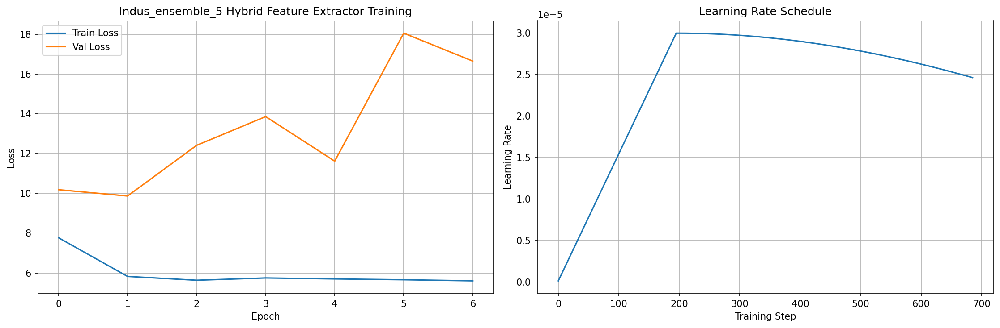

Training completed. Best validation loss: 9.8684 at epoch 2


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Ensemble Training Summary for Indus
   model_idx  seed  val_loss  epoch  \
0          1    42  9.488112      1   
1          2    43  9.411522      2   
2          3    44  9.015543      4   
3          4    45  9.981514      1   
4          5    46  9.868412      2   

                                          model_path  
0  /content/drive/MyDrive/script_analysis/models/...  
1  /content/drive/MyDrive/script_analysis/models/...  
2  /content/drive/MyDrive/script_analysis/models/...  
3  /content/drive/MyDrive/script_analysis/models/...  
4  /content/drive/MyDrive/script_analysis/models/...  

Average validation loss: 9.5530
Best validation loss: 9.0155
Summary saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_summary.csv

Training ensemble for Proto-Cuneiform

Training ensemble of 5 Proto-Cuneiform models on cuda

Training Proto-Cuneiform Model 1/5 with seed 42
Created dataset for Proto-Cuneiform: 2089 original images + 6267 augmentations
Created d

Epoch 1/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 8.6917 | LR: 0.000000
Contrastive: 7.9682, Variance: 0.9991, Penalty: 2.0017
Train Batch: 20/523 | Loss: 9.6898 | LR: 0.000001
Train Batch: 30/523 | Loss: 8.4920 | LR: 0.000001
Train Batch: 40/523 | Loss: 7.5547 | LR: 0.000001
Train Batch: 50/523 | Loss: 8.3789 | LR: 0.000001
Train Batch: 60/523 | Loss: 7.9545 | LR: 0.000002
Train Batch: 70/523 | Loss: 7.0222 | LR: 0.000002
Train Batch: 80/523 | Loss: 8.4628 | LR: 0.000002
Train Batch: 90/523 | Loss: 7.7900 | LR: 0.000003
Train Batch: 100/523 | Loss: 7.3739 | LR: 0.000003
Train Batch: 110/523 | Loss: 8.0491 | LR: 0.000003
Train Batch: 120/523 | Loss: 6.8409 | LR: 0.000003
Contrastive: 6.0568, Variance: 0.9994, Penalty: 2.0010
Train Batch: 130/523 | Loss: 8.0029 | LR: 0.000004
Train Batch: 140/523 | Loss: 8.2789 | LR: 0.000004
Train Batch: 150/523 | Loss: 7.0836 | LR: 0.000004
Train Batch: 160/523 | Loss: 7.0764 | LR: 0.000005
Train Batch: 170/523 | Loss: 6.7342 | LR: 0.000005
Train Batch: 180/523 | Loss: 6.2

Epoch 1/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 6.5489
Val Loss: 10.6326
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_1_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.2698 | LR: 0.000015
Train Batch: 20/523 | Loss: 5.7307 | LR: 0.000016
Train Batch: 30/523 | Loss: 5.0964 | LR: 0.000016
Train Batch: 40/523 | Loss: 5.6971 | LR: 0.000016
Train Batch: 50/523 | Loss: 5.7111 | LR: 0.000016
Train Batch: 60/523 | Loss: 5.4077 | LR: 0.000017
Train Batch: 70/523 | Loss: 5.9003 | LR: 0.000017
Train Batch: 80/523 | Loss: 5.2859 | LR: 0.000017
Train Batch: 90/523 | Loss: 5.1524 | LR: 0.000018
Train Batch: 100/523 | Loss: 5.5465 | LR: 0.000018
Train Batch: 110/523 | Loss: 6.0374 | LR: 0.000018
Train Batch: 120/523 | Loss: 5.5200 | LR: 0.000018
Train Batch: 130/523 | Loss: 5.0547 | LR: 0.000019
Train Batch: 140/523 | Loss: 5.6243 | LR: 0.000019
Contrastive: 3.7364, Variance: 0.9990, Penalty: 2.0017
Train Batch: 150/523 | Loss: 6.1751 | LR: 0.000019
Train Batch: 160/523 | Loss: 5.4844 | LR: 0.000020
Train Batch: 170/523 | Loss: 5.6681 | LR: 0.000020
Train Batch: 180/523 | Loss: 5.1319 | LR: 0.000020
Train Batch: 190/523 | Loss: 5.9514 

Epoch 2/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.5173
Val Loss: 12.5115
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.9650 | LR: 0.000030
Train Batch: 20/523 | Loss: 6.4124 | LR: 0.000030
Train Batch: 30/523 | Loss: 5.7717 | LR: 0.000030
Train Batch: 40/523 | Loss: 6.1487 | LR: 0.000030
Train Batch: 50/523 | Loss: 5.2867 | LR: 0.000030
Train Batch: 60/523 | Loss: 5.6984 | LR: 0.000030
Contrastive: 4.2918, Variance: 0.9992, Penalty: 2.0013
Train Batch: 70/523 | Loss: 5.5801 | LR: 0.000030
Train Batch: 80/523 | Loss: 5.1396 | LR: 0.000030
Train Batch: 90/523 | Loss: 6.1882 | LR: 0.000030
Contrastive: 3.7525, Variance: 0.9990, Penalty: 2.0018
Train Batch: 100/523 | Loss: 5.8300 | LR: 0.000030
Contrastive: 3.3696, Variance: 0.9990, Penalty: 2.0019
Train Batch: 110/523 | Loss: 5.7312 | LR: 0.000030
Train Batch: 120/523 | Loss: 5.8044 | LR: 0.000030
Train Batch: 130/523 | Loss: 5.2434 | LR: 0.000030
Train Batch: 140/523 | Loss: 5.5619 | LR: 0.000030
Train Batch: 150/523 | Loss: 5.3546 | LR: 0.000030
Train Batch: 160/523 | Loss: 5.4139 | LR: 0.000030
Train Batch: 170/523 | Loss:

Epoch 3/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.5006
Val Loss: 9.6974
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_1_hybrid_extractor_best.pth


Epoch 4/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.1290 | LR: 0.000030
Train Batch: 20/523 | Loss: 5.3445 | LR: 0.000030
Train Batch: 30/523 | Loss: 5.7139 | LR: 0.000030
Train Batch: 40/523 | Loss: 5.6028 | LR: 0.000030
Train Batch: 50/523 | Loss: 4.9521 | LR: 0.000030
Train Batch: 60/523 | Loss: 5.8469 | LR: 0.000030
Train Batch: 70/523 | Loss: 5.2722 | LR: 0.000030
Train Batch: 80/523 | Loss: 5.6937 | LR: 0.000030
Train Batch: 90/523 | Loss: 5.5621 | LR: 0.000030
Train Batch: 100/523 | Loss: 5.6759 | LR: 0.000030
Train Batch: 110/523 | Loss: 5.1845 | LR: 0.000030
Train Batch: 120/523 | Loss: 5.2181 | LR: 0.000030
Train Batch: 130/523 | Loss: 5.1111 | LR: 0.000030
Train Batch: 140/523 | Loss: 5.4492 | LR: 0.000030
Train Batch: 150/523 | Loss: 5.3534 | LR: 0.000030
Train Batch: 160/523 | Loss: 5.2997 | LR: 0.000030
Train Batch: 170/523 | Loss: 5.2635 | LR: 0.000030
Train Batch: 180/523 | Loss: 5.9991 | LR: 0.000030
Train Batch: 190/523 | Loss: 5.9445 | LR: 0.000030
Contrastive: 3.8256, Variance: 0.9997, P

Epoch 4/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.5277
Val Loss: 9.2139
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_1_hybrid_extractor_best.pth


Epoch 5/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Contrastive: 3.7249, Variance: 0.9988, Penalty: 2.0022
Train Batch: 10/523 | Loss: 5.4411 | LR: 0.000029
Train Batch: 20/523 | Loss: 5.1887 | LR: 0.000029
Train Batch: 30/523 | Loss: 5.4997 | LR: 0.000029
Train Batch: 40/523 | Loss: 5.3479 | LR: 0.000029
Train Batch: 50/523 | Loss: 5.7023 | LR: 0.000029
Train Batch: 60/523 | Loss: 4.9449 | LR: 0.000029
Train Batch: 70/523 | Loss: 4.9094 | LR: 0.000029
Contrastive: 4.0257, Variance: 0.9992, Penalty: 2.0014
Train Batch: 80/523 | Loss: 4.9271 | LR: 0.000029
Train Batch: 90/523 | Loss: 5.3554 | LR: 0.000029
Train Batch: 100/523 | Loss: 4.9758 | LR: 0.000029
Train Batch: 110/523 | Loss: 5.8105 | LR: 0.000029
Train Batch: 120/523 | Loss: 5.8885 | LR: 0.000029
Train Batch: 130/523 | Loss: 5.2836 | LR: 0.000029
Train Batch: 140/523 | Loss: 5.8327 | LR: 0.000029
Train Batch: 150/523 | Loss: 4.8763 | LR: 0.000029
Train Batch: 160/523 | Loss: 5.4220 | LR: 0.000029
Train Batch: 170/523 | Loss: 5.6737 | LR: 0.000029
Train Batch: 180/523 | Loss: 5.3

Epoch 5/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5503
Val Loss: 14.6268
No improvement for 1 epochs


Epoch 6/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.6546 | LR: 0.000028
Train Batch: 20/523 | Loss: 5.3314 | LR: 0.000028
Train Batch: 30/523 | Loss: 6.0124 | LR: 0.000028
Train Batch: 40/523 | Loss: 5.4199 | LR: 0.000028
Train Batch: 50/523 | Loss: 5.0716 | LR: 0.000028
Contrastive: 3.9604, Variance: 0.9984, Penalty: 2.0031
Train Batch: 60/523 | Loss: 5.6285 | LR: 0.000028
Contrastive: 3.1509, Variance: 0.9992, Penalty: 2.0015
Train Batch: 70/523 | Loss: 5.2546 | LR: 0.000028
Contrastive: 3.8716, Variance: 0.9981, Penalty: 2.0036
Train Batch: 80/523 | Loss: 5.4114 | LR: 0.000028
Train Batch: 90/523 | Loss: 5.9303 | LR: 0.000028
Train Batch: 100/523 | Loss: 5.1887 | LR: 0.000028
Train Batch: 110/523 | Loss: 5.2314 | LR: 0.000028
Train Batch: 120/523 | Loss: 5.5614 | LR: 0.000028
Train Batch: 130/523 | Loss: 5.1876 | LR: 0.000028
Train Batch: 140/523 | Loss: 5.4485 | LR: 0.000028
Train Batch: 150/523 | Loss: 5.5046 | LR: 0.000028
Train Batch: 160/523 | Loss: 5.1821 | LR: 0.000028
Train Batch: 170/523 | Loss:

Epoch 6/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]

Contrastive: 5.9493, Variance: 0.4550, Penalty: 4.3947
Contrastive: 4.7158, Variance: 0.3658, Penalty: 5.4660

Epoch 6/20
Train Loss: 5.5012
Val Loss: 9.3766
No improvement for 2 epochs


Epoch 7/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.8886 | LR: 0.000026
Train Batch: 20/523 | Loss: 5.6508 | LR: 0.000026
Train Batch: 30/523 | Loss: 5.4944 | LR: 0.000026
Train Batch: 40/523 | Loss: 5.0932 | LR: 0.000026
Train Batch: 50/523 | Loss: 5.3439 | LR: 0.000026
Train Batch: 60/523 | Loss: 5.4785 | LR: 0.000026
Train Batch: 70/523 | Loss: 5.0722 | LR: 0.000026
Train Batch: 80/523 | Loss: 5.2844 | LR: 0.000026
Train Batch: 90/523 | Loss: 5.4755 | LR: 0.000026
Contrastive: 3.8051, Variance: 0.9975, Penalty: 2.0049
Train Batch: 100/523 | Loss: 5.7094 | LR: 0.000026
Train Batch: 110/523 | Loss: 5.5865 | LR: 0.000026
Train Batch: 120/523 | Loss: 5.3829 | LR: 0.000026
Train Batch: 130/523 | Loss: 5.4647 | LR: 0.000026
Train Batch: 140/523 | Loss: 5.7032 | LR: 0.000026
Train Batch: 150/523 | Loss: 5.7872 | LR: 0.000026
Train Batch: 160/523 | Loss: 5.6589 | LR: 0.000026
Train Batch: 170/523 | Loss: 5.1443 | LR: 0.000026
Train Batch: 180/523 | Loss: 5.2916 | LR: 0.000026
Train Batch: 190/523 | Loss: 4.9128 

Epoch 7/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]

Contrastive: 5.5815, Variance: 0.4864, Penalty: 4.1111

Epoch 7/20
Train Loss: 5.4571
Val Loss: 9.1693
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_1_hybrid_extractor_best.pth


Epoch 8/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.1232 | LR: 0.000025
Train Batch: 20/523 | Loss: 5.3494 | LR: 0.000025
Train Batch: 30/523 | Loss: 4.7179 | LR: 0.000025
Train Batch: 40/523 | Loss: 5.5369 | LR: 0.000024
Contrastive: 3.6150, Variance: 0.9992, Penalty: 2.0014
Train Batch: 50/523 | Loss: 5.3302 | LR: 0.000024
Train Batch: 60/523 | Loss: 5.1712 | LR: 0.000024
Train Batch: 70/523 | Loss: 5.9258 | LR: 0.000024
Train Batch: 80/523 | Loss: 5.6710 | LR: 0.000024
Train Batch: 90/523 | Loss: 5.5029 | LR: 0.000024
Contrastive: 3.6872, Variance: 0.9994, Penalty: 2.0011
Train Batch: 100/523 | Loss: 5.0983 | LR: 0.000024
Train Batch: 110/523 | Loss: 5.5804 | LR: 0.000024
Train Batch: 120/523 | Loss: 5.4991 | LR: 0.000024
Train Batch: 130/523 | Loss: 5.0830 | LR: 0.000024
Train Batch: 140/523 | Loss: 5.1812 | LR: 0.000024
Train Batch: 150/523 | Loss: 5.2427 | LR: 0.000024
Train Batch: 160/523 | Loss: 5.4745 | LR: 0.000024
Train Batch: 170/523 | Loss: 5.2946 | LR: 0.000024
Train Batch: 180/523 | Loss: 5.3

Epoch 8/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 8/20
Train Loss: 5.4614
Val Loss: 8.9872
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_1_hybrid_extractor_best.pth


Epoch 9/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 4.9661 | LR: 0.000022
Train Batch: 20/523 | Loss: 5.7451 | LR: 0.000022
Train Batch: 30/523 | Loss: 5.1549 | LR: 0.000022
Train Batch: 40/523 | Loss: 5.5205 | LR: 0.000022
Train Batch: 50/523 | Loss: 5.4623 | LR: 0.000022
Train Batch: 60/523 | Loss: 5.3709 | LR: 0.000022
Contrastive: 3.4000, Variance: 0.9981, Penalty: 2.0036
Contrastive: 3.4571, Variance: 0.9988, Penalty: 2.0022
Train Batch: 70/523 | Loss: 6.0022 | LR: 0.000022
Contrastive: 3.3879, Variance: 0.9985, Penalty: 2.0028
Contrastive: 3.2562, Variance: 0.9987, Penalty: 2.0023
Train Batch: 80/523 | Loss: 5.7010 | LR: 0.000022
Train Batch: 90/523 | Loss: 5.4039 | LR: 0.000022
Train Batch: 100/523 | Loss: 4.7669 | LR: 0.000022
Train Batch: 110/523 | Loss: 5.7734 | LR: 0.000022
Train Batch: 120/523 | Loss: 5.2915 | LR: 0.000022
Train Batch: 130/523 | Loss: 5.6450 | LR: 0.000022
Train Batch: 140/523 | Loss: 5.4763 | LR: 0.000022
Train Batch: 150/523 | Loss: 6.0430 | LR: 0.000022
Train Batch: 160/523 | L

Epoch 9/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 9/20
Train Loss: 5.4494
Val Loss: 9.6685
No improvement for 1 epochs


Epoch 10/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 6.0524 | LR: 0.000020
Train Batch: 20/523 | Loss: 5.4979 | LR: 0.000020
Train Batch: 30/523 | Loss: 5.6095 | LR: 0.000020
Train Batch: 40/523 | Loss: 5.8207 | LR: 0.000020
Train Batch: 50/523 | Loss: 5.4887 | LR: 0.000020
Train Batch: 60/523 | Loss: 5.4134 | LR: 0.000020
Train Batch: 70/523 | Loss: 5.5545 | LR: 0.000020
Train Batch: 80/523 | Loss: 5.7107 | LR: 0.000020
Train Batch: 90/523 | Loss: 5.4835 | LR: 0.000020
Train Batch: 100/523 | Loss: 5.0430 | LR: 0.000020
Train Batch: 110/523 | Loss: 5.2799 | LR: 0.000020
Contrastive: 4.0306, Variance: 0.9972, Penalty: 2.0054
Train Batch: 120/523 | Loss: 5.3646 | LR: 0.000020
Train Batch: 130/523 | Loss: 5.1185 | LR: 0.000020
Train Batch: 140/523 | Loss: 5.6489 | LR: 0.000019
Train Batch: 150/523 | Loss: 5.4998 | LR: 0.000019
Train Batch: 160/523 | Loss: 5.8698 | LR: 0.000019
Train Batch: 170/523 | Loss: 5.4672 | LR: 0.000019
Train Batch: 180/523 | Loss: 5.5357 | LR: 0.000019
Contrastive: 3.4837, Variance: 0.998

Epoch 10/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 10/20
Train Loss: 5.4267
Val Loss: 9.3606
No improvement for 2 epochs


Epoch 11/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.0817 | LR: 0.000018
Train Batch: 20/523 | Loss: 5.7398 | LR: 0.000018
Train Batch: 30/523 | Loss: 5.2582 | LR: 0.000017
Train Batch: 40/523 | Loss: 5.5973 | LR: 0.000017
Train Batch: 50/523 | Loss: 5.2686 | LR: 0.000017
Train Batch: 60/523 | Loss: 5.1706 | LR: 0.000017
Train Batch: 70/523 | Loss: 5.7684 | LR: 0.000017
Train Batch: 80/523 | Loss: 5.5171 | LR: 0.000017
Train Batch: 90/523 | Loss: 5.5585 | LR: 0.000017
Train Batch: 100/523 | Loss: 5.1165 | LR: 0.000017
Train Batch: 110/523 | Loss: 5.4500 | LR: 0.000017
Train Batch: 120/523 | Loss: 5.6493 | LR: 0.000017
Train Batch: 130/523 | Loss: 5.6255 | LR: 0.000017
Train Batch: 140/523 | Loss: 5.2051 | LR: 0.000017
Contrastive: 3.2783, Variance: 0.9987, Penalty: 2.0023
Train Batch: 150/523 | Loss: 5.2895 | LR: 0.000017
Train Batch: 160/523 | Loss: 5.0648 | LR: 0.000017
Train Batch: 170/523 | Loss: 5.4276 | LR: 0.000017
Train Batch: 180/523 | Loss: 5.1136 | LR: 0.000017
Train Batch: 190/523 | Loss: 5.6151 

Epoch 11/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 11/20
Train Loss: 5.3811
Val Loss: 8.8012
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_1_hybrid_extractor_best.pth


Epoch 12/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.4217 | LR: 0.000015
Train Batch: 20/523 | Loss: 5.5825 | LR: 0.000015
Train Batch: 30/523 | Loss: 5.3553 | LR: 0.000015
Train Batch: 40/523 | Loss: 5.3265 | LR: 0.000015
Train Batch: 50/523 | Loss: 5.6761 | LR: 0.000015
Train Batch: 60/523 | Loss: 5.5110 | LR: 0.000015
Train Batch: 70/523 | Loss: 5.5779 | LR: 0.000015
Contrastive: 3.4675, Variance: 0.9976, Penalty: 2.0045
Train Batch: 80/523 | Loss: 5.2933 | LR: 0.000015
Train Batch: 90/523 | Loss: 4.9481 | LR: 0.000015
Train Batch: 100/523 | Loss: 5.2601 | LR: 0.000014
Train Batch: 110/523 | Loss: 5.1427 | LR: 0.000014
Train Batch: 120/523 | Loss: 5.2200 | LR: 0.000014
Train Batch: 130/523 | Loss: 5.7784 | LR: 0.000014
Train Batch: 140/523 | Loss: 5.9865 | LR: 0.000014
Train Batch: 150/523 | Loss: 5.2699 | LR: 0.000014
Train Batch: 160/523 | Loss: 5.1912 | LR: 0.000014
Train Batch: 170/523 | Loss: 5.3206 | LR: 0.000014
Train Batch: 180/523 | Loss: 5.4699 | LR: 0.000014
Train Batch: 190/523 | Loss: 5.4905 

Epoch 12/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 12/20
Train Loss: 5.3710
Val Loss: 8.9340
No improvement for 1 epochs


Epoch 13/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.4260 | LR: 0.000012
Train Batch: 20/523 | Loss: 5.6439 | LR: 0.000012
Train Batch: 30/523 | Loss: 5.6170 | LR: 0.000012
Train Batch: 40/523 | Loss: 5.0928 | LR: 0.000012
Train Batch: 50/523 | Loss: 5.5245 | LR: 0.000012
Train Batch: 60/523 | Loss: 5.3491 | LR: 0.000012
Train Batch: 70/523 | Loss: 5.2431 | LR: 0.000012
Train Batch: 80/523 | Loss: 5.5810 | LR: 0.000012
Train Batch: 90/523 | Loss: 5.4911 | LR: 0.000012
Train Batch: 100/523 | Loss: 5.1811 | LR: 0.000012
Train Batch: 110/523 | Loss: 5.5152 | LR: 0.000012
Train Batch: 120/523 | Loss: 5.3585 | LR: 0.000012
Train Batch: 130/523 | Loss: 5.8624 | LR: 0.000012
Train Batch: 140/523 | Loss: 5.0110 | LR: 0.000012
Train Batch: 150/523 | Loss: 5.3832 | LR: 0.000012
Train Batch: 160/523 | Loss: 5.4623 | LR: 0.000012
Train Batch: 170/523 | Loss: 5.5695 | LR: 0.000012
Train Batch: 180/523 | Loss: 5.5598 | LR: 0.000012
Train Batch: 190/523 | Loss: 5.3405 | LR: 0.000011
Train Batch: 200/523 | Loss: 5.3332 | LR

Epoch 13/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 13/20
Train Loss: 5.3377
Val Loss: 9.1018
No improvement for 2 epochs


Epoch 14/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 4.8943 | LR: 0.000010
Train Batch: 20/523 | Loss: 5.5726 | LR: 0.000010
Train Batch: 30/523 | Loss: 5.6278 | LR: 0.000010
Train Batch: 40/523 | Loss: 5.2990 | LR: 0.000010
Train Batch: 50/523 | Loss: 5.5300 | LR: 0.000010
Train Batch: 60/523 | Loss: 4.8652 | LR: 0.000010
Train Batch: 70/523 | Loss: 5.2684 | LR: 0.000010
Train Batch: 80/523 | Loss: 4.9310 | LR: 0.000009
Train Batch: 90/523 | Loss: 5.2066 | LR: 0.000009
Train Batch: 100/523 | Loss: 5.3531 | LR: 0.000009
Train Batch: 110/523 | Loss: 5.1749 | LR: 0.000009
Train Batch: 120/523 | Loss: 5.0238 | LR: 0.000009
Train Batch: 130/523 | Loss: 5.3621 | LR: 0.000009
Train Batch: 140/523 | Loss: 5.2353 | LR: 0.000009
Train Batch: 150/523 | Loss: 4.9650 | LR: 0.000009
Train Batch: 160/523 | Loss: 5.5272 | LR: 0.000009
Train Batch: 170/523 | Loss: 5.6364 | LR: 0.000009
Train Batch: 180/523 | Loss: 5.3871 | LR: 0.000009
Train Batch: 190/523 | Loss: 5.5658 | LR: 0.000009
Train Batch: 200/523 | Loss: 5.2352 | LR

Epoch 14/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 14/20
Train Loss: 5.2952
Val Loss: 9.3371
No improvement for 3 epochs


Epoch 15/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.3167 | LR: 0.000007
Train Batch: 20/523 | Loss: 5.3784 | LR: 0.000007
Train Batch: 30/523 | Loss: 5.4446 | LR: 0.000007
Train Batch: 40/523 | Loss: 5.6309 | LR: 0.000007
Train Batch: 50/523 | Loss: 5.4477 | LR: 0.000007
Contrastive: 3.0446, Variance: 0.9983, Penalty: 2.0032
Train Batch: 60/523 | Loss: 5.4118 | LR: 0.000007
Train Batch: 70/523 | Loss: 5.0887 | LR: 0.000007
Train Batch: 80/523 | Loss: 5.0827 | LR: 0.000007
Contrastive: 3.1710, Variance: 0.9986, Penalty: 2.0026
Train Batch: 90/523 | Loss: 5.4431 | LR: 0.000007
Train Batch: 100/523 | Loss: 5.0762 | LR: 0.000007
Train Batch: 110/523 | Loss: 5.3978 | LR: 0.000007
Train Batch: 120/523 | Loss: 4.8934 | LR: 0.000007
Train Batch: 130/523 | Loss: 5.7193 | LR: 0.000007
Train Batch: 140/523 | Loss: 4.6915 | LR: 0.000007
Train Batch: 150/523 | Loss: 5.8304 | LR: 0.000007
Contrastive: 3.3263, Variance: 0.9991, Penalty: 2.0016
Train Batch: 160/523 | Loss: 5.1688 | LR: 0.000007
Train Batch: 170/523 | Loss:

Epoch 15/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 15/20
Train Loss: 5.2690
Val Loss: 9.3595
No improvement for 4 epochs


Epoch 16/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.1370 | LR: 0.000005
Train Batch: 20/523 | Loss: 5.1001 | LR: 0.000005
Train Batch: 30/523 | Loss: 4.9276 | LR: 0.000005
Train Batch: 40/523 | Loss: 5.5206 | LR: 0.000005
Train Batch: 50/523 | Loss: 5.0139 | LR: 0.000005
Train Batch: 60/523 | Loss: 5.5219 | LR: 0.000005
Train Batch: 70/523 | Loss: 5.1520 | LR: 0.000005
Train Batch: 80/523 | Loss: 5.3359 | LR: 0.000005
Train Batch: 90/523 | Loss: 5.8680 | LR: 0.000005
Train Batch: 100/523 | Loss: 5.4667 | LR: 0.000005
Contrastive: 3.7564, Variance: 0.9993, Penalty: 2.0013
Train Batch: 110/523 | Loss: 5.1547 | LR: 0.000005
Train Batch: 120/523 | Loss: 5.1094 | LR: 0.000005
Train Batch: 130/523 | Loss: 5.0459 | LR: 0.000005
Train Batch: 140/523 | Loss: 5.1041 | LR: 0.000005
Train Batch: 150/523 | Loss: 5.3370 | LR: 0.000005
Train Batch: 160/523 | Loss: 5.1900 | LR: 0.000005
Train Batch: 170/523 | Loss: 5.0862 | LR: 0.000005
Contrastive: 3.8352, Variance: 0.9988, Penalty: 2.0021
Train Batch: 180/523 | Loss: 5.5

Epoch 16/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 16/20
Train Loss: 5.2522
Val Loss: 9.5939
No improvement for 5 epochs
Early stopping triggered after epoch 16
Final model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_1_hybrid_extractor_final.pth


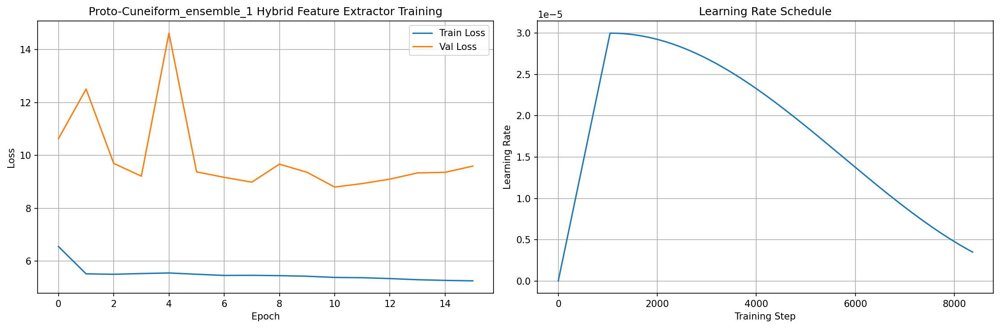

Training completed. Best validation loss: 8.8012 at epoch 11


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Proto-Cuneiform Model 2/5 with seed 43
Created dataset for Proto-Cuneiform: 2089 original images + 6267 augmentations
Created dataset with 8356 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 8.1811 | LR: 0.000000
Train Batch: 20/523 | Loss: 7.8177 | LR: 0.000001
Train Batch: 30/523 | Loss: 8.8677 | LR: 0.000001
Train Batch: 40/523 | Loss: 8.5109 | LR: 0.000001
Train Batch: 50/523 | Loss: 7.9434 | LR: 0.000001
Train Batch: 60/523 | Loss: 7.9935 | LR: 0.000002
Train Batch: 70/523 | Loss: 7.3544 | LR: 0.000002
Contrastive: 6.9150, Variance: 0.9988, Penalty: 2.0021
Train Batch: 80/523 | Loss: 8.0790 | LR: 0.000002
Train Batch: 90/523 | Loss: 7.4659 | LR: 0.000003
Train Batch: 100/523 | Loss: 8.6384 | LR: 0.000003
Train Batch: 110/523 | Loss: 7.5528 | LR: 0.000003
Train Batch: 120/523 | Loss: 8.0341 | LR: 0.000003
Contrastive: 5.9834, Variance: 0.9992, Penalty: 2.0014
Train Batch: 130/523 | Loss: 7.7032 | LR: 0.000004
Train Batch: 140/523 | Loss: 8.2428 | LR: 0.000004
Train Batch: 150/523 | Loss: 7.4328 | LR: 0.000004
Train Batch: 160/523 | Loss: 7.2807 | LR: 0.000005
Train Batch: 170/523 | Loss: 7.4246 | LR: 0.000005
Train Batch: 180/523 | Loss: 6.5

Epoch 1/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 6.5508
Val Loss: 9.2813
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_2_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.4687 | LR: 0.000015
Train Batch: 20/523 | Loss: 5.8117 | LR: 0.000016
Train Batch: 30/523 | Loss: 5.6266 | LR: 0.000016
Contrastive: 4.0253, Variance: 0.9994, Penalty: 2.0010
Train Batch: 40/523 | Loss: 5.8268 | LR: 0.000016
Train Batch: 50/523 | Loss: 5.3299 | LR: 0.000016
Train Batch: 60/523 | Loss: 5.8972 | LR: 0.000017
Train Batch: 70/523 | Loss: 5.1877 | LR: 0.000017
Train Batch: 80/523 | Loss: 4.4728 | LR: 0.000017
Train Batch: 90/523 | Loss: 5.3298 | LR: 0.000018
Train Batch: 100/523 | Loss: 5.7288 | LR: 0.000018
Train Batch: 110/523 | Loss: 5.4650 | LR: 0.000018
Train Batch: 120/523 | Loss: 5.3739 | LR: 0.000018
Train Batch: 130/523 | Loss: 5.2850 | LR: 0.000019
Train Batch: 140/523 | Loss: 5.3862 | LR: 0.000019
Train Batch: 150/523 | Loss: 5.8819 | LR: 0.000019
Train Batch: 160/523 | Loss: 5.5491 | LR: 0.000020
Train Batch: 170/523 | Loss: 5.3743 | LR: 0.000020
Contrastive: 3.6497, Variance: 0.9989, Penalty: 2.0020
Train Batch: 180/523 | Loss: 5.5

Epoch 2/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.5280
Val Loss: 10.9338
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 4.6225 | LR: 0.000030
Train Batch: 20/523 | Loss: 5.5043 | LR: 0.000030
Train Batch: 30/523 | Loss: 4.9245 | LR: 0.000030
Train Batch: 40/523 | Loss: 5.4381 | LR: 0.000030
Train Batch: 50/523 | Loss: 5.4785 | LR: 0.000030
Train Batch: 60/523 | Loss: 5.4965 | LR: 0.000030
Train Batch: 70/523 | Loss: 5.2336 | LR: 0.000030
Train Batch: 80/523 | Loss: 5.1326 | LR: 0.000030
Contrastive: 3.6754, Variance: 0.9988, Penalty: 2.0022
Train Batch: 90/523 | Loss: 5.3456 | LR: 0.000030
Train Batch: 100/523 | Loss: 4.9742 | LR: 0.000030
Train Batch: 110/523 | Loss: 5.5386 | LR: 0.000030
Train Batch: 120/523 | Loss: 5.1092 | LR: 0.000030
Train Batch: 130/523 | Loss: 5.3548 | LR: 0.000030
Train Batch: 140/523 | Loss: 4.9832 | LR: 0.000030
Train Batch: 150/523 | Loss: 4.9489 | LR: 0.000030
Train Batch: 160/523 | Loss: 5.5208 | LR: 0.000030
Train Batch: 170/523 | Loss: 5.7288 | LR: 0.000030
Train Batch: 180/523 | Loss: 5.5997 | LR: 0.000030
Train Batch: 190/523 | Loss: 5.4798 

Epoch 3/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.5742
Val Loss: 12.2934
No improvement for 2 epochs


Epoch 4/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 6.0044 | LR: 0.000030
Train Batch: 20/523 | Loss: 6.1944 | LR: 0.000030
Train Batch: 30/523 | Loss: 6.2828 | LR: 0.000030
Train Batch: 40/523 | Loss: 5.6876 | LR: 0.000030
Train Batch: 50/523 | Loss: 5.2874 | LR: 0.000030
Train Batch: 60/523 | Loss: 6.1408 | LR: 0.000030
Train Batch: 70/523 | Loss: 5.5620 | LR: 0.000030
Train Batch: 80/523 | Loss: 5.8778 | LR: 0.000030
Train Batch: 90/523 | Loss: 5.6023 | LR: 0.000030
Train Batch: 100/523 | Loss: 5.2941 | LR: 0.000030
Train Batch: 110/523 | Loss: 5.3557 | LR: 0.000030
Train Batch: 120/523 | Loss: 4.6343 | LR: 0.000030
Train Batch: 130/523 | Loss: 5.6007 | LR: 0.000030
Train Batch: 140/523 | Loss: 5.7410 | LR: 0.000030
Train Batch: 150/523 | Loss: 5.3990 | LR: 0.000030
Train Batch: 160/523 | Loss: 5.5232 | LR: 0.000030
Train Batch: 170/523 | Loss: 6.0915 | LR: 0.000030
Train Batch: 180/523 | Loss: 5.7023 | LR: 0.000030
Train Batch: 190/523 | Loss: 5.2521 | LR: 0.000030
Train Batch: 200/523 | Loss: 5.8426 | LR

Epoch 4/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.5975
Val Loss: 9.8423
No improvement for 3 epochs


Epoch 5/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.6561 | LR: 0.000029
Train Batch: 20/523 | Loss: 5.8961 | LR: 0.000029
Train Batch: 30/523 | Loss: 6.2816 | LR: 0.000029
Train Batch: 40/523 | Loss: 5.8098 | LR: 0.000029
Train Batch: 50/523 | Loss: 5.7838 | LR: 0.000029
Train Batch: 60/523 | Loss: 5.3844 | LR: 0.000029
Train Batch: 70/523 | Loss: 5.6751 | LR: 0.000029
Train Batch: 80/523 | Loss: 5.1264 | LR: 0.000029
Train Batch: 90/523 | Loss: 5.7182 | LR: 0.000029
Train Batch: 100/523 | Loss: 5.6819 | LR: 0.000029
Train Batch: 110/523 | Loss: 5.6313 | LR: 0.000029
Train Batch: 120/523 | Loss: 5.7919 | LR: 0.000029
Train Batch: 130/523 | Loss: 5.3828 | LR: 0.000029
Train Batch: 140/523 | Loss: 5.8844 | LR: 0.000029
Train Batch: 150/523 | Loss: 5.7470 | LR: 0.000029
Train Batch: 160/523 | Loss: 5.1889 | LR: 0.000029
Train Batch: 170/523 | Loss: 5.3259 | LR: 0.000029
Train Batch: 180/523 | Loss: 5.6683 | LR: 0.000029
Train Batch: 190/523 | Loss: 5.5315 | LR: 0.000029
Train Batch: 200/523 | Loss: 5.4958 | LR

Epoch 5/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5726
Val Loss: 8.9443
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_2_hybrid_extractor_best.pth


Epoch 6/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.2356 | LR: 0.000028
Train Batch: 20/523 | Loss: 5.6167 | LR: 0.000028
Train Batch: 30/523 | Loss: 5.3919 | LR: 0.000028
Train Batch: 40/523 | Loss: 5.3325 | LR: 0.000028
Train Batch: 50/523 | Loss: 5.3833 | LR: 0.000028
Train Batch: 60/523 | Loss: 5.2743 | LR: 0.000028
Train Batch: 70/523 | Loss: 5.5272 | LR: 0.000028
Train Batch: 80/523 | Loss: 5.3979 | LR: 0.000028
Train Batch: 90/523 | Loss: 5.1517 | LR: 0.000028
Train Batch: 100/523 | Loss: 5.3641 | LR: 0.000028
Train Batch: 110/523 | Loss: 5.8559 | LR: 0.000028
Train Batch: 120/523 | Loss: 5.4676 | LR: 0.000028
Train Batch: 130/523 | Loss: 5.5446 | LR: 0.000028
Train Batch: 140/523 | Loss: 4.9737 | LR: 0.000028
Train Batch: 150/523 | Loss: 5.5658 | LR: 0.000028
Train Batch: 160/523 | Loss: 5.5447 | LR: 0.000028
Train Batch: 170/523 | Loss: 5.6643 | LR: 0.000028
Train Batch: 180/523 | Loss: 5.5863 | LR: 0.000028
Train Batch: 190/523 | Loss: 5.2744 | LR: 0.000027
Train Batch: 200/523 | Loss: 5.2862 | LR

Epoch 6/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.4637
Val Loss: 13.3844
No improvement for 1 epochs


Epoch 7/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.9238 | LR: 0.000026
Contrastive: 3.7894, Variance: 0.9974, Penalty: 2.0050
Train Batch: 20/523 | Loss: 5.5664 | LR: 0.000026
Train Batch: 30/523 | Loss: 5.6752 | LR: 0.000026
Train Batch: 40/523 | Loss: 5.7861 | LR: 0.000026
Contrastive: 4.3735, Variance: 0.9983, Penalty: 2.0031
Train Batch: 50/523 | Loss: 5.4926 | LR: 0.000026
Train Batch: 60/523 | Loss: 5.0100 | LR: 0.000026
Train Batch: 70/523 | Loss: 5.7714 | LR: 0.000026
Train Batch: 80/523 | Loss: 5.2261 | LR: 0.000026
Train Batch: 90/523 | Loss: 5.3119 | LR: 0.000026
Train Batch: 100/523 | Loss: 5.4638 | LR: 0.000026
Train Batch: 110/523 | Loss: 5.6100 | LR: 0.000026
Train Batch: 120/523 | Loss: 5.6748 | LR: 0.000026
Train Batch: 130/523 | Loss: 5.2801 | LR: 0.000026
Train Batch: 140/523 | Loss: 5.7631 | LR: 0.000026
Train Batch: 150/523 | Loss: 5.6080 | LR: 0.000026
Train Batch: 160/523 | Loss: 5.4761 | LR: 0.000026
Train Batch: 170/523 | Loss: 5.4460 | LR: 0.000026
Contrastive: 4.0171, Variance: 0

Epoch 7/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 7/20
Train Loss: 5.5026
Val Loss: 8.8534
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_2_hybrid_extractor_best.pth


Epoch 8/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.4685 | LR: 0.000025
Train Batch: 20/523 | Loss: 5.2098 | LR: 0.000025
Train Batch: 30/523 | Loss: 5.1483 | LR: 0.000025
Train Batch: 40/523 | Loss: 5.3157 | LR: 0.000024
Train Batch: 50/523 | Loss: 5.4120 | LR: 0.000024
Train Batch: 60/523 | Loss: 5.5935 | LR: 0.000024
Train Batch: 70/523 | Loss: 5.1875 | LR: 0.000024
Train Batch: 80/523 | Loss: 5.3780 | LR: 0.000024
Train Batch: 90/523 | Loss: 5.2856 | LR: 0.000024
Train Batch: 100/523 | Loss: 5.6194 | LR: 0.000024
Train Batch: 110/523 | Loss: 5.7019 | LR: 0.000024
Train Batch: 120/523 | Loss: 5.3629 | LR: 0.000024
Train Batch: 130/523 | Loss: 5.4244 | LR: 0.000024
Train Batch: 140/523 | Loss: 4.8646 | LR: 0.000024
Contrastive: 3.6659, Variance: 0.9982, Penalty: 2.0035
Train Batch: 150/523 | Loss: 5.7152 | LR: 0.000024
Train Batch: 160/523 | Loss: 5.5486 | LR: 0.000024
Train Batch: 170/523 | Loss: 5.6258 | LR: 0.000024
Train Batch: 180/523 | Loss: 6.2857 | LR: 0.000024
Train Batch: 190/523 | Loss: 5.4289 

Epoch 8/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 8/20
Train Loss: 5.4742
Val Loss: 9.3604
No improvement for 1 epochs


Epoch 9/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.9189 | LR: 0.000022
Train Batch: 20/523 | Loss: 5.5832 | LR: 0.000022
Contrastive: 3.6688, Variance: 0.9993, Penalty: 2.0012
Train Batch: 30/523 | Loss: 5.3897 | LR: 0.000022
Contrastive: 3.9747, Variance: 0.9983, Penalty: 2.0033
Train Batch: 40/523 | Loss: 5.8170 | LR: 0.000022
Contrastive: 3.7964, Variance: 0.9966, Penalty: 2.0066
Train Batch: 50/523 | Loss: 5.4008 | LR: 0.000022
Train Batch: 60/523 | Loss: 6.1180 | LR: 0.000022
Train Batch: 70/523 | Loss: 5.5867 | LR: 0.000022
Train Batch: 80/523 | Loss: 5.7831 | LR: 0.000022
Contrastive: 3.8503, Variance: 0.9982, Penalty: 2.0034
Train Batch: 90/523 | Loss: 5.9899 | LR: 0.000022
Train Batch: 100/523 | Loss: 5.5833 | LR: 0.000022
Train Batch: 110/523 | Loss: 5.6563 | LR: 0.000022
Train Batch: 120/523 | Loss: 6.1893 | LR: 0.000022
Train Batch: 130/523 | Loss: 5.7722 | LR: 0.000022
Train Batch: 140/523 | Loss: 5.1589 | LR: 0.000022
Train Batch: 150/523 | Loss: 5.6073 | LR: 0.000022
Train Batch: 160/523 | L

Epoch 9/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 9/20
Train Loss: 5.5448
Val Loss: 10.9827
No improvement for 2 epochs


Epoch 10/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.8528 | LR: 0.000020
Train Batch: 20/523 | Loss: 5.8416 | LR: 0.000020
Train Batch: 30/523 | Loss: 5.8829 | LR: 0.000020
Train Batch: 40/523 | Loss: 5.7454 | LR: 0.000020
Train Batch: 50/523 | Loss: 5.5304 | LR: 0.000020
Train Batch: 60/523 | Loss: 6.0610 | LR: 0.000020
Train Batch: 70/523 | Loss: 5.8181 | LR: 0.000020
Train Batch: 80/523 | Loss: 4.7703 | LR: 0.000020
Contrastive: 3.9686, Variance: 0.9992, Penalty: 2.0015
Train Batch: 90/523 | Loss: 5.7651 | LR: 0.000020
Train Batch: 100/523 | Loss: 5.4697 | LR: 0.000020
Train Batch: 110/523 | Loss: 5.6073 | LR: 0.000020
Train Batch: 120/523 | Loss: 6.0343 | LR: 0.000020
Contrastive: 3.4799, Variance: 0.9981, Penalty: 2.0036
Train Batch: 130/523 | Loss: 5.5186 | LR: 0.000020
Train Batch: 140/523 | Loss: 5.8060 | LR: 0.000019
Train Batch: 150/523 | Loss: 5.9941 | LR: 0.000019
Train Batch: 160/523 | Loss: 4.7762 | LR: 0.000019
Contrastive: 3.6808, Variance: 0.9986, Penalty: 2.0026
Train Batch: 170/523 | Loss:

Epoch 10/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 10/20
Train Loss: 5.5498
Val Loss: 8.9189
No improvement for 3 epochs


Epoch 11/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.6296 | LR: 0.000018
Train Batch: 20/523 | Loss: 5.4320 | LR: 0.000018
Train Batch: 30/523 | Loss: 5.4343 | LR: 0.000017
Train Batch: 40/523 | Loss: 5.1373 | LR: 0.000017
Train Batch: 50/523 | Loss: 5.5043 | LR: 0.000017
Train Batch: 60/523 | Loss: 5.2800 | LR: 0.000017
Train Batch: 70/523 | Loss: 5.5441 | LR: 0.000017
Train Batch: 80/523 | Loss: 5.6998 | LR: 0.000017
Train Batch: 90/523 | Loss: 5.0585 | LR: 0.000017
Train Batch: 100/523 | Loss: 5.6910 | LR: 0.000017
Train Batch: 110/523 | Loss: 5.6382 | LR: 0.000017
Train Batch: 120/523 | Loss: 5.5519 | LR: 0.000017
Contrastive: 3.3138, Variance: 0.9971, Penalty: 2.0056
Train Batch: 130/523 | Loss: 5.4922 | LR: 0.000017
Train Batch: 140/523 | Loss: 5.7248 | LR: 0.000017
Train Batch: 150/523 | Loss: 5.2413 | LR: 0.000017
Contrastive: 3.7638, Variance: 0.9996, Penalty: 2.0006
Train Batch: 160/523 | Loss: 5.5913 | LR: 0.000017
Train Batch: 170/523 | Loss: 5.3878 | LR: 0.000017
Train Batch: 180/523 | Loss: 5.1

Epoch 11/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 11/20
Train Loss: 5.4259
Val Loss: 8.7174
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_2_hybrid_extractor_best.pth


Epoch 12/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.4145 | LR: 0.000015
Train Batch: 20/523 | Loss: 5.6384 | LR: 0.000015
Train Batch: 30/523 | Loss: 5.5495 | LR: 0.000015
Train Batch: 40/523 | Loss: 5.3701 | LR: 0.000015
Train Batch: 50/523 | Loss: 5.6469 | LR: 0.000015
Train Batch: 60/523 | Loss: 5.3755 | LR: 0.000015
Train Batch: 70/523 | Loss: 5.8006 | LR: 0.000015
Train Batch: 80/523 | Loss: 5.0470 | LR: 0.000015
Train Batch: 90/523 | Loss: 5.2656 | LR: 0.000015
Train Batch: 100/523 | Loss: 5.4450 | LR: 0.000014
Train Batch: 110/523 | Loss: 5.2011 | LR: 0.000014
Train Batch: 120/523 | Loss: 5.1338 | LR: 0.000014
Train Batch: 130/523 | Loss: 5.3464 | LR: 0.000014
Train Batch: 140/523 | Loss: 5.1784 | LR: 0.000014
Train Batch: 150/523 | Loss: 5.5962 | LR: 0.000014
Train Batch: 160/523 | Loss: 5.0515 | LR: 0.000014
Train Batch: 170/523 | Loss: 5.2283 | LR: 0.000014
Train Batch: 180/523 | Loss: 5.2212 | LR: 0.000014
Train Batch: 190/523 | Loss: 5.0346 | LR: 0.000014
Train Batch: 200/523 | Loss: 5.4677 | LR

Epoch 12/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 12/20
Train Loss: 5.3217
Val Loss: 9.1232
No improvement for 1 epochs


Epoch 13/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.0670 | LR: 0.000012
Contrastive: 3.9761, Variance: 0.9991, Penalty: 2.0016
Train Batch: 20/523 | Loss: 5.1766 | LR: 0.000012
Train Batch: 30/523 | Loss: 5.3178 | LR: 0.000012
Train Batch: 40/523 | Loss: 5.5267 | LR: 0.000012
Train Batch: 50/523 | Loss: 5.2329 | LR: 0.000012
Train Batch: 60/523 | Loss: 5.5001 | LR: 0.000012
Train Batch: 70/523 | Loss: 5.1533 | LR: 0.000012
Contrastive: 3.8947, Variance: 0.9988, Penalty: 2.0023
Train Batch: 80/523 | Loss: 5.4101 | LR: 0.000012
Train Batch: 90/523 | Loss: 5.2780 | LR: 0.000012
Contrastive: 3.5774, Variance: 0.9988, Penalty: 2.0022
Contrastive: 3.8313, Variance: 0.9981, Penalty: 2.0035
Train Batch: 100/523 | Loss: 4.9596 | LR: 0.000012
Train Batch: 110/523 | Loss: 5.5026 | LR: 0.000012
Train Batch: 120/523 | Loss: 6.0624 | LR: 0.000012
Train Batch: 130/523 | Loss: 5.6334 | LR: 0.000012
Train Batch: 140/523 | Loss: 5.5427 | LR: 0.000012
Train Batch: 150/523 | Loss: 4.7589 | LR: 0.000012
Train Batch: 160/523 | L

Epoch 13/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 13/20
Train Loss: 5.2961
Val Loss: 9.0293
No improvement for 2 epochs


Epoch 14/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.2319 | LR: 0.000010
Train Batch: 20/523 | Loss: 5.2445 | LR: 0.000010
Train Batch: 30/523 | Loss: 5.1441 | LR: 0.000010
Contrastive: 2.9579, Variance: 0.9990, Penalty: 2.0019
Train Batch: 40/523 | Loss: 5.4098 | LR: 0.000010
Train Batch: 50/523 | Loss: 5.2487 | LR: 0.000010
Train Batch: 60/523 | Loss: 5.3764 | LR: 0.000010
Train Batch: 70/523 | Loss: 5.4269 | LR: 0.000010
Train Batch: 80/523 | Loss: 5.4437 | LR: 0.000009
Train Batch: 90/523 | Loss: 5.0340 | LR: 0.000009
Train Batch: 100/523 | Loss: 5.1169 | LR: 0.000009
Train Batch: 110/523 | Loss: 5.2703 | LR: 0.000009
Train Batch: 120/523 | Loss: 5.3384 | LR: 0.000009
Train Batch: 130/523 | Loss: 5.3456 | LR: 0.000009
Train Batch: 140/523 | Loss: 5.3601 | LR: 0.000009
Train Batch: 150/523 | Loss: 4.7709 | LR: 0.000009
Contrastive: 3.6510, Variance: 0.9993, Penalty: 2.0012
Train Batch: 160/523 | Loss: 5.3589 | LR: 0.000009
Train Batch: 170/523 | Loss: 5.4397 | LR: 0.000009
Train Batch: 180/523 | Loss: 5.6

Epoch 14/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 14/20
Train Loss: 5.2868
Val Loss: 8.9902
No improvement for 3 epochs


Epoch 15/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 4.9192 | LR: 0.000007
Train Batch: 20/523 | Loss: 5.6137 | LR: 0.000007
Train Batch: 30/523 | Loss: 4.8796 | LR: 0.000007
Train Batch: 40/523 | Loss: 5.3953 | LR: 0.000007
Train Batch: 50/523 | Loss: 4.8219 | LR: 0.000007
Train Batch: 60/523 | Loss: 5.2506 | LR: 0.000007
Train Batch: 70/523 | Loss: 5.0656 | LR: 0.000007
Train Batch: 80/523 | Loss: 4.8746 | LR: 0.000007
Train Batch: 90/523 | Loss: 5.3870 | LR: 0.000007
Train Batch: 100/523 | Loss: 5.5011 | LR: 0.000007
Train Batch: 110/523 | Loss: 5.6948 | LR: 0.000007
Train Batch: 120/523 | Loss: 5.2174 | LR: 0.000007
Train Batch: 130/523 | Loss: 5.2609 | LR: 0.000007
Contrastive: 3.7417, Variance: 0.9983, Penalty: 2.0031
Train Batch: 140/523 | Loss: 5.4332 | LR: 0.000007
Train Batch: 150/523 | Loss: 5.6114 | LR: 0.000007
Train Batch: 160/523 | Loss: 4.7286 | LR: 0.000007
Train Batch: 170/523 | Loss: 5.1830 | LR: 0.000007
Train Batch: 180/523 | Loss: 5.3472 | LR: 0.000007
Train Batch: 190/523 | Loss: 5.1736 

Epoch 15/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 15/20
Train Loss: 5.2708
Val Loss: 9.7096
No improvement for 4 epochs


Epoch 16/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.2288 | LR: 0.000005
Train Batch: 20/523 | Loss: 5.3190 | LR: 0.000005
Train Batch: 30/523 | Loss: 5.4089 | LR: 0.000005
Train Batch: 40/523 | Loss: 5.0499 | LR: 0.000005
Train Batch: 50/523 | Loss: 5.2787 | LR: 0.000005
Train Batch: 60/523 | Loss: 5.1773 | LR: 0.000005
Train Batch: 70/523 | Loss: 5.0898 | LR: 0.000005
Train Batch: 80/523 | Loss: 5.3422 | LR: 0.000005
Train Batch: 90/523 | Loss: 5.1742 | LR: 0.000005
Train Batch: 100/523 | Loss: 5.0481 | LR: 0.000005
Train Batch: 110/523 | Loss: 5.0796 | LR: 0.000005
Train Batch: 120/523 | Loss: 5.3138 | LR: 0.000005
Train Batch: 130/523 | Loss: 4.9328 | LR: 0.000005
Train Batch: 140/523 | Loss: 5.0231 | LR: 0.000005
Train Batch: 150/523 | Loss: 5.5335 | LR: 0.000005
Train Batch: 160/523 | Loss: 5.2198 | LR: 0.000005
Train Batch: 170/523 | Loss: 5.3392 | LR: 0.000005
Train Batch: 180/523 | Loss: 5.3796 | LR: 0.000005
Train Batch: 190/523 | Loss: 5.3005 | LR: 0.000005
Train Batch: 200/523 | Loss: 5.3460 | LR

Epoch 16/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 16/20
Train Loss: 5.2265
Val Loss: 9.7583
No improvement for 5 epochs
Early stopping triggered after epoch 16
Final model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_2_hybrid_extractor_final.pth


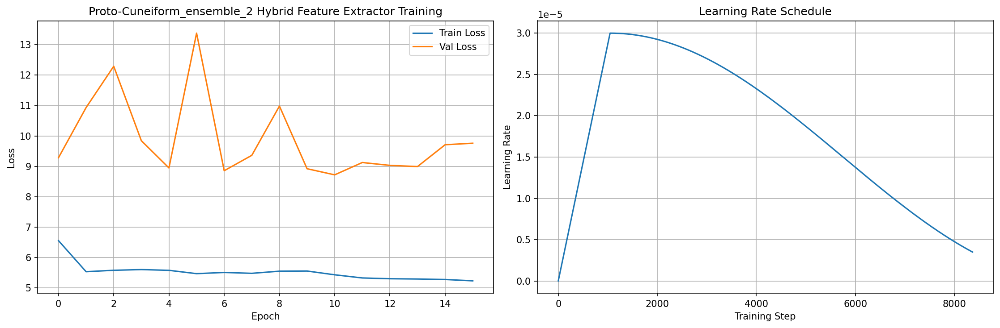

Training completed. Best validation loss: 8.7174 at epoch 11


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Proto-Cuneiform Model 3/5 with seed 44
Created dataset for Proto-Cuneiform: 2089 original images + 6267 augmentations
Created dataset with 8356 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Contrastive: 5.3691, Variance: 0.9998, Penalty: 2.0002
Train Batch: 10/523 | Loss: 8.2072 | LR: 0.000000
Train Batch: 20/523 | Loss: 9.0276 | LR: 0.000001
Train Batch: 30/523 | Loss: 8.8422 | LR: 0.000001
Train Batch: 40/523 | Loss: 7.5301 | LR: 0.000001
Train Batch: 50/523 | Loss: 8.0943 | LR: 0.000001
Train Batch: 60/523 | Loss: 8.1764 | LR: 0.000002
Train Batch: 70/523 | Loss: 7.6116 | LR: 0.000002
Contrastive: 7.0400, Variance: 0.9988, Penalty: 2.0023
Train Batch: 80/523 | Loss: 8.7610 | LR: 0.000002
Train Batch: 90/523 | Loss: 7.8104 | LR: 0.000003
Train Batch: 100/523 | Loss: 8.5334 | LR: 0.000003
Train Batch: 110/523 | Loss: 8.2929 | LR: 0.000003
Train Batch: 120/523 | Loss: 6.7940 | LR: 0.000003
Train Batch: 130/523 | Loss: 8.2656 | LR: 0.000004
Train Batch: 140/523 | Loss: 6.7145 | LR: 0.000004
Contrastive: 6.2254, Variance: 0.9997, Penalty: 2.0004
Train Batch: 150/523 | Loss: 7.8871 | LR: 0.000004
Train Batch: 160/523 | Loss: 7.6708 | LR: 0.000005
Train Batch: 170/523 | Loss:

Epoch 1/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 6.5592
Val Loss: 9.6653
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_3_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.5268 | LR: 0.000015
Train Batch: 20/523 | Loss: 4.8912 | LR: 0.000016
Train Batch: 30/523 | Loss: 5.3390 | LR: 0.000016
Train Batch: 40/523 | Loss: 5.1260 | LR: 0.000016
Train Batch: 50/523 | Loss: 5.1580 | LR: 0.000016
Train Batch: 60/523 | Loss: 5.6173 | LR: 0.000017
Train Batch: 70/523 | Loss: 5.5396 | LR: 0.000017
Train Batch: 80/523 | Loss: 5.2329 | LR: 0.000017
Train Batch: 90/523 | Loss: 5.9040 | LR: 0.000018
Contrastive: 4.6318, Variance: 0.9991, Penalty: 2.0015
Train Batch: 100/523 | Loss: 5.9975 | LR: 0.000018
Contrastive: 3.8655, Variance: 0.9991, Penalty: 2.0016
Train Batch: 110/523 | Loss: 5.3283 | LR: 0.000018
Train Batch: 120/523 | Loss: 5.3770 | LR: 0.000018
Train Batch: 130/523 | Loss: 5.0149 | LR: 0.000019
Train Batch: 140/523 | Loss: 5.3074 | LR: 0.000019
Train Batch: 150/523 | Loss: 5.5520 | LR: 0.000019
Train Batch: 160/523 | Loss: 5.3375 | LR: 0.000020
Contrastive: 3.4994, Variance: 0.9993, Penalty: 2.0013
Train Batch: 170/523 | Loss:

Epoch 2/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.5242
Val Loss: 10.3461
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.6513 | LR: 0.000030
Train Batch: 20/523 | Loss: 5.3267 | LR: 0.000030
Train Batch: 30/523 | Loss: 5.6584 | LR: 0.000030
Train Batch: 40/523 | Loss: 5.1555 | LR: 0.000030
Train Batch: 50/523 | Loss: 5.6212 | LR: 0.000030
Train Batch: 60/523 | Loss: 5.3278 | LR: 0.000030
Train Batch: 70/523 | Loss: 5.2968 | LR: 0.000030
Train Batch: 80/523 | Loss: 5.8441 | LR: 0.000030
Train Batch: 90/523 | Loss: 5.4614 | LR: 0.000030
Train Batch: 100/523 | Loss: 6.1259 | LR: 0.000030
Train Batch: 110/523 | Loss: 5.5143 | LR: 0.000030
Train Batch: 120/523 | Loss: 5.1222 | LR: 0.000030
Contrastive: 3.7413, Variance: 0.9986, Penalty: 2.0026
Train Batch: 130/523 | Loss: 5.4584 | LR: 0.000030
Train Batch: 140/523 | Loss: 6.0265 | LR: 0.000030
Train Batch: 150/523 | Loss: 5.6565 | LR: 0.000030
Train Batch: 160/523 | Loss: 5.5942 | LR: 0.000030
Train Batch: 170/523 | Loss: 5.6653 | LR: 0.000030
Train Batch: 180/523 | Loss: 5.2499 | LR: 0.000030
Train Batch: 190/523 | Loss: 5.9343 

Epoch 3/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.5636
Val Loss: 11.2096
No improvement for 2 epochs


Epoch 4/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.3804 | LR: 0.000030
Train Batch: 20/523 | Loss: 6.0369 | LR: 0.000030
Train Batch: 30/523 | Loss: 6.0583 | LR: 0.000030
Train Batch: 40/523 | Loss: 5.9177 | LR: 0.000030
Train Batch: 50/523 | Loss: 5.1518 | LR: 0.000030
Train Batch: 60/523 | Loss: 6.1688 | LR: 0.000030
Train Batch: 70/523 | Loss: 5.3109 | LR: 0.000030
Train Batch: 80/523 | Loss: 5.3966 | LR: 0.000030
Train Batch: 90/523 | Loss: 6.0829 | LR: 0.000030
Train Batch: 100/523 | Loss: 5.7309 | LR: 0.000030
Train Batch: 110/523 | Loss: 6.1372 | LR: 0.000030
Train Batch: 120/523 | Loss: 5.4928 | LR: 0.000030
Train Batch: 130/523 | Loss: 5.9278 | LR: 0.000030
Contrastive: 3.6576, Variance: 0.9965, Penalty: 2.0069
Train Batch: 140/523 | Loss: 5.3673 | LR: 0.000030
Train Batch: 150/523 | Loss: 5.1481 | LR: 0.000030
Train Batch: 160/523 | Loss: 5.7668 | LR: 0.000030
Train Batch: 170/523 | Loss: 5.1398 | LR: 0.000030
Train Batch: 180/523 | Loss: 5.5832 | LR: 0.000030
Train Batch: 190/523 | Loss: 5.5098 

Epoch 4/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.5484
Val Loss: 13.7314
No improvement for 3 epochs


Epoch 5/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.8496 | LR: 0.000029
Train Batch: 20/523 | Loss: 5.4465 | LR: 0.000029
Train Batch: 30/523 | Loss: 5.3946 | LR: 0.000029
Train Batch: 40/523 | Loss: 6.0073 | LR: 0.000029
Train Batch: 50/523 | Loss: 5.8230 | LR: 0.000029
Train Batch: 60/523 | Loss: 5.7599 | LR: 0.000029
Train Batch: 70/523 | Loss: 5.6097 | LR: 0.000029
Train Batch: 80/523 | Loss: 5.1608 | LR: 0.000029
Train Batch: 90/523 | Loss: 5.4431 | LR: 0.000029
Contrastive: 3.4632, Variance: 0.9992, Penalty: 2.0014
Train Batch: 100/523 | Loss: 5.3780 | LR: 0.000029
Train Batch: 110/523 | Loss: 5.9096 | LR: 0.000029
Train Batch: 120/523 | Loss: 5.3280 | LR: 0.000029
Train Batch: 130/523 | Loss: 5.5617 | LR: 0.000029
Train Batch: 140/523 | Loss: 5.8954 | LR: 0.000029
Train Batch: 150/523 | Loss: 7.0303 | LR: 0.000029
Contrastive: 4.0473, Variance: 0.9988, Penalty: 2.0021
Train Batch: 160/523 | Loss: 5.7638 | LR: 0.000029
Train Batch: 170/523 | Loss: 5.5108 | LR: 0.000029
Contrastive: 4.1800, Variance: 0

Epoch 5/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5325
Val Loss: 9.5455
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_3_hybrid_extractor_best.pth


Epoch 6/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 4.8267 | LR: 0.000028
Train Batch: 20/523 | Loss: 5.4539 | LR: 0.000028
Contrastive: 3.9971, Variance: 0.9990, Penalty: 2.0019
Train Batch: 30/523 | Loss: 5.7136 | LR: 0.000028
Train Batch: 40/523 | Loss: 5.0162 | LR: 0.000028
Train Batch: 50/523 | Loss: 5.3422 | LR: 0.000028
Contrastive: 3.5467, Variance: 0.9992, Penalty: 2.0015
Contrastive: 3.6299, Variance: 0.9995, Penalty: 2.0008
Train Batch: 60/523 | Loss: 5.6091 | LR: 0.000028
Train Batch: 70/523 | Loss: 5.5799 | LR: 0.000028
Train Batch: 80/523 | Loss: 5.2794 | LR: 0.000028
Train Batch: 90/523 | Loss: 5.2834 | LR: 0.000028
Train Batch: 100/523 | Loss: 5.1141 | LR: 0.000028
Train Batch: 110/523 | Loss: 5.2777 | LR: 0.000028
Train Batch: 120/523 | Loss: 5.2318 | LR: 0.000028
Train Batch: 130/523 | Loss: 5.5152 | LR: 0.000028
Train Batch: 140/523 | Loss: 5.2773 | LR: 0.000028
Train Batch: 150/523 | Loss: 5.2905 | LR: 0.000028
Train Batch: 160/523 | Loss: 5.4913 | LR: 0.000028
Train Batch: 170/523 | Loss:

Epoch 6/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.4578
Val Loss: 12.2487
No improvement for 1 epochs


Epoch 7/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.2357 | LR: 0.000026
Train Batch: 20/523 | Loss: 5.7344 | LR: 0.000026
Train Batch: 30/523 | Loss: 5.2383 | LR: 0.000026
Train Batch: 40/523 | Loss: 6.0774 | LR: 0.000026
Train Batch: 50/523 | Loss: 5.7064 | LR: 0.000026
Train Batch: 60/523 | Loss: 5.6322 | LR: 0.000026
Train Batch: 70/523 | Loss: 5.5174 | LR: 0.000026
Train Batch: 80/523 | Loss: 5.4539 | LR: 0.000026
Train Batch: 90/523 | Loss: 5.4756 | LR: 0.000026
Train Batch: 100/523 | Loss: 5.6096 | LR: 0.000026
Train Batch: 110/523 | Loss: 5.7958 | LR: 0.000026
Train Batch: 120/523 | Loss: 5.7413 | LR: 0.000026
Train Batch: 130/523 | Loss: 5.5180 | LR: 0.000026
Train Batch: 140/523 | Loss: 5.4866 | LR: 0.000026
Train Batch: 150/523 | Loss: 5.6362 | LR: 0.000026
Train Batch: 160/523 | Loss: 5.6316 | LR: 0.000026
Train Batch: 170/523 | Loss: 4.7161 | LR: 0.000026
Train Batch: 180/523 | Loss: 5.1034 | LR: 0.000026
Contrastive: 3.9813, Variance: 0.9991, Penalty: 2.0016
Train Batch: 190/523 | Loss: 5.4909 

Epoch 7/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 7/20
Train Loss: 5.4777
Val Loss: 8.8193
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_3_hybrid_extractor_best.pth


Epoch 8/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.1070 | LR: 0.000025
Train Batch: 20/523 | Loss: 5.8653 | LR: 0.000025
Train Batch: 30/523 | Loss: 5.4233 | LR: 0.000025
Train Batch: 40/523 | Loss: 5.1958 | LR: 0.000024
Train Batch: 50/523 | Loss: 5.6538 | LR: 0.000024
Train Batch: 60/523 | Loss: 5.1770 | LR: 0.000024
Train Batch: 70/523 | Loss: 5.3974 | LR: 0.000024
Train Batch: 80/523 | Loss: 5.3170 | LR: 0.000024
Train Batch: 90/523 | Loss: 5.4916 | LR: 0.000024
Train Batch: 100/523 | Loss: 5.4324 | LR: 0.000024
Train Batch: 110/523 | Loss: 5.6254 | LR: 0.000024
Train Batch: 120/523 | Loss: 5.1422 | LR: 0.000024
Contrastive: 3.7450, Variance: 0.9988, Penalty: 2.0023
Train Batch: 130/523 | Loss: 5.6826 | LR: 0.000024
Train Batch: 140/523 | Loss: 5.6884 | LR: 0.000024
Train Batch: 150/523 | Loss: 5.0359 | LR: 0.000024
Train Batch: 160/523 | Loss: 4.8201 | LR: 0.000024
Train Batch: 170/523 | Loss: 5.1343 | LR: 0.000024
Train Batch: 180/523 | Loss: 5.5149 | LR: 0.000024
Train Batch: 190/523 | Loss: 5.6155 

Epoch 8/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 8/20
Train Loss: 5.4125
Val Loss: 8.8839
No improvement for 1 epochs


Epoch 9/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 4.8720 | LR: 0.000022
Train Batch: 20/523 | Loss: 5.2230 | LR: 0.000022
Train Batch: 30/523 | Loss: 5.8070 | LR: 0.000022
Train Batch: 40/523 | Loss: 5.2602 | LR: 0.000022
Train Batch: 50/523 | Loss: 5.4523 | LR: 0.000022
Train Batch: 60/523 | Loss: 5.3545 | LR: 0.000022
Train Batch: 70/523 | Loss: 5.3449 | LR: 0.000022
Train Batch: 80/523 | Loss: 5.6255 | LR: 0.000022
Train Batch: 90/523 | Loss: 5.3307 | LR: 0.000022
Train Batch: 100/523 | Loss: 4.8974 | LR: 0.000022
Train Batch: 110/523 | Loss: 5.4376 | LR: 0.000022
Contrastive: 4.1678, Variance: 0.9993, Penalty: 2.0011
Train Batch: 120/523 | Loss: 5.2077 | LR: 0.000022
Train Batch: 130/523 | Loss: 5.4743 | LR: 0.000022
Train Batch: 140/523 | Loss: 5.5150 | LR: 0.000022
Train Batch: 150/523 | Loss: 5.2754 | LR: 0.000022
Contrastive: 3.5902, Variance: 0.9992, Penalty: 2.0015
Train Batch: 160/523 | Loss: 4.9241 | LR: 0.000022
Train Batch: 170/523 | Loss: 5.2041 | LR: 0.000022
Train Batch: 180/523 | Loss: 5.8

Epoch 9/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]

Contrastive: 5.4775, Variance: 0.4763, Penalty: 4.1980

Epoch 9/20
Train Loss: 5.4215
Val Loss: 9.0395
No improvement for 2 epochs


Epoch 10/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 6.0978 | LR: 0.000020
Train Batch: 20/523 | Loss: 5.5564 | LR: 0.000020
Train Batch: 30/523 | Loss: 5.7502 | LR: 0.000020
Train Batch: 40/523 | Loss: 5.0550 | LR: 0.000020
Train Batch: 50/523 | Loss: 5.1049 | LR: 0.000020
Train Batch: 60/523 | Loss: 5.5260 | LR: 0.000020
Train Batch: 70/523 | Loss: 5.3991 | LR: 0.000020
Train Batch: 80/523 | Loss: 5.6440 | LR: 0.000020
Train Batch: 90/523 | Loss: 5.9473 | LR: 0.000020
Train Batch: 100/523 | Loss: 5.3167 | LR: 0.000020
Train Batch: 110/523 | Loss: 5.3332 | LR: 0.000020
Train Batch: 120/523 | Loss: 5.0029 | LR: 0.000020
Train Batch: 130/523 | Loss: 5.4452 | LR: 0.000020
Train Batch: 140/523 | Loss: 5.4148 | LR: 0.000019
Contrastive: 3.5113, Variance: 0.9995, Penalty: 2.0008
Train Batch: 150/523 | Loss: 5.5121 | LR: 0.000019
Train Batch: 160/523 | Loss: 5.1901 | LR: 0.000019
Train Batch: 170/523 | Loss: 5.2160 | LR: 0.000019
Train Batch: 180/523 | Loss: 5.8661 | LR: 0.000019
Train Batch: 190/523 | Loss: 5.1492 

Epoch 10/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 10/20
Train Loss: 5.3963
Val Loss: 9.0646
No improvement for 3 epochs


Epoch 11/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.4225 | LR: 0.000018
Train Batch: 20/523 | Loss: 5.3235 | LR: 0.000018
Train Batch: 30/523 | Loss: 5.2558 | LR: 0.000017
Train Batch: 40/523 | Loss: 5.7625 | LR: 0.000017
Train Batch: 50/523 | Loss: 5.7599 | LR: 0.000017
Train Batch: 60/523 | Loss: 5.6629 | LR: 0.000017
Train Batch: 70/523 | Loss: 5.8591 | LR: 0.000017
Train Batch: 80/523 | Loss: 5.2846 | LR: 0.000017
Train Batch: 90/523 | Loss: 5.5813 | LR: 0.000017
Train Batch: 100/523 | Loss: 5.1421 | LR: 0.000017
Train Batch: 110/523 | Loss: 4.9889 | LR: 0.000017
Train Batch: 120/523 | Loss: 5.2332 | LR: 0.000017
Train Batch: 130/523 | Loss: 5.7654 | LR: 0.000017
Train Batch: 140/523 | Loss: 5.7161 | LR: 0.000017
Contrastive: 3.6770, Variance: 0.9995, Penalty: 2.0007
Train Batch: 150/523 | Loss: 5.4267 | LR: 0.000017
Train Batch: 160/523 | Loss: 5.0912 | LR: 0.000017
Train Batch: 170/523 | Loss: 5.1374 | LR: 0.000017
Train Batch: 180/523 | Loss: 5.2207 | LR: 0.000017
Train Batch: 190/523 | Loss: 5.2448 

Epoch 11/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 11/20
Train Loss: 5.3387
Val Loss: 9.0373
No improvement for 4 epochs


Epoch 12/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.3560 | LR: 0.000015
Contrastive: 3.3116, Variance: 0.9996, Penalty: 2.0005
Train Batch: 20/523 | Loss: 5.5716 | LR: 0.000015
Train Batch: 30/523 | Loss: 5.3144 | LR: 0.000015
Train Batch: 40/523 | Loss: 5.1714 | LR: 0.000015
Train Batch: 50/523 | Loss: 5.2635 | LR: 0.000015
Train Batch: 60/523 | Loss: 4.8928 | LR: 0.000015
Train Batch: 70/523 | Loss: 5.0939 | LR: 0.000015
Train Batch: 80/523 | Loss: 5.6818 | LR: 0.000015
Train Batch: 90/523 | Loss: 5.1992 | LR: 0.000015
Contrastive: 3.7994, Variance: 0.9991, Penalty: 2.0015
Train Batch: 100/523 | Loss: 5.8676 | LR: 0.000014
Train Batch: 110/523 | Loss: 5.5458 | LR: 0.000014
Train Batch: 120/523 | Loss: 5.3454 | LR: 0.000014
Contrastive: 3.4129, Variance: 0.9995, Penalty: 2.0007
Train Batch: 130/523 | Loss: 5.5002 | LR: 0.000014
Train Batch: 140/523 | Loss: 5.3765 | LR: 0.000014
Train Batch: 150/523 | Loss: 5.1743 | LR: 0.000014
Train Batch: 160/523 | Loss: 5.3301 | LR: 0.000014
Train Batch: 170/523 | Loss:

Epoch 12/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 12/20
Train Loss: 5.3334
Val Loss: 9.0380
No improvement for 5 epochs
Early stopping triggered after epoch 12
Final model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_3_hybrid_extractor_final.pth


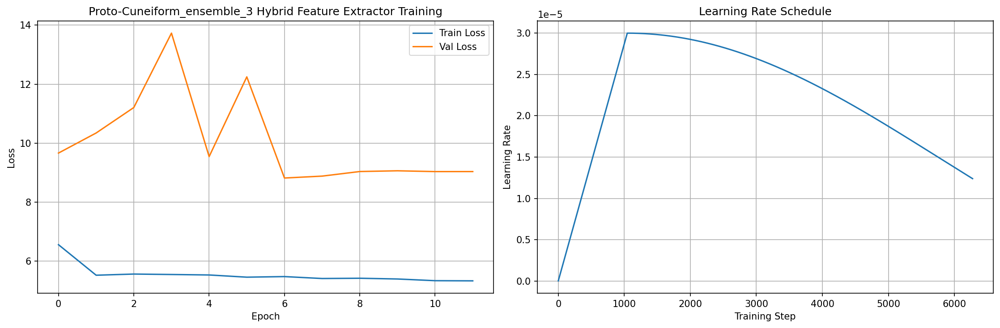

Training completed. Best validation loss: 8.8193 at epoch 7


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Proto-Cuneiform Model 4/5 with seed 45
Created dataset for Proto-Cuneiform: 2089 original images + 6267 augmentations
Created dataset with 8356 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 7.8221 | LR: 0.000000
Train Batch: 20/523 | Loss: 8.3950 | LR: 0.000001
Train Batch: 30/523 | Loss: 9.0654 | LR: 0.000001
Train Batch: 40/523 | Loss: 8.4992 | LR: 0.000001
Train Batch: 50/523 | Loss: 8.0283 | LR: 0.000001
Train Batch: 60/523 | Loss: 8.6645 | LR: 0.000002
Train Batch: 70/523 | Loss: 8.2370 | LR: 0.000002
Train Batch: 80/523 | Loss: 8.2427 | LR: 0.000002
Train Batch: 90/523 | Loss: 8.7199 | LR: 0.000003
Train Batch: 100/523 | Loss: 9.2889 | LR: 0.000003
Train Batch: 110/523 | Loss: 8.1048 | LR: 0.000003
Train Batch: 120/523 | Loss: 7.7835 | LR: 0.000003
Train Batch: 130/523 | Loss: 7.0669 | LR: 0.000004
Train Batch: 140/523 | Loss: 7.7023 | LR: 0.000004
Train Batch: 150/523 | Loss: 7.1611 | LR: 0.000004
Train Batch: 160/523 | Loss: 6.8624 | LR: 0.000005
Train Batch: 170/523 | Loss: 7.0094 | LR: 0.000005
Train Batch: 180/523 | Loss: 6.9002 | LR: 0.000005
Train Batch: 190/523 | Loss: 7.4892 | LR: 0.000005
Train Batch: 200/523 | Loss: 6.2387 | LR

Epoch 1/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 6.5443
Val Loss: 10.8072
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_4_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.7298 | LR: 0.000015
Train Batch: 20/523 | Loss: 5.2112 | LR: 0.000016
Contrastive: 3.9376, Variance: 0.9991, Penalty: 2.0015
Train Batch: 30/523 | Loss: 5.5361 | LR: 0.000016
Train Batch: 40/523 | Loss: 5.7282 | LR: 0.000016
Train Batch: 50/523 | Loss: 5.4051 | LR: 0.000016
Train Batch: 60/523 | Loss: 5.3754 | LR: 0.000017
Train Batch: 70/523 | Loss: 5.4371 | LR: 0.000017
Train Batch: 80/523 | Loss: 5.6406 | LR: 0.000017
Train Batch: 90/523 | Loss: 5.7181 | LR: 0.000018
Train Batch: 100/523 | Loss: 5.3991 | LR: 0.000018
Train Batch: 110/523 | Loss: 5.5739 | LR: 0.000018
Train Batch: 120/523 | Loss: 5.6380 | LR: 0.000018
Train Batch: 130/523 | Loss: 5.8707 | LR: 0.000019
Train Batch: 140/523 | Loss: 5.2359 | LR: 0.000019
Train Batch: 150/523 | Loss: 5.5389 | LR: 0.000019
Train Batch: 160/523 | Loss: 4.9953 | LR: 0.000020
Train Batch: 170/523 | Loss: 6.0653 | LR: 0.000020
Train Batch: 180/523 | Loss: 5.7075 | LR: 0.000020
Train Batch: 190/523 | Loss: 5.6024 

Epoch 2/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]

Contrastive: 4.8029, Variance: 0.3826, Penalty: 5.2256

Epoch 2/20
Train Loss: 5.5562
Val Loss: 11.6265
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.7583 | LR: 0.000030
Train Batch: 20/523 | Loss: 5.1108 | LR: 0.000030
Train Batch: 30/523 | Loss: 5.5848 | LR: 0.000030
Train Batch: 40/523 | Loss: 5.2717 | LR: 0.000030
Train Batch: 50/523 | Loss: 5.3712 | LR: 0.000030
Train Batch: 60/523 | Loss: 5.6004 | LR: 0.000030
Train Batch: 70/523 | Loss: 5.6356 | LR: 0.000030
Train Batch: 80/523 | Loss: 5.8654 | LR: 0.000030
Train Batch: 90/523 | Loss: 5.2696 | LR: 0.000030
Train Batch: 100/523 | Loss: 5.2562 | LR: 0.000030
Train Batch: 110/523 | Loss: 5.2436 | LR: 0.000030
Train Batch: 120/523 | Loss: 5.5255 | LR: 0.000030
Contrastive: 3.2411, Variance: 0.9988, Penalty: 2.0022
Train Batch: 130/523 | Loss: 5.6287 | LR: 0.000030
Contrastive: 3.9675, Variance: 0.9990, Penalty: 2.0017
Contrastive: 3.6831, Variance: 0.9993, Penalty: 2.0013
Train Batch: 140/523 | Loss: 5.3989 | LR: 0.000030
Train Batch: 150/523 | Loss: 5.7521 | LR: 0.000030
Train Batch: 160/523 | Loss: 5.9024 | LR: 0.000030
Contrastive: 3.8549, Varianc

Epoch 3/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.5563
Val Loss: 13.9631
No improvement for 2 epochs


Epoch 4/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.2161 | LR: 0.000030
Train Batch: 20/523 | Loss: 5.2966 | LR: 0.000030
Train Batch: 30/523 | Loss: 5.7652 | LR: 0.000030
Contrastive: 4.0023, Variance: 0.9977, Penalty: 2.0044
Train Batch: 40/523 | Loss: 5.3584 | LR: 0.000030
Train Batch: 50/523 | Loss: 6.2418 | LR: 0.000030
Train Batch: 60/523 | Loss: 5.7162 | LR: 0.000030
Train Batch: 70/523 | Loss: 6.0371 | LR: 0.000030
Train Batch: 80/523 | Loss: 5.5075 | LR: 0.000030
Train Batch: 90/523 | Loss: 5.1426 | LR: 0.000030
Contrastive: 3.7684, Variance: 0.9990, Penalty: 2.0018
Train Batch: 100/523 | Loss: 5.7201 | LR: 0.000030
Train Batch: 110/523 | Loss: 5.7138 | LR: 0.000030
Train Batch: 120/523 | Loss: 5.8901 | LR: 0.000030
Train Batch: 130/523 | Loss: 5.7792 | LR: 0.000030
Contrastive: 3.3077, Variance: 0.9988, Penalty: 2.0023
Train Batch: 140/523 | Loss: 5.8214 | LR: 0.000030
Train Batch: 150/523 | Loss: 6.0014 | LR: 0.000030
Train Batch: 160/523 | Loss: 5.9934 | LR: 0.000030
Train Batch: 170/523 | Loss:

Epoch 4/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.5295
Val Loss: 10.2962
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_4_hybrid_extractor_best.pth


Epoch 5/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.8254 | LR: 0.000029
Contrastive: 3.6702, Variance: 0.9992, Penalty: 2.0014
Train Batch: 20/523 | Loss: 5.6664 | LR: 0.000029
Train Batch: 30/523 | Loss: 5.4543 | LR: 0.000029
Train Batch: 40/523 | Loss: 4.8779 | LR: 0.000029
Train Batch: 50/523 | Loss: 5.4292 | LR: 0.000029
Contrastive: 4.1105, Variance: 0.9989, Penalty: 2.0020
Train Batch: 60/523 | Loss: 5.9208 | LR: 0.000029
Contrastive: 3.8544, Variance: 0.9987, Penalty: 2.0024
Train Batch: 70/523 | Loss: 5.5023 | LR: 0.000029
Train Batch: 80/523 | Loss: 5.3147 | LR: 0.000029
Train Batch: 90/523 | Loss: 5.7388 | LR: 0.000029
Train Batch: 100/523 | Loss: 5.4601 | LR: 0.000029
Train Batch: 110/523 | Loss: 6.1626 | LR: 0.000029
Train Batch: 120/523 | Loss: 4.7449 | LR: 0.000029
Train Batch: 130/523 | Loss: 4.7936 | LR: 0.000029
Train Batch: 140/523 | Loss: 5.5288 | LR: 0.000029
Train Batch: 150/523 | Loss: 5.8725 | LR: 0.000029
Train Batch: 160/523 | Loss: 5.3145 | LR: 0.000029
Train Batch: 170/523 | Loss:

Epoch 5/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.4592
Val Loss: 9.5603
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_4_hybrid_extractor_best.pth


Epoch 6/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.5159 | LR: 0.000028
Train Batch: 20/523 | Loss: 5.1436 | LR: 0.000028
Train Batch: 30/523 | Loss: 5.7165 | LR: 0.000028
Train Batch: 40/523 | Loss: 5.7193 | LR: 0.000028
Train Batch: 50/523 | Loss: 5.5871 | LR: 0.000028
Train Batch: 60/523 | Loss: 5.6282 | LR: 0.000028
Train Batch: 70/523 | Loss: 6.0294 | LR: 0.000028
Train Batch: 80/523 | Loss: 5.4191 | LR: 0.000028
Train Batch: 90/523 | Loss: 5.6568 | LR: 0.000028
Train Batch: 100/523 | Loss: 5.2072 | LR: 0.000028
Contrastive: 3.9488, Variance: 0.9984, Penalty: 2.0029
Train Batch: 110/523 | Loss: 5.2723 | LR: 0.000028
Train Batch: 120/523 | Loss: 5.4532 | LR: 0.000028
Train Batch: 130/523 | Loss: 5.4645 | LR: 0.000028
Train Batch: 140/523 | Loss: 5.6012 | LR: 0.000028
Train Batch: 150/523 | Loss: 5.8398 | LR: 0.000028
Train Batch: 160/523 | Loss: 5.1179 | LR: 0.000028
Train Batch: 170/523 | Loss: 5.3927 | LR: 0.000028
Train Batch: 180/523 | Loss: 5.3403 | LR: 0.000028
Train Batch: 190/523 | Loss: 5.2490 

Epoch 6/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]

Contrastive: 5.6271, Variance: 0.5311, Penalty: 3.7653

Epoch 6/20
Train Loss: 5.5330
Val Loss: 8.9873
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_4_hybrid_extractor_best.pth


Epoch 7/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.5386 | LR: 0.000026
Train Batch: 20/523 | Loss: 5.7587 | LR: 0.000026
Train Batch: 30/523 | Loss: 5.3046 | LR: 0.000026
Train Batch: 40/523 | Loss: 5.2558 | LR: 0.000026
Train Batch: 50/523 | Loss: 5.4746 | LR: 0.000026
Train Batch: 60/523 | Loss: 5.6984 | LR: 0.000026
Train Batch: 70/523 | Loss: 5.2615 | LR: 0.000026
Train Batch: 80/523 | Loss: 5.5532 | LR: 0.000026
Train Batch: 90/523 | Loss: 5.1242 | LR: 0.000026
Train Batch: 100/523 | Loss: 5.4701 | LR: 0.000026
Train Batch: 110/523 | Loss: 5.6859 | LR: 0.000026
Train Batch: 120/523 | Loss: 5.9287 | LR: 0.000026
Train Batch: 130/523 | Loss: 5.3029 | LR: 0.000026
Train Batch: 140/523 | Loss: 5.5054 | LR: 0.000026
Train Batch: 150/523 | Loss: 5.6332 | LR: 0.000026
Train Batch: 160/523 | Loss: 5.2026 | LR: 0.000026
Contrastive: 3.6286, Variance: 0.9992, Penalty: 2.0013
Train Batch: 170/523 | Loss: 5.2062 | LR: 0.000026
Train Batch: 180/523 | Loss: 5.8149 | LR: 0.000026
Train Batch: 190/523 | Loss: 5.0126 

Epoch 7/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 7/20
Train Loss: 5.4571
Val Loss: 9.5712
No improvement for 1 epochs


Epoch 8/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.3479 | LR: 0.000025
Contrastive: 3.6193, Variance: 0.9988, Penalty: 2.0023
Train Batch: 20/523 | Loss: 5.6290 | LR: 0.000025
Train Batch: 30/523 | Loss: 5.1465 | LR: 0.000025
Contrastive: 3.5352, Variance: 0.9988, Penalty: 2.0021
Train Batch: 40/523 | Loss: 5.7298 | LR: 0.000024
Train Batch: 50/523 | Loss: 5.5266 | LR: 0.000024
Contrastive: 3.9457, Variance: 0.9986, Penalty: 2.0027
Train Batch: 60/523 | Loss: 5.4916 | LR: 0.000024
Train Batch: 70/523 | Loss: 5.1539 | LR: 0.000024
Train Batch: 80/523 | Loss: 5.5307 | LR: 0.000024
Train Batch: 90/523 | Loss: 5.5427 | LR: 0.000024
Train Batch: 100/523 | Loss: 5.8389 | LR: 0.000024
Train Batch: 110/523 | Loss: 5.7456 | LR: 0.000024
Train Batch: 120/523 | Loss: 4.7877 | LR: 0.000024
Train Batch: 130/523 | Loss: 5.8174 | LR: 0.000024
Train Batch: 140/523 | Loss: 6.0176 | LR: 0.000024
Train Batch: 150/523 | Loss: 5.6526 | LR: 0.000024
Train Batch: 160/523 | Loss: 5.5044 | LR: 0.000024
Train Batch: 170/523 | Loss:

Epoch 8/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 8/20
Train Loss: 5.4843
Val Loss: 8.9060
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_4_hybrid_extractor_best.pth


Epoch 9/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.3777 | LR: 0.000022
Train Batch: 20/523 | Loss: 5.1797 | LR: 0.000022
Train Batch: 30/523 | Loss: 5.3190 | LR: 0.000022
Train Batch: 40/523 | Loss: 5.4077 | LR: 0.000022
Train Batch: 50/523 | Loss: 5.2012 | LR: 0.000022
Train Batch: 60/523 | Loss: 5.5292 | LR: 0.000022
Train Batch: 70/523 | Loss: 5.3616 | LR: 0.000022
Train Batch: 80/523 | Loss: 5.6552 | LR: 0.000022
Train Batch: 90/523 | Loss: 5.5023 | LR: 0.000022
Train Batch: 100/523 | Loss: 5.1341 | LR: 0.000022
Train Batch: 110/523 | Loss: 5.1519 | LR: 0.000022
Train Batch: 120/523 | Loss: 5.3154 | LR: 0.000022
Train Batch: 130/523 | Loss: 5.6755 | LR: 0.000022
Contrastive: 3.9039, Variance: 0.9994, Penalty: 2.0010
Train Batch: 140/523 | Loss: 5.6922 | LR: 0.000022
Train Batch: 150/523 | Loss: 5.2506 | LR: 0.000022
Train Batch: 160/523 | Loss: 5.7006 | LR: 0.000022
Train Batch: 170/523 | Loss: 5.8446 | LR: 0.000022
Train Batch: 180/523 | Loss: 5.2960 | LR: 0.000022
Train Batch: 190/523 | Loss: 5.6461 

Epoch 9/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 9/20
Train Loss: 5.4268
Val Loss: 8.7738
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_4_hybrid_extractor_best.pth


Epoch 10/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.0712 | LR: 0.000020
Train Batch: 20/523 | Loss: 5.1313 | LR: 0.000020
Train Batch: 30/523 | Loss: 5.4550 | LR: 0.000020
Train Batch: 40/523 | Loss: 5.1391 | LR: 0.000020
Train Batch: 50/523 | Loss: 5.3774 | LR: 0.000020
Train Batch: 60/523 | Loss: 4.9822 | LR: 0.000020
Train Batch: 70/523 | Loss: 5.3040 | LR: 0.000020
Train Batch: 80/523 | Loss: 5.4099 | LR: 0.000020
Train Batch: 90/523 | Loss: 5.5950 | LR: 0.000020
Train Batch: 100/523 | Loss: 5.5359 | LR: 0.000020
Train Batch: 110/523 | Loss: 5.5919 | LR: 0.000020
Train Batch: 120/523 | Loss: 5.3047 | LR: 0.000020
Train Batch: 130/523 | Loss: 5.5704 | LR: 0.000020
Train Batch: 140/523 | Loss: 5.5981 | LR: 0.000019
Train Batch: 150/523 | Loss: 5.7940 | LR: 0.000019
Contrastive: 3.5550, Variance: 0.9987, Penalty: 2.0023
Train Batch: 160/523 | Loss: 5.1702 | LR: 0.000019
Train Batch: 170/523 | Loss: 5.2247 | LR: 0.000019
Train Batch: 180/523 | Loss: 5.0538 | LR: 0.000019
Train Batch: 190/523 | Loss: 5.1090 

Epoch 10/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 10/20
Train Loss: 5.4211
Val Loss: 8.9934
No improvement for 1 epochs


Epoch 11/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 4.8584 | LR: 0.000018
Train Batch: 20/523 | Loss: 5.0243 | LR: 0.000018
Train Batch: 30/523 | Loss: 5.4482 | LR: 0.000017
Train Batch: 40/523 | Loss: 4.7231 | LR: 0.000017
Train Batch: 50/523 | Loss: 5.6149 | LR: 0.000017
Train Batch: 60/523 | Loss: 4.8322 | LR: 0.000017
Contrastive: 3.9457, Variance: 0.9986, Penalty: 2.0026
Train Batch: 70/523 | Loss: 5.2166 | LR: 0.000017
Train Batch: 80/523 | Loss: 5.3329 | LR: 0.000017
Contrastive: 3.6422, Variance: 0.9991, Penalty: 2.0016
Train Batch: 90/523 | Loss: 5.0758 | LR: 0.000017
Train Batch: 100/523 | Loss: 5.3477 | LR: 0.000017
Train Batch: 110/523 | Loss: 5.3261 | LR: 0.000017
Train Batch: 120/523 | Loss: 5.3515 | LR: 0.000017
Train Batch: 130/523 | Loss: 5.4192 | LR: 0.000017
Train Batch: 140/523 | Loss: 5.5815 | LR: 0.000017
Train Batch: 150/523 | Loss: 5.5861 | LR: 0.000017
Contrastive: 3.6926, Variance: 0.9989, Penalty: 2.0021
Train Batch: 160/523 | Loss: 5.1489 | LR: 0.000017
Train Batch: 170/523 | Loss:

Epoch 11/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 11/20
Train Loss: 5.3685
Val Loss: 9.6915
No improvement for 2 epochs


Epoch 12/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.5246 | LR: 0.000015
Train Batch: 20/523 | Loss: 5.2013 | LR: 0.000015
Train Batch: 30/523 | Loss: 5.4939 | LR: 0.000015
Train Batch: 40/523 | Loss: 5.1643 | LR: 0.000015
Train Batch: 50/523 | Loss: 5.0001 | LR: 0.000015
Train Batch: 60/523 | Loss: 5.1595 | LR: 0.000015
Train Batch: 70/523 | Loss: 5.8366 | LR: 0.000015
Train Batch: 80/523 | Loss: 5.4220 | LR: 0.000015
Train Batch: 90/523 | Loss: 5.3359 | LR: 0.000015
Train Batch: 100/523 | Loss: 5.0565 | LR: 0.000014
Train Batch: 110/523 | Loss: 5.2338 | LR: 0.000014
Train Batch: 120/523 | Loss: 5.1332 | LR: 0.000014
Train Batch: 130/523 | Loss: 5.5235 | LR: 0.000014
Train Batch: 140/523 | Loss: 5.5705 | LR: 0.000014
Contrastive: 4.0901, Variance: 0.9994, Penalty: 2.0010
Train Batch: 150/523 | Loss: 5.2642 | LR: 0.000014
Train Batch: 160/523 | Loss: 5.2116 | LR: 0.000014
Train Batch: 170/523 | Loss: 6.0495 | LR: 0.000014
Train Batch: 180/523 | Loss: 5.5129 | LR: 0.000014
Train Batch: 190/523 | Loss: 5.5696 

Epoch 12/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 12/20
Train Loss: 5.3491
Val Loss: 8.9365
No improvement for 3 epochs


Epoch 13/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.2095 | LR: 0.000012
Train Batch: 20/523 | Loss: 4.8170 | LR: 0.000012
Train Batch: 30/523 | Loss: 5.2382 | LR: 0.000012
Train Batch: 40/523 | Loss: 5.2490 | LR: 0.000012
Train Batch: 50/523 | Loss: 4.7358 | LR: 0.000012
Train Batch: 60/523 | Loss: 5.5797 | LR: 0.000012
Train Batch: 70/523 | Loss: 5.0851 | LR: 0.000012
Train Batch: 80/523 | Loss: 5.1544 | LR: 0.000012
Train Batch: 90/523 | Loss: 4.9305 | LR: 0.000012
Train Batch: 100/523 | Loss: 5.3867 | LR: 0.000012
Train Batch: 110/523 | Loss: 5.4181 | LR: 0.000012
Train Batch: 120/523 | Loss: 5.5887 | LR: 0.000012
Train Batch: 130/523 | Loss: 5.2762 | LR: 0.000012
Train Batch: 140/523 | Loss: 5.3217 | LR: 0.000012
Train Batch: 150/523 | Loss: 5.3648 | LR: 0.000012
Train Batch: 160/523 | Loss: 5.1884 | LR: 0.000012
Train Batch: 170/523 | Loss: 5.5152 | LR: 0.000012
Train Batch: 180/523 | Loss: 5.9265 | LR: 0.000012
Contrastive: 4.0166, Variance: 0.9994, Penalty: 2.0010
Train Batch: 190/523 | Loss: 5.3865 

Epoch 13/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 13/20
Train Loss: 5.3089
Val Loss: 9.0216
No improvement for 4 epochs


Epoch 14/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.1296 | LR: 0.000010
Train Batch: 20/523 | Loss: 5.5332 | LR: 0.000010
Train Batch: 30/523 | Loss: 5.3505 | LR: 0.000010
Train Batch: 40/523 | Loss: 5.1561 | LR: 0.000010
Train Batch: 50/523 | Loss: 5.6210 | LR: 0.000010
Train Batch: 60/523 | Loss: 5.2261 | LR: 0.000010
Train Batch: 70/523 | Loss: 5.1121 | LR: 0.000010
Train Batch: 80/523 | Loss: 5.3496 | LR: 0.000009
Train Batch: 90/523 | Loss: 5.3176 | LR: 0.000009
Train Batch: 100/523 | Loss: 5.4142 | LR: 0.000009
Train Batch: 110/523 | Loss: 5.1086 | LR: 0.000009
Contrastive: 4.0646, Variance: 0.9988, Penalty: 2.0023
Train Batch: 120/523 | Loss: 5.7809 | LR: 0.000009
Train Batch: 130/523 | Loss: 5.5663 | LR: 0.000009
Train Batch: 140/523 | Loss: 5.6059 | LR: 0.000009
Train Batch: 150/523 | Loss: 5.5315 | LR: 0.000009
Train Batch: 160/523 | Loss: 5.5805 | LR: 0.000009
Train Batch: 170/523 | Loss: 5.0718 | LR: 0.000009
Contrastive: 3.4386, Variance: 0.9994, Penalty: 2.0010
Train Batch: 180/523 | Loss: 5.5

Epoch 14/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 14/20
Train Loss: 5.3167
Val Loss: 9.3625
No improvement for 5 epochs
Early stopping triggered after epoch 14
Final model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_4_hybrid_extractor_final.pth


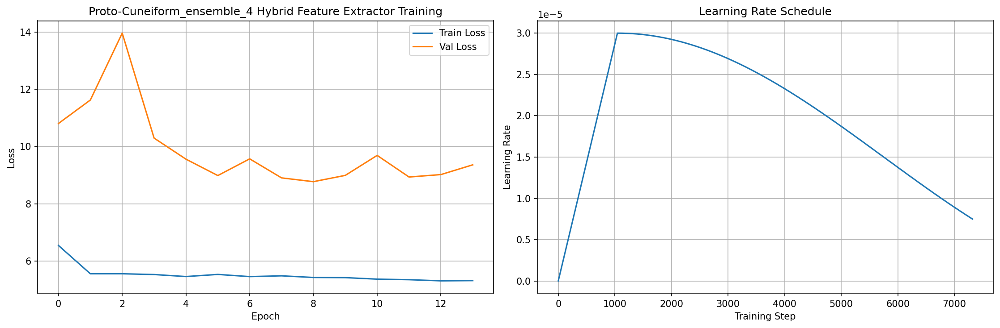

Training completed. Best validation loss: 8.7738 at epoch 9


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Proto-Cuneiform Model 5/5 with seed 46
Created dataset for Proto-Cuneiform: 2089 original images + 6267 augmentations
Created dataset with 8356 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 8.3153 | LR: 0.000000
Train Batch: 20/523 | Loss: 8.6001 | LR: 0.000001
Train Batch: 30/523 | Loss: 7.8557 | LR: 0.000001
Train Batch: 40/523 | Loss: 9.2141 | LR: 0.000001
Train Batch: 50/523 | Loss: 8.9482 | LR: 0.000001
Contrastive: 6.3608, Variance: 0.9992, Penalty: 2.0015
Train Batch: 60/523 | Loss: 8.0811 | LR: 0.000002
Train Batch: 70/523 | Loss: 8.4295 | LR: 0.000002
Train Batch: 80/523 | Loss: 8.0121 | LR: 0.000002
Train Batch: 90/523 | Loss: 7.4356 | LR: 0.000003
Train Batch: 100/523 | Loss: 5.9620 | LR: 0.000003
Train Batch: 110/523 | Loss: 8.6485 | LR: 0.000003
Train Batch: 120/523 | Loss: 7.5258 | LR: 0.000003
Contrastive: 6.1876, Variance: 0.9995, Penalty: 2.0008
Train Batch: 130/523 | Loss: 7.5629 | LR: 0.000004
Train Batch: 140/523 | Loss: 7.5703 | LR: 0.000004
Train Batch: 150/523 | Loss: 6.5055 | LR: 0.000004
Train Batch: 160/523 | Loss: 7.5628 | LR: 0.000005
Train Batch: 170/523 | Loss: 7.5563 | LR: 0.000005
Train Batch: 180/523 | Loss: 6.5

Epoch 1/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 6.5473
Val Loss: 9.2726
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_5_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.7040 | LR: 0.000015
Train Batch: 20/523 | Loss: 5.3158 | LR: 0.000016
Train Batch: 30/523 | Loss: 5.1565 | LR: 0.000016
Train Batch: 40/523 | Loss: 5.9602 | LR: 0.000016
Train Batch: 50/523 | Loss: 5.6173 | LR: 0.000016
Train Batch: 60/523 | Loss: 5.6107 | LR: 0.000017
Train Batch: 70/523 | Loss: 5.0508 | LR: 0.000017
Train Batch: 80/523 | Loss: 5.9745 | LR: 0.000017
Train Batch: 90/523 | Loss: 5.5681 | LR: 0.000018
Train Batch: 100/523 | Loss: 5.5243 | LR: 0.000018
Train Batch: 110/523 | Loss: 5.5416 | LR: 0.000018
Train Batch: 120/523 | Loss: 5.8645 | LR: 0.000018
Train Batch: 130/523 | Loss: 5.4281 | LR: 0.000019
Train Batch: 140/523 | Loss: 5.5799 | LR: 0.000019
Train Batch: 150/523 | Loss: 5.4958 | LR: 0.000019
Train Batch: 160/523 | Loss: 5.4443 | LR: 0.000020
Train Batch: 170/523 | Loss: 5.6869 | LR: 0.000020
Contrastive: 3.1484, Variance: 0.9996, Penalty: 2.0006
Contrastive: 3.7850, Variance: 0.9995, Penalty: 2.0008
Train Batch: 180/523 | Loss: 5.3

Epoch 2/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.5377
Val Loss: 9.7680
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.4061 | LR: 0.000030
Train Batch: 20/523 | Loss: 5.7375 | LR: 0.000030
Train Batch: 30/523 | Loss: 5.1350 | LR: 0.000030
Train Batch: 40/523 | Loss: 5.3007 | LR: 0.000030
Contrastive: 4.4520, Variance: 0.9990, Penalty: 2.0017
Train Batch: 50/523 | Loss: 5.7588 | LR: 0.000030
Train Batch: 60/523 | Loss: 5.7656 | LR: 0.000030
Train Batch: 70/523 | Loss: 5.2941 | LR: 0.000030
Train Batch: 80/523 | Loss: 5.5170 | LR: 0.000030
Train Batch: 90/523 | Loss: 5.0600 | LR: 0.000030
Train Batch: 100/523 | Loss: 5.3964 | LR: 0.000030
Train Batch: 110/523 | Loss: 5.2290 | LR: 0.000030
Train Batch: 120/523 | Loss: 5.5688 | LR: 0.000030
Train Batch: 130/523 | Loss: 5.2490 | LR: 0.000030
Train Batch: 140/523 | Loss: 5.6343 | LR: 0.000030
Train Batch: 150/523 | Loss: 5.1425 | LR: 0.000030
Train Batch: 160/523 | Loss: 5.4492 | LR: 0.000030
Train Batch: 170/523 | Loss: 5.6905 | LR: 0.000030
Contrastive: 4.5129, Variance: 0.9993, Penalty: 2.0012
Train Batch: 180/523 | Loss: 5.1

Epoch 3/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.5054
Val Loss: 11.0622
No improvement for 2 epochs


Epoch 4/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.6584 | LR: 0.000030
Train Batch: 20/523 | Loss: 5.9311 | LR: 0.000030
Train Batch: 30/523 | Loss: 4.8913 | LR: 0.000030
Train Batch: 40/523 | Loss: 4.7498 | LR: 0.000030
Contrastive: 4.0649, Variance: 0.9988, Penalty: 2.0022
Train Batch: 50/523 | Loss: 5.4862 | LR: 0.000030
Train Batch: 60/523 | Loss: 5.9123 | LR: 0.000030
Train Batch: 70/523 | Loss: 5.7480 | LR: 0.000030
Train Batch: 80/523 | Loss: 5.3713 | LR: 0.000030
Train Batch: 90/523 | Loss: 5.6249 | LR: 0.000030
Train Batch: 100/523 | Loss: 5.5437 | LR: 0.000030
Train Batch: 110/523 | Loss: 5.4784 | LR: 0.000030
Train Batch: 120/523 | Loss: 5.6311 | LR: 0.000030
Train Batch: 130/523 | Loss: 5.5231 | LR: 0.000030
Train Batch: 140/523 | Loss: 5.6394 | LR: 0.000030
Train Batch: 150/523 | Loss: 5.9075 | LR: 0.000030
Train Batch: 160/523 | Loss: 5.1427 | LR: 0.000030
Train Batch: 170/523 | Loss: 5.0185 | LR: 0.000030
Train Batch: 180/523 | Loss: 5.3409 | LR: 0.000030
Train Batch: 190/523 | Loss: 5.8452 

Epoch 4/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]

Contrastive: 4.8535, Variance: 0.3975, Penalty: 5.0308

Epoch 4/20
Train Loss: 5.5420
Val Loss: 10.0207
No improvement for 3 epochs


Epoch 5/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.4995 | LR: 0.000029
Train Batch: 20/523 | Loss: 5.2618 | LR: 0.000029
Train Batch: 30/523 | Loss: 5.4245 | LR: 0.000029
Train Batch: 40/523 | Loss: 5.3562 | LR: 0.000029
Train Batch: 50/523 | Loss: 5.6994 | LR: 0.000029
Train Batch: 60/523 | Loss: 5.4530 | LR: 0.000029
Train Batch: 70/523 | Loss: 5.3357 | LR: 0.000029
Contrastive: 3.5314, Variance: 0.9991, Penalty: 2.0015
Train Batch: 80/523 | Loss: 5.7083 | LR: 0.000029
Train Batch: 90/523 | Loss: 5.3098 | LR: 0.000029
Train Batch: 100/523 | Loss: 5.8614 | LR: 0.000029
Train Batch: 110/523 | Loss: 5.1079 | LR: 0.000029
Train Batch: 120/523 | Loss: 6.0462 | LR: 0.000029
Train Batch: 130/523 | Loss: 5.5920 | LR: 0.000029
Train Batch: 140/523 | Loss: 5.7277 | LR: 0.000029
Train Batch: 150/523 | Loss: 5.3458 | LR: 0.000029
Train Batch: 160/523 | Loss: 5.5503 | LR: 0.000029
Train Batch: 170/523 | Loss: 6.1407 | LR: 0.000029
Train Batch: 180/523 | Loss: 5.8890 | LR: 0.000029
Train Batch: 190/523 | Loss: 5.9352 

Epoch 5/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5523
Val Loss: 16.2951
No improvement for 4 epochs


Epoch 6/20 [Train]:   0%|          | 0/523 [00:00<?, ?it/s]

Train Batch: 10/523 | Loss: 5.7810 | LR: 0.000028
Train Batch: 20/523 | Loss: 5.0918 | LR: 0.000028
Contrastive: 3.7064, Variance: 0.9988, Penalty: 2.0023
Train Batch: 30/523 | Loss: 5.6140 | LR: 0.000028
Train Batch: 40/523 | Loss: 5.5314 | LR: 0.000028
Train Batch: 50/523 | Loss: 5.7774 | LR: 0.000028
Train Batch: 60/523 | Loss: 5.5517 | LR: 0.000028
Train Batch: 70/523 | Loss: 5.7934 | LR: 0.000028
Train Batch: 80/523 | Loss: 5.6561 | LR: 0.000028
Train Batch: 90/523 | Loss: 5.1797 | LR: 0.000028
Train Batch: 100/523 | Loss: 5.4118 | LR: 0.000028
Train Batch: 110/523 | Loss: 5.7807 | LR: 0.000028
Train Batch: 120/523 | Loss: 5.4432 | LR: 0.000028
Train Batch: 130/523 | Loss: 5.5099 | LR: 0.000028
Train Batch: 140/523 | Loss: 5.4921 | LR: 0.000028
Train Batch: 150/523 | Loss: 5.7153 | LR: 0.000028
Train Batch: 160/523 | Loss: 6.0840 | LR: 0.000028
Train Batch: 170/523 | Loss: 5.3652 | LR: 0.000028
Train Batch: 180/523 | Loss: 5.2959 | LR: 0.000028
Train Batch: 190/523 | Loss: 6.1956 

Epoch 6/20 [Val]:   0%|          | 0/14 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.4967
Val Loss: 13.9786
No improvement for 5 epochs
Early stopping triggered after epoch 6
Final model saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_5_hybrid_extractor_final.pth


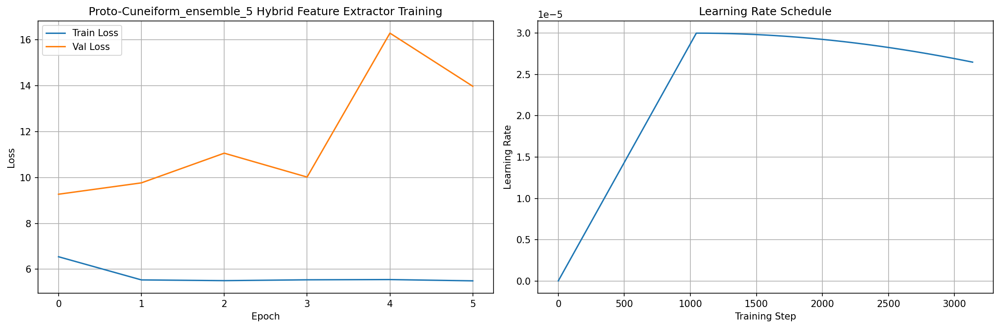

Training completed. Best validation loss: 9.2726 at epoch 1


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Ensemble Training Summary for Proto-Cuneiform
   model_idx  seed  val_loss  epoch  \
0          1    42  8.801243     11   
1          2    43  8.717364     11   
2          3    44  8.819252      7   
3          4    45  8.773778      9   
4          5    46  9.272649      1   

                                          model_path  
0  /content/drive/MyDrive/script_analysis/models/...  
1  /content/drive/MyDrive/script_analysis/models/...  
2  /content/drive/MyDrive/script_analysis/models/...  
3  /content/drive/MyDrive/script_analysis/models/...  
4  /content/drive/MyDrive/script_analysis/models/...  

Average validation loss: 8.8769
Best validation loss: 8.7174
Summary saved to /content/drive/MyDrive/script_analysis/models/Proto-Cuneiform_ensemble/Proto-Cuneiform_ensemble_summary.csv

Training ensemble for Proto-Elamite

Training ensemble of 5 Proto-Elamite models on cuda

Training Proto-Elamite Model 1/5 with seed 42
Created dataset for Proto-Elamite: 1510 original images + 4530 a

Epoch 1/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 8.9676 | LR: 0.000000
Contrastive: 7.2886, Variance: 0.9994, Penalty: 2.0009
Train Batch: 20/378 | Loss: 9.0086 | LR: 0.000001
Train Batch: 30/378 | Loss: 8.9750 | LR: 0.000001
Train Batch: 40/378 | Loss: 8.9573 | LR: 0.000002
Train Batch: 50/378 | Loss: 9.5723 | LR: 0.000002
Train Batch: 60/378 | Loss: 7.5127 | LR: 0.000002
Train Batch: 70/378 | Loss: 7.0202 | LR: 0.000003
Train Batch: 80/378 | Loss: 8.7765 | LR: 0.000003
Train Batch: 90/378 | Loss: 8.0257 | LR: 0.000004
Train Batch: 100/378 | Loss: 7.2322 | LR: 0.000004
Train Batch: 110/378 | Loss: 7.6650 | LR: 0.000004
Train Batch: 120/378 | Loss: 6.7859 | LR: 0.000005
Contrastive: 5.3158, Variance: 0.9992, Penalty: 2.0014
Train Batch: 130/378 | Loss: 7.1700 | LR: 0.000005
Train Batch: 140/378 | Loss: 7.3423 | LR: 0.000006
Train Batch: 150/378 | Loss: 6.2218 | LR: 0.000006
Train Batch: 160/378 | Loss: 6.6669 | LR: 0.000006
Train Batch: 170/378 | Loss: 6.9217 | LR: 0.000007
Train Batch: 180/378 | Loss: 5.5

Epoch 1/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 6.6139
Val Loss: 10.9451
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_1_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Contrastive: 4.3778, Variance: 0.9997, Penalty: 2.0005
Train Batch: 10/378 | Loss: 4.8763 | LR: 0.000015
Train Batch: 20/378 | Loss: 5.2991 | LR: 0.000016
Train Batch: 30/378 | Loss: 5.6592 | LR: 0.000016
Contrastive: 3.6662, Variance: 0.9995, Penalty: 2.0008
Train Batch: 40/378 | Loss: 5.3811 | LR: 0.000017
Train Batch: 50/378 | Loss: 5.5280 | LR: 0.000017
Train Batch: 60/378 | Loss: 5.5589 | LR: 0.000017
Train Batch: 70/378 | Loss: 5.3881 | LR: 0.000018
Train Batch: 80/378 | Loss: 5.3465 | LR: 0.000018
Train Batch: 90/378 | Loss: 5.3746 | LR: 0.000019
Contrastive: 3.7139, Variance: 0.9983, Penalty: 2.0033
Train Batch: 100/378 | Loss: 5.6828 | LR: 0.000019
Train Batch: 110/378 | Loss: 5.2848 | LR: 0.000019
Train Batch: 120/378 | Loss: 5.1959 | LR: 0.000020
Train Batch: 130/378 | Loss: 5.6014 | LR: 0.000020
Train Batch: 140/378 | Loss: 5.2250 | LR: 0.000021
Train Batch: 150/378 | Loss: 5.4848 | LR: 0.000021
Train Batch: 160/378 | Loss: 5.5854 | LR: 0.000021
Train Batch: 170/378 | Loss:

Epoch 2/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.5582
Val Loss: 13.1060
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.7261 | LR: 0.000030
Train Batch: 20/378 | Loss: 5.9330 | LR: 0.000030
Train Batch: 30/378 | Loss: 5.6326 | LR: 0.000030
Train Batch: 40/378 | Loss: 5.8413 | LR: 0.000030
Train Batch: 50/378 | Loss: 5.4202 | LR: 0.000030
Train Batch: 60/378 | Loss: 5.9498 | LR: 0.000030
Train Batch: 70/378 | Loss: 5.4442 | LR: 0.000030
Train Batch: 80/378 | Loss: 5.7851 | LR: 0.000030
Train Batch: 90/378 | Loss: 5.7440 | LR: 0.000030
Train Batch: 100/378 | Loss: 4.9797 | LR: 0.000030
Contrastive: 4.1985, Variance: 0.9979, Penalty: 2.0040
Train Batch: 110/378 | Loss: 5.2295 | LR: 0.000030
Train Batch: 120/378 | Loss: 5.3769 | LR: 0.000030
Train Batch: 130/378 | Loss: 5.5502 | LR: 0.000030
Train Batch: 140/378 | Loss: 5.9093 | LR: 0.000030
Train Batch: 150/378 | Loss: 5.4307 | LR: 0.000030
Train Batch: 160/378 | Loss: 5.1158 | LR: 0.000030
Train Batch: 170/378 | Loss: 4.9508 | LR: 0.000030
Train Batch: 180/378 | Loss: 6.0817 | LR: 0.000030
Train Batch: 190/378 | Loss: 6.1124 

Epoch 3/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.5614
Val Loss: 10.6049
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_1_hybrid_extractor_best.pth


Epoch 4/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Contrastive: 4.4207, Variance: 0.9991, Penalty: 2.0016
Train Batch: 10/378 | Loss: 5.6262 | LR: 0.000030
Contrastive: 3.8107, Variance: 0.9986, Penalty: 2.0025
Train Batch: 20/378 | Loss: 5.2813 | LR: 0.000030
Train Batch: 30/378 | Loss: 5.8188 | LR: 0.000030
Train Batch: 40/378 | Loss: 5.3655 | LR: 0.000030
Train Batch: 50/378 | Loss: 5.5628 | LR: 0.000030
Train Batch: 60/378 | Loss: 5.5233 | LR: 0.000030
Train Batch: 70/378 | Loss: 5.4534 | LR: 0.000030
Train Batch: 80/378 | Loss: 5.5767 | LR: 0.000030
Train Batch: 90/378 | Loss: 5.1213 | LR: 0.000030
Train Batch: 100/378 | Loss: 5.5198 | LR: 0.000030
Train Batch: 110/378 | Loss: 6.0191 | LR: 0.000030
Train Batch: 120/378 | Loss: 5.8989 | LR: 0.000030
Train Batch: 130/378 | Loss: 5.5923 | LR: 0.000030
Train Batch: 140/378 | Loss: 6.0253 | LR: 0.000030
Train Batch: 150/378 | Loss: 4.9691 | LR: 0.000030
Train Batch: 160/378 | Loss: 5.3949 | LR: 0.000030
Train Batch: 170/378 | Loss: 5.6620 | LR: 0.000030
Train Batch: 180/378 | Loss: 5.3

Epoch 4/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.5563
Val Loss: 13.6262
No improvement for 1 epochs


Epoch 5/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.5461 | LR: 0.000029
Train Batch: 20/378 | Loss: 5.9162 | LR: 0.000029
Train Batch: 30/378 | Loss: 5.5822 | LR: 0.000029
Train Batch: 40/378 | Loss: 5.6543 | LR: 0.000029
Train Batch: 50/378 | Loss: 5.6930 | LR: 0.000029
Train Batch: 60/378 | Loss: 4.9248 | LR: 0.000029
Train Batch: 70/378 | Loss: 5.1107 | LR: 0.000029
Train Batch: 80/378 | Loss: 5.5873 | LR: 0.000029
Train Batch: 90/378 | Loss: 5.6611 | LR: 0.000029
Train Batch: 100/378 | Loss: 5.5141 | LR: 0.000029
Train Batch: 110/378 | Loss: 5.6928 | LR: 0.000029
Train Batch: 120/378 | Loss: 5.2946 | LR: 0.000029
Train Batch: 130/378 | Loss: 5.5244 | LR: 0.000029
Train Batch: 140/378 | Loss: 5.6987 | LR: 0.000029
Train Batch: 150/378 | Loss: 5.7280 | LR: 0.000029
Train Batch: 160/378 | Loss: 5.8140 | LR: 0.000029
Train Batch: 170/378 | Loss: 5.6859 | LR: 0.000029
Train Batch: 180/378 | Loss: 5.7185 | LR: 0.000029
Train Batch: 190/378 | Loss: 5.8733 | LR: 0.000029
Train Batch: 200/378 | Loss: 5.5407 | LR

Epoch 5/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5713
Val Loss: 12.0656
No improvement for 2 epochs


Epoch 6/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.7474 | LR: 0.000028
Train Batch: 20/378 | Loss: 5.8204 | LR: 0.000028
Contrastive: 4.0395, Variance: 0.9978, Penalty: 2.0041
Train Batch: 30/378 | Loss: 5.2211 | LR: 0.000028
Train Batch: 40/378 | Loss: 5.2531 | LR: 0.000028
Train Batch: 50/378 | Loss: 5.2737 | LR: 0.000028
Train Batch: 60/378 | Loss: 5.4978 | LR: 0.000028
Train Batch: 70/378 | Loss: 5.2153 | LR: 0.000028
Train Batch: 80/378 | Loss: 5.0215 | LR: 0.000028
Train Batch: 90/378 | Loss: 5.6558 | LR: 0.000028
Train Batch: 100/378 | Loss: 5.2581 | LR: 0.000028
Train Batch: 110/378 | Loss: 5.6609 | LR: 0.000028
Train Batch: 120/378 | Loss: 5.0816 | LR: 0.000028
Train Batch: 130/378 | Loss: 5.6102 | LR: 0.000028
Train Batch: 140/378 | Loss: 6.0485 | LR: 0.000027
Train Batch: 150/378 | Loss: 5.7090 | LR: 0.000027
Train Batch: 160/378 | Loss: 5.9108 | LR: 0.000027
Train Batch: 170/378 | Loss: 5.9619 | LR: 0.000027
Contrastive: 4.0758, Variance: 0.9994, Penalty: 2.0011
Train Batch: 180/378 | Loss: 5.8

Epoch 6/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.5182
Val Loss: 12.0607
No improvement for 3 epochs


Epoch 7/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.5751 | LR: 0.000026
Train Batch: 20/378 | Loss: 5.8084 | LR: 0.000026
Train Batch: 30/378 | Loss: 5.2605 | LR: 0.000026
Train Batch: 40/378 | Loss: 5.4110 | LR: 0.000026
Train Batch: 50/378 | Loss: 5.5297 | LR: 0.000026
Train Batch: 60/378 | Loss: 5.7987 | LR: 0.000026
Train Batch: 70/378 | Loss: 5.8974 | LR: 0.000026
Train Batch: 80/378 | Loss: 5.5671 | LR: 0.000026
Train Batch: 90/378 | Loss: 5.4402 | LR: 0.000026
Contrastive: 3.8364, Variance: 0.9972, Penalty: 2.0054
Train Batch: 100/378 | Loss: 5.5290 | LR: 0.000026
Train Batch: 110/378 | Loss: 5.4686 | LR: 0.000026
Train Batch: 120/378 | Loss: 5.6620 | LR: 0.000026
Train Batch: 130/378 | Loss: 5.7339 | LR: 0.000026
Train Batch: 140/378 | Loss: 5.3979 | LR: 0.000026
Train Batch: 150/378 | Loss: 5.3653 | LR: 0.000026
Train Batch: 160/378 | Loss: 6.2803 | LR: 0.000026
Train Batch: 170/378 | Loss: 4.8664 | LR: 0.000026
Train Batch: 180/378 | Loss: 6.0230 | LR: 0.000026
Contrastive: 3.7439, Variance: 0.998

Epoch 7/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 7/20
Train Loss: 5.5255
Val Loss: 15.2813
No improvement for 4 epochs


Epoch 8/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.9795 | LR: 0.000025
Contrastive: 3.9524, Variance: 0.9981, Penalty: 2.0036
Train Batch: 20/378 | Loss: 5.6712 | LR: 0.000025
Train Batch: 30/378 | Loss: 4.9843 | LR: 0.000024
Contrastive: 3.8007, Variance: 0.9989, Penalty: 2.0019
Contrastive: 3.1363, Variance: 0.9978, Penalty: 2.0042
Train Batch: 40/378 | Loss: 4.8550 | LR: 0.000024
Train Batch: 50/378 | Loss: 4.9149 | LR: 0.000024
Train Batch: 60/378 | Loss: 5.7103 | LR: 0.000024
Train Batch: 70/378 | Loss: 5.3741 | LR: 0.000024
Train Batch: 80/378 | Loss: 5.4195 | LR: 0.000024
Train Batch: 90/378 | Loss: 5.5482 | LR: 0.000024
Train Batch: 100/378 | Loss: 5.3166 | LR: 0.000024
Train Batch: 110/378 | Loss: 5.0403 | LR: 0.000024
Train Batch: 120/378 | Loss: 5.8641 | LR: 0.000024
Train Batch: 130/378 | Loss: 5.4058 | LR: 0.000024
Train Batch: 140/378 | Loss: 5.1917 | LR: 0.000024
Train Batch: 150/378 | Loss: 5.7110 | LR: 0.000024
Train Batch: 160/378 | Loss: 5.6451 | LR: 0.000024
Train Batch: 170/378 | Loss:

Epoch 8/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 8/20
Train Loss: 5.4487
Val Loss: 9.6870
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_1_hybrid_extractor_best.pth


Epoch 9/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.2392 | LR: 0.000022
Train Batch: 20/378 | Loss: 5.0461 | LR: 0.000022
Train Batch: 30/378 | Loss: 5.3184 | LR: 0.000022
Train Batch: 40/378 | Loss: 5.6237 | LR: 0.000022
Train Batch: 50/378 | Loss: 5.2622 | LR: 0.000022
Train Batch: 60/378 | Loss: 5.0090 | LR: 0.000022
Train Batch: 70/378 | Loss: 5.3469 | LR: 0.000022
Train Batch: 80/378 | Loss: 5.3917 | LR: 0.000022
Train Batch: 90/378 | Loss: 4.8299 | LR: 0.000022
Train Batch: 100/378 | Loss: 5.1358 | LR: 0.000022
Contrastive: 3.5361, Variance: 0.9978, Penalty: 2.0042
Contrastive: 3.6904, Variance: 0.9975, Penalty: 2.0049
Train Batch: 110/378 | Loss: 4.9532 | LR: 0.000022
Train Batch: 120/378 | Loss: 5.3109 | LR: 0.000022
Train Batch: 130/378 | Loss: 5.4513 | LR: 0.000022
Train Batch: 140/378 | Loss: 5.3994 | LR: 0.000022
Train Batch: 150/378 | Loss: 5.2197 | LR: 0.000022
Train Batch: 160/378 | Loss: 5.3871 | LR: 0.000022
Train Batch: 170/378 | Loss: 5.5941 | LR: 0.000021
Train Batch: 180/378 | Loss: 5.4

Epoch 9/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 9/20
Train Loss: 5.4047
Val Loss: 9.9569
No improvement for 1 epochs


Epoch 10/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.7793 | LR: 0.000020
Train Batch: 20/378 | Loss: 5.2467 | LR: 0.000020
Contrastive: 4.0219, Variance: 0.9984, Penalty: 2.0030
Train Batch: 30/378 | Loss: 5.1999 | LR: 0.000020
Train Batch: 40/378 | Loss: 5.2013 | LR: 0.000020
Train Batch: 50/378 | Loss: 5.1140 | LR: 0.000020
Train Batch: 60/378 | Loss: 5.3405 | LR: 0.000020
Train Batch: 70/378 | Loss: 5.4256 | LR: 0.000020
Train Batch: 80/378 | Loss: 5.4780 | LR: 0.000020
Train Batch: 90/378 | Loss: 5.5285 | LR: 0.000020
Train Batch: 100/378 | Loss: 5.6510 | LR: 0.000019
Train Batch: 110/378 | Loss: 5.7806 | LR: 0.000019
Train Batch: 120/378 | Loss: 5.4982 | LR: 0.000019
Train Batch: 130/378 | Loss: 5.3260 | LR: 0.000019
Train Batch: 140/378 | Loss: 5.6000 | LR: 0.000019
Train Batch: 150/378 | Loss: 5.7024 | LR: 0.000019
Train Batch: 160/378 | Loss: 5.3665 | LR: 0.000019
Train Batch: 170/378 | Loss: 5.6581 | LR: 0.000019
Train Batch: 180/378 | Loss: 5.2017 | LR: 0.000019
Train Batch: 190/378 | Loss: 5.0762 

Epoch 10/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 10/20
Train Loss: 5.4496
Val Loss: 9.8450
No improvement for 2 epochs


Epoch 11/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.2587 | LR: 0.000018
Train Batch: 20/378 | Loss: 5.7357 | LR: 0.000017
Train Batch: 30/378 | Loss: 5.2675 | LR: 0.000017
Train Batch: 40/378 | Loss: 5.7088 | LR: 0.000017
Train Batch: 50/378 | Loss: 5.2104 | LR: 0.000017
Train Batch: 60/378 | Loss: 5.4661 | LR: 0.000017
Train Batch: 70/378 | Loss: 6.2148 | LR: 0.000017
Train Batch: 80/378 | Loss: 5.0494 | LR: 0.000017
Train Batch: 90/378 | Loss: 4.9698 | LR: 0.000017
Train Batch: 100/378 | Loss: 5.3093 | LR: 0.000017
Train Batch: 110/378 | Loss: 5.5991 | LR: 0.000017
Train Batch: 120/378 | Loss: 5.6786 | LR: 0.000017
Train Batch: 130/378 | Loss: 5.7252 | LR: 0.000017
Train Batch: 140/378 | Loss: 5.3474 | LR: 0.000017
Train Batch: 150/378 | Loss: 4.7712 | LR: 0.000017
Contrastive: 3.6104, Variance: 0.9989, Penalty: 2.0021
Train Batch: 160/378 | Loss: 5.4489 | LR: 0.000017
Train Batch: 170/378 | Loss: 5.1280 | LR: 0.000016
Train Batch: 180/378 | Loss: 5.6239 | LR: 0.000016
Train Batch: 190/378 | Loss: 5.6848 

Epoch 11/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 11/20
Train Loss: 5.3918
Val Loss: 9.4880
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_1_hybrid_extractor_best.pth


Epoch 12/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.3022 | LR: 0.000015
Train Batch: 20/378 | Loss: 5.1287 | LR: 0.000015
Train Batch: 30/378 | Loss: 5.2528 | LR: 0.000015
Train Batch: 40/378 | Loss: 5.3534 | LR: 0.000015
Train Batch: 50/378 | Loss: 5.2386 | LR: 0.000015
Train Batch: 60/378 | Loss: 5.1082 | LR: 0.000015
Train Batch: 70/378 | Loss: 5.2715 | LR: 0.000015
Train Batch: 80/378 | Loss: 5.0327 | LR: 0.000014
Contrastive: 3.4913, Variance: 0.9982, Penalty: 2.0033
Contrastive: 3.7196, Variance: 0.9988, Penalty: 2.0023
Train Batch: 90/378 | Loss: 5.4479 | LR: 0.000014
Contrastive: 3.3351, Variance: 0.9978, Penalty: 2.0043
Contrastive: 3.9264, Variance: 0.9983, Penalty: 2.0032
Train Batch: 100/378 | Loss: 5.5158 | LR: 0.000014
Train Batch: 110/378 | Loss: 5.6873 | LR: 0.000014
Train Batch: 120/378 | Loss: 5.1952 | LR: 0.000014
Train Batch: 130/378 | Loss: 5.1872 | LR: 0.000014
Train Batch: 140/378 | Loss: 5.3054 | LR: 0.000014
Train Batch: 150/378 | Loss: 4.9689 | LR: 0.000014
Train Batch: 160/378 | L

Epoch 12/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 12/20
Train Loss: 5.3540
Val Loss: 9.7591
No improvement for 1 epochs


Epoch 13/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.6986 | LR: 0.000012
Train Batch: 20/378 | Loss: 5.1321 | LR: 0.000012
Train Batch: 30/378 | Loss: 5.3559 | LR: 0.000012
Train Batch: 40/378 | Loss: 5.4836 | LR: 0.000012
Train Batch: 50/378 | Loss: 5.2649 | LR: 0.000012
Train Batch: 60/378 | Loss: 5.1781 | LR: 0.000012
Train Batch: 70/378 | Loss: 5.3363 | LR: 0.000012
Contrastive: 3.5709, Variance: 0.9989, Penalty: 2.0021
Train Batch: 80/378 | Loss: 4.9738 | LR: 0.000012
Train Batch: 90/378 | Loss: 5.4678 | LR: 0.000012
Train Batch: 100/378 | Loss: 5.0356 | LR: 0.000012
Train Batch: 110/378 | Loss: 5.9152 | LR: 0.000012
Train Batch: 120/378 | Loss: 4.9173 | LR: 0.000012
Train Batch: 130/378 | Loss: 5.0908 | LR: 0.000012
Train Batch: 140/378 | Loss: 5.1884 | LR: 0.000011
Train Batch: 150/378 | Loss: 6.1296 | LR: 0.000011
Train Batch: 160/378 | Loss: 5.3218 | LR: 0.000011
Train Batch: 170/378 | Loss: 5.3566 | LR: 0.000011
Train Batch: 180/378 | Loss: 5.3574 | LR: 0.000011
Train Batch: 190/378 | Loss: 5.0772 

Epoch 13/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 13/20
Train Loss: 5.3783
Val Loss: 9.4655
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_1_hybrid_extractor_best.pth


Epoch 14/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.6625 | LR: 0.000010
Train Batch: 20/378 | Loss: 5.3787 | LR: 0.000010
Train Batch: 30/378 | Loss: 5.6157 | LR: 0.000010
Train Batch: 40/378 | Loss: 5.2175 | LR: 0.000010
Train Batch: 50/378 | Loss: 5.3653 | LR: 0.000010
Contrastive: 3.7477, Variance: 0.9991, Penalty: 2.0016
Train Batch: 60/378 | Loss: 5.3798 | LR: 0.000009
Train Batch: 70/378 | Loss: 5.1487 | LR: 0.000009
Train Batch: 80/378 | Loss: 5.1748 | LR: 0.000009
Train Batch: 90/378 | Loss: 5.4135 | LR: 0.000009
Train Batch: 100/378 | Loss: 5.2036 | LR: 0.000009
Train Batch: 110/378 | Loss: 5.1966 | LR: 0.000009
Train Batch: 120/378 | Loss: 5.3034 | LR: 0.000009
Train Batch: 130/378 | Loss: 5.2734 | LR: 0.000009
Train Batch: 140/378 | Loss: 5.6395 | LR: 0.000009
Train Batch: 150/378 | Loss: 5.0511 | LR: 0.000009
Train Batch: 160/378 | Loss: 5.6044 | LR: 0.000009
Train Batch: 170/378 | Loss: 5.1538 | LR: 0.000009
Train Batch: 180/378 | Loss: 5.2853 | LR: 0.000009
Contrastive: 3.6894, Variance: 0.998

Epoch 14/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 14/20
Train Loss: 5.2997
Val Loss: 9.6672
No improvement for 1 epochs


Epoch 15/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 4.8725 | LR: 0.000007
Train Batch: 20/378 | Loss: 5.1384 | LR: 0.000007
Train Batch: 30/378 | Loss: 5.0066 | LR: 0.000007
Train Batch: 40/378 | Loss: 4.6054 | LR: 0.000007
Train Batch: 50/378 | Loss: 5.3756 | LR: 0.000007
Train Batch: 60/378 | Loss: 4.9227 | LR: 0.000007
Contrastive: 3.2925, Variance: 0.9991, Penalty: 2.0015
Train Batch: 70/378 | Loss: 5.9227 | LR: 0.000007
Train Batch: 80/378 | Loss: 4.9487 | LR: 0.000007
Train Batch: 90/378 | Loss: 5.3848 | LR: 0.000007
Train Batch: 100/378 | Loss: 5.2786 | LR: 0.000007
Train Batch: 110/378 | Loss: 5.2516 | LR: 0.000007
Train Batch: 120/378 | Loss: 5.0778 | LR: 0.000007
Train Batch: 130/378 | Loss: 5.2326 | LR: 0.000007
Train Batch: 140/378 | Loss: 5.2478 | LR: 0.000007
Train Batch: 150/378 | Loss: 4.7852 | LR: 0.000007
Train Batch: 160/378 | Loss: 5.0316 | LR: 0.000007
Train Batch: 170/378 | Loss: 4.8931 | LR: 0.000007
Contrastive: 3.9491, Variance: 0.9961, Penalty: 2.0075
Train Batch: 180/378 | Loss: 5.3

Epoch 15/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 15/20
Train Loss: 5.2875
Val Loss: 9.7062
No improvement for 2 epochs


Epoch 16/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.3394 | LR: 0.000005
Train Batch: 20/378 | Loss: 5.2668 | LR: 0.000005
Train Batch: 30/378 | Loss: 4.8974 | LR: 0.000005
Train Batch: 40/378 | Loss: 5.3710 | LR: 0.000005
Train Batch: 50/378 | Loss: 4.8559 | LR: 0.000005
Contrastive: 3.4724, Variance: 0.9989, Penalty: 2.0021
Train Batch: 60/378 | Loss: 5.1882 | LR: 0.000005
Train Batch: 70/378 | Loss: 5.4899 | LR: 0.000005
Train Batch: 80/378 | Loss: 5.2729 | LR: 0.000005
Train Batch: 90/378 | Loss: 5.0268 | LR: 0.000005
Train Batch: 100/378 | Loss: 5.5197 | LR: 0.000005
Train Batch: 110/378 | Loss: 5.3303 | LR: 0.000005
Train Batch: 120/378 | Loss: 5.0318 | LR: 0.000005
Train Batch: 130/378 | Loss: 5.3701 | LR: 0.000005
Train Batch: 140/378 | Loss: 5.5844 | LR: 0.000005
Contrastive: 3.3114, Variance: 0.9985, Penalty: 2.0029
Train Batch: 150/378 | Loss: 5.1164 | LR: 0.000005
Train Batch: 160/378 | Loss: 5.1415 | LR: 0.000005
Train Batch: 170/378 | Loss: 4.9962 | LR: 0.000004
Train Batch: 180/378 | Loss: 5.4

Epoch 16/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 16/20
Train Loss: 5.2794
Val Loss: 9.5735
No improvement for 3 epochs


Epoch 17/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.1349 | LR: 0.000003
Train Batch: 20/378 | Loss: 5.2327 | LR: 0.000003
Train Batch: 30/378 | Loss: 5.3247 | LR: 0.000003
Train Batch: 40/378 | Loss: 5.2325 | LR: 0.000003
Train Batch: 50/378 | Loss: 5.3970 | LR: 0.000003
Train Batch: 60/378 | Loss: 5.0292 | LR: 0.000003
Train Batch: 70/378 | Loss: 5.0233 | LR: 0.000003
Train Batch: 80/378 | Loss: 4.9858 | LR: 0.000003
Train Batch: 90/378 | Loss: 5.0712 | LR: 0.000003
Train Batch: 100/378 | Loss: 5.4683 | LR: 0.000003
Train Batch: 110/378 | Loss: 4.8392 | LR: 0.000003
Train Batch: 120/378 | Loss: 5.2248 | LR: 0.000003
Train Batch: 130/378 | Loss: 5.1659 | LR: 0.000003
Train Batch: 140/378 | Loss: 5.4076 | LR: 0.000003
Train Batch: 150/378 | Loss: 5.2102 | LR: 0.000003
Train Batch: 160/378 | Loss: 5.3431 | LR: 0.000003
Train Batch: 170/378 | Loss: 5.2624 | LR: 0.000003
Train Batch: 180/378 | Loss: 5.1352 | LR: 0.000003
Train Batch: 190/378 | Loss: 5.0633 | LR: 0.000003
Train Batch: 200/378 | Loss: 5.4032 | LR

Epoch 17/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 17/20
Train Loss: 5.2361
Val Loss: 9.9946
No improvement for 4 epochs


Epoch 18/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.2642 | LR: 0.000002
Train Batch: 20/378 | Loss: 5.4052 | LR: 0.000002
Train Batch: 30/378 | Loss: 5.2042 | LR: 0.000002
Contrastive: 3.4817, Variance: 0.9994, Penalty: 2.0009
Train Batch: 40/378 | Loss: 5.6472 | LR: 0.000002
Train Batch: 50/378 | Loss: 5.1616 | LR: 0.000002
Train Batch: 60/378 | Loss: 5.2308 | LR: 0.000002
Train Batch: 70/378 | Loss: 5.4068 | LR: 0.000002
Train Batch: 80/378 | Loss: 5.4371 | LR: 0.000002
Train Batch: 90/378 | Loss: 5.0219 | LR: 0.000002
Train Batch: 100/378 | Loss: 5.0584 | LR: 0.000002
Train Batch: 110/378 | Loss: 5.0706 | LR: 0.000002
Train Batch: 120/378 | Loss: 5.5359 | LR: 0.000002
Train Batch: 130/378 | Loss: 4.8458 | LR: 0.000002
Contrastive: 3.4365, Variance: 0.9994, Penalty: 2.0010
Train Batch: 140/378 | Loss: 5.1512 | LR: 0.000002
Train Batch: 150/378 | Loss: 5.0716 | LR: 0.000002
Train Batch: 160/378 | Loss: 5.1290 | LR: 0.000001
Train Batch: 170/378 | Loss: 5.3657 | LR: 0.000001
Train Batch: 180/378 | Loss: 5.3

Epoch 18/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 18/20
Train Loss: 5.2316
Val Loss: 10.2560
No improvement for 5 epochs
Early stopping triggered after epoch 18
Final model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_1_hybrid_extractor_final.pth


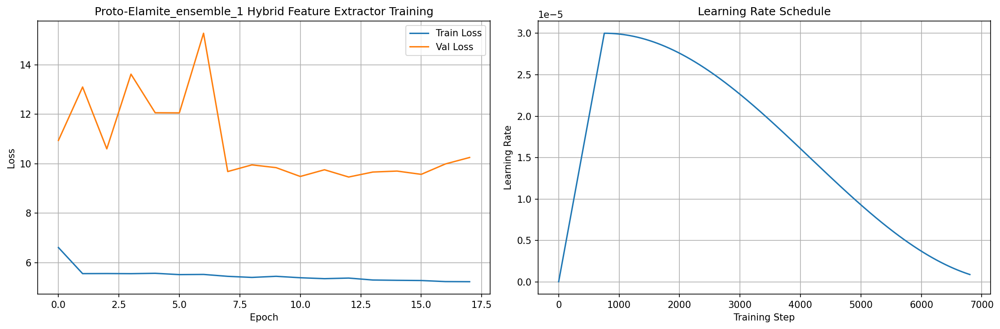

Training completed. Best validation loss: 9.4655 at epoch 13


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Proto-Elamite Model 2/5 with seed 43
Created dataset for Proto-Elamite: 1510 original images + 4530 augmentations
Created dataset with 6040 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 8.3195 | LR: 0.000000
Train Batch: 20/378 | Loss: 7.5748 | LR: 0.000001
Train Batch: 30/378 | Loss: 9.3603 | LR: 0.000001
Train Batch: 40/378 | Loss: 8.4131 | LR: 0.000002
Train Batch: 50/378 | Loss: 8.8512 | LR: 0.000002
Train Batch: 60/378 | Loss: 8.2360 | LR: 0.000002
Train Batch: 70/378 | Loss: 7.3801 | LR: 0.000003
Contrastive: 6.9399, Variance: 0.9993, Penalty: 2.0012
Train Batch: 80/378 | Loss: 7.5447 | LR: 0.000003
Train Batch: 90/378 | Loss: 7.3961 | LR: 0.000004
Train Batch: 100/378 | Loss: 8.0077 | LR: 0.000004
Train Batch: 110/378 | Loss: 7.8779 | LR: 0.000004
Train Batch: 120/378 | Loss: 7.8435 | LR: 0.000005
Contrastive: 5.8391, Variance: 0.9988, Penalty: 2.0023
Train Batch: 130/378 | Loss: 7.5596 | LR: 0.000005
Train Batch: 140/378 | Loss: 7.2975 | LR: 0.000006
Train Batch: 150/378 | Loss: 6.7310 | LR: 0.000006
Train Batch: 160/378 | Loss: 7.0013 | LR: 0.000006
Train Batch: 170/378 | Loss: 7.2406 | LR: 0.000007
Train Batch: 180/378 | Loss: 5.5

Epoch 1/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 6.6600
Val Loss: 11.2437
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_2_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Contrastive: 3.7482, Variance: 0.9994, Penalty: 2.0010
Train Batch: 10/378 | Loss: 5.4633 | LR: 0.000015
Train Batch: 20/378 | Loss: 5.3785 | LR: 0.000016
Train Batch: 30/378 | Loss: 5.7023 | LR: 0.000016
Train Batch: 40/378 | Loss: 5.4616 | LR: 0.000017
Train Batch: 50/378 | Loss: 5.5420 | LR: 0.000017
Train Batch: 60/378 | Loss: 5.2485 | LR: 0.000017
Train Batch: 70/378 | Loss: 5.6309 | LR: 0.000018
Train Batch: 80/378 | Loss: 5.9445 | LR: 0.000018
Train Batch: 90/378 | Loss: 5.6244 | LR: 0.000019
Train Batch: 100/378 | Loss: 5.3913 | LR: 0.000019
Train Batch: 110/378 | Loss: 5.1244 | LR: 0.000019
Train Batch: 120/378 | Loss: 5.8747 | LR: 0.000020
Train Batch: 130/378 | Loss: 5.5950 | LR: 0.000020
Train Batch: 140/378 | Loss: 5.3124 | LR: 0.000021
Train Batch: 150/378 | Loss: 5.4606 | LR: 0.000021
Train Batch: 160/378 | Loss: 5.5748 | LR: 0.000021
Train Batch: 170/378 | Loss: 5.3944 | LR: 0.000022
Train Batch: 180/378 | Loss: 5.5280 | LR: 0.000022
Contrastive: 3.6302, Variance: 0.998

Epoch 2/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.5587
Val Loss: 13.5341
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.6238 | LR: 0.000030
Train Batch: 20/378 | Loss: 5.6255 | LR: 0.000030
Train Batch: 30/378 | Loss: 5.3115 | LR: 0.000030
Train Batch: 40/378 | Loss: 5.6783 | LR: 0.000030
Train Batch: 50/378 | Loss: 5.6128 | LR: 0.000030
Train Batch: 60/378 | Loss: 5.3588 | LR: 0.000030
Train Batch: 70/378 | Loss: 5.8134 | LR: 0.000030
Train Batch: 80/378 | Loss: 5.5949 | LR: 0.000030
Train Batch: 90/378 | Loss: 5.4247 | LR: 0.000030
Train Batch: 100/378 | Loss: 5.7674 | LR: 0.000030
Train Batch: 110/378 | Loss: 5.4796 | LR: 0.000030
Train Batch: 120/378 | Loss: 6.2907 | LR: 0.000030
Contrastive: 4.1654, Variance: 0.9988, Penalty: 2.0022
Train Batch: 130/378 | Loss: 5.7358 | LR: 0.000030
Train Batch: 140/378 | Loss: 5.5382 | LR: 0.000030
Train Batch: 150/378 | Loss: 5.4508 | LR: 0.000030
Contrastive: 3.9310, Variance: 0.9973, Penalty: 2.0053
Train Batch: 160/378 | Loss: 5.3656 | LR: 0.000030
Train Batch: 170/378 | Loss: 5.6932 | LR: 0.000030
Train Batch: 180/378 | Loss: 5.0

Epoch 3/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]

Contrastive: 4.6693, Variance: 0.2758, Penalty: 7.2501

Epoch 3/20
Train Loss: 5.5689
Val Loss: 12.2650
No improvement for 2 epochs


Epoch 4/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.2306 | LR: 0.000030
Train Batch: 20/378 | Loss: 5.1444 | LR: 0.000030
Train Batch: 30/378 | Loss: 5.3910 | LR: 0.000030
Train Batch: 40/378 | Loss: 5.2678 | LR: 0.000030
Train Batch: 50/378 | Loss: 5.3005 | LR: 0.000030
Train Batch: 60/378 | Loss: 5.3463 | LR: 0.000030
Train Batch: 70/378 | Loss: 5.0647 | LR: 0.000030
Train Batch: 80/378 | Loss: 5.3291 | LR: 0.000030
Train Batch: 90/378 | Loss: 5.8574 | LR: 0.000030
Train Batch: 100/378 | Loss: 5.0748 | LR: 0.000030
Train Batch: 110/378 | Loss: 5.5515 | LR: 0.000030
Train Batch: 120/378 | Loss: 5.8535 | LR: 0.000030
Train Batch: 130/378 | Loss: 5.3459 | LR: 0.000030
Train Batch: 140/378 | Loss: 5.7515 | LR: 0.000030
Train Batch: 150/378 | Loss: 5.5807 | LR: 0.000030
Train Batch: 160/378 | Loss: 5.0923 | LR: 0.000030
Train Batch: 170/378 | Loss: 5.1959 | LR: 0.000030
Train Batch: 180/378 | Loss: 5.5517 | LR: 0.000030
Train Batch: 190/378 | Loss: 5.6066 | LR: 0.000029
Contrastive: 4.2325, Variance: 0.9962, P

Epoch 4/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.5595
Val Loss: 10.2743
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_2_hybrid_extractor_best.pth


Epoch 5/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.6750 | LR: 0.000029
Train Batch: 20/378 | Loss: 5.5879 | LR: 0.000029
Contrastive: 3.6910, Variance: 0.9997, Penalty: 2.0004
Train Batch: 30/378 | Loss: 5.4580 | LR: 0.000029
Contrastive: 3.6515, Variance: 0.9989, Penalty: 2.0019
Train Batch: 40/378 | Loss: 5.5003 | LR: 0.000029
Train Batch: 50/378 | Loss: 5.6649 | LR: 0.000029
Train Batch: 60/378 | Loss: 5.4950 | LR: 0.000029
Train Batch: 70/378 | Loss: 5.5422 | LR: 0.000029
Train Batch: 80/378 | Loss: 5.2426 | LR: 0.000029
Train Batch: 90/378 | Loss: 5.6905 | LR: 0.000029
Train Batch: 100/378 | Loss: 5.0362 | LR: 0.000029
Train Batch: 110/378 | Loss: 5.4449 | LR: 0.000029
Train Batch: 120/378 | Loss: 5.5570 | LR: 0.000029
Train Batch: 130/378 | Loss: 5.7779 | LR: 0.000029
Train Batch: 140/378 | Loss: 4.9814 | LR: 0.000029
Train Batch: 150/378 | Loss: 5.0771 | LR: 0.000029
Train Batch: 160/378 | Loss: 6.0167 | LR: 0.000029
Train Batch: 170/378 | Loss: 5.4278 | LR: 0.000029
Train Batch: 180/378 | Loss: 5.6

Epoch 5/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.6434
Val Loss: 10.2290
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_2_hybrid_extractor_best.pth


Epoch 6/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.7598 | LR: 0.000028
Train Batch: 20/378 | Loss: 5.5519 | LR: 0.000028
Train Batch: 30/378 | Loss: 6.5003 | LR: 0.000028
Train Batch: 40/378 | Loss: 5.6721 | LR: 0.000028
Train Batch: 50/378 | Loss: 6.1553 | LR: 0.000028
Contrastive: 4.0489, Variance: 0.9968, Penalty: 2.0061
Train Batch: 60/378 | Loss: 5.5621 | LR: 0.000028
Train Batch: 70/378 | Loss: 5.7240 | LR: 0.000028
Train Batch: 80/378 | Loss: 5.2158 | LR: 0.000028
Train Batch: 90/378 | Loss: 5.9614 | LR: 0.000028
Train Batch: 100/378 | Loss: 5.8150 | LR: 0.000028
Train Batch: 110/378 | Loss: 6.0490 | LR: 0.000028
Train Batch: 120/378 | Loss: 5.9418 | LR: 0.000028
Train Batch: 130/378 | Loss: 5.4891 | LR: 0.000028
Train Batch: 140/378 | Loss: 5.6431 | LR: 0.000027
Train Batch: 150/378 | Loss: 5.6088 | LR: 0.000027
Train Batch: 160/378 | Loss: 6.0106 | LR: 0.000027
Train Batch: 170/378 | Loss: 5.3833 | LR: 0.000027
Train Batch: 180/378 | Loss: 6.5928 | LR: 0.000027
Train Batch: 190/378 | Loss: 5.9758 

Epoch 6/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.7174
Val Loss: 12.9009
No improvement for 1 epochs


Epoch 7/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.8132 | LR: 0.000026
Train Batch: 20/378 | Loss: 5.8784 | LR: 0.000026
Train Batch: 30/378 | Loss: 5.7027 | LR: 0.000026
Train Batch: 40/378 | Loss: 6.1187 | LR: 0.000026
Train Batch: 50/378 | Loss: 5.8153 | LR: 0.000026
Train Batch: 60/378 | Loss: 5.4058 | LR: 0.000026
Train Batch: 70/378 | Loss: 5.6871 | LR: 0.000026
Train Batch: 80/378 | Loss: 5.3808 | LR: 0.000026
Train Batch: 90/378 | Loss: 5.5610 | LR: 0.000026
Train Batch: 100/378 | Loss: 5.8082 | LR: 0.000026
Train Batch: 110/378 | Loss: 5.7163 | LR: 0.000026
Train Batch: 120/378 | Loss: 5.2145 | LR: 0.000026
Train Batch: 130/378 | Loss: 5.3884 | LR: 0.000026
Contrastive: 4.1209, Variance: 0.9969, Penalty: 2.0061
Train Batch: 140/378 | Loss: 6.2153 | LR: 0.000026
Contrastive: 3.6355, Variance: 0.9978, Penalty: 2.0041
Train Batch: 150/378 | Loss: 5.6986 | LR: 0.000026
Train Batch: 160/378 | Loss: 5.2390 | LR: 0.000026
Train Batch: 170/378 | Loss: 5.4977 | LR: 0.000026
Contrastive: 4.1145, Variance: 0

Epoch 7/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 7/20
Train Loss: 5.6260
Val Loss: 13.6983
No improvement for 2 epochs


Epoch 8/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.3448 | LR: 0.000025
Train Batch: 20/378 | Loss: 5.0348 | LR: 0.000025
Train Batch: 30/378 | Loss: 5.4094 | LR: 0.000024
Train Batch: 40/378 | Loss: 5.5514 | LR: 0.000024
Train Batch: 50/378 | Loss: 5.9890 | LR: 0.000024
Train Batch: 60/378 | Loss: 5.7754 | LR: 0.000024
Train Batch: 70/378 | Loss: 6.2931 | LR: 0.000024
Train Batch: 80/378 | Loss: 5.3966 | LR: 0.000024
Train Batch: 90/378 | Loss: 5.1285 | LR: 0.000024
Train Batch: 100/378 | Loss: 5.2262 | LR: 0.000024
Train Batch: 110/378 | Loss: 5.2834 | LR: 0.000024
Train Batch: 120/378 | Loss: 5.5506 | LR: 0.000024
Train Batch: 130/378 | Loss: 5.2252 | LR: 0.000024
Train Batch: 140/378 | Loss: 5.6757 | LR: 0.000024
Train Batch: 150/378 | Loss: 5.4723 | LR: 0.000024
Train Batch: 160/378 | Loss: 5.3881 | LR: 0.000024
Train Batch: 170/378 | Loss: 5.5140 | LR: 0.000024
Train Batch: 180/378 | Loss: 5.3111 | LR: 0.000024
Train Batch: 190/378 | Loss: 5.8230 | LR: 0.000024
Train Batch: 200/378 | Loss: 5.8688 | LR

Epoch 8/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 8/20
Train Loss: 5.5282
Val Loss: 15.8780
No improvement for 3 epochs


Epoch 9/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 6.2091 | LR: 0.000022
Train Batch: 20/378 | Loss: 5.1379 | LR: 0.000022
Train Batch: 30/378 | Loss: 5.6588 | LR: 0.000022
Contrastive: 3.7609, Variance: 0.9966, Penalty: 2.0067
Train Batch: 40/378 | Loss: 5.2968 | LR: 0.000022
Train Batch: 50/378 | Loss: 5.7612 | LR: 0.000022
Train Batch: 60/378 | Loss: 5.2931 | LR: 0.000022
Train Batch: 70/378 | Loss: 5.7670 | LR: 0.000022
Train Batch: 80/378 | Loss: 5.4800 | LR: 0.000022
Train Batch: 90/378 | Loss: 5.2410 | LR: 0.000022
Train Batch: 100/378 | Loss: 5.3691 | LR: 0.000022
Train Batch: 110/378 | Loss: 5.7504 | LR: 0.000022
Train Batch: 120/378 | Loss: 5.6648 | LR: 0.000022
Contrastive: 3.6409, Variance: 0.9986, Penalty: 2.0026
Train Batch: 130/378 | Loss: 5.2751 | LR: 0.000022
Train Batch: 140/378 | Loss: 5.3865 | LR: 0.000022
Train Batch: 150/378 | Loss: 5.3645 | LR: 0.000022
Contrastive: 4.3197, Variance: 0.9978, Penalty: 2.0043
Train Batch: 160/378 | Loss: 5.2007 | LR: 0.000022
Train Batch: 170/378 | Loss:

Epoch 9/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 9/20
Train Loss: 5.4642
Val Loss: 11.0320
No improvement for 4 epochs


Epoch 10/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.5500 | LR: 0.000020
Train Batch: 20/378 | Loss: 5.1391 | LR: 0.000020
Train Batch: 30/378 | Loss: 5.5729 | LR: 0.000020
Train Batch: 40/378 | Loss: 5.3113 | LR: 0.000020
Train Batch: 50/378 | Loss: 5.4408 | LR: 0.000020
Train Batch: 60/378 | Loss: 5.0126 | LR: 0.000020
Train Batch: 70/378 | Loss: 5.2442 | LR: 0.000020
Train Batch: 80/378 | Loss: 5.6775 | LR: 0.000020
Train Batch: 90/378 | Loss: 5.1803 | LR: 0.000020
Train Batch: 100/378 | Loss: 5.8093 | LR: 0.000019
Train Batch: 110/378 | Loss: 5.2843 | LR: 0.000019
Train Batch: 120/378 | Loss: 5.7229 | LR: 0.000019
Train Batch: 130/378 | Loss: 5.5512 | LR: 0.000019
Train Batch: 140/378 | Loss: 5.3940 | LR: 0.000019
Contrastive: 3.7169, Variance: 0.9977, Penalty: 2.0044
Train Batch: 150/378 | Loss: 5.4355 | LR: 0.000019
Train Batch: 160/378 | Loss: 5.7140 | LR: 0.000019
Train Batch: 170/378 | Loss: 5.6829 | LR: 0.000019
Train Batch: 180/378 | Loss: 6.0034 | LR: 0.000019
Train Batch: 190/378 | Loss: 5.3451 

Epoch 10/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 10/20
Train Loss: 5.4380
Val Loss: 10.8221
No improvement for 5 epochs
Early stopping triggered after epoch 10
Final model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_2_hybrid_extractor_final.pth


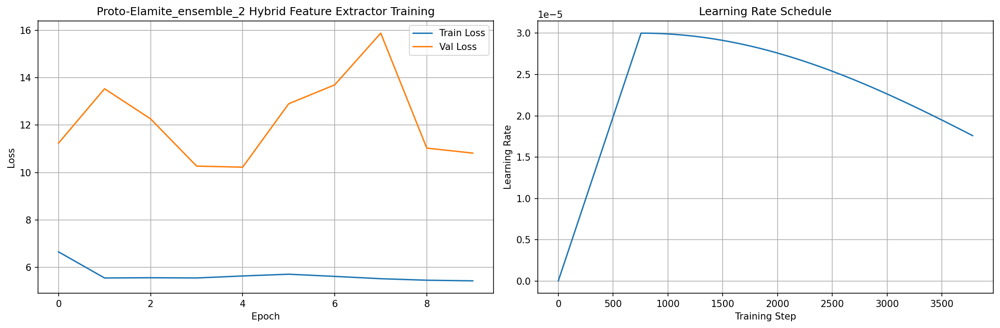

Training completed. Best validation loss: 10.2290 at epoch 5


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Proto-Elamite Model 3/5 with seed 44
Created dataset for Proto-Elamite: 1510 original images + 4530 augmentations
Created dataset with 6040 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Contrastive: 5.1914, Variance: 0.9992, Penalty: 2.0015
Train Batch: 10/378 | Loss: 8.2384 | LR: 0.000000
Train Batch: 20/378 | Loss: 7.9843 | LR: 0.000001
Train Batch: 30/378 | Loss: 8.6428 | LR: 0.000001
Train Batch: 40/378 | Loss: 8.0792 | LR: 0.000002
Train Batch: 50/378 | Loss: 7.6789 | LR: 0.000002
Train Batch: 60/378 | Loss: 7.7021 | LR: 0.000002
Train Batch: 70/378 | Loss: 7.0322 | LR: 0.000003
Contrastive: 7.3455, Variance: 0.9988, Penalty: 2.0021
Train Batch: 80/378 | Loss: 9.0664 | LR: 0.000003
Train Batch: 90/378 | Loss: 7.3905 | LR: 0.000004
Train Batch: 100/378 | Loss: 8.2210 | LR: 0.000004
Train Batch: 110/378 | Loss: 8.0136 | LR: 0.000004
Train Batch: 120/378 | Loss: 6.3486 | LR: 0.000005
Train Batch: 130/378 | Loss: 7.6877 | LR: 0.000005
Train Batch: 140/378 | Loss: 6.0147 | LR: 0.000006
Contrastive: 5.2345, Variance: 0.9987, Penalty: 2.0025
Train Batch: 150/378 | Loss: 7.0986 | LR: 0.000006
Train Batch: 160/378 | Loss: 7.2583 | LR: 0.000006
Train Batch: 170/378 | Loss:

Epoch 1/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 6.6476
Val Loss: 9.9595
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_3_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.2676 | LR: 0.000015
Train Batch: 20/378 | Loss: 4.7088 | LR: 0.000016
Train Batch: 30/378 | Loss: 5.6076 | LR: 0.000016
Train Batch: 40/378 | Loss: 5.4331 | LR: 0.000017
Train Batch: 50/378 | Loss: 5.8735 | LR: 0.000017
Train Batch: 60/378 | Loss: 5.3124 | LR: 0.000017
Train Batch: 70/378 | Loss: 5.5765 | LR: 0.000018
Train Batch: 80/378 | Loss: 5.2563 | LR: 0.000018
Train Batch: 90/378 | Loss: 5.4544 | LR: 0.000019
Train Batch: 100/378 | Loss: 6.0019 | LR: 0.000019
Train Batch: 110/378 | Loss: 5.8811 | LR: 0.000019
Train Batch: 120/378 | Loss: 5.0843 | LR: 0.000020
Train Batch: 130/378 | Loss: 5.5895 | LR: 0.000020
Train Batch: 140/378 | Loss: 5.5504 | LR: 0.000021
Train Batch: 150/378 | Loss: 6.0799 | LR: 0.000021
Train Batch: 160/378 | Loss: 5.7856 | LR: 0.000021
Train Batch: 170/378 | Loss: 5.2683 | LR: 0.000022
Train Batch: 180/378 | Loss: 5.3931 | LR: 0.000022
Train Batch: 190/378 | Loss: 5.7290 | LR: 0.000023
Train Batch: 200/378 | Loss: 5.7732 | LR

Epoch 2/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.5457
Val Loss: 18.7122
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.6256 | LR: 0.000030
Train Batch: 20/378 | Loss: 6.0236 | LR: 0.000030
Train Batch: 30/378 | Loss: 5.6144 | LR: 0.000030
Train Batch: 40/378 | Loss: 5.4509 | LR: 0.000030
Train Batch: 50/378 | Loss: 5.7163 | LR: 0.000030
Train Batch: 60/378 | Loss: 5.8316 | LR: 0.000030
Train Batch: 70/378 | Loss: 5.7085 | LR: 0.000030
Train Batch: 80/378 | Loss: 5.9790 | LR: 0.000030
Train Batch: 90/378 | Loss: 5.5791 | LR: 0.000030
Train Batch: 100/378 | Loss: 5.7467 | LR: 0.000030
Train Batch: 110/378 | Loss: 5.4264 | LR: 0.000030
Train Batch: 120/378 | Loss: 5.4091 | LR: 0.000030
Contrastive: 3.7014, Variance: 0.9969, Penalty: 2.0060
Train Batch: 130/378 | Loss: 5.3036 | LR: 0.000030
Train Batch: 140/378 | Loss: 5.6196 | LR: 0.000030
Train Batch: 150/378 | Loss: 5.6601 | LR: 0.000030
Train Batch: 160/378 | Loss: 5.5569 | LR: 0.000030
Train Batch: 170/378 | Loss: 5.7222 | LR: 0.000030
Train Batch: 180/378 | Loss: 5.4129 | LR: 0.000030
Contrastive: 3.5745, Variance: 0.999

Epoch 3/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.5639
Val Loss: 12.3003
No improvement for 2 epochs


Epoch 4/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.4007 | LR: 0.000030
Train Batch: 20/378 | Loss: 5.6148 | LR: 0.000030
Train Batch: 30/378 | Loss: 5.2958 | LR: 0.000030
Contrastive: 3.7070, Variance: 0.9984, Penalty: 2.0029
Train Batch: 40/378 | Loss: 5.6247 | LR: 0.000030
Train Batch: 50/378 | Loss: 5.6561 | LR: 0.000030
Train Batch: 60/378 | Loss: 6.2135 | LR: 0.000030
Train Batch: 70/378 | Loss: 5.7520 | LR: 0.000030
Train Batch: 80/378 | Loss: 5.6476 | LR: 0.000030
Train Batch: 90/378 | Loss: 5.9898 | LR: 0.000030
Contrastive: 3.5766, Variance: 0.9988, Penalty: 2.0022
Train Batch: 100/378 | Loss: 5.6582 | LR: 0.000030
Contrastive: 3.8808, Variance: 0.9993, Penalty: 2.0012
Train Batch: 110/378 | Loss: 5.3226 | LR: 0.000030
Train Batch: 120/378 | Loss: 5.6608 | LR: 0.000030
Train Batch: 130/378 | Loss: 6.2019 | LR: 0.000030
Train Batch: 140/378 | Loss: 5.1535 | LR: 0.000030
Train Batch: 150/378 | Loss: 5.5573 | LR: 0.000030
Train Batch: 160/378 | Loss: 5.3139 | LR: 0.000030
Train Batch: 170/378 | Loss:

Epoch 4/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.5418
Val Loss: 10.8276
No improvement for 3 epochs


Epoch 5/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.5072 | LR: 0.000029
Train Batch: 20/378 | Loss: 5.7784 | LR: 0.000029
Contrastive: 3.7853, Variance: 0.9979, Penalty: 2.0040
Train Batch: 30/378 | Loss: 4.8929 | LR: 0.000029
Train Batch: 40/378 | Loss: 5.6584 | LR: 0.000029
Train Batch: 50/378 | Loss: 4.6607 | LR: 0.000029
Train Batch: 60/378 | Loss: 5.9456 | LR: 0.000029
Train Batch: 70/378 | Loss: 5.9386 | LR: 0.000029
Train Batch: 80/378 | Loss: 5.2840 | LR: 0.000029
Train Batch: 90/378 | Loss: 5.2413 | LR: 0.000029
Train Batch: 100/378 | Loss: 5.4113 | LR: 0.000029
Train Batch: 110/378 | Loss: 5.3212 | LR: 0.000029
Train Batch: 120/378 | Loss: 6.2102 | LR: 0.000029
Train Batch: 130/378 | Loss: 5.6329 | LR: 0.000029
Train Batch: 140/378 | Loss: 5.5851 | LR: 0.000029
Train Batch: 150/378 | Loss: 5.8302 | LR: 0.000029
Train Batch: 160/378 | Loss: 5.7748 | LR: 0.000029
Train Batch: 170/378 | Loss: 5.4421 | LR: 0.000029
Train Batch: 180/378 | Loss: 6.4411 | LR: 0.000029
Train Batch: 190/378 | Loss: 5.3332 

Epoch 5/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5768
Val Loss: 15.5384
No improvement for 4 epochs


Epoch 6/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Contrastive: 3.7865, Variance: 0.9981, Penalty: 2.0037
Train Batch: 10/378 | Loss: 5.8026 | LR: 0.000028
Train Batch: 20/378 | Loss: 5.8018 | LR: 0.000028
Train Batch: 30/378 | Loss: 4.9191 | LR: 0.000028
Train Batch: 40/378 | Loss: 5.5137 | LR: 0.000028
Train Batch: 50/378 | Loss: 5.4996 | LR: 0.000028
Train Batch: 60/378 | Loss: 5.7236 | LR: 0.000028
Train Batch: 70/378 | Loss: 4.6699 | LR: 0.000028
Train Batch: 80/378 | Loss: 5.2195 | LR: 0.000028
Train Batch: 90/378 | Loss: 5.8504 | LR: 0.000028
Train Batch: 100/378 | Loss: 5.8748 | LR: 0.000028
Train Batch: 110/378 | Loss: 5.8702 | LR: 0.000028
Train Batch: 120/378 | Loss: 5.2047 | LR: 0.000028
Contrastive: 4.1172, Variance: 0.9965, Penalty: 2.0069
Train Batch: 130/378 | Loss: 5.8202 | LR: 0.000028
Train Batch: 140/378 | Loss: 6.1987 | LR: 0.000027
Train Batch: 150/378 | Loss: 5.8631 | LR: 0.000027
Train Batch: 160/378 | Loss: 5.5532 | LR: 0.000027
Train Batch: 170/378 | Loss: 5.7577 | LR: 0.000027
Train Batch: 180/378 | Loss: 5.3

Epoch 6/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]

Contrastive: 4.7194, Variance: 0.2840, Penalty: 7.0395

Epoch 6/20
Train Loss: 5.5242
Val Loss: 11.6341
No improvement for 5 epochs
Early stopping triggered after epoch 6
Final model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_3_hybrid_extractor_final.pth


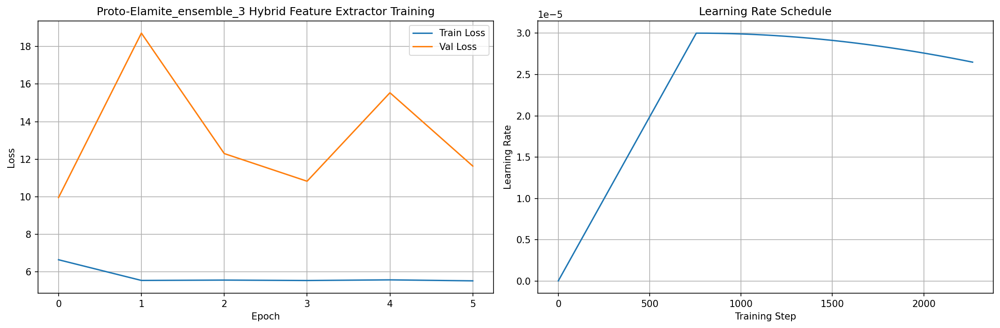

Training completed. Best validation loss: 9.9595 at epoch 1


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Proto-Elamite Model 4/5 with seed 45
Created dataset for Proto-Elamite: 1510 original images + 4530 augmentations
Created dataset with 6040 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 8.5424 | LR: 0.000000
Train Batch: 20/378 | Loss: 8.6219 | LR: 0.000001
Train Batch: 30/378 | Loss: 8.9048 | LR: 0.000001
Train Batch: 40/378 | Loss: 8.5340 | LR: 0.000002
Train Batch: 50/378 | Loss: 8.4429 | LR: 0.000002
Train Batch: 60/378 | Loss: 8.1824 | LR: 0.000002
Train Batch: 70/378 | Loss: 7.2858 | LR: 0.000003
Train Batch: 80/378 | Loss: 8.1944 | LR: 0.000003
Train Batch: 90/378 | Loss: 8.1352 | LR: 0.000004
Train Batch: 100/378 | Loss: 8.4585 | LR: 0.000004
Train Batch: 110/378 | Loss: 7.8518 | LR: 0.000004
Train Batch: 120/378 | Loss: 7.2304 | LR: 0.000005
Train Batch: 130/378 | Loss: 7.3406 | LR: 0.000005
Train Batch: 140/378 | Loss: 6.2435 | LR: 0.000006
Train Batch: 150/378 | Loss: 6.0173 | LR: 0.000006
Train Batch: 160/378 | Loss: 6.4818 | LR: 0.000006
Train Batch: 170/378 | Loss: 6.4978 | LR: 0.000007
Train Batch: 180/378 | Loss: 6.4220 | LR: 0.000007
Train Batch: 190/378 | Loss: 6.1568 | LR: 0.000008
Train Batch: 200/378 | Loss: 5.6533 | LR

Epoch 1/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 6.6486
Val Loss: 10.2255
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_4_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.6317 | LR: 0.000015
Train Batch: 20/378 | Loss: 5.3736 | LR: 0.000016
Train Batch: 30/378 | Loss: 5.4279 | LR: 0.000016
Train Batch: 40/378 | Loss: 6.1683 | LR: 0.000017
Train Batch: 50/378 | Loss: 5.7168 | LR: 0.000017
Train Batch: 60/378 | Loss: 5.4011 | LR: 0.000017
Train Batch: 70/378 | Loss: 4.8563 | LR: 0.000018
Train Batch: 80/378 | Loss: 5.6211 | LR: 0.000018
Train Batch: 90/378 | Loss: 5.9933 | LR: 0.000019
Train Batch: 100/378 | Loss: 5.9383 | LR: 0.000019
Train Batch: 110/378 | Loss: 5.3339 | LR: 0.000019
Train Batch: 120/378 | Loss: 5.7365 | LR: 0.000020
Train Batch: 130/378 | Loss: 5.4014 | LR: 0.000020
Train Batch: 140/378 | Loss: 5.6075 | LR: 0.000021
Train Batch: 150/378 | Loss: 5.6446 | LR: 0.000021
Train Batch: 160/378 | Loss: 6.1751 | LR: 0.000021
Train Batch: 170/378 | Loss: 5.3261 | LR: 0.000022
Contrastive: 3.7637, Variance: 0.9994, Penalty: 2.0011
Train Batch: 180/378 | Loss: 5.5278 | LR: 0.000022
Train Batch: 190/378 | Loss: 5.5979 

Epoch 2/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.5948
Val Loss: 10.0826
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_4_hybrid_extractor_best.pth


Epoch 3/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.1814 | LR: 0.000030
Train Batch: 20/378 | Loss: 5.4068 | LR: 0.000030
Contrastive: 3.7451, Variance: 0.9976, Penalty: 2.0046
Train Batch: 30/378 | Loss: 5.5626 | LR: 0.000030
Train Batch: 40/378 | Loss: 6.3766 | LR: 0.000030
Train Batch: 50/378 | Loss: 6.4091 | LR: 0.000030
Train Batch: 60/378 | Loss: 5.6321 | LR: 0.000030
Train Batch: 70/378 | Loss: 5.8558 | LR: 0.000030
Train Batch: 80/378 | Loss: 5.4775 | LR: 0.000030
Train Batch: 90/378 | Loss: 5.4529 | LR: 0.000030
Train Batch: 100/378 | Loss: 5.5443 | LR: 0.000030
Train Batch: 110/378 | Loss: 5.8011 | LR: 0.000030
Contrastive: 3.8414, Variance: 0.9989, Penalty: 2.0019
Train Batch: 120/378 | Loss: 5.8599 | LR: 0.000030
Train Batch: 130/378 | Loss: 5.4927 | LR: 0.000030
Train Batch: 140/378 | Loss: 5.2549 | LR: 0.000030
Train Batch: 150/378 | Loss: 5.7872 | LR: 0.000030
Train Batch: 160/378 | Loss: 5.6840 | LR: 0.000030
Train Batch: 170/378 | Loss: 5.3922 | LR: 0.000030
Train Batch: 180/378 | Loss: 5.6

Epoch 3/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.5922
Val Loss: 13.1336
No improvement for 1 epochs


Epoch 4/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.7917 | LR: 0.000030
Train Batch: 20/378 | Loss: 5.2762 | LR: 0.000030
Contrastive: 3.7478, Variance: 0.9984, Penalty: 2.0029
Train Batch: 30/378 | Loss: 5.7567 | LR: 0.000030
Train Batch: 40/378 | Loss: 5.2771 | LR: 0.000030
Contrastive: 3.9873, Variance: 0.9991, Penalty: 2.0015
Contrastive: 3.7808, Variance: 0.9992, Penalty: 2.0014
Train Batch: 50/378 | Loss: 5.0263 | LR: 0.000030
Train Batch: 60/378 | Loss: 5.6806 | LR: 0.000030
Train Batch: 70/378 | Loss: 5.1427 | LR: 0.000030
Contrastive: 3.8228, Variance: 0.9978, Penalty: 2.0041
Train Batch: 80/378 | Loss: 5.8045 | LR: 0.000030
Train Batch: 90/378 | Loss: 5.8485 | LR: 0.000030
Train Batch: 100/378 | Loss: 5.4851 | LR: 0.000030
Train Batch: 110/378 | Loss: 5.8048 | LR: 0.000030
Train Batch: 120/378 | Loss: 5.9992 | LR: 0.000030
Train Batch: 130/378 | Loss: 5.4978 | LR: 0.000030
Train Batch: 140/378 | Loss: 5.9839 | LR: 0.000030
Train Batch: 150/378 | Loss: 5.5998 | LR: 0.000030
Train Batch: 160/378 | L

Epoch 4/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.5365
Val Loss: 14.1356
No improvement for 2 epochs


Epoch 5/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 6.2450 | LR: 0.000029
Contrastive: 3.1083, Variance: 0.9979, Penalty: 2.0040
Train Batch: 20/378 | Loss: 5.7679 | LR: 0.000029
Train Batch: 30/378 | Loss: 4.7731 | LR: 0.000029
Train Batch: 40/378 | Loss: 5.4621 | LR: 0.000029
Train Batch: 50/378 | Loss: 5.7703 | LR: 0.000029
Train Batch: 60/378 | Loss: 5.4334 | LR: 0.000029
Train Batch: 70/378 | Loss: 5.3956 | LR: 0.000029
Train Batch: 80/378 | Loss: 5.5861 | LR: 0.000029
Train Batch: 90/378 | Loss: 6.0012 | LR: 0.000029
Contrastive: 4.1922, Variance: 0.9988, Penalty: 2.0021
Train Batch: 100/378 | Loss: 5.4499 | LR: 0.000029
Train Batch: 110/378 | Loss: 5.0061 | LR: 0.000029
Train Batch: 120/378 | Loss: 5.4567 | LR: 0.000029
Train Batch: 130/378 | Loss: 5.6555 | LR: 0.000029
Train Batch: 140/378 | Loss: 6.0950 | LR: 0.000029
Train Batch: 150/378 | Loss: 6.1505 | LR: 0.000029
Contrastive: 4.1202, Variance: 0.9988, Penalty: 2.0023
Train Batch: 160/378 | Loss: 5.5660 | LR: 0.000029
Train Batch: 170/378 | Loss:

Epoch 5/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5438
Val Loss: 9.5796
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_4_hybrid_extractor_best.pth


Epoch 6/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.7497 | LR: 0.000028
Train Batch: 20/378 | Loss: 4.9622 | LR: 0.000028
Train Batch: 30/378 | Loss: 5.5627 | LR: 0.000028
Train Batch: 40/378 | Loss: 5.4544 | LR: 0.000028
Train Batch: 50/378 | Loss: 5.4282 | LR: 0.000028
Train Batch: 60/378 | Loss: 5.3739 | LR: 0.000028
Train Batch: 70/378 | Loss: 5.4039 | LR: 0.000028
Train Batch: 80/378 | Loss: 5.2258 | LR: 0.000028
Train Batch: 90/378 | Loss: 5.5271 | LR: 0.000028
Train Batch: 100/378 | Loss: 5.6565 | LR: 0.000028
Train Batch: 110/378 | Loss: 5.6276 | LR: 0.000028
Train Batch: 120/378 | Loss: 5.8283 | LR: 0.000028
Train Batch: 130/378 | Loss: 5.5949 | LR: 0.000028
Train Batch: 140/378 | Loss: 6.0355 | LR: 0.000027
Train Batch: 150/378 | Loss: 5.4376 | LR: 0.000027
Train Batch: 160/378 | Loss: 5.3860 | LR: 0.000027
Train Batch: 170/378 | Loss: 5.8850 | LR: 0.000027
Train Batch: 180/378 | Loss: 4.9941 | LR: 0.000027
Train Batch: 190/378 | Loss: 5.1410 | LR: 0.000027
Train Batch: 200/378 | Loss: 5.1049 | LR

Epoch 6/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.5075
Val Loss: 10.4431
No improvement for 1 epochs


Epoch 7/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.1786 | LR: 0.000026
Train Batch: 20/378 | Loss: 5.2432 | LR: 0.000026
Train Batch: 30/378 | Loss: 5.2685 | LR: 0.000026
Train Batch: 40/378 | Loss: 5.2021 | LR: 0.000026
Train Batch: 50/378 | Loss: 5.7574 | LR: 0.000026
Train Batch: 60/378 | Loss: 5.2220 | LR: 0.000026
Train Batch: 70/378 | Loss: 5.8072 | LR: 0.000026
Train Batch: 80/378 | Loss: 5.2318 | LR: 0.000026
Train Batch: 90/378 | Loss: 5.7770 | LR: 0.000026
Train Batch: 100/378 | Loss: 5.1806 | LR: 0.000026
Train Batch: 110/378 | Loss: 5.2049 | LR: 0.000026
Train Batch: 120/378 | Loss: 5.2705 | LR: 0.000026
Train Batch: 130/378 | Loss: 5.2665 | LR: 0.000026
Train Batch: 140/378 | Loss: 5.0872 | LR: 0.000026
Train Batch: 150/378 | Loss: 5.3422 | LR: 0.000026
Train Batch: 160/378 | Loss: 5.4180 | LR: 0.000026
Contrastive: 3.9040, Variance: 0.9993, Penalty: 2.0012
Train Batch: 170/378 | Loss: 5.2614 | LR: 0.000026
Train Batch: 180/378 | Loss: 5.8682 | LR: 0.000026
Contrastive: 3.6770, Variance: 0.999

Epoch 7/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 7/20
Train Loss: 5.4946
Val Loss: 12.1935
No improvement for 2 epochs


Epoch 8/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.3766 | LR: 0.000025
Train Batch: 20/378 | Loss: 5.6278 | LR: 0.000025
Train Batch: 30/378 | Loss: 5.6484 | LR: 0.000024
Train Batch: 40/378 | Loss: 5.3703 | LR: 0.000024
Train Batch: 50/378 | Loss: 5.6469 | LR: 0.000024
Train Batch: 60/378 | Loss: 5.4482 | LR: 0.000024
Contrastive: 3.3906, Variance: 0.9989, Penalty: 2.0021
Train Batch: 70/378 | Loss: 5.7232 | LR: 0.000024
Train Batch: 80/378 | Loss: 6.1754 | LR: 0.000024
Train Batch: 90/378 | Loss: 5.0598 | LR: 0.000024
Train Batch: 100/378 | Loss: 6.1846 | LR: 0.000024
Train Batch: 110/378 | Loss: 5.4030 | LR: 0.000024
Train Batch: 120/378 | Loss: 5.5054 | LR: 0.000024
Train Batch: 130/378 | Loss: 5.9264 | LR: 0.000024
Train Batch: 140/378 | Loss: 5.4741 | LR: 0.000024
Train Batch: 150/378 | Loss: 5.3567 | LR: 0.000024
Train Batch: 160/378 | Loss: 5.2730 | LR: 0.000024
Train Batch: 170/378 | Loss: 5.2227 | LR: 0.000024
Train Batch: 180/378 | Loss: 6.0809 | LR: 0.000024
Train Batch: 190/378 | Loss: 5.7214 

Epoch 8/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 8/20
Train Loss: 5.5364
Val Loss: 11.5971
No improvement for 3 epochs


Epoch 9/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.7024 | LR: 0.000022
Train Batch: 20/378 | Loss: 5.8090 | LR: 0.000022
Train Batch: 30/378 | Loss: 5.3847 | LR: 0.000022
Train Batch: 40/378 | Loss: 5.0695 | LR: 0.000022
Train Batch: 50/378 | Loss: 5.4999 | LR: 0.000022
Contrastive: 4.1634, Variance: 0.9985, Penalty: 2.0028
Contrastive: 3.9585, Variance: 0.9983, Penalty: 2.0031
Train Batch: 60/378 | Loss: 5.0401 | LR: 0.000022
Train Batch: 70/378 | Loss: 5.7115 | LR: 0.000022
Train Batch: 80/378 | Loss: 5.9233 | LR: 0.000022
Train Batch: 90/378 | Loss: 5.6107 | LR: 0.000022
Train Batch: 100/378 | Loss: 5.6194 | LR: 0.000022
Contrastive: 3.5216, Variance: 0.9990, Penalty: 2.0019
Train Batch: 110/378 | Loss: 5.3507 | LR: 0.000022
Train Batch: 120/378 | Loss: 5.7190 | LR: 0.000022
Train Batch: 130/378 | Loss: 5.6427 | LR: 0.000022
Train Batch: 140/378 | Loss: 5.4157 | LR: 0.000022
Train Batch: 150/378 | Loss: 5.2170 | LR: 0.000022
Train Batch: 160/378 | Loss: 5.5665 | LR: 0.000022
Train Batch: 170/378 | Loss:

Epoch 9/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 9/20
Train Loss: 5.4827
Val Loss: 10.8335
No improvement for 4 epochs


Epoch 10/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Contrastive: 3.8395, Variance: 0.9988, Penalty: 2.0021
Train Batch: 10/378 | Loss: 5.7907 | LR: 0.000020
Train Batch: 20/378 | Loss: 5.1251 | LR: 0.000020
Train Batch: 30/378 | Loss: 5.3673 | LR: 0.000020
Contrastive: 3.1243, Variance: 0.9987, Penalty: 2.0025
Train Batch: 40/378 | Loss: 5.8500 | LR: 0.000020
Train Batch: 50/378 | Loss: 5.7880 | LR: 0.000020
Train Batch: 60/378 | Loss: 5.6271 | LR: 0.000020
Train Batch: 70/378 | Loss: 5.2044 | LR: 0.000020
Train Batch: 80/378 | Loss: 5.1974 | LR: 0.000020
Train Batch: 90/378 | Loss: 5.6286 | LR: 0.000020
Train Batch: 100/378 | Loss: 5.4838 | LR: 0.000019
Train Batch: 110/378 | Loss: 5.4581 | LR: 0.000019
Train Batch: 120/378 | Loss: 5.0792 | LR: 0.000019
Train Batch: 130/378 | Loss: 5.4824 | LR: 0.000019
Train Batch: 140/378 | Loss: 5.3554 | LR: 0.000019
Train Batch: 150/378 | Loss: 5.4864 | LR: 0.000019
Train Batch: 160/378 | Loss: 5.1523 | LR: 0.000019
Contrastive: 3.8622, Variance: 0.9991, Penalty: 2.0016
Train Batch: 170/378 | Loss:

Epoch 10/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 10/20
Train Loss: 5.4161
Val Loss: 9.4549
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_4_hybrid_extractor_best.pth


Epoch 11/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.6580 | LR: 0.000018
Train Batch: 20/378 | Loss: 5.7589 | LR: 0.000017
Train Batch: 30/378 | Loss: 5.7314 | LR: 0.000017
Train Batch: 40/378 | Loss: 5.8343 | LR: 0.000017
Train Batch: 50/378 | Loss: 5.6654 | LR: 0.000017
Train Batch: 60/378 | Loss: 5.5632 | LR: 0.000017
Train Batch: 70/378 | Loss: 5.3160 | LR: 0.000017
Train Batch: 80/378 | Loss: 5.4335 | LR: 0.000017
Train Batch: 90/378 | Loss: 5.2773 | LR: 0.000017
Train Batch: 100/378 | Loss: 5.6128 | LR: 0.000017
Train Batch: 110/378 | Loss: 5.8131 | LR: 0.000017
Train Batch: 120/378 | Loss: 5.8113 | LR: 0.000017
Train Batch: 130/378 | Loss: 4.9581 | LR: 0.000017
Train Batch: 140/378 | Loss: 5.7093 | LR: 0.000017
Train Batch: 150/378 | Loss: 5.2262 | LR: 0.000017
Train Batch: 160/378 | Loss: 4.9781 | LR: 0.000017
Train Batch: 170/378 | Loss: 4.8552 | LR: 0.000016
Train Batch: 180/378 | Loss: 5.4319 | LR: 0.000016
Train Batch: 190/378 | Loss: 5.5352 | LR: 0.000016
Train Batch: 200/378 | Loss: 5.5496 | LR

Epoch 11/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 11/20
Train Loss: 5.4076
Val Loss: 9.4688
No improvement for 1 epochs


Epoch 12/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.6277 | LR: 0.000015
Train Batch: 20/378 | Loss: 5.5912 | LR: 0.000015
Train Batch: 30/378 | Loss: 5.0636 | LR: 0.000015
Train Batch: 40/378 | Loss: 4.8871 | LR: 0.000015
Train Batch: 50/378 | Loss: 5.6715 | LR: 0.000015
Train Batch: 60/378 | Loss: 5.3051 | LR: 0.000015
Train Batch: 70/378 | Loss: 5.5652 | LR: 0.000015
Train Batch: 80/378 | Loss: 5.2949 | LR: 0.000014
Train Batch: 90/378 | Loss: 5.7714 | LR: 0.000014
Train Batch: 100/378 | Loss: 5.1369 | LR: 0.000014
Train Batch: 110/378 | Loss: 5.1524 | LR: 0.000014
Train Batch: 120/378 | Loss: 5.9775 | LR: 0.000014
Train Batch: 130/378 | Loss: 5.5349 | LR: 0.000014
Train Batch: 140/378 | Loss: 5.8398 | LR: 0.000014
Train Batch: 150/378 | Loss: 5.4907 | LR: 0.000014
Contrastive: 4.0036, Variance: 0.9994, Penalty: 2.0009
Train Batch: 160/378 | Loss: 5.1887 | LR: 0.000014
Train Batch: 170/378 | Loss: 5.7719 | LR: 0.000014
Train Batch: 180/378 | Loss: 5.4689 | LR: 0.000014
Train Batch: 190/378 | Loss: 5.5152 

Epoch 12/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]

Contrastive: 5.7786, Variance: 0.5649, Penalty: 3.5399

Epoch 12/20
Train Loss: 5.3912
Val Loss: 9.3049
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_4_hybrid_extractor_best.pth


Epoch 13/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.4118 | LR: 0.000012
Train Batch: 20/378 | Loss: 5.3015 | LR: 0.000012
Train Batch: 30/378 | Loss: 5.6460 | LR: 0.000012
Train Batch: 40/378 | Loss: 5.5361 | LR: 0.000012
Train Batch: 50/378 | Loss: 5.1567 | LR: 0.000012
Train Batch: 60/378 | Loss: 4.9237 | LR: 0.000012
Train Batch: 70/378 | Loss: 5.2299 | LR: 0.000012
Train Batch: 80/378 | Loss: 5.6186 | LR: 0.000012
Train Batch: 90/378 | Loss: 5.1130 | LR: 0.000012
Train Batch: 100/378 | Loss: 5.7295 | LR: 0.000012
Train Batch: 110/378 | Loss: 5.1632 | LR: 0.000012
Train Batch: 120/378 | Loss: 6.0063 | LR: 0.000012
Train Batch: 130/378 | Loss: 5.4520 | LR: 0.000012
Train Batch: 140/378 | Loss: 5.5357 | LR: 0.000011
Train Batch: 150/378 | Loss: 5.4583 | LR: 0.000011
Train Batch: 160/378 | Loss: 5.5227 | LR: 0.000011
Train Batch: 170/378 | Loss: 4.8040 | LR: 0.000011
Train Batch: 180/378 | Loss: 5.4990 | LR: 0.000011
Train Batch: 190/378 | Loss: 5.4537 | LR: 0.000011
Train Batch: 200/378 | Loss: 4.6749 | LR

Epoch 13/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 13/20
Train Loss: 5.3542
Val Loss: 9.4930
No improvement for 1 epochs


Epoch 14/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.3394 | LR: 0.000010
Train Batch: 20/378 | Loss: 4.9788 | LR: 0.000010
Train Batch: 30/378 | Loss: 5.4067 | LR: 0.000010
Train Batch: 40/378 | Loss: 4.8429 | LR: 0.000010
Train Batch: 50/378 | Loss: 5.1521 | LR: 0.000010
Train Batch: 60/378 | Loss: 5.5689 | LR: 0.000009
Train Batch: 70/378 | Loss: 5.5613 | LR: 0.000009
Train Batch: 80/378 | Loss: 5.2495 | LR: 0.000009
Train Batch: 90/378 | Loss: 5.4445 | LR: 0.000009
Contrastive: 2.9877, Variance: 0.9992, Penalty: 2.0014
Train Batch: 100/378 | Loss: 5.4036 | LR: 0.000009
Train Batch: 110/378 | Loss: 4.9169 | LR: 0.000009
Train Batch: 120/378 | Loss: 5.2767 | LR: 0.000009
Train Batch: 130/378 | Loss: 4.9623 | LR: 0.000009
Train Batch: 140/378 | Loss: 5.6067 | LR: 0.000009
Train Batch: 150/378 | Loss: 5.3162 | LR: 0.000009
Train Batch: 160/378 | Loss: 5.2909 | LR: 0.000009
Train Batch: 170/378 | Loss: 4.9846 | LR: 0.000009
Train Batch: 180/378 | Loss: 5.4986 | LR: 0.000009
Contrastive: 3.7814, Variance: 0.999

Epoch 14/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]

Contrastive: 6.4846, Variance: 0.6157, Penalty: 3.2478

Epoch 14/20
Train Loss: 5.3164
Val Loss: 9.4483
No improvement for 2 epochs


Epoch 15/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.9480 | LR: 0.000007
Contrastive: 3.1789, Variance: 0.9992, Penalty: 2.0014
Train Batch: 20/378 | Loss: 5.2075 | LR: 0.000007
Train Batch: 30/378 | Loss: 5.4193 | LR: 0.000007
Train Batch: 40/378 | Loss: 5.1346 | LR: 0.000007
Train Batch: 50/378 | Loss: 4.8559 | LR: 0.000007
Train Batch: 60/378 | Loss: 5.4251 | LR: 0.000007
Train Batch: 70/378 | Loss: 4.7651 | LR: 0.000007
Train Batch: 80/378 | Loss: 5.5374 | LR: 0.000007
Contrastive: 3.4229, Variance: 0.9994, Penalty: 2.0010
Train Batch: 90/378 | Loss: 5.4461 | LR: 0.000007
Train Batch: 100/378 | Loss: 5.4003 | LR: 0.000007
Train Batch: 110/378 | Loss: 5.1707 | LR: 0.000007
Train Batch: 120/378 | Loss: 5.3884 | LR: 0.000007
Train Batch: 130/378 | Loss: 5.7208 | LR: 0.000007
Contrastive: 3.7747, Variance: 0.9995, Penalty: 2.0009
Train Batch: 140/378 | Loss: 4.9557 | LR: 0.000007
Train Batch: 150/378 | Loss: 5.0670 | LR: 0.000007
Train Batch: 160/378 | Loss: 5.4950 | LR: 0.000007
Train Batch: 170/378 | Loss:

Epoch 15/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 15/20
Train Loss: 5.3156
Val Loss: 9.7282
No improvement for 3 epochs


Epoch 16/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.5475 | LR: 0.000005
Train Batch: 20/378 | Loss: 5.3829 | LR: 0.000005
Train Batch: 30/378 | Loss: 5.4324 | LR: 0.000005
Train Batch: 40/378 | Loss: 5.3152 | LR: 0.000005
Train Batch: 50/378 | Loss: 5.6479 | LR: 0.000005
Train Batch: 60/378 | Loss: 5.2471 | LR: 0.000005
Train Batch: 70/378 | Loss: 5.3189 | LR: 0.000005
Train Batch: 80/378 | Loss: 5.3286 | LR: 0.000005
Train Batch: 90/378 | Loss: 5.3390 | LR: 0.000005
Train Batch: 100/378 | Loss: 5.6268 | LR: 0.000005
Train Batch: 110/378 | Loss: 5.3653 | LR: 0.000005
Train Batch: 120/378 | Loss: 4.9606 | LR: 0.000005
Train Batch: 130/378 | Loss: 5.4152 | LR: 0.000005
Train Batch: 140/378 | Loss: 5.1667 | LR: 0.000005
Train Batch: 150/378 | Loss: 5.4730 | LR: 0.000005
Train Batch: 160/378 | Loss: 5.4967 | LR: 0.000005
Train Batch: 170/378 | Loss: 5.1726 | LR: 0.000004
Train Batch: 180/378 | Loss: 5.1629 | LR: 0.000004
Train Batch: 190/378 | Loss: 4.9515 | LR: 0.000004
Train Batch: 200/378 | Loss: 5.1722 | LR

Epoch 16/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 16/20
Train Loss: 5.2673
Val Loss: 9.9585
No improvement for 4 epochs


Epoch 17/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.5870 | LR: 0.000003
Train Batch: 20/378 | Loss: 5.3269 | LR: 0.000003
Train Batch: 30/378 | Loss: 5.6765 | LR: 0.000003
Train Batch: 40/378 | Loss: 5.4889 | LR: 0.000003
Contrastive: 3.8109, Variance: 0.9994, Penalty: 2.0009
Train Batch: 50/378 | Loss: 5.2934 | LR: 0.000003
Train Batch: 60/378 | Loss: 5.0759 | LR: 0.000003
Train Batch: 70/378 | Loss: 5.4288 | LR: 0.000003
Train Batch: 80/378 | Loss: 5.1986 | LR: 0.000003
Train Batch: 90/378 | Loss: 5.6111 | LR: 0.000003
Train Batch: 100/378 | Loss: 4.9266 | LR: 0.000003
Train Batch: 110/378 | Loss: 5.3645 | LR: 0.000003
Train Batch: 120/378 | Loss: 5.1694 | LR: 0.000003
Train Batch: 130/378 | Loss: 5.1212 | LR: 0.000003
Train Batch: 140/378 | Loss: 5.7780 | LR: 0.000003
Train Batch: 150/378 | Loss: 4.9389 | LR: 0.000003
Train Batch: 160/378 | Loss: 4.9597 | LR: 0.000003
Train Batch: 170/378 | Loss: 5.0147 | LR: 0.000003
Train Batch: 180/378 | Loss: 5.2248 | LR: 0.000003
Train Batch: 190/378 | Loss: 4.8119 

Epoch 17/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 17/20
Train Loss: 5.2550
Val Loss: 9.7723
No improvement for 5 epochs
Early stopping triggered after epoch 17
Final model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_4_hybrid_extractor_final.pth


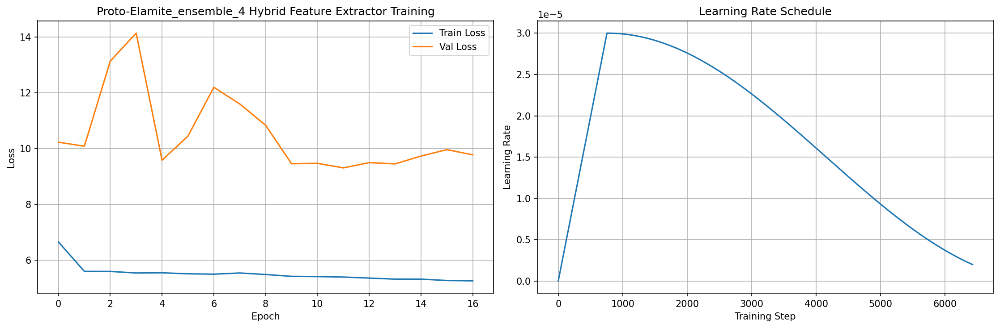

Training completed. Best validation loss: 9.3049 at epoch 12


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Proto-Elamite Model 5/5 with seed 46
Created dataset for Proto-Elamite: 1510 original images + 4530 augmentations
Created dataset with 6040 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 8.1263 | LR: 0.000000
Train Batch: 20/378 | Loss: 8.7628 | LR: 0.000001
Train Batch: 30/378 | Loss: 8.1110 | LR: 0.000001
Train Batch: 40/378 | Loss: 8.2406 | LR: 0.000002
Train Batch: 50/378 | Loss: 9.0223 | LR: 0.000002
Contrastive: 7.2415, Variance: 0.9993, Penalty: 2.0013
Train Batch: 60/378 | Loss: 8.9619 | LR: 0.000002
Train Batch: 70/378 | Loss: 8.4044 | LR: 0.000003
Train Batch: 80/378 | Loss: 8.2285 | LR: 0.000003
Train Batch: 90/378 | Loss: 7.2381 | LR: 0.000004
Train Batch: 100/378 | Loss: 6.2193 | LR: 0.000004
Train Batch: 110/378 | Loss: 8.0269 | LR: 0.000004
Train Batch: 120/378 | Loss: 7.3424 | LR: 0.000005
Contrastive: 5.3982, Variance: 0.9995, Penalty: 2.0007
Train Batch: 130/378 | Loss: 7.2152 | LR: 0.000005
Train Batch: 140/378 | Loss: 7.0291 | LR: 0.000006
Train Batch: 150/378 | Loss: 6.4205 | LR: 0.000006
Train Batch: 160/378 | Loss: 6.4776 | LR: 0.000006
Train Batch: 170/378 | Loss: 6.4600 | LR: 0.000007
Train Batch: 180/378 | Loss: 5.7

Epoch 1/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 6.6556
Val Loss: 10.1513
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_5_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.6257 | LR: 0.000015
Train Batch: 20/378 | Loss: 5.5282 | LR: 0.000016
Train Batch: 30/378 | Loss: 5.3970 | LR: 0.000016
Train Batch: 40/378 | Loss: 5.7596 | LR: 0.000017
Train Batch: 50/378 | Loss: 4.9591 | LR: 0.000017
Train Batch: 60/378 | Loss: 5.4793 | LR: 0.000017
Contrastive: 3.9027, Variance: 0.9993, Penalty: 2.0012
Train Batch: 70/378 | Loss: 5.6295 | LR: 0.000018
Train Batch: 80/378 | Loss: 5.1899 | LR: 0.000018
Train Batch: 90/378 | Loss: 5.2852 | LR: 0.000019
Train Batch: 100/378 | Loss: 5.7947 | LR: 0.000019
Contrastive: 3.8469, Variance: 0.9993, Penalty: 2.0012
Train Batch: 110/378 | Loss: 5.8609 | LR: 0.000019
Train Batch: 120/378 | Loss: 5.0800 | LR: 0.000020
Train Batch: 130/378 | Loss: 6.2116 | LR: 0.000020
Train Batch: 140/378 | Loss: 5.2749 | LR: 0.000021
Train Batch: 150/378 | Loss: 5.2331 | LR: 0.000021
Train Batch: 160/378 | Loss: 5.4194 | LR: 0.000021
Train Batch: 170/378 | Loss: 5.7437 | LR: 0.000022
Train Batch: 180/378 | Loss: 5.8

Epoch 2/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]

Contrastive: 4.8049, Variance: 0.3219, Penalty: 6.2118

Epoch 2/20
Train Loss: 5.5364
Val Loss: 10.2804
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.9697 | LR: 0.000030
Train Batch: 20/378 | Loss: 6.2884 | LR: 0.000030
Train Batch: 30/378 | Loss: 4.9899 | LR: 0.000030
Train Batch: 40/378 | Loss: 5.4922 | LR: 0.000030
Train Batch: 50/378 | Loss: 5.4661 | LR: 0.000030
Train Batch: 60/378 | Loss: 5.5961 | LR: 0.000030
Train Batch: 70/378 | Loss: 5.9913 | LR: 0.000030
Contrastive: 3.8013, Variance: 0.9979, Penalty: 2.0040
Train Batch: 80/378 | Loss: 5.9654 | LR: 0.000030
Train Batch: 90/378 | Loss: 5.7786 | LR: 0.000030
Train Batch: 100/378 | Loss: 5.6448 | LR: 0.000030
Train Batch: 110/378 | Loss: 5.2645 | LR: 0.000030
Train Batch: 120/378 | Loss: 5.4400 | LR: 0.000030
Train Batch: 130/378 | Loss: 5.9974 | LR: 0.000030
Train Batch: 140/378 | Loss: 5.6332 | LR: 0.000030
Train Batch: 150/378 | Loss: 4.9048 | LR: 0.000030
Train Batch: 160/378 | Loss: 5.5758 | LR: 0.000030
Train Batch: 170/378 | Loss: 5.2827 | LR: 0.000030
Train Batch: 180/378 | Loss: 5.4772 | LR: 0.000030
Train Batch: 190/378 | Loss: 5.4584 

Epoch 3/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.6114
Val Loss: 13.5577
No improvement for 2 epochs


Epoch 4/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.6988 | LR: 0.000030
Train Batch: 20/378 | Loss: 6.2272 | LR: 0.000030
Train Batch: 30/378 | Loss: 5.4064 | LR: 0.000030
Train Batch: 40/378 | Loss: 4.9888 | LR: 0.000030
Train Batch: 50/378 | Loss: 6.0177 | LR: 0.000030
Train Batch: 60/378 | Loss: 5.2779 | LR: 0.000030
Train Batch: 70/378 | Loss: 5.6092 | LR: 0.000030
Train Batch: 80/378 | Loss: 5.5586 | LR: 0.000030
Contrastive: 4.2037, Variance: 0.9977, Penalty: 2.0044
Train Batch: 90/378 | Loss: 5.5161 | LR: 0.000030
Train Batch: 100/378 | Loss: 5.9231 | LR: 0.000030
Train Batch: 110/378 | Loss: 5.4170 | LR: 0.000030
Train Batch: 120/378 | Loss: 5.2798 | LR: 0.000030
Train Batch: 130/378 | Loss: 5.0692 | LR: 0.000030
Train Batch: 140/378 | Loss: 5.2018 | LR: 0.000030
Train Batch: 150/378 | Loss: 5.3758 | LR: 0.000030
Train Batch: 160/378 | Loss: 5.7058 | LR: 0.000030
Train Batch: 170/378 | Loss: 5.3743 | LR: 0.000030
Train Batch: 180/378 | Loss: 5.6874 | LR: 0.000030
Train Batch: 190/378 | Loss: 5.6733 

Epoch 4/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.5932
Val Loss: 10.8012
No improvement for 3 epochs


Epoch 5/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.4541 | LR: 0.000029
Train Batch: 20/378 | Loss: 5.4767 | LR: 0.000029
Train Batch: 30/378 | Loss: 5.8355 | LR: 0.000029
Train Batch: 40/378 | Loss: 5.3478 | LR: 0.000029
Train Batch: 50/378 | Loss: 5.4770 | LR: 0.000029
Train Batch: 60/378 | Loss: 5.2584 | LR: 0.000029
Train Batch: 70/378 | Loss: 5.4004 | LR: 0.000029
Train Batch: 80/378 | Loss: 5.1042 | LR: 0.000029
Train Batch: 90/378 | Loss: 5.3615 | LR: 0.000029
Train Batch: 100/378 | Loss: 5.4362 | LR: 0.000029
Contrastive: 3.8365, Variance: 0.9990, Penalty: 2.0018
Train Batch: 110/378 | Loss: 5.2644 | LR: 0.000029
Train Batch: 120/378 | Loss: 5.6376 | LR: 0.000029
Train Batch: 130/378 | Loss: 5.6368 | LR: 0.000029
Train Batch: 140/378 | Loss: 5.7794 | LR: 0.000029
Train Batch: 150/378 | Loss: 4.7779 | LR: 0.000029
Train Batch: 160/378 | Loss: 5.5740 | LR: 0.000029
Train Batch: 170/378 | Loss: 6.1162 | LR: 0.000029
Train Batch: 180/378 | Loss: 5.7919 | LR: 0.000029
Train Batch: 190/378 | Loss: 5.7308 

Epoch 5/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5104
Val Loss: 10.3248
No improvement for 4 epochs


Epoch 6/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 6.0564 | LR: 0.000028
Train Batch: 20/378 | Loss: 5.3393 | LR: 0.000028
Train Batch: 30/378 | Loss: 5.8762 | LR: 0.000028
Contrastive: 3.6153, Variance: 0.9990, Penalty: 2.0018
Train Batch: 40/378 | Loss: 5.8774 | LR: 0.000028
Train Batch: 50/378 | Loss: 5.8121 | LR: 0.000028
Train Batch: 60/378 | Loss: 5.0452 | LR: 0.000028
Train Batch: 70/378 | Loss: 5.3759 | LR: 0.000028
Train Batch: 80/378 | Loss: 4.9260 | LR: 0.000028
Train Batch: 90/378 | Loss: 5.3708 | LR: 0.000028
Train Batch: 100/378 | Loss: 4.7659 | LR: 0.000028
Train Batch: 110/378 | Loss: 5.5123 | LR: 0.000028
Train Batch: 120/378 | Loss: 5.4759 | LR: 0.000028
Train Batch: 130/378 | Loss: 5.7305 | LR: 0.000028
Train Batch: 140/378 | Loss: 5.4100 | LR: 0.000027
Train Batch: 150/378 | Loss: 5.5343 | LR: 0.000027
Train Batch: 160/378 | Loss: 5.5255 | LR: 0.000027
Train Batch: 170/378 | Loss: 5.8880 | LR: 0.000027
Contrastive: 3.1381, Variance: 0.9973, Penalty: 2.0052
Train Batch: 180/378 | Loss: 5.4

Epoch 6/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.5753
Val Loss: 10.0062
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_5_hybrid_extractor_best.pth


Epoch 7/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.3120 | LR: 0.000026
Train Batch: 20/378 | Loss: 5.3191 | LR: 0.000026
Train Batch: 30/378 | Loss: 6.0175 | LR: 0.000026
Train Batch: 40/378 | Loss: 4.6578 | LR: 0.000026
Train Batch: 50/378 | Loss: 5.4496 | LR: 0.000026
Train Batch: 60/378 | Loss: 6.1198 | LR: 0.000026
Train Batch: 70/378 | Loss: 5.5535 | LR: 0.000026
Contrastive: 3.8329, Variance: 0.9989, Penalty: 2.0020
Train Batch: 80/378 | Loss: 6.4234 | LR: 0.000026
Train Batch: 90/378 | Loss: 5.5711 | LR: 0.000026
Train Batch: 100/378 | Loss: 5.5462 | LR: 0.000026
Train Batch: 110/378 | Loss: 5.0211 | LR: 0.000026
Train Batch: 120/378 | Loss: 5.9545 | LR: 0.000026
Train Batch: 130/378 | Loss: 5.7062 | LR: 0.000026
Train Batch: 140/378 | Loss: 5.5498 | LR: 0.000026
Train Batch: 150/378 | Loss: 5.2470 | LR: 0.000026
Contrastive: 4.0850, Variance: 0.9990, Penalty: 2.0017
Train Batch: 160/378 | Loss: 5.2971 | LR: 0.000026
Train Batch: 170/378 | Loss: 5.3671 | LR: 0.000026
Train Batch: 180/378 | Loss: 5.2

Epoch 7/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 7/20
Train Loss: 5.5074
Val Loss: 10.1377
No improvement for 1 epochs


Epoch 8/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 6.1382 | LR: 0.000025
Train Batch: 20/378 | Loss: 5.6301 | LR: 0.000025
Train Batch: 30/378 | Loss: 5.1847 | LR: 0.000024
Train Batch: 40/378 | Loss: 5.7050 | LR: 0.000024
Train Batch: 50/378 | Loss: 6.1385 | LR: 0.000024
Train Batch: 60/378 | Loss: 5.3421 | LR: 0.000024
Train Batch: 70/378 | Loss: 5.8126 | LR: 0.000024
Train Batch: 80/378 | Loss: 5.7013 | LR: 0.000024
Train Batch: 90/378 | Loss: 5.7284 | LR: 0.000024
Train Batch: 100/378 | Loss: 5.5492 | LR: 0.000024
Train Batch: 110/378 | Loss: 5.5957 | LR: 0.000024
Train Batch: 120/378 | Loss: 5.7181 | LR: 0.000024
Train Batch: 130/378 | Loss: 5.6240 | LR: 0.000024
Train Batch: 140/378 | Loss: 5.6395 | LR: 0.000024
Train Batch: 150/378 | Loss: 5.6595 | LR: 0.000024
Train Batch: 160/378 | Loss: 6.0995 | LR: 0.000024
Train Batch: 170/378 | Loss: 5.9845 | LR: 0.000024
Contrastive: 4.3039, Variance: 0.9987, Penalty: 2.0025
Train Batch: 180/378 | Loss: 5.4220 | LR: 0.000024
Contrastive: 3.6737, Variance: 0.999

Epoch 8/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 8/20
Train Loss: 5.5536
Val Loss: 15.7707
No improvement for 2 epochs


Epoch 9/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.4190 | LR: 0.000022
Train Batch: 20/378 | Loss: 5.2408 | LR: 0.000022
Train Batch: 30/378 | Loss: 5.9541 | LR: 0.000022
Contrastive: 3.6033, Variance: 0.9987, Penalty: 2.0025
Train Batch: 40/378 | Loss: 5.4972 | LR: 0.000022
Train Batch: 50/378 | Loss: 5.9249 | LR: 0.000022
Train Batch: 60/378 | Loss: 5.7182 | LR: 0.000022
Train Batch: 70/378 | Loss: 5.6798 | LR: 0.000022
Train Batch: 80/378 | Loss: 5.4524 | LR: 0.000022
Train Batch: 90/378 | Loss: 5.1399 | LR: 0.000022
Train Batch: 100/378 | Loss: 5.7072 | LR: 0.000022
Train Batch: 110/378 | Loss: 5.8189 | LR: 0.000022
Contrastive: 3.8662, Variance: 0.9979, Penalty: 2.0039
Train Batch: 120/378 | Loss: 5.5850 | LR: 0.000022
Train Batch: 130/378 | Loss: 5.6419 | LR: 0.000022
Train Batch: 140/378 | Loss: 6.1085 | LR: 0.000022
Train Batch: 150/378 | Loss: 5.3301 | LR: 0.000022
Train Batch: 160/378 | Loss: 6.0561 | LR: 0.000022
Train Batch: 170/378 | Loss: 5.5830 | LR: 0.000021
Train Batch: 180/378 | Loss: 5.4

Epoch 9/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 9/20
Train Loss: 5.4886
Val Loss: 9.6391
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_5_hybrid_extractor_best.pth


Epoch 10/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.7444 | LR: 0.000020
Train Batch: 20/378 | Loss: 5.3825 | LR: 0.000020
Train Batch: 30/378 | Loss: 5.7346 | LR: 0.000020
Train Batch: 40/378 | Loss: 5.5474 | LR: 0.000020
Train Batch: 50/378 | Loss: 5.9257 | LR: 0.000020
Train Batch: 60/378 | Loss: 6.0845 | LR: 0.000020
Train Batch: 70/378 | Loss: 5.5062 | LR: 0.000020
Train Batch: 80/378 | Loss: 5.1532 | LR: 0.000020
Train Batch: 90/378 | Loss: 5.2602 | LR: 0.000020
Train Batch: 100/378 | Loss: 5.2566 | LR: 0.000019
Train Batch: 110/378 | Loss: 5.6147 | LR: 0.000019
Train Batch: 120/378 | Loss: 5.7971 | LR: 0.000019
Train Batch: 130/378 | Loss: 5.4981 | LR: 0.000019
Train Batch: 140/378 | Loss: 5.6011 | LR: 0.000019
Train Batch: 150/378 | Loss: 5.5567 | LR: 0.000019
Train Batch: 160/378 | Loss: 5.7516 | LR: 0.000019
Train Batch: 170/378 | Loss: 4.9674 | LR: 0.000019
Train Batch: 180/378 | Loss: 5.3666 | LR: 0.000019
Train Batch: 190/378 | Loss: 5.6255 | LR: 0.000019
Train Batch: 200/378 | Loss: 5.4328 | LR

Epoch 10/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 10/20
Train Loss: 5.4239
Val Loss: 9.5008
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_5_hybrid_extractor_best.pth


Epoch 11/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.2645 | LR: 0.000018
Contrastive: 3.7961, Variance: 0.9988, Penalty: 2.0022
Train Batch: 20/378 | Loss: 4.9612 | LR: 0.000017
Train Batch: 30/378 | Loss: 6.1497 | LR: 0.000017
Train Batch: 40/378 | Loss: 5.5284 | LR: 0.000017
Train Batch: 50/378 | Loss: 5.4640 | LR: 0.000017
Train Batch: 60/378 | Loss: 5.1931 | LR: 0.000017
Train Batch: 70/378 | Loss: 5.7296 | LR: 0.000017
Train Batch: 80/378 | Loss: 5.7860 | LR: 0.000017
Train Batch: 90/378 | Loss: 5.3669 | LR: 0.000017
Train Batch: 100/378 | Loss: 5.4605 | LR: 0.000017
Train Batch: 110/378 | Loss: 5.4411 | LR: 0.000017
Train Batch: 120/378 | Loss: 5.5745 | LR: 0.000017
Train Batch: 130/378 | Loss: 5.2961 | LR: 0.000017
Train Batch: 140/378 | Loss: 5.6649 | LR: 0.000017
Contrastive: 2.9848, Variance: 0.9987, Penalty: 2.0025
Train Batch: 150/378 | Loss: 4.9264 | LR: 0.000017
Train Batch: 160/378 | Loss: 5.2120 | LR: 0.000017
Train Batch: 170/378 | Loss: 5.2740 | LR: 0.000016
Train Batch: 180/378 | Loss: 5.2

Epoch 11/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 11/20
Train Loss: 5.4364
Val Loss: 9.4081
Best model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_5_hybrid_extractor_best.pth


Epoch 12/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.3519 | LR: 0.000015
Train Batch: 20/378 | Loss: 5.2857 | LR: 0.000015
Train Batch: 30/378 | Loss: 5.3347 | LR: 0.000015
Train Batch: 40/378 | Loss: 5.2828 | LR: 0.000015
Train Batch: 50/378 | Loss: 5.7640 | LR: 0.000015
Train Batch: 60/378 | Loss: 5.5777 | LR: 0.000015
Train Batch: 70/378 | Loss: 5.5922 | LR: 0.000015
Train Batch: 80/378 | Loss: 5.3391 | LR: 0.000014
Train Batch: 90/378 | Loss: 5.2678 | LR: 0.000014
Train Batch: 100/378 | Loss: 4.9952 | LR: 0.000014
Train Batch: 110/378 | Loss: 5.1980 | LR: 0.000014
Train Batch: 120/378 | Loss: 5.9523 | LR: 0.000014
Train Batch: 130/378 | Loss: 5.3999 | LR: 0.000014
Train Batch: 140/378 | Loss: 5.3781 | LR: 0.000014
Train Batch: 150/378 | Loss: 5.3255 | LR: 0.000014
Train Batch: 160/378 | Loss: 5.3536 | LR: 0.000014
Train Batch: 170/378 | Loss: 5.5348 | LR: 0.000014
Train Batch: 180/378 | Loss: 5.3023 | LR: 0.000014
Train Batch: 190/378 | Loss: 5.0952 | LR: 0.000014
Train Batch: 200/378 | Loss: 5.4432 | LR

Epoch 12/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 12/20
Train Loss: 5.3737
Val Loss: 9.8437
No improvement for 1 epochs


Epoch 13/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.1798 | LR: 0.000012
Train Batch: 20/378 | Loss: 5.3419 | LR: 0.000012
Train Batch: 30/378 | Loss: 4.8843 | LR: 0.000012
Train Batch: 40/378 | Loss: 5.2210 | LR: 0.000012
Train Batch: 50/378 | Loss: 5.3089 | LR: 0.000012
Train Batch: 60/378 | Loss: 5.0289 | LR: 0.000012
Train Batch: 70/378 | Loss: 5.1401 | LR: 0.000012
Train Batch: 80/378 | Loss: 5.6621 | LR: 0.000012
Train Batch: 90/378 | Loss: 5.7158 | LR: 0.000012
Train Batch: 100/378 | Loss: 5.2355 | LR: 0.000012
Train Batch: 110/378 | Loss: 5.6229 | LR: 0.000012
Train Batch: 120/378 | Loss: 5.2141 | LR: 0.000012
Train Batch: 130/378 | Loss: 5.2013 | LR: 0.000012
Train Batch: 140/378 | Loss: 4.8629 | LR: 0.000011
Train Batch: 150/378 | Loss: 5.3548 | LR: 0.000011
Train Batch: 160/378 | Loss: 5.0905 | LR: 0.000011
Train Batch: 170/378 | Loss: 5.3724 | LR: 0.000011
Train Batch: 180/378 | Loss: 5.5426 | LR: 0.000011
Train Batch: 190/378 | Loss: 5.4643 | LR: 0.000011
Train Batch: 200/378 | Loss: 5.8036 | LR

Epoch 13/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 13/20
Train Loss: 5.3427
Val Loss: 10.1093
No improvement for 2 epochs


Epoch 14/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.4688 | LR: 0.000010
Train Batch: 20/378 | Loss: 5.5036 | LR: 0.000010
Train Batch: 30/378 | Loss: 5.0400 | LR: 0.000010
Train Batch: 40/378 | Loss: 5.2602 | LR: 0.000010
Train Batch: 50/378 | Loss: 5.5296 | LR: 0.000010
Train Batch: 60/378 | Loss: 5.5088 | LR: 0.000009
Train Batch: 70/378 | Loss: 5.4680 | LR: 0.000009
Train Batch: 80/378 | Loss: 5.2072 | LR: 0.000009
Train Batch: 90/378 | Loss: 4.7686 | LR: 0.000009
Train Batch: 100/378 | Loss: 5.0030 | LR: 0.000009
Train Batch: 110/378 | Loss: 5.0525 | LR: 0.000009
Train Batch: 120/378 | Loss: 4.9953 | LR: 0.000009
Train Batch: 130/378 | Loss: 5.1053 | LR: 0.000009
Train Batch: 140/378 | Loss: 4.9644 | LR: 0.000009
Train Batch: 150/378 | Loss: 5.2698 | LR: 0.000009
Train Batch: 160/378 | Loss: 5.3027 | LR: 0.000009
Train Batch: 170/378 | Loss: 5.2360 | LR: 0.000009
Train Batch: 180/378 | Loss: 5.2541 | LR: 0.000009
Train Batch: 190/378 | Loss: 5.2217 | LR: 0.000009
Train Batch: 200/378 | Loss: 5.2928 | LR

Epoch 14/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 14/20
Train Loss: 5.2907
Val Loss: 10.1503
No improvement for 3 epochs


Epoch 15/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.3686 | LR: 0.000007
Train Batch: 20/378 | Loss: 5.7185 | LR: 0.000007
Train Batch: 30/378 | Loss: 4.9475 | LR: 0.000007
Train Batch: 40/378 | Loss: 5.5011 | LR: 0.000007
Train Batch: 50/378 | Loss: 5.1044 | LR: 0.000007
Train Batch: 60/378 | Loss: 5.4399 | LR: 0.000007
Train Batch: 70/378 | Loss: 5.4697 | LR: 0.000007
Train Batch: 80/378 | Loss: 5.3598 | LR: 0.000007
Train Batch: 90/378 | Loss: 5.3707 | LR: 0.000007
Train Batch: 100/378 | Loss: 5.0312 | LR: 0.000007
Train Batch: 110/378 | Loss: 5.0981 | LR: 0.000007
Train Batch: 120/378 | Loss: 5.3415 | LR: 0.000007
Contrastive: 3.7554, Variance: 0.9991, Penalty: 2.0017
Train Batch: 130/378 | Loss: 5.4030 | LR: 0.000007
Train Batch: 140/378 | Loss: 5.3764 | LR: 0.000007
Contrastive: 4.0410, Variance: 0.9987, Penalty: 2.0024
Train Batch: 150/378 | Loss: 5.4558 | LR: 0.000007
Train Batch: 160/378 | Loss: 5.4205 | LR: 0.000007
Train Batch: 170/378 | Loss: 5.2500 | LR: 0.000007
Train Batch: 180/378 | Loss: 5.5

Epoch 15/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 15/20
Train Loss: 5.3052
Val Loss: 10.6360
No improvement for 4 epochs


Epoch 16/20 [Train]:   0%|          | 0/378 [00:00<?, ?it/s]

Train Batch: 10/378 | Loss: 5.2386 | LR: 0.000005
Train Batch: 20/378 | Loss: 5.3842 | LR: 0.000005
Train Batch: 30/378 | Loss: 5.4597 | LR: 0.000005
Train Batch: 40/378 | Loss: 5.3868 | LR: 0.000005
Train Batch: 50/378 | Loss: 4.9910 | LR: 0.000005
Train Batch: 60/378 | Loss: 5.1941 | LR: 0.000005
Train Batch: 70/378 | Loss: 5.2587 | LR: 0.000005
Train Batch: 80/378 | Loss: 5.3760 | LR: 0.000005
Train Batch: 90/378 | Loss: 5.9374 | LR: 0.000005
Train Batch: 100/378 | Loss: 5.3747 | LR: 0.000005
Train Batch: 110/378 | Loss: 4.9037 | LR: 0.000005
Train Batch: 120/378 | Loss: 5.4280 | LR: 0.000005
Train Batch: 130/378 | Loss: 4.7007 | LR: 0.000005
Train Batch: 140/378 | Loss: 5.3443 | LR: 0.000005
Train Batch: 150/378 | Loss: 5.1688 | LR: 0.000005
Train Batch: 160/378 | Loss: 4.8677 | LR: 0.000005
Train Batch: 170/378 | Loss: 5.0033 | LR: 0.000004
Train Batch: 180/378 | Loss: 5.2225 | LR: 0.000004
Train Batch: 190/378 | Loss: 4.9014 | LR: 0.000004
Train Batch: 200/378 | Loss: 5.5213 | LR

Epoch 16/20 [Val]:   0%|          | 0/10 [00:00<?, ?it/s]


Epoch 16/20
Train Loss: 5.2768
Val Loss: 10.5053
No improvement for 5 epochs
Early stopping triggered after epoch 16
Final model saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_5_hybrid_extractor_final.pth


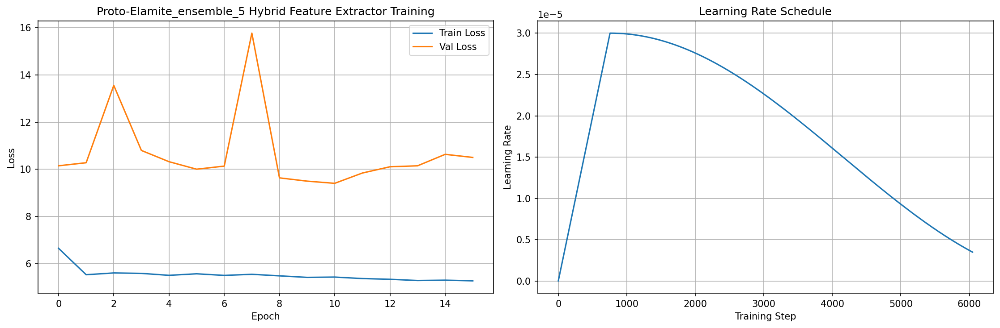

Training completed. Best validation loss: 9.4081 at epoch 11


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Ensemble Training Summary for Proto-Elamite
   model_idx  seed   val_loss  epoch  \
0          1    42   9.465516     13   
1          2    43  10.229036      5   
2          3    44   9.959490      1   
3          4    45   9.304906     12   
4          5    46   9.408126     11   

                                          model_path  
0  /content/drive/MyDrive/script_analysis/models/...  
1  /content/drive/MyDrive/script_analysis/models/...  
2  /content/drive/MyDrive/script_analysis/models/...  
3  /content/drive/MyDrive/script_analysis/models/...  
4  /content/drive/MyDrive/script_analysis/models/...  

Average validation loss: 9.6734
Best validation loss: 9.3049
Summary saved to /content/drive/MyDrive/script_analysis/models/Proto-Elamite_ensemble/Proto-Elamite_ensemble_summary.csv

Creating test datasets for all scripts...
Created test dataset for Indus with 391 samples
Created test dataset for Proto-Cuneiform with 2089 samples
Created test dataset for Proto-Elamite with 1510 sa

<ipython-input-12-4b8e90544d9f>:59: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(row['model_path'], map_location=device)


Loaded 5 Indus ensemble models
Extracting embeddings using model 1/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 2/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 3/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 4/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 5/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Saved Indus embeddings to /content/drive/MyDrive/script_analysis/results/ensemble_run_20250305_160346/Indus_embeddings.pkl


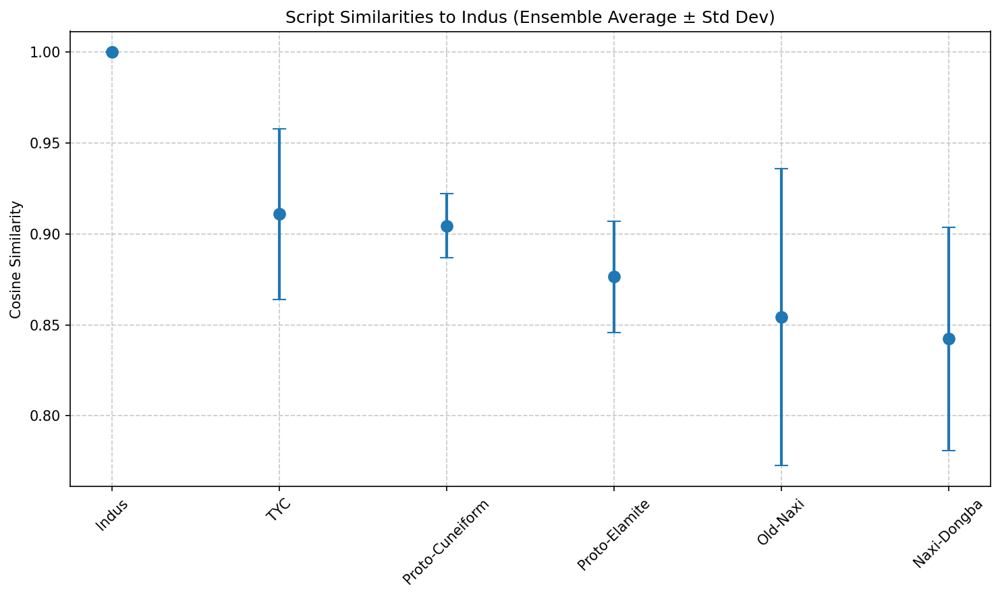

Saved similarity results to /content/drive/MyDrive/script_analysis/results/ensemble_run_20250305_160346/Indus_similarities.csv
Running t-SNE with perplexity 30 on 1500 samples...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


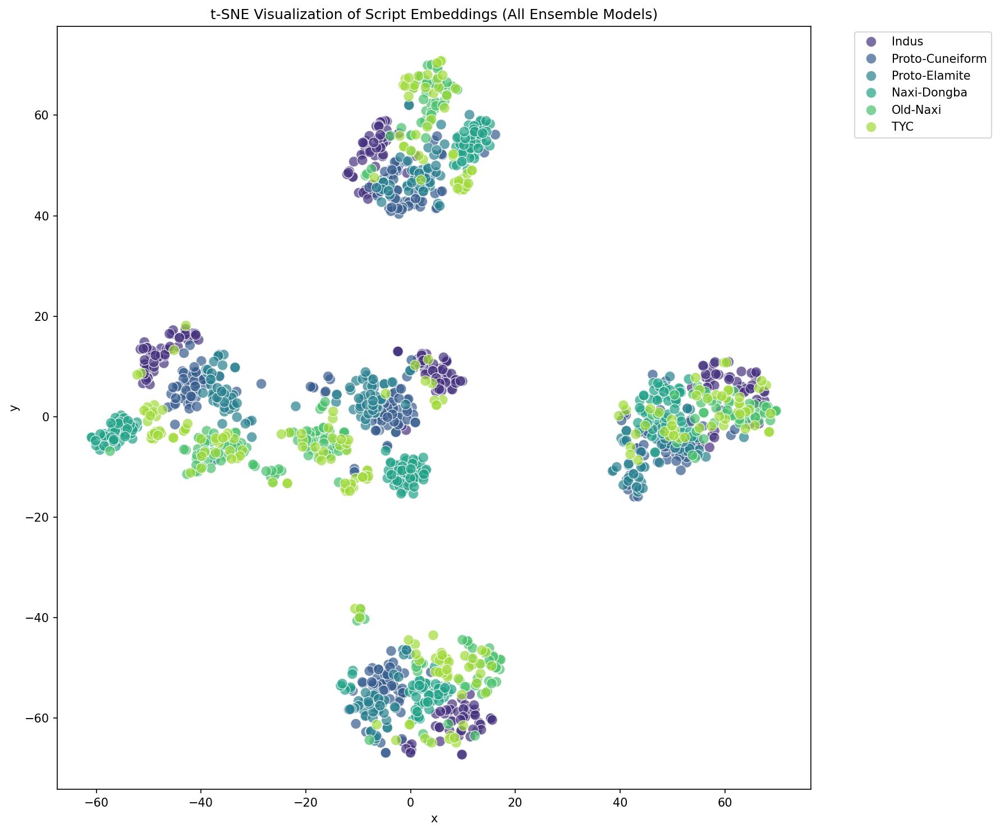

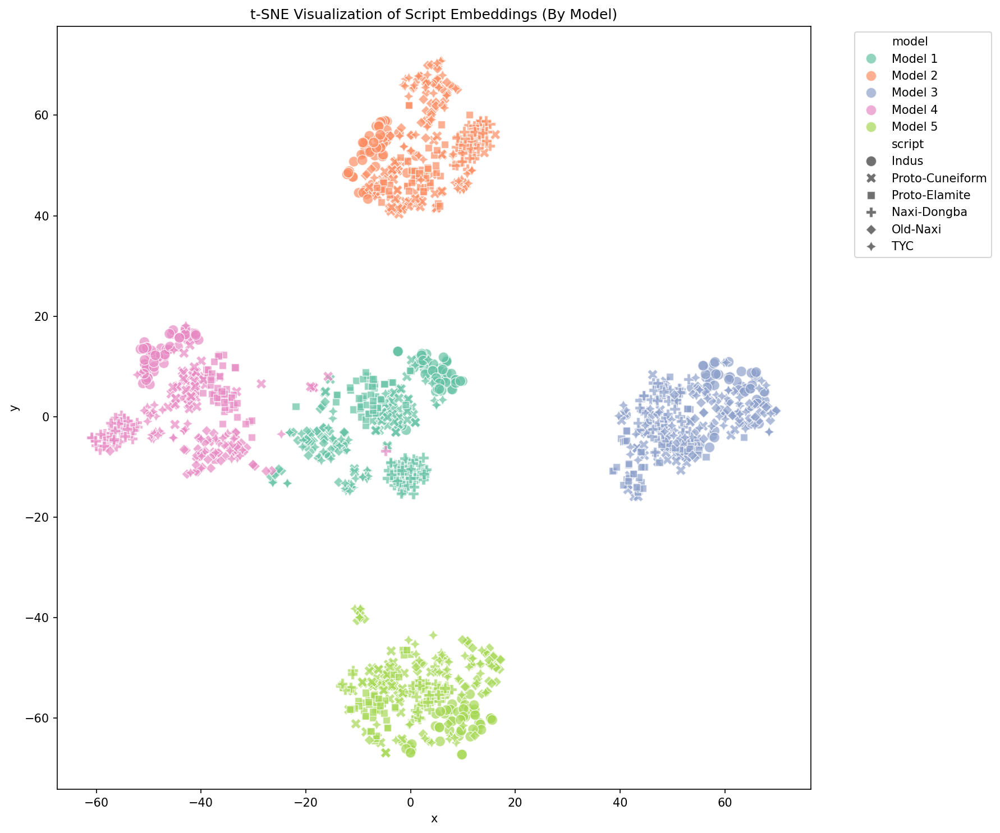


Analyzing Proto-Cuneiform ensemble models



<ipython-input-12-4b8e90544d9f>:59: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(row['model_path'], map_location=device)


Loaded 5 Proto-Cuneiform ensemble models
Extracting embeddings using model 1/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 2/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 3/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 4/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 5/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Saved Proto-Cuneiform embeddings to /content/drive/MyDrive/script_analysis/results/ensemble_run_20250305_160346/Proto-Cuneiform_embeddings.pkl


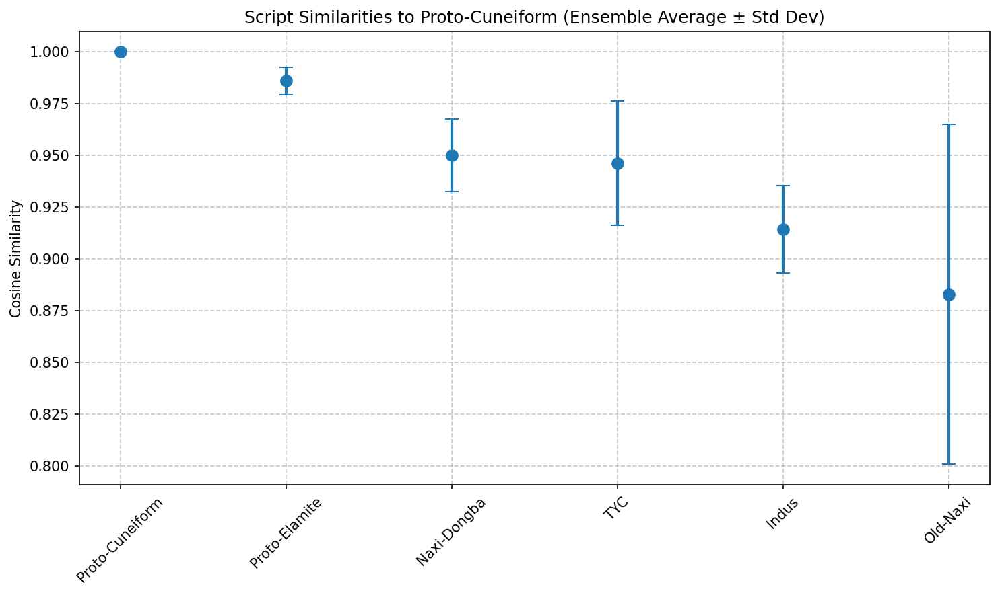

Saved similarity results to /content/drive/MyDrive/script_analysis/results/ensemble_run_20250305_160346/Proto-Cuneiform_similarities.csv
Running t-SNE with perplexity 30 on 1500 samples...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


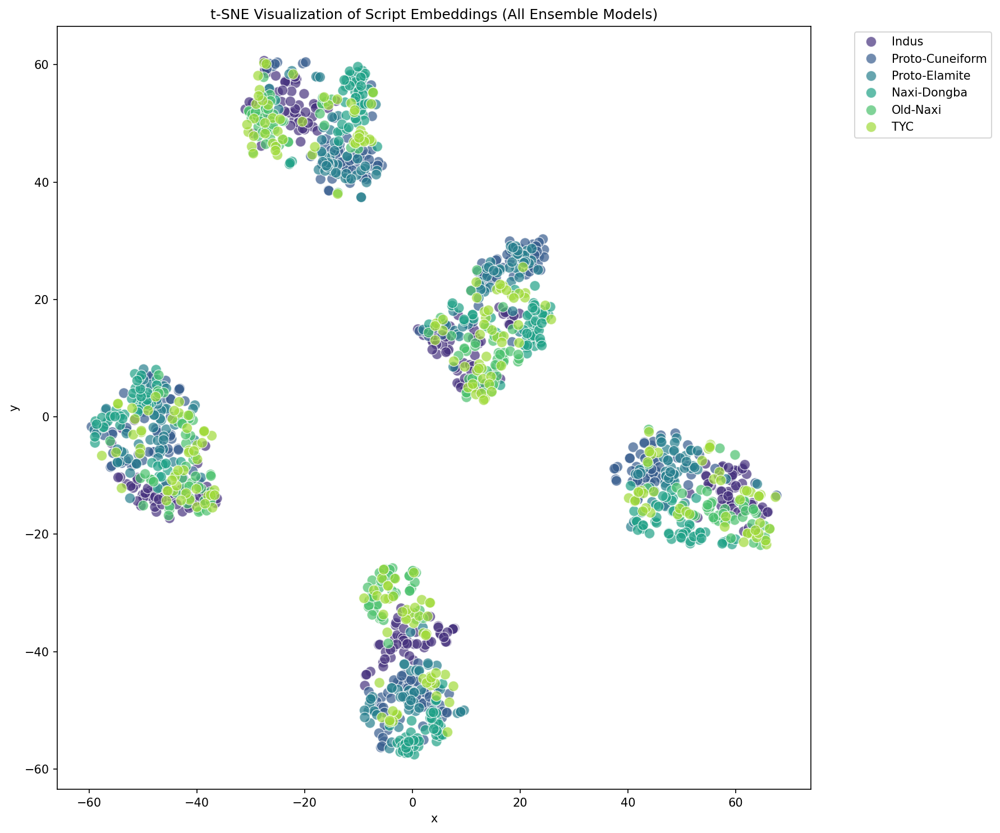

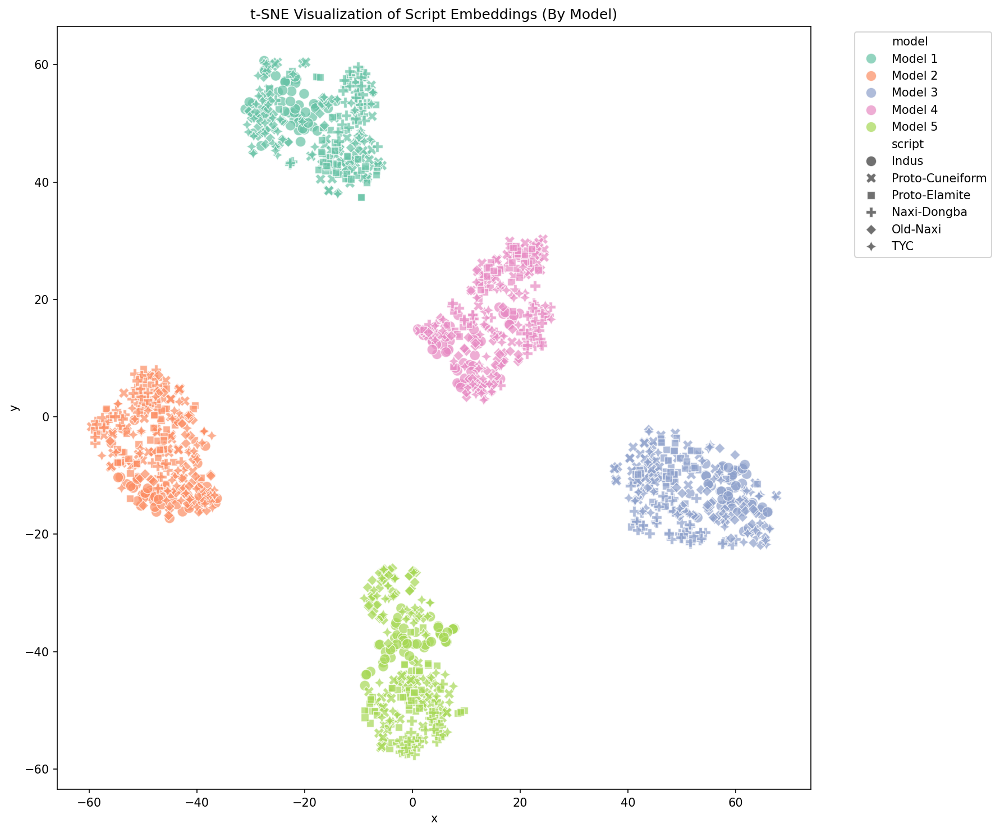


Analyzing Proto-Elamite ensemble models



<ipython-input-12-4b8e90544d9f>:59: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(row['model_path'], map_location=device)


Loaded 5 Proto-Elamite ensemble models
Extracting embeddings using model 1/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 2/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 3/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 4/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 5/5...
  Processing Indus...


  0%|          | 0/13 [00:00<?, ?it/s]

    Extracted 391 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Saved Proto-Elamite embeddings to /content/drive/MyDrive/script_analysis/results/ensemble_run_20250305_160346/Proto-Elamite_embeddings.pkl


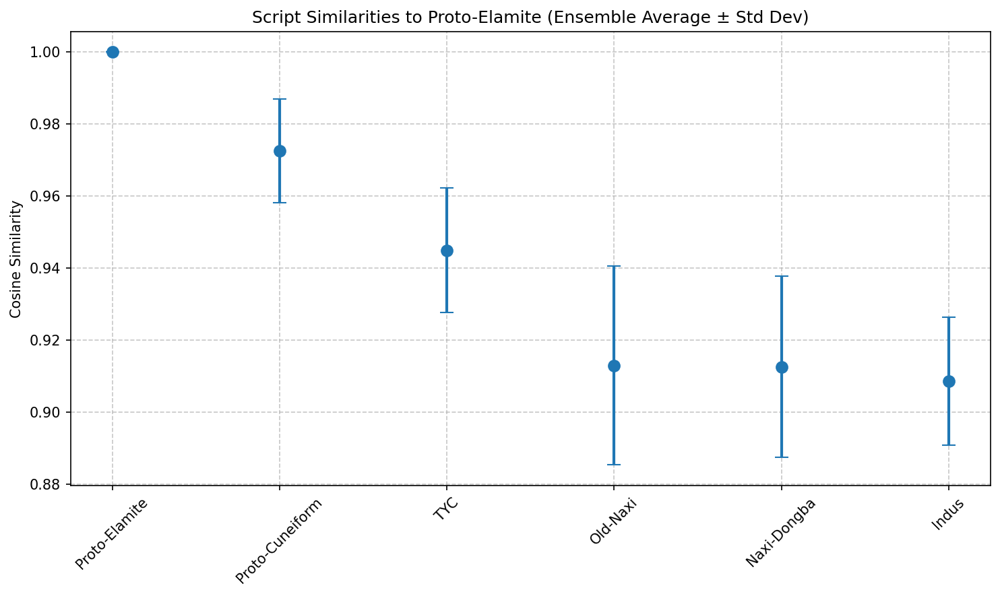

Saved similarity results to /content/drive/MyDrive/script_analysis/results/ensemble_run_20250305_160346/Proto-Elamite_similarities.csv
Running t-SNE with perplexity 30 on 1500 samples...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


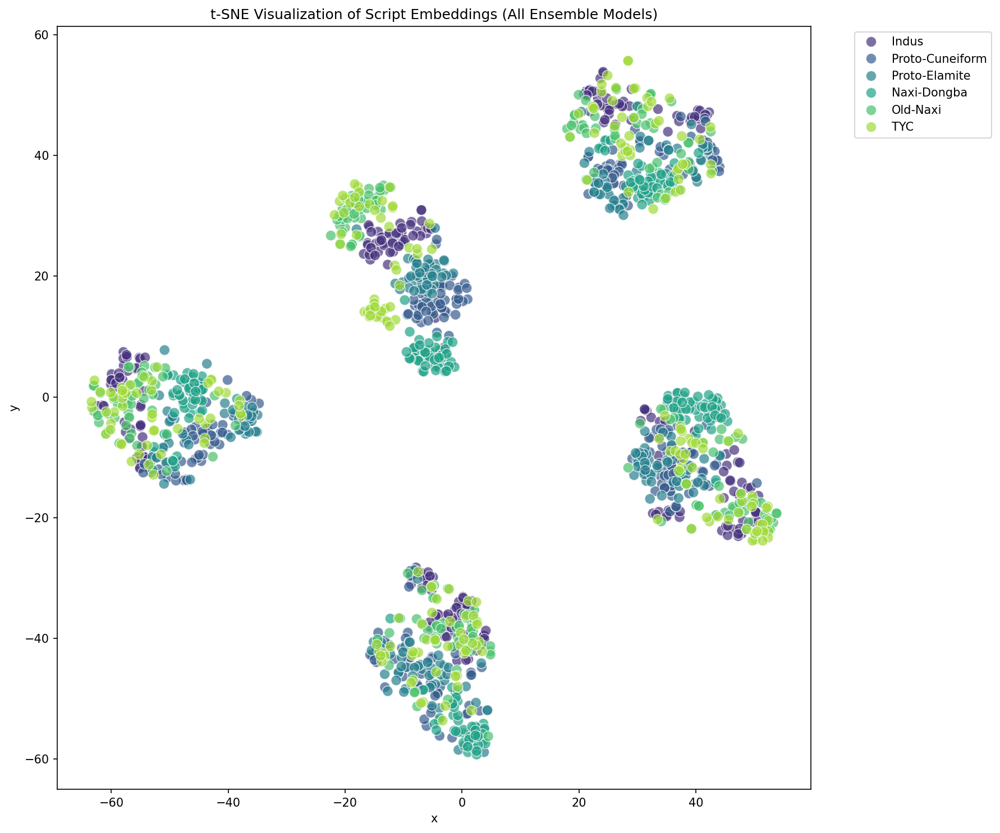

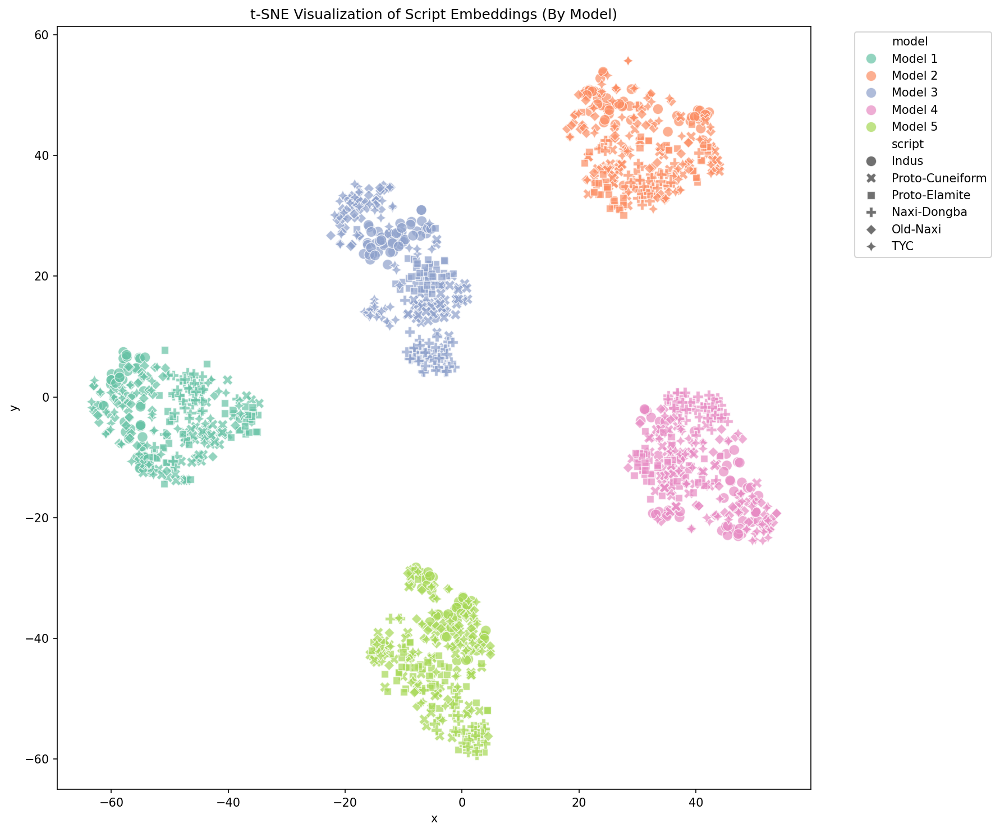


Performing cross-script similarity analysis...
Saved cross-script similarity results to /content/drive/MyDrive/script_analysis/results/ensemble_run_20250305_160346/cross_script_similarities.csv


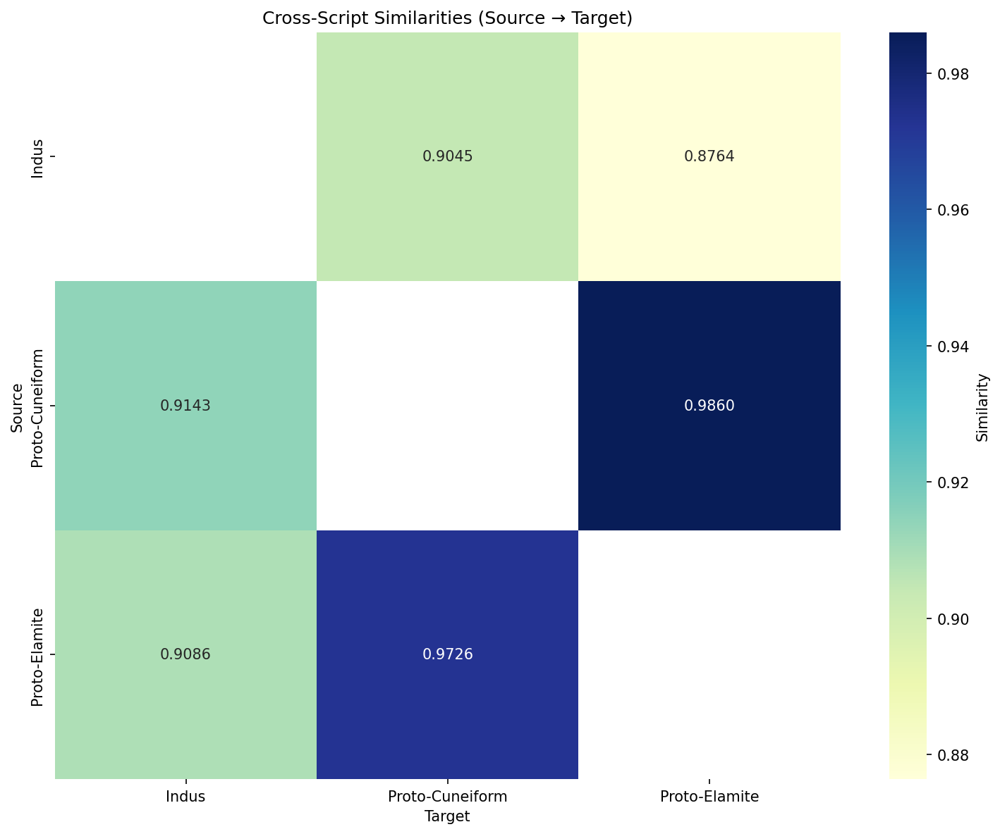


Ensemble pipeline completed successfully!
Full results saved to /content/drive/MyDrive/script_analysis/results/ensemble_run_20250305_160346

Creating combined visualizations across all model types...


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/script_analysis/results/full_research_20250305_160346/Indus_embeddings.pkl'

In [ ]:
full_results, research_dir = run_full_research_analysis()

In [ ]:
def run_indus_ensemble_test(num_models=5, epochs=20):
    print("Starting Indus ensemble test run")

    plt.rcParams['figure.figsize'] = (10, 6)

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    print(f"Test run timestamp: {timestamp}")

    indus_summary = train_ensemble(
        script_name="Indus",
        num_models=num_models,
        epochs=epochs,
        lr=3e-5,
        weight_decay=1e-3,
        augmentations_per_image=3,
        base_seed=42
    )

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    indus_models, _, _ = load_ensemble_models("Indus", device=device)

    print("\nCreating test datasets for all scripts...")

    script_datasets = {}
    all_scripts = list(dataset_paths.keys()) + ['TYC']

    for name in all_scripts:
        try:
            if name == 'TYC':
                path_var = 'TYC_PATH'
            else:
                path_var = f"{name.upper().replace('-', '_')}_PATH"

            if path_var in globals():
                paths = load_image_paths(globals()[path_var])
                if paths and len(paths) > 0:
                    test_transform = get_test_transforms(img_size=224)
                    dataset = ScriptDataset(paths, test_transform, name, denoise_types=["Old Naxi"])
                    script_datasets[name] = dataset
                    print(f"Created test dataset for {name} with {len(dataset)} samples")
        except Exception as e:
            print(f"Error creating dataset for {name}: {str(e)}")

    script_loaders = {
        name: DataLoader(dataset, batch_size=32, shuffle=False, num_workers=2)
        for name, dataset in script_datasets.items()
    }

    indus_embeddings = extract_ensemble_embeddings(indus_models, script_loaders, device)

    similarity_df = analyze_ensemble_similarities(indus_embeddings, "Indus")

    visualize_ensemble_tsne(indus_embeddings, perplexity=30, sample_size=30)

    print("\n--- Indus Ensemble Test Conclusions ---")
    print("Top 3 most similar scripts to Indus:")
    for i, (_, row) in enumerate(similarity_df.iloc[:3].iterrows()):
        print(f"{i+1}. {row['Script']}: {row['Mean Similarity']:.4f} ± {row['Std Dev']:.4f}")

    print("\nLeast similar script to Indus:")
    least_similar = similarity_df.iloc[-1]
    print(f"{least_similar['Script']}: {least_similar['Mean Similarity']:.4f} ± {least_similar['Std Dev']:.4f}")

    test_dir = os.path.join(RESULTS_DIR, f"indus_test_{timestamp}")
    os.makedirs(test_dir, exist_ok=True)

    similarity_df.to_csv(os.path.join(test_dir, "indus_similarities.csv"), index=False)
    print(f"\nResults saved to {test_dir}")

    return similarity_df, indus_embeddings

Starting Indus ensemble test run
Test run timestamp: 20250305_212204
Training ensemble of 5 Indus models on cuda

Training Indus Model 1/5 with seed 42
Created dataset for Indus: 715 original images + 2145 augmentations
Created dataset with 2860 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 8.9421 | LR: 0.000001
Contrastive: 7.4211, Variance: 0.9998, Penalty: 2.0003
Train Batch: 20/179 | Loss: 9.1413 | LR: 0.000002
Train Batch: 30/179 | Loss: 8.6218 | LR: 0.000003
Train Batch: 40/179 | Loss: 8.2679 | LR: 0.000003
Train Batch: 50/179 | Loss: 9.0059 | LR: 0.000004
Train Batch: 60/179 | Loss: 7.6589 | LR: 0.000005
Train Batch: 70/179 | Loss: 7.0694 | LR: 0.000006
Train Batch: 80/179 | Loss: 8.0587 | LR: 0.000007
Train Batch: 90/179 | Loss: 7.3533 | LR: 0.000008
Train Batch: 100/179 | Loss: 7.0263 | LR: 0.000008
Train Batch: 110/179 | Loss: 6.9185 | LR: 0.000009
Train Batch: 120/179 | Loss: 6.0625 | LR: 0.000010
Contrastive: 4.3656, Variance: 0.9993, Penalty: 2.0011
Train Batch: 130/179 | Loss: 6.5416 | LR: 0.000011
Train Batch: 140/179 | Loss: 6.3856 | LR: 0.000012
Train Batch: 150/179 | Loss: 6.0344 | LR: 0.000013
Train Batch: 160/179 | Loss: 5.6849 | LR: 0.000013
Train Batch: 170/179 | Loss: 5.7872 | LR: 0.000014
Train Batch: 179/179 | Loss: 5.8

Epoch 1/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 7.2703
Val Loss: 9.6703
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_1_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.7315 | LR: 0.000016
Train Batch: 20/179 | Loss: 6.4894 | LR: 0.000017
Train Batch: 30/179 | Loss: 5.7055 | LR: 0.000018
Train Batch: 40/179 | Loss: 5.5566 | LR: 0.000018
Train Batch: 50/179 | Loss: 5.5531 | LR: 0.000019
Train Batch: 60/179 | Loss: 5.8911 | LR: 0.000020
Train Batch: 70/179 | Loss: 5.6016 | LR: 0.000021
Train Batch: 80/179 | Loss: 6.4303 | LR: 0.000022
Contrastive: 3.4581, Variance: 0.9988, Penalty: 2.0022
Train Batch: 90/179 | Loss: 5.2681 | LR: 0.000023
Train Batch: 100/179 | Loss: 5.9955 | LR: 0.000023
Contrastive: 3.7173, Variance: 0.9992, Penalty: 2.0015
Train Batch: 110/179 | Loss: 5.7204 | LR: 0.000024
Contrastive: 3.1552, Variance: 0.9990, Penalty: 2.0018
Train Batch: 120/179 | Loss: 5.3761 | LR: 0.000025
Train Batch: 130/179 | Loss: 5.5276 | LR: 0.000026
Train Batch: 140/179 | Loss: 5.4792 | LR: 0.000027
Train Batch: 150/179 | Loss: 6.2353 | LR: 0.000028
Train Batch: 160/179 | Loss: 5.5243 | LR: 0.000028
Train Batch: 170/179 | Loss:

Epoch 2/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.6785
Val Loss: 10.7123
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Contrastive: 3.6830, Variance: 0.9992, Penalty: 2.0014
Train Batch: 10/179 | Loss: 6.5188 | LR: 0.000030
Train Batch: 20/179 | Loss: 5.5455 | LR: 0.000030
Contrastive: 3.6726, Variance: 0.9998, Penalty: 2.0002
Train Batch: 30/179 | Loss: 6.2974 | LR: 0.000030
Train Batch: 40/179 | Loss: 5.8379 | LR: 0.000030
Train Batch: 50/179 | Loss: 5.8087 | LR: 0.000030
Contrastive: 3.8391, Variance: 0.9993, Penalty: 2.0012
Train Batch: 60/179 | Loss: 5.5544 | LR: 0.000030
Train Batch: 70/179 | Loss: 5.8101 | LR: 0.000030
Train Batch: 80/179 | Loss: 5.7427 | LR: 0.000030
Train Batch: 90/179 | Loss: 5.7850 | LR: 0.000030
Train Batch: 100/179 | Loss: 5.3736 | LR: 0.000030
Train Batch: 110/179 | Loss: 5.2338 | LR: 0.000030
Contrastive: 4.3727, Variance: 0.9990, Penalty: 2.0019
Train Batch: 120/179 | Loss: 5.1250 | LR: 0.000030
Train Batch: 130/179 | Loss: 5.2701 | LR: 0.000030
Train Batch: 140/179 | Loss: 5.2185 | LR: 0.000030
Train Batch: 150/179 | Loss: 5.6002 | LR: 0.000030
Train Batch: 160/179 | L

Epoch 3/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.5738
Val Loss: 9.6562
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_1_hybrid_extractor_best.pth


Epoch 4/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.3967 | LR: 0.000030
Train Batch: 20/179 | Loss: 5.1380 | LR: 0.000030
Train Batch: 30/179 | Loss: 5.6879 | LR: 0.000030
Train Batch: 40/179 | Loss: 5.4490 | LR: 0.000030
Train Batch: 50/179 | Loss: 5.5590 | LR: 0.000030
Train Batch: 60/179 | Loss: 4.9547 | LR: 0.000030
Train Batch: 70/179 | Loss: 5.0775 | LR: 0.000030
Train Batch: 80/179 | Loss: 5.3237 | LR: 0.000030
Train Batch: 90/179 | Loss: 5.3269 | LR: 0.000029
Train Batch: 100/179 | Loss: 5.6913 | LR: 0.000029
Train Batch: 110/179 | Loss: 5.6215 | LR: 0.000029
Train Batch: 120/179 | Loss: 5.0184 | LR: 0.000029
Train Batch: 130/179 | Loss: 5.3610 | LR: 0.000029
Contrastive: 3.5359, Variance: 0.9995, Penalty: 2.0009
Train Batch: 140/179 | Loss: 5.4709 | LR: 0.000029
Train Batch: 150/179 | Loss: 5.1530 | LR: 0.000029
Train Batch: 160/179 | Loss: 5.4986 | LR: 0.000029
Train Batch: 170/179 | Loss: 5.2431 | LR: 0.000029
Train Batch: 179/179 | Loss: 5.1763 | LR: 0.000029


Epoch 4/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.5432
Val Loss: 10.1712
No improvement for 1 epochs


Epoch 5/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.9196 | LR: 0.000029
Train Batch: 20/179 | Loss: 6.0468 | LR: 0.000029
Train Batch: 30/179 | Loss: 5.7392 | LR: 0.000029
Train Batch: 40/179 | Loss: 5.4373 | LR: 0.000029
Train Batch: 50/179 | Loss: 5.6029 | LR: 0.000029
Train Batch: 60/179 | Loss: 5.1322 | LR: 0.000029
Train Batch: 70/179 | Loss: 5.5448 | LR: 0.000029
Train Batch: 80/179 | Loss: 6.0051 | LR: 0.000029
Train Batch: 90/179 | Loss: 5.7353 | LR: 0.000029
Train Batch: 100/179 | Loss: 5.5356 | LR: 0.000029
Train Batch: 110/179 | Loss: 5.7964 | LR: 0.000028
Train Batch: 120/179 | Loss: 5.2302 | LR: 0.000028
Train Batch: 130/179 | Loss: 5.5757 | LR: 0.000028
Train Batch: 140/179 | Loss: 5.1658 | LR: 0.000028
Contrastive: 3.4126, Variance: 0.9996, Penalty: 2.0006
Train Batch: 150/179 | Loss: 5.5718 | LR: 0.000028
Train Batch: 160/179 | Loss: 5.8144 | LR: 0.000028
Train Batch: 170/179 | Loss: 5.7058 | LR: 0.000028
Train Batch: 179/179 | Loss: 5.4758 | LR: 0.000028


Epoch 5/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5736
Val Loss: 9.9404
No improvement for 2 epochs


Epoch 6/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.4591 | LR: 0.000028
Train Batch: 20/179 | Loss: 5.3586 | LR: 0.000028
Train Batch: 30/179 | Loss: 5.8436 | LR: 0.000028
Train Batch: 40/179 | Loss: 5.9490 | LR: 0.000028
Train Batch: 50/179 | Loss: 5.8005 | LR: 0.000028
Train Batch: 60/179 | Loss: 6.1250 | LR: 0.000028
Train Batch: 70/179 | Loss: 5.9259 | LR: 0.000027
Train Batch: 80/179 | Loss: 6.0565 | LR: 0.000027
Train Batch: 90/179 | Loss: 5.5984 | LR: 0.000027
Train Batch: 100/179 | Loss: 5.4820 | LR: 0.000027
Contrastive: 4.1792, Variance: 0.9962, Penalty: 2.0074
Train Batch: 110/179 | Loss: 5.5561 | LR: 0.000027
Train Batch: 120/179 | Loss: 5.2881 | LR: 0.000027
Train Batch: 130/179 | Loss: 5.7701 | LR: 0.000027
Train Batch: 140/179 | Loss: 5.6515 | LR: 0.000027
Train Batch: 150/179 | Loss: 5.5127 | LR: 0.000027
Train Batch: 160/179 | Loss: 5.9595 | LR: 0.000027
Train Batch: 170/179 | Loss: 5.0168 | LR: 0.000027
Train Batch: 179/179 | Loss: 5.8325 | LR: 0.000026


Epoch 6/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.6569
Val Loss: 13.5225
No improvement for 3 epochs


Epoch 7/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 6.2878 | LR: 0.000026
Train Batch: 20/179 | Loss: 5.6987 | LR: 0.000026
Contrastive: 3.6482, Variance: 0.9995, Penalty: 2.0008
Train Batch: 30/179 | Loss: 5.3630 | LR: 0.000026
Train Batch: 40/179 | Loss: 5.6255 | LR: 0.000026
Train Batch: 50/179 | Loss: 5.5392 | LR: 0.000026
Train Batch: 60/179 | Loss: 5.6295 | LR: 0.000026
Contrastive: 3.8954, Variance: 0.9993, Penalty: 2.0012
Train Batch: 70/179 | Loss: 5.0248 | LR: 0.000026
Contrastive: 3.8241, Variance: 0.9989, Penalty: 2.0020
Train Batch: 80/179 | Loss: 4.9794 | LR: 0.000026
Train Batch: 90/179 | Loss: 5.5101 | LR: 0.000026
Train Batch: 100/179 | Loss: 5.1888 | LR: 0.000025
Train Batch: 110/179 | Loss: 5.3013 | LR: 0.000025
Train Batch: 120/179 | Loss: 5.4209 | LR: 0.000025
Train Batch: 130/179 | Loss: 5.3815 | LR: 0.000025
Train Batch: 140/179 | Loss: 5.3492 | LR: 0.000025
Train Batch: 150/179 | Loss: 5.6271 | LR: 0.000025
Train Batch: 160/179 | Loss: 5.4700 | LR: 0.000025
Train Batch: 170/179 | Loss:

Epoch 7/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 7/20
Train Loss: 5.4976
Val Loss: 12.6108
No improvement for 4 epochs


Epoch 8/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.3435 | LR: 0.000025
Train Batch: 20/179 | Loss: 5.6831 | LR: 0.000024
Train Batch: 30/179 | Loss: 5.7798 | LR: 0.000024
Train Batch: 40/179 | Loss: 5.6829 | LR: 0.000024
Train Batch: 50/179 | Loss: 5.2267 | LR: 0.000024
Train Batch: 60/179 | Loss: 5.6547 | LR: 0.000024
Train Batch: 70/179 | Loss: 5.2351 | LR: 0.000024
Train Batch: 80/179 | Loss: 5.0823 | LR: 0.000024
Train Batch: 90/179 | Loss: 5.1506 | LR: 0.000024
Train Batch: 100/179 | Loss: 5.8188 | LR: 0.000023
Contrastive: 3.8917, Variance: 0.9985, Penalty: 2.0029
Train Batch: 110/179 | Loss: 6.1150 | LR: 0.000023
Train Batch: 120/179 | Loss: 5.6349 | LR: 0.000023
Train Batch: 130/179 | Loss: 4.9949 | LR: 0.000023
Train Batch: 140/179 | Loss: 5.1323 | LR: 0.000023
Train Batch: 150/179 | Loss: 5.5191 | LR: 0.000023
Train Batch: 160/179 | Loss: 5.2328 | LR: 0.000023
Train Batch: 170/179 | Loss: 5.4586 | LR: 0.000023
Train Batch: 179/179 | Loss: 5.3044 | LR: 0.000023


Epoch 8/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 8/20
Train Loss: 5.5403
Val Loss: 10.1442
No improvement for 5 epochs
Early stopping triggered after epoch 8
Final model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_1_hybrid_extractor_final.pth


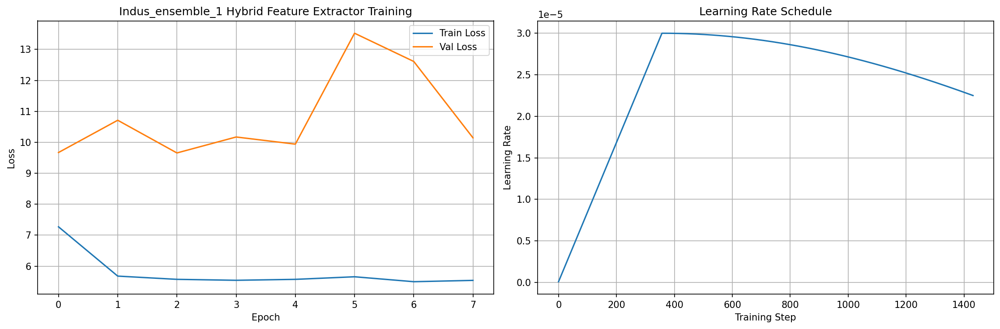

Training completed. Best validation loss: 9.6562 at epoch 3


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Indus Model 2/5 with seed 43
Created dataset for Indus: 715 original images + 2145 augmentations
Created dataset with 2860 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 8.4734 | LR: 0.000001
Train Batch: 20/179 | Loss: 8.1164 | LR: 0.000002
Train Batch: 30/179 | Loss: 9.0675 | LR: 0.000003
Train Batch: 40/179 | Loss: 8.5424 | LR: 0.000003
Train Batch: 50/179 | Loss: 8.1526 | LR: 0.000004
Train Batch: 60/179 | Loss: 8.0357 | LR: 0.000005
Train Batch: 70/179 | Loss: 8.0084 | LR: 0.000006
Contrastive: 6.8162, Variance: 0.9994, Penalty: 2.0009
Train Batch: 80/179 | Loss: 7.8346 | LR: 0.000007
Train Batch: 90/179 | Loss: 7.4268 | LR: 0.000008
Train Batch: 100/179 | Loss: 6.8007 | LR: 0.000008
Train Batch: 110/179 | Loss: 6.8892 | LR: 0.000009
Train Batch: 120/179 | Loss: 7.0639 | LR: 0.000010
Contrastive: 5.1177, Variance: 0.9993, Penalty: 2.0012
Train Batch: 130/179 | Loss: 6.8352 | LR: 0.000011
Train Batch: 140/179 | Loss: 6.7892 | LR: 0.000012
Train Batch: 150/179 | Loss: 5.8518 | LR: 0.000013
Train Batch: 160/179 | Loss: 6.0268 | LR: 0.000013
Train Batch: 170/179 | Loss: 6.1610 | LR: 0.000014
Train Batch: 179/179 | Loss: 5.8

Epoch 1/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 7.4294
Val Loss: 9.4926
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_2_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.1785 | LR: 0.000016
Train Batch: 20/179 | Loss: 6.1507 | LR: 0.000017
Train Batch: 30/179 | Loss: 5.8775 | LR: 0.000018
Train Batch: 40/179 | Loss: 5.4557 | LR: 0.000018
Train Batch: 50/179 | Loss: 5.7343 | LR: 0.000019
Train Batch: 60/179 | Loss: 5.0920 | LR: 0.000020
Train Batch: 70/179 | Loss: 5.8210 | LR: 0.000021
Train Batch: 80/179 | Loss: 6.6729 | LR: 0.000022
Train Batch: 90/179 | Loss: 5.7478 | LR: 0.000023
Train Batch: 100/179 | Loss: 5.3907 | LR: 0.000023
Train Batch: 110/179 | Loss: 4.9413 | LR: 0.000024
Train Batch: 120/179 | Loss: 5.2013 | LR: 0.000025
Train Batch: 130/179 | Loss: 5.1805 | LR: 0.000026
Train Batch: 140/179 | Loss: 5.3154 | LR: 0.000027
Train Batch: 150/179 | Loss: 5.1914 | LR: 0.000028
Train Batch: 160/179 | Loss: 4.9643 | LR: 0.000028
Train Batch: 170/179 | Loss: 5.4317 | LR: 0.000029
Train Batch: 179/179 | Loss: 4.8601 | LR: 0.000030


Epoch 2/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.6092
Val Loss: 9.8563
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.9937 | LR: 0.000030
Train Batch: 20/179 | Loss: 5.3172 | LR: 0.000030
Contrastive: 3.8194, Variance: 0.9983, Penalty: 2.0032
Train Batch: 30/179 | Loss: 5.5370 | LR: 0.000030
Train Batch: 40/179 | Loss: 5.4936 | LR: 0.000030
Train Batch: 50/179 | Loss: 5.4259 | LR: 0.000030
Train Batch: 60/179 | Loss: 5.2457 | LR: 0.000030
Train Batch: 70/179 | Loss: 5.6807 | LR: 0.000030
Train Batch: 80/179 | Loss: 5.4180 | LR: 0.000030
Train Batch: 90/179 | Loss: 5.5520 | LR: 0.000030
Train Batch: 100/179 | Loss: 5.3523 | LR: 0.000030
Train Batch: 110/179 | Loss: 5.8213 | LR: 0.000030
Train Batch: 120/179 | Loss: 5.7603 | LR: 0.000030
Train Batch: 130/179 | Loss: 6.2040 | LR: 0.000030
Train Batch: 140/179 | Loss: 5.7018 | LR: 0.000030
Train Batch: 150/179 | Loss: 5.5154 | LR: 0.000030
Train Batch: 160/179 | Loss: 4.8586 | LR: 0.000030
Train Batch: 170/179 | Loss: 5.0929 | LR: 0.000030
Train Batch: 179/179 | Loss: 4.7983 | LR: 0.000030


Epoch 3/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.5875
Val Loss: 11.3154
No improvement for 2 epochs


Epoch 4/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 6.0224 | LR: 0.000030
Contrastive: 4.1823, Variance: 0.9993, Penalty: 2.0012
Train Batch: 20/179 | Loss: 5.4782 | LR: 0.000030
Train Batch: 30/179 | Loss: 5.9704 | LR: 0.000030
Train Batch: 40/179 | Loss: 5.5465 | LR: 0.000030
Train Batch: 50/179 | Loss: 5.7358 | LR: 0.000030
Train Batch: 60/179 | Loss: 5.8905 | LR: 0.000030
Train Batch: 70/179 | Loss: 5.3592 | LR: 0.000030
Train Batch: 80/179 | Loss: 6.0709 | LR: 0.000030
Train Batch: 90/179 | Loss: 5.0255 | LR: 0.000029
Train Batch: 100/179 | Loss: 4.8471 | LR: 0.000029
Train Batch: 110/179 | Loss: 5.9385 | LR: 0.000029
Train Batch: 120/179 | Loss: 5.5973 | LR: 0.000029
Train Batch: 130/179 | Loss: 6.2872 | LR: 0.000029
Train Batch: 140/179 | Loss: 5.8101 | LR: 0.000029
Train Batch: 150/179 | Loss: 5.9998 | LR: 0.000029
Contrastive: 4.1338, Variance: 0.9976, Penalty: 2.0045
Train Batch: 160/179 | Loss: 5.4332 | LR: 0.000029
Train Batch: 170/179 | Loss: 6.0979 | LR: 0.000029
Train Batch: 179/179 | Loss: 5.2

Epoch 4/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.6768
Val Loss: 12.9127
No improvement for 3 epochs


Epoch 5/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 6.0897 | LR: 0.000029
Contrastive: 3.9415, Variance: 0.9989, Penalty: 2.0020
Train Batch: 20/179 | Loss: 5.6578 | LR: 0.000029
Train Batch: 30/179 | Loss: 5.9089 | LR: 0.000029
Train Batch: 40/179 | Loss: 5.0788 | LR: 0.000029
Train Batch: 50/179 | Loss: 6.1154 | LR: 0.000029
Train Batch: 60/179 | Loss: 5.7310 | LR: 0.000029
Train Batch: 70/179 | Loss: 5.2700 | LR: 0.000029
Train Batch: 80/179 | Loss: 6.0024 | LR: 0.000029
Train Batch: 90/179 | Loss: 5.6077 | LR: 0.000029
Train Batch: 100/179 | Loss: 5.1081 | LR: 0.000029
Train Batch: 110/179 | Loss: 5.8004 | LR: 0.000028
Train Batch: 120/179 | Loss: 5.9278 | LR: 0.000028
Train Batch: 130/179 | Loss: 5.7643 | LR: 0.000028
Train Batch: 140/179 | Loss: 6.0841 | LR: 0.000028
Train Batch: 150/179 | Loss: 5.5176 | LR: 0.000028
Train Batch: 160/179 | Loss: 6.3811 | LR: 0.000028
Contrastive: 4.3055, Variance: 0.9976, Penalty: 2.0046
Train Batch: 170/179 | Loss: 6.0293 | LR: 0.000028
Train Batch: 179/179 | Loss: 5.0

Epoch 5/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.6458
Val Loss: 21.6088
No improvement for 4 epochs


Epoch 6/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Contrastive: 3.9380, Variance: 0.9990, Penalty: 2.0019
Train Batch: 10/179 | Loss: 5.4101 | LR: 0.000028
Train Batch: 20/179 | Loss: 5.2991 | LR: 0.000028
Train Batch: 30/179 | Loss: 5.6031 | LR: 0.000028
Train Batch: 40/179 | Loss: 5.2618 | LR: 0.000028
Train Batch: 50/179 | Loss: 6.1985 | LR: 0.000028
Train Batch: 60/179 | Loss: 5.9363 | LR: 0.000028
Train Batch: 70/179 | Loss: 6.1995 | LR: 0.000027
Train Batch: 80/179 | Loss: 5.8563 | LR: 0.000027
Train Batch: 90/179 | Loss: 5.9153 | LR: 0.000027
Train Batch: 100/179 | Loss: 4.8053 | LR: 0.000027
Train Batch: 110/179 | Loss: 5.3398 | LR: 0.000027
Train Batch: 120/179 | Loss: 4.9709 | LR: 0.000027
Train Batch: 130/179 | Loss: 6.3416 | LR: 0.000027
Train Batch: 140/179 | Loss: 5.9419 | LR: 0.000027
Train Batch: 150/179 | Loss: 6.1024 | LR: 0.000027
Train Batch: 160/179 | Loss: 5.4840 | LR: 0.000027
Train Batch: 170/179 | Loss: 5.4134 | LR: 0.000027
Train Batch: 179/179 | Loss: 4.7350 | LR: 0.000026


Epoch 6/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.6358
Val Loss: 11.5367
No improvement for 5 epochs
Early stopping triggered after epoch 6
Final model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_2_hybrid_extractor_final.pth


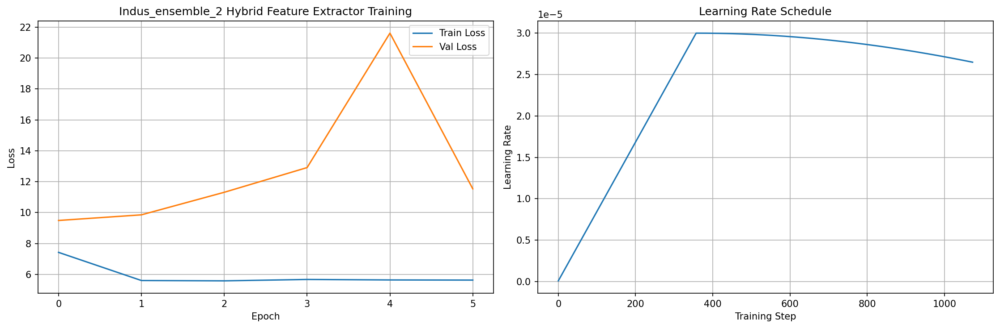

Training completed. Best validation loss: 9.4926 at epoch 1


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Indus Model 3/5 with seed 44
Created dataset for Indus: 715 original images + 2145 augmentations
Created dataset with 2860 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Contrastive: 5.5752, Variance: 0.9993, Penalty: 2.0012
Train Batch: 10/179 | Loss: 8.8831 | LR: 0.000001
Train Batch: 20/179 | Loss: 9.0244 | LR: 0.000002
Train Batch: 30/179 | Loss: 8.0124 | LR: 0.000003
Train Batch: 40/179 | Loss: 8.0297 | LR: 0.000003
Train Batch: 50/179 | Loss: 8.7211 | LR: 0.000004
Train Batch: 60/179 | Loss: 8.1259 | LR: 0.000005
Train Batch: 70/179 | Loss: 7.5405 | LR: 0.000006
Contrastive: 6.6143, Variance: 0.9995, Penalty: 2.0008
Train Batch: 80/179 | Loss: 8.3330 | LR: 0.000007
Train Batch: 90/179 | Loss: 7.0051 | LR: 0.000008
Train Batch: 100/179 | Loss: 7.4409 | LR: 0.000008
Train Batch: 110/179 | Loss: 7.5377 | LR: 0.000009
Train Batch: 120/179 | Loss: 6.1316 | LR: 0.000010
Train Batch: 130/179 | Loss: 6.7530 | LR: 0.000011
Train Batch: 140/179 | Loss: 4.8286 | LR: 0.000012
Contrastive: 4.6482, Variance: 0.9987, Penalty: 2.0025
Train Batch: 150/179 | Loss: 6.2495 | LR: 0.000013
Train Batch: 160/179 | Loss: 6.2026 | LR: 0.000013
Train Batch: 170/179 | Loss:

Epoch 1/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 7.4079
Val Loss: 11.0625
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_3_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 6.3313 | LR: 0.000016
Train Batch: 20/179 | Loss: 5.6627 | LR: 0.000017
Contrastive: 3.9302, Variance: 0.9993, Penalty: 2.0011
Train Batch: 30/179 | Loss: 5.8900 | LR: 0.000018
Contrastive: 4.1543, Variance: 0.9996, Penalty: 2.0005
Train Batch: 40/179 | Loss: 5.7817 | LR: 0.000018
Train Batch: 50/179 | Loss: 5.0112 | LR: 0.000019
Train Batch: 60/179 | Loss: 5.3300 | LR: 0.000020
Train Batch: 70/179 | Loss: 5.7140 | LR: 0.000021
Train Batch: 80/179 | Loss: 5.9075 | LR: 0.000022
Train Batch: 90/179 | Loss: 6.0263 | LR: 0.000023
Train Batch: 100/179 | Loss: 5.3264 | LR: 0.000023
Train Batch: 110/179 | Loss: 5.6538 | LR: 0.000024
Train Batch: 120/179 | Loss: 5.5161 | LR: 0.000025
Train Batch: 130/179 | Loss: 5.5532 | LR: 0.000026
Train Batch: 140/179 | Loss: 5.6709 | LR: 0.000027
Train Batch: 150/179 | Loss: 5.6879 | LR: 0.000028
Train Batch: 160/179 | Loss: 5.8199 | LR: 0.000028
Train Batch: 170/179 | Loss: 5.6778 | LR: 0.000029
Contrastive: 3.9985, Variance: 0

Epoch 2/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.6588
Val Loss: 11.0961
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.9793 | LR: 0.000030
Train Batch: 20/179 | Loss: 5.7591 | LR: 0.000030
Train Batch: 30/179 | Loss: 6.0248 | LR: 0.000030
Train Batch: 40/179 | Loss: 5.4483 | LR: 0.000030
Train Batch: 50/179 | Loss: 5.6159 | LR: 0.000030
Train Batch: 60/179 | Loss: 5.2851 | LR: 0.000030
Train Batch: 70/179 | Loss: 5.9328 | LR: 0.000030
Train Batch: 80/179 | Loss: 5.8601 | LR: 0.000030
Train Batch: 90/179 | Loss: 5.4332 | LR: 0.000030
Train Batch: 100/179 | Loss: 5.2516 | LR: 0.000030
Train Batch: 110/179 | Loss: 5.1333 | LR: 0.000030
Train Batch: 120/179 | Loss: 5.5191 | LR: 0.000030
Train Batch: 130/179 | Loss: 5.7460 | LR: 0.000030
Train Batch: 140/179 | Loss: 5.2591 | LR: 0.000030
Train Batch: 150/179 | Loss: 5.4069 | LR: 0.000030
Train Batch: 160/179 | Loss: 5.8052 | LR: 0.000030
Train Batch: 170/179 | Loss: 5.1166 | LR: 0.000030
Train Batch: 179/179 | Loss: 4.7451 | LR: 0.000030


Epoch 3/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.5730
Val Loss: 10.5295
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_3_hybrid_extractor_best.pth


Epoch 4/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.9905 | LR: 0.000030
Train Batch: 20/179 | Loss: 6.0717 | LR: 0.000030
Train Batch: 30/179 | Loss: 5.4402 | LR: 0.000030
Train Batch: 40/179 | Loss: 5.4426 | LR: 0.000030
Train Batch: 50/179 | Loss: 5.8184 | LR: 0.000030
Train Batch: 60/179 | Loss: 5.2889 | LR: 0.000030
Train Batch: 70/179 | Loss: 5.9793 | LR: 0.000030
Train Batch: 80/179 | Loss: 5.7826 | LR: 0.000030
Contrastive: 4.0351, Variance: 0.9995, Penalty: 2.0008
Train Batch: 90/179 | Loss: 5.2285 | LR: 0.000029
Contrastive: 3.8089, Variance: 0.9983, Penalty: 2.0031
Train Batch: 100/179 | Loss: 5.9116 | LR: 0.000029
Train Batch: 110/179 | Loss: 5.6313 | LR: 0.000029
Train Batch: 120/179 | Loss: 5.6328 | LR: 0.000029
Train Batch: 130/179 | Loss: 5.3968 | LR: 0.000029
Train Batch: 140/179 | Loss: 5.9725 | LR: 0.000029
Train Batch: 150/179 | Loss: 6.0861 | LR: 0.000029
Contrastive: 3.7426, Variance: 0.9972, Penalty: 2.0053
Train Batch: 160/179 | Loss: 5.3122 | LR: 0.000029
Train Batch: 170/179 | Loss:

Epoch 4/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.6388
Val Loss: 11.7147
No improvement for 1 epochs


Epoch 5/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Contrastive: 3.9931, Variance: 0.9991, Penalty: 2.0017
Train Batch: 10/179 | Loss: 5.2145 | LR: 0.000029
Train Batch: 20/179 | Loss: 4.9697 | LR: 0.000029
Train Batch: 30/179 | Loss: 5.4999 | LR: 0.000029
Train Batch: 40/179 | Loss: 5.7976 | LR: 0.000029
Train Batch: 50/179 | Loss: 4.7878 | LR: 0.000029
Train Batch: 60/179 | Loss: 5.5960 | LR: 0.000029
Train Batch: 70/179 | Loss: 5.6150 | LR: 0.000029
Train Batch: 80/179 | Loss: 6.1924 | LR: 0.000029
Train Batch: 90/179 | Loss: 5.2158 | LR: 0.000029
Train Batch: 100/179 | Loss: 5.7814 | LR: 0.000029
Train Batch: 110/179 | Loss: 5.2681 | LR: 0.000028
Train Batch: 120/179 | Loss: 6.1392 | LR: 0.000028
Train Batch: 130/179 | Loss: 5.2184 | LR: 0.000028
Train Batch: 140/179 | Loss: 5.6097 | LR: 0.000028
Train Batch: 150/179 | Loss: 5.0619 | LR: 0.000028
Train Batch: 160/179 | Loss: 5.7442 | LR: 0.000028
Contrastive: 3.3176, Variance: 0.9990, Penalty: 2.0018
Train Batch: 170/179 | Loss: 5.3732 | LR: 0.000028
Train Batch: 179/179 | Loss: 4.9

Epoch 5/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5779
Val Loss: 11.0944
No improvement for 2 epochs


Epoch 6/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.4920 | LR: 0.000028
Train Batch: 20/179 | Loss: 5.7777 | LR: 0.000028
Train Batch: 30/179 | Loss: 5.5271 | LR: 0.000028
Train Batch: 40/179 | Loss: 5.6466 | LR: 0.000028
Contrastive: 3.7061, Variance: 0.9998, Penalty: 2.0003
Train Batch: 50/179 | Loss: 4.8070 | LR: 0.000028
Train Batch: 60/179 | Loss: 5.3520 | LR: 0.000028
Train Batch: 70/179 | Loss: 5.8308 | LR: 0.000027
Train Batch: 80/179 | Loss: 5.4340 | LR: 0.000027
Train Batch: 90/179 | Loss: 5.6902 | LR: 0.000027
Train Batch: 100/179 | Loss: 5.4305 | LR: 0.000027
Train Batch: 110/179 | Loss: 5.4212 | LR: 0.000027
Train Batch: 120/179 | Loss: 5.8673 | LR: 0.000027
Train Batch: 130/179 | Loss: 5.2622 | LR: 0.000027
Contrastive: 3.5325, Variance: 0.9995, Penalty: 2.0008
Contrastive: 3.2755, Variance: 0.9997, Penalty: 2.0004
Train Batch: 140/179 | Loss: 5.4258 | LR: 0.000027
Train Batch: 150/179 | Loss: 5.4450 | LR: 0.000027
Train Batch: 160/179 | Loss: 5.6403 | LR: 0.000027
Train Batch: 170/179 | Loss:

Epoch 6/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.4853
Val Loss: 10.4527
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_3_hybrid_extractor_best.pth


Epoch 7/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.6131 | LR: 0.000026
Train Batch: 20/179 | Loss: 5.4227 | LR: 0.000026
Train Batch: 30/179 | Loss: 5.8200 | LR: 0.000026
Train Batch: 40/179 | Loss: 5.6791 | LR: 0.000026
Train Batch: 50/179 | Loss: 5.8324 | LR: 0.000026
Train Batch: 60/179 | Loss: 5.7830 | LR: 0.000026
Train Batch: 70/179 | Loss: 5.0701 | LR: 0.000026
Train Batch: 80/179 | Loss: 5.7739 | LR: 0.000026
Train Batch: 90/179 | Loss: 5.1349 | LR: 0.000026
Contrastive: 3.9581, Variance: 0.9993, Penalty: 2.0012
Train Batch: 100/179 | Loss: 5.2870 | LR: 0.000025
Train Batch: 110/179 | Loss: 6.6221 | LR: 0.000025
Train Batch: 120/179 | Loss: 6.7533 | LR: 0.000025
Train Batch: 130/179 | Loss: 5.8296 | LR: 0.000025
Train Batch: 140/179 | Loss: 5.7168 | LR: 0.000025
Train Batch: 150/179 | Loss: 6.2868 | LR: 0.000025
Contrastive: 4.3425, Variance: 0.9964, Penalty: 2.0069
Train Batch: 160/179 | Loss: 6.3672 | LR: 0.000025
Contrastive: 4.0463, Variance: 0.9988, Penalty: 2.0022
Train Batch: 170/179 | Loss:

Epoch 7/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 7/20
Train Loss: 5.6717
Val Loss: 11.7525
No improvement for 1 epochs


Epoch 8/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.4019 | LR: 0.000025
Train Batch: 20/179 | Loss: 5.6441 | LR: 0.000024
Train Batch: 30/179 | Loss: 5.6494 | LR: 0.000024
Train Batch: 40/179 | Loss: 5.2250 | LR: 0.000024
Train Batch: 50/179 | Loss: 5.2454 | LR: 0.000024
Train Batch: 60/179 | Loss: 5.9413 | LR: 0.000024
Train Batch: 70/179 | Loss: 5.5508 | LR: 0.000024
Contrastive: 3.5000, Variance: 0.9973, Penalty: 2.0051
Train Batch: 80/179 | Loss: 5.5946 | LR: 0.000024
Train Batch: 90/179 | Loss: 4.5723 | LR: 0.000024
Train Batch: 100/179 | Loss: 4.9379 | LR: 0.000023
Train Batch: 110/179 | Loss: 5.2747 | LR: 0.000023
Train Batch: 120/179 | Loss: 5.7491 | LR: 0.000023
Train Batch: 130/179 | Loss: 5.5176 | LR: 0.000023
Train Batch: 140/179 | Loss: 5.0348 | LR: 0.000023
Train Batch: 150/179 | Loss: 5.4863 | LR: 0.000023
Train Batch: 160/179 | Loss: 5.7297 | LR: 0.000023
Train Batch: 170/179 | Loss: 5.6839 | LR: 0.000023
Contrastive: 3.9467, Variance: 0.9992, Penalty: 2.0013
Train Batch: 179/179 | Loss: 5.6

Epoch 8/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 8/20
Train Loss: 5.5259
Val Loss: 10.7448
No improvement for 2 epochs


Epoch 9/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.3630 | LR: 0.000022
Train Batch: 20/179 | Loss: 5.8814 | LR: 0.000022
Train Batch: 30/179 | Loss: 5.3765 | LR: 0.000022
Contrastive: 3.9897, Variance: 0.9994, Penalty: 2.0009
Train Batch: 40/179 | Loss: 5.3692 | LR: 0.000022
Train Batch: 50/179 | Loss: 5.4312 | LR: 0.000022
Train Batch: 60/179 | Loss: 5.5956 | LR: 0.000022
Train Batch: 70/179 | Loss: 5.7784 | LR: 0.000022
Train Batch: 80/179 | Loss: 5.6832 | LR: 0.000021
Train Batch: 90/179 | Loss: 5.7155 | LR: 0.000021
Train Batch: 100/179 | Loss: 5.8945 | LR: 0.000021
Contrastive: 3.9219, Variance: 0.9994, Penalty: 2.0009
Train Batch: 110/179 | Loss: 5.6281 | LR: 0.000021
Train Batch: 120/179 | Loss: 5.7783 | LR: 0.000021
Train Batch: 130/179 | Loss: 5.8354 | LR: 0.000021
Train Batch: 140/179 | Loss: 5.7589 | LR: 0.000021
Train Batch: 150/179 | Loss: 5.9744 | LR: 0.000021
Train Batch: 160/179 | Loss: 5.2261 | LR: 0.000020
Train Batch: 170/179 | Loss: 5.3148 | LR: 0.000020
Train Batch: 179/179 | Loss: 4.5

Epoch 9/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 9/20
Train Loss: 5.4774
Val Loss: 9.8897
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_3_hybrid_extractor_best.pth


Epoch 10/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.3247 | LR: 0.000020
Train Batch: 20/179 | Loss: 5.4450 | LR: 0.000020
Train Batch: 30/179 | Loss: 5.5417 | LR: 0.000020
Train Batch: 40/179 | Loss: 5.5585 | LR: 0.000020
Train Batch: 50/179 | Loss: 5.5149 | LR: 0.000019
Train Batch: 60/179 | Loss: 5.6953 | LR: 0.000019
Train Batch: 70/179 | Loss: 5.4808 | LR: 0.000019
Train Batch: 80/179 | Loss: 5.7103 | LR: 0.000019
Contrastive: 3.9012, Variance: 0.9980, Penalty: 2.0039
Train Batch: 90/179 | Loss: 5.8447 | LR: 0.000019
Train Batch: 100/179 | Loss: 5.4267 | LR: 0.000019
Train Batch: 110/179 | Loss: 5.4947 | LR: 0.000019
Train Batch: 120/179 | Loss: 5.3686 | LR: 0.000018
Train Batch: 130/179 | Loss: 5.1246 | LR: 0.000018
Train Batch: 140/179 | Loss: 5.7184 | LR: 0.000018
Train Batch: 150/179 | Loss: 5.6272 | LR: 0.000018
Train Batch: 160/179 | Loss: 5.4652 | LR: 0.000018
Train Batch: 170/179 | Loss: 5.4184 | LR: 0.000018
Train Batch: 179/179 | Loss: 5.2613 | LR: 0.000018


Epoch 10/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 10/20
Train Loss: 5.4295
Val Loss: 9.5533
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_3_hybrid_extractor_best.pth


Epoch 11/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Contrastive: 3.4396, Variance: 0.9989, Penalty: 2.0020
Train Batch: 10/179 | Loss: 5.4868 | LR: 0.000017
Train Batch: 20/179 | Loss: 4.5601 | LR: 0.000017
Train Batch: 30/179 | Loss: 4.8934 | LR: 0.000017
Train Batch: 40/179 | Loss: 5.3972 | LR: 0.000017
Train Batch: 50/179 | Loss: 5.5638 | LR: 0.000017
Train Batch: 60/179 | Loss: 5.3947 | LR: 0.000017
Train Batch: 70/179 | Loss: 5.4100 | LR: 0.000017
Train Batch: 80/179 | Loss: 5.3123 | LR: 0.000016
Train Batch: 90/179 | Loss: 5.2332 | LR: 0.000016
Train Batch: 100/179 | Loss: 5.4547 | LR: 0.000016
Contrastive: 3.8750, Variance: 0.9983, Penalty: 2.0033
Train Batch: 110/179 | Loss: 5.2092 | LR: 0.000016
Train Batch: 120/179 | Loss: 5.1745 | LR: 0.000016
Train Batch: 130/179 | Loss: 5.7601 | LR: 0.000016
Train Batch: 140/179 | Loss: 5.4437 | LR: 0.000016
Train Batch: 150/179 | Loss: 5.2786 | LR: 0.000015
Train Batch: 160/179 | Loss: 5.4260 | LR: 0.000015
Train Batch: 170/179 | Loss: 4.8748 | LR: 0.000015
Train Batch: 179/179 | Loss: 4.9

Epoch 11/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 11/20
Train Loss: 5.4187
Val Loss: 9.3033
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_3_hybrid_extractor_best.pth


Epoch 12/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 4.9611 | LR: 0.000015
Train Batch: 20/179 | Loss: 5.6474 | LR: 0.000015
Train Batch: 30/179 | Loss: 5.7058 | LR: 0.000015
Train Batch: 40/179 | Loss: 5.2418 | LR: 0.000014
Contrastive: 3.4839, Variance: 0.9992, Penalty: 2.0015
Train Batch: 50/179 | Loss: 5.1853 | LR: 0.000014
Train Batch: 60/179 | Loss: 4.8527 | LR: 0.000014
Train Batch: 70/179 | Loss: 5.3237 | LR: 0.000014
Train Batch: 80/179 | Loss: 5.6542 | LR: 0.000014
Train Batch: 90/179 | Loss: 5.3724 | LR: 0.000014
Train Batch: 100/179 | Loss: 5.0045 | LR: 0.000014
Train Batch: 110/179 | Loss: 5.3078 | LR: 0.000013
Train Batch: 120/179 | Loss: 5.6573 | LR: 0.000013
Train Batch: 130/179 | Loss: 4.9533 | LR: 0.000013
Train Batch: 140/179 | Loss: 5.6108 | LR: 0.000013
Train Batch: 150/179 | Loss: 5.7967 | LR: 0.000013
Train Batch: 160/179 | Loss: 4.7390 | LR: 0.000013
Train Batch: 170/179 | Loss: 5.4735 | LR: 0.000013
Train Batch: 179/179 | Loss: 5.2016 | LR: 0.000012


Epoch 12/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 12/20
Train Loss: 5.3899
Val Loss: 9.4255
No improvement for 1 epochs


Epoch 13/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.0526 | LR: 0.000012
Train Batch: 20/179 | Loss: 5.3572 | LR: 0.000012
Contrastive: 3.4777, Variance: 0.9989, Penalty: 2.0021
Train Batch: 30/179 | Loss: 5.4190 | LR: 0.000012
Train Batch: 40/179 | Loss: 5.3069 | LR: 0.000012
Train Batch: 50/179 | Loss: 5.4088 | LR: 0.000012
Train Batch: 60/179 | Loss: 5.5951 | LR: 0.000012
Train Batch: 70/179 | Loss: 5.3723 | LR: 0.000011
Train Batch: 80/179 | Loss: 4.8685 | LR: 0.000011
Train Batch: 90/179 | Loss: 5.4462 | LR: 0.000011
Contrastive: 3.2054, Variance: 0.9993, Penalty: 2.0013
Train Batch: 100/179 | Loss: 5.3814 | LR: 0.000011
Train Batch: 110/179 | Loss: 5.0966 | LR: 0.000011
Contrastive: 3.8095, Variance: 0.9992, Penalty: 2.0015
Train Batch: 120/179 | Loss: 5.0744 | LR: 0.000011
Train Batch: 130/179 | Loss: 5.6708 | LR: 0.000011
Contrastive: 3.8967, Variance: 0.9990, Penalty: 2.0018
Train Batch: 140/179 | Loss: 5.2708 | LR: 0.000010
Train Batch: 150/179 | Loss: 5.3621 | LR: 0.000010
Train Batch: 160/179 | L

Epoch 13/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 13/20
Train Loss: 5.3925
Val Loss: 9.4683
No improvement for 2 epochs


Epoch 14/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.4170 | LR: 0.000010
Contrastive: 3.9530, Variance: 0.9991, Penalty: 2.0016
Train Batch: 20/179 | Loss: 5.2340 | LR: 0.000010
Train Batch: 30/179 | Loss: 5.4666 | LR: 0.000009
Train Batch: 40/179 | Loss: 5.7326 | LR: 0.000009
Train Batch: 50/179 | Loss: 5.3988 | LR: 0.000009
Train Batch: 60/179 | Loss: 4.9114 | LR: 0.000009
Train Batch: 70/179 | Loss: 5.1650 | LR: 0.000009
Train Batch: 80/179 | Loss: 5.3225 | LR: 0.000009
Contrastive: 3.4230, Variance: 0.9987, Penalty: 2.0024
Train Batch: 90/179 | Loss: 5.5535 | LR: 0.000009
Train Batch: 100/179 | Loss: 5.3610 | LR: 0.000009
Train Batch: 110/179 | Loss: 4.9020 | LR: 0.000008
Train Batch: 120/179 | Loss: 5.1635 | LR: 0.000008
Train Batch: 130/179 | Loss: 5.2972 | LR: 0.000008
Train Batch: 140/179 | Loss: 5.5913 | LR: 0.000008
Train Batch: 150/179 | Loss: 5.5528 | LR: 0.000008
Train Batch: 160/179 | Loss: 5.3683 | LR: 0.000008
Train Batch: 170/179 | Loss: 5.8340 | LR: 0.000008
Contrastive: 3.2950, Variance: 0

Epoch 14/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 14/20
Train Loss: 5.3443
Val Loss: 9.5252
No improvement for 3 epochs


Epoch 15/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.2847 | LR: 0.000007
Contrastive: 3.3054, Variance: 0.9983, Penalty: 2.0031
Train Batch: 20/179 | Loss: 5.0555 | LR: 0.000007
Train Batch: 30/179 | Loss: 5.3222 | LR: 0.000007
Train Batch: 40/179 | Loss: 4.8124 | LR: 0.000007
Contrastive: 3.6432, Variance: 0.9989, Penalty: 2.0019
Train Batch: 50/179 | Loss: 5.0344 | LR: 0.000007
Train Batch: 60/179 | Loss: 5.1243 | LR: 0.000007
Train Batch: 70/179 | Loss: 5.3298 | LR: 0.000007
Train Batch: 80/179 | Loss: 5.3415 | LR: 0.000007
Train Batch: 90/179 | Loss: 5.0291 | LR: 0.000006
Train Batch: 100/179 | Loss: 5.5512 | LR: 0.000006
Train Batch: 110/179 | Loss: 5.3053 | LR: 0.000006
Train Batch: 120/179 | Loss: 5.4837 | LR: 0.000006
Train Batch: 130/179 | Loss: 5.3836 | LR: 0.000006
Contrastive: 4.0398, Variance: 0.9992, Penalty: 2.0014
Train Batch: 140/179 | Loss: 5.0039 | LR: 0.000006
Train Batch: 150/179 | Loss: 4.7698 | LR: 0.000006
Contrastive: 3.3048, Variance: 0.9983, Penalty: 2.0031
Train Batch: 160/179 | L

Epoch 15/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 15/20
Train Loss: 5.3119
Val Loss: 9.4501
No improvement for 4 epochs


Epoch 16/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.3481 | LR: 0.000005
Train Batch: 20/179 | Loss: 5.5276 | LR: 0.000005
Train Batch: 30/179 | Loss: 5.4849 | LR: 0.000005
Train Batch: 40/179 | Loss: 4.8833 | LR: 0.000005
Train Batch: 50/179 | Loss: 5.0987 | LR: 0.000005
Train Batch: 60/179 | Loss: 5.2680 | LR: 0.000005
Train Batch: 70/179 | Loss: 4.8945 | LR: 0.000005
Train Batch: 80/179 | Loss: 5.2226 | LR: 0.000004
Train Batch: 90/179 | Loss: 5.0281 | LR: 0.000004
Train Batch: 100/179 | Loss: 4.8229 | LR: 0.000004
Train Batch: 110/179 | Loss: 4.9599 | LR: 0.000004
Train Batch: 120/179 | Loss: 4.8317 | LR: 0.000004
Train Batch: 130/179 | Loss: 5.9869 | LR: 0.000004
Train Batch: 140/179 | Loss: 5.3981 | LR: 0.000004
Train Batch: 150/179 | Loss: 5.0630 | LR: 0.000004
Train Batch: 160/179 | Loss: 5.1744 | LR: 0.000004
Train Batch: 170/179 | Loss: 5.2673 | LR: 0.000004
Train Batch: 179/179 | Loss: 5.0082 | LR: 0.000004


Epoch 16/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 16/20
Train Loss: 5.3331
Val Loss: 9.9970
No improvement for 5 epochs
Early stopping triggered after epoch 16
Final model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_3_hybrid_extractor_final.pth


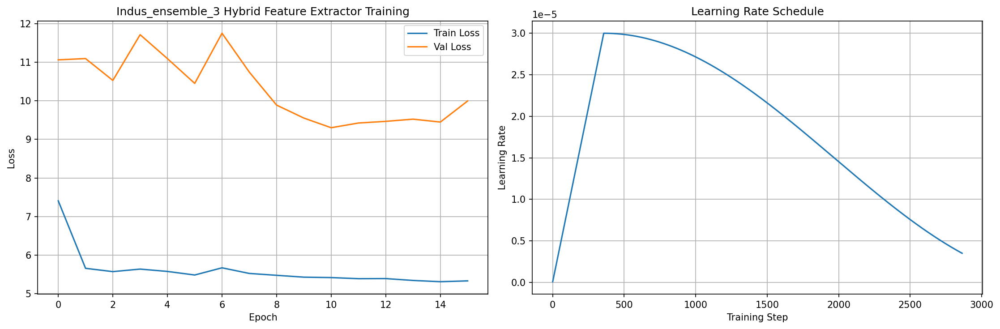

Training completed. Best validation loss: 9.3033 at epoch 11


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Indus Model 4/5 with seed 45
Created dataset for Indus: 715 original images + 2145 augmentations
Created dataset with 2860 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 8.1950 | LR: 0.000001
Train Batch: 20/179 | Loss: 8.5815 | LR: 0.000002
Train Batch: 30/179 | Loss: 8.9406 | LR: 0.000003
Train Batch: 40/179 | Loss: 8.6588 | LR: 0.000003
Train Batch: 50/179 | Loss: 7.9569 | LR: 0.000004
Train Batch: 60/179 | Loss: 7.9351 | LR: 0.000005
Train Batch: 70/179 | Loss: 7.6873 | LR: 0.000006
Train Batch: 80/179 | Loss: 8.1041 | LR: 0.000007
Train Batch: 90/179 | Loss: 7.9843 | LR: 0.000008
Train Batch: 100/179 | Loss: 7.9682 | LR: 0.000008
Train Batch: 110/179 | Loss: 6.9677 | LR: 0.000009
Train Batch: 120/179 | Loss: 7.1068 | LR: 0.000010
Train Batch: 130/179 | Loss: 6.0243 | LR: 0.000011
Train Batch: 140/179 | Loss: 6.0586 | LR: 0.000012
Train Batch: 150/179 | Loss: 5.6089 | LR: 0.000013
Train Batch: 160/179 | Loss: 5.9168 | LR: 0.000013
Train Batch: 170/179 | Loss: 6.0161 | LR: 0.000014
Train Batch: 179/179 | Loss: 6.4452 | LR: 0.000015


Epoch 1/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 7.3556
Val Loss: 9.9217
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_4_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.4554 | LR: 0.000016
Train Batch: 20/179 | Loss: 6.1366 | LR: 0.000017
Train Batch: 30/179 | Loss: 5.0145 | LR: 0.000018
Train Batch: 40/179 | Loss: 5.8807 | LR: 0.000018
Train Batch: 50/179 | Loss: 5.8052 | LR: 0.000019
Train Batch: 60/179 | Loss: 5.1132 | LR: 0.000020
Train Batch: 70/179 | Loss: 5.6954 | LR: 0.000021
Train Batch: 80/179 | Loss: 5.2699 | LR: 0.000022
Train Batch: 90/179 | Loss: 5.7296 | LR: 0.000023
Contrastive: 3.6260, Variance: 0.9990, Penalty: 2.0019
Train Batch: 100/179 | Loss: 5.0762 | LR: 0.000023
Train Batch: 110/179 | Loss: 6.0670 | LR: 0.000024
Train Batch: 120/179 | Loss: 5.2165 | LR: 0.000025
Train Batch: 130/179 | Loss: 5.6949 | LR: 0.000026
Train Batch: 140/179 | Loss: 6.3895 | LR: 0.000027
Train Batch: 150/179 | Loss: 5.4824 | LR: 0.000028
Train Batch: 160/179 | Loss: 6.2224 | LR: 0.000028
Train Batch: 170/179 | Loss: 6.2075 | LR: 0.000029
Train Batch: 179/179 | Loss: 5.5905 | LR: 0.000030


Epoch 2/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]

Contrastive: 4.3058, Variance: 0.2671, Penalty: 7.4860

Epoch 2/20
Train Loss: 5.6682
Val Loss: 10.5158
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 6.0645 | LR: 0.000030
Train Batch: 20/179 | Loss: 5.7462 | LR: 0.000030
Train Batch: 30/179 | Loss: 4.9063 | LR: 0.000030
Train Batch: 40/179 | Loss: 5.6345 | LR: 0.000030
Train Batch: 50/179 | Loss: 6.5831 | LR: 0.000030
Train Batch: 60/179 | Loss: 5.9278 | LR: 0.000030
Train Batch: 70/179 | Loss: 5.6388 | LR: 0.000030
Train Batch: 80/179 | Loss: 5.8624 | LR: 0.000030
Train Batch: 90/179 | Loss: 5.4984 | LR: 0.000030
Train Batch: 100/179 | Loss: 5.3980 | LR: 0.000030
Train Batch: 110/179 | Loss: 5.8596 | LR: 0.000030
Train Batch: 120/179 | Loss: 6.7953 | LR: 0.000030
Train Batch: 130/179 | Loss: 5.4947 | LR: 0.000030
Train Batch: 140/179 | Loss: 5.6729 | LR: 0.000030
Train Batch: 150/179 | Loss: 5.8620 | LR: 0.000030
Train Batch: 160/179 | Loss: 6.2771 | LR: 0.000030
Train Batch: 170/179 | Loss: 6.3664 | LR: 0.000030
Train Batch: 179/179 | Loss: 5.7039 | LR: 0.000030


Epoch 3/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.7486
Val Loss: 13.9293
No improvement for 2 epochs


Epoch 4/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Contrastive: 3.8680, Variance: 0.9942, Penalty: 2.0115
Train Batch: 10/179 | Loss: 5.4292 | LR: 0.000030
Train Batch: 20/179 | Loss: 6.0731 | LR: 0.000030
Train Batch: 30/179 | Loss: 5.4856 | LR: 0.000030
Train Batch: 40/179 | Loss: 6.2187 | LR: 0.000030
Train Batch: 50/179 | Loss: 5.4691 | LR: 0.000030
Train Batch: 60/179 | Loss: 5.4916 | LR: 0.000030
Train Batch: 70/179 | Loss: 5.9569 | LR: 0.000030
Train Batch: 80/179 | Loss: 6.3629 | LR: 0.000030
Train Batch: 90/179 | Loss: 5.7732 | LR: 0.000029
Train Batch: 100/179 | Loss: 5.8298 | LR: 0.000029
Train Batch: 110/179 | Loss: 5.5268 | LR: 0.000029
Train Batch: 120/179 | Loss: 6.0295 | LR: 0.000029
Train Batch: 130/179 | Loss: 4.9097 | LR: 0.000029
Train Batch: 140/179 | Loss: 5.8813 | LR: 0.000029
Train Batch: 150/179 | Loss: 5.2759 | LR: 0.000029
Train Batch: 160/179 | Loss: 5.6551 | LR: 0.000029
Train Batch: 170/179 | Loss: 5.7380 | LR: 0.000029
Train Batch: 179/179 | Loss: 5.2152 | LR: 0.000029


Epoch 4/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.7214
Val Loss: 10.3299
No improvement for 3 epochs


Epoch 5/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.9039 | LR: 0.000029
Train Batch: 20/179 | Loss: 5.7194 | LR: 0.000029
Train Batch: 30/179 | Loss: 5.4661 | LR: 0.000029
Train Batch: 40/179 | Loss: 5.8068 | LR: 0.000029
Train Batch: 50/179 | Loss: 5.3079 | LR: 0.000029
Train Batch: 60/179 | Loss: 5.5298 | LR: 0.000029
Contrastive: 3.6394, Variance: 0.9990, Penalty: 2.0018
Train Batch: 70/179 | Loss: 5.9133 | LR: 0.000029
Train Batch: 80/179 | Loss: 5.8139 | LR: 0.000029
Train Batch: 90/179 | Loss: 4.9628 | LR: 0.000029
Train Batch: 100/179 | Loss: 5.7528 | LR: 0.000029
Train Batch: 110/179 | Loss: 5.5714 | LR: 0.000028
Train Batch: 120/179 | Loss: 5.5420 | LR: 0.000028
Train Batch: 130/179 | Loss: 5.6700 | LR: 0.000028
Train Batch: 140/179 | Loss: 5.4069 | LR: 0.000028
Train Batch: 150/179 | Loss: 5.3706 | LR: 0.000028
Contrastive: 3.8151, Variance: 0.9988, Penalty: 2.0022
Train Batch: 160/179 | Loss: 5.5554 | LR: 0.000028
Train Batch: 170/179 | Loss: 4.9244 | LR: 0.000028
Train Batch: 179/179 | Loss: 5.3

Epoch 5/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5936
Val Loss: 10.8838
No improvement for 4 epochs


Epoch 6/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 4.9447 | LR: 0.000028
Train Batch: 20/179 | Loss: 5.5827 | LR: 0.000028
Train Batch: 30/179 | Loss: 5.6680 | LR: 0.000028
Train Batch: 40/179 | Loss: 5.1741 | LR: 0.000028
Contrastive: 3.9319, Variance: 0.9990, Penalty: 2.0018
Train Batch: 50/179 | Loss: 5.0787 | LR: 0.000028
Train Batch: 60/179 | Loss: 5.1535 | LR: 0.000028
Train Batch: 70/179 | Loss: 5.5975 | LR: 0.000027
Train Batch: 80/179 | Loss: 5.5302 | LR: 0.000027
Train Batch: 90/179 | Loss: 5.1748 | LR: 0.000027
Train Batch: 100/179 | Loss: 5.5684 | LR: 0.000027
Train Batch: 110/179 | Loss: 5.8364 | LR: 0.000027
Train Batch: 120/179 | Loss: 5.3291 | LR: 0.000027
Contrastive: 3.4974, Variance: 0.9984, Penalty: 2.0030
Train Batch: 130/179 | Loss: 5.6226 | LR: 0.000027
Train Batch: 140/179 | Loss: 5.9424 | LR: 0.000027
Train Batch: 150/179 | Loss: 5.0926 | LR: 0.000027
Contrastive: 3.7677, Variance: 0.9990, Penalty: 2.0019
Train Batch: 160/179 | Loss: 5.4047 | LR: 0.000027
Train Batch: 170/179 | Loss:

Epoch 6/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.5063
Val Loss: 10.1753
No improvement for 5 epochs
Early stopping triggered after epoch 6
Final model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_4_hybrid_extractor_final.pth


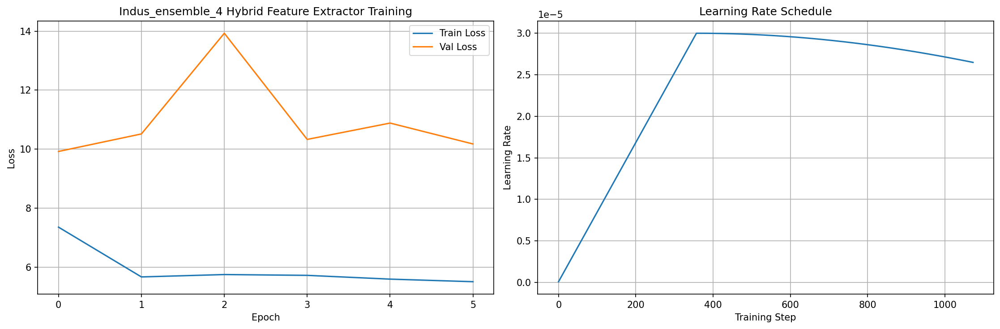

Training completed. Best validation loss: 9.9217 at epoch 1


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Training Indus Model 5/5 with seed 46
Created dataset for Indus: 715 original images + 2145 augmentations
Created dataset with 2860 samples
Combined feature dimension: 1536


Epoch 1/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 9.0299 | LR: 0.000001
Train Batch: 20/179 | Loss: 8.7262 | LR: 0.000002
Train Batch: 30/179 | Loss: 8.7840 | LR: 0.000003
Train Batch: 40/179 | Loss: 8.7314 | LR: 0.000003
Train Batch: 50/179 | Loss: 8.4339 | LR: 0.000004
Contrastive: 6.6407, Variance: 0.9994, Penalty: 2.0010
Train Batch: 60/179 | Loss: 8.3603 | LR: 0.000005
Train Batch: 70/179 | Loss: 7.7663 | LR: 0.000006
Train Batch: 80/179 | Loss: 7.9241 | LR: 0.000007
Train Batch: 90/179 | Loss: 6.5180 | LR: 0.000008
Train Batch: 100/179 | Loss: 5.9063 | LR: 0.000008
Train Batch: 110/179 | Loss: 7.3062 | LR: 0.000009
Train Batch: 120/179 | Loss: 6.5444 | LR: 0.000010
Contrastive: 5.0341, Variance: 0.9989, Penalty: 2.0020
Train Batch: 130/179 | Loss: 6.5894 | LR: 0.000011
Train Batch: 140/179 | Loss: 5.8742 | LR: 0.000012
Train Batch: 150/179 | Loss: 5.8593 | LR: 0.000013
Train Batch: 160/179 | Loss: 5.7328 | LR: 0.000013
Train Batch: 170/179 | Loss: 5.8640 | LR: 0.000014
Train Batch: 179/179 | Loss: 5.3

Epoch 1/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 1/20
Train Loss: 7.2884
Val Loss: 10.0576
Best model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_5_hybrid_extractor_best.pth


Epoch 2/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Contrastive: 3.7008, Variance: 0.9989, Penalty: 2.0019
Train Batch: 10/179 | Loss: 4.8567 | LR: 0.000016
Train Batch: 20/179 | Loss: 5.7527 | LR: 0.000017
Train Batch: 30/179 | Loss: 5.5217 | LR: 0.000018
Train Batch: 40/179 | Loss: 5.9104 | LR: 0.000018
Train Batch: 50/179 | Loss: 5.5634 | LR: 0.000019
Train Batch: 60/179 | Loss: 5.8081 | LR: 0.000020
Train Batch: 70/179 | Loss: 5.8513 | LR: 0.000021
Train Batch: 80/179 | Loss: 5.6150 | LR: 0.000022
Train Batch: 90/179 | Loss: 5.8593 | LR: 0.000023
Train Batch: 100/179 | Loss: 5.5788 | LR: 0.000023
Train Batch: 110/179 | Loss: 5.8565 | LR: 0.000024
Train Batch: 120/179 | Loss: 5.9677 | LR: 0.000025
Train Batch: 130/179 | Loss: 5.3753 | LR: 0.000026
Train Batch: 140/179 | Loss: 6.2963 | LR: 0.000027
Train Batch: 150/179 | Loss: 5.6074 | LR: 0.000028
Train Batch: 160/179 | Loss: 5.9642 | LR: 0.000028
Train Batch: 170/179 | Loss: 6.0561 | LR: 0.000029
Train Batch: 179/179 | Loss: 5.6399 | LR: 0.000030


Epoch 2/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 2/20
Train Loss: 5.6196
Val Loss: 10.5281
No improvement for 1 epochs


Epoch 3/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.3745 | LR: 0.000030
Train Batch: 20/179 | Loss: 5.2870 | LR: 0.000030
Train Batch: 30/179 | Loss: 5.4238 | LR: 0.000030
Train Batch: 40/179 | Loss: 5.4757 | LR: 0.000030
Train Batch: 50/179 | Loss: 5.6535 | LR: 0.000030
Train Batch: 60/179 | Loss: 5.5645 | LR: 0.000030
Train Batch: 70/179 | Loss: 5.3609 | LR: 0.000030
Train Batch: 80/179 | Loss: 5.3867 | LR: 0.000030
Contrastive: 3.9112, Variance: 0.9985, Penalty: 2.0029
Train Batch: 90/179 | Loss: 5.3779 | LR: 0.000030
Train Batch: 100/179 | Loss: 6.0258 | LR: 0.000030
Train Batch: 110/179 | Loss: 5.4229 | LR: 0.000030
Train Batch: 120/179 | Loss: 5.5423 | LR: 0.000030
Contrastive: 3.8741, Variance: 0.9982, Penalty: 2.0034
Train Batch: 130/179 | Loss: 5.3579 | LR: 0.000030
Train Batch: 140/179 | Loss: 5.0556 | LR: 0.000030
Train Batch: 150/179 | Loss: 5.4881 | LR: 0.000030
Train Batch: 160/179 | Loss: 5.6819 | LR: 0.000030
Train Batch: 170/179 | Loss: 5.3192 | LR: 0.000030
Train Batch: 179/179 | Loss: 4.8

Epoch 3/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 3/20
Train Loss: 5.5557
Val Loss: 13.0273
No improvement for 2 epochs


Epoch 4/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.5513 | LR: 0.000030
Train Batch: 20/179 | Loss: 5.8942 | LR: 0.000030
Train Batch: 30/179 | Loss: 5.6159 | LR: 0.000030
Train Batch: 40/179 | Loss: 5.5613 | LR: 0.000030
Train Batch: 50/179 | Loss: 5.7530 | LR: 0.000030
Train Batch: 60/179 | Loss: 5.3952 | LR: 0.000030
Train Batch: 70/179 | Loss: 6.3450 | LR: 0.000030
Train Batch: 80/179 | Loss: 5.8008 | LR: 0.000030
Train Batch: 90/179 | Loss: 5.9618 | LR: 0.000029
Train Batch: 100/179 | Loss: 5.8011 | LR: 0.000029
Train Batch: 110/179 | Loss: 4.9715 | LR: 0.000029
Train Batch: 120/179 | Loss: 5.4058 | LR: 0.000029
Train Batch: 130/179 | Loss: 6.0085 | LR: 0.000029
Train Batch: 140/179 | Loss: 5.2247 | LR: 0.000029
Train Batch: 150/179 | Loss: 5.9024 | LR: 0.000029
Contrastive: 4.2384, Variance: 0.9982, Penalty: 2.0034
Train Batch: 160/179 | Loss: 5.9565 | LR: 0.000029
Contrastive: 3.9829, Variance: 0.9992, Penalty: 2.0013
Contrastive: 4.0491, Variance: 0.9991, Penalty: 2.0017
Train Batch: 170/179 | Loss:

Epoch 4/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 4/20
Train Loss: 5.5995
Val Loss: 12.7261
No improvement for 3 epochs


Epoch 5/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.1777 | LR: 0.000029
Train Batch: 20/179 | Loss: 5.7281 | LR: 0.000029
Train Batch: 30/179 | Loss: 5.3296 | LR: 0.000029
Contrastive: 3.2126, Variance: 0.9981, Penalty: 2.0036
Train Batch: 40/179 | Loss: 5.2217 | LR: 0.000029
Train Batch: 50/179 | Loss: 5.8256 | LR: 0.000029
Train Batch: 60/179 | Loss: 5.3194 | LR: 0.000029
Train Batch: 70/179 | Loss: 5.4800 | LR: 0.000029
Train Batch: 80/179 | Loss: 5.3383 | LR: 0.000029
Train Batch: 90/179 | Loss: 5.2668 | LR: 0.000029
Train Batch: 100/179 | Loss: 6.0831 | LR: 0.000029
Train Batch: 110/179 | Loss: 5.2503 | LR: 0.000028
Contrastive: 4.3837, Variance: 0.9984, Penalty: 2.0030
Train Batch: 120/179 | Loss: 5.7282 | LR: 0.000028
Train Batch: 130/179 | Loss: 5.8890 | LR: 0.000028
Train Batch: 140/179 | Loss: 5.0797 | LR: 0.000028
Train Batch: 150/179 | Loss: 6.0065 | LR: 0.000028
Train Batch: 160/179 | Loss: 5.5102 | LR: 0.000028
Train Batch: 170/179 | Loss: 5.6043 | LR: 0.000028
Train Batch: 179/179 | Loss: 4.5

Epoch 5/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 5/20
Train Loss: 5.5609
Val Loss: 10.8682
No improvement for 4 epochs


Epoch 6/20 [Train]:   0%|          | 0/179 [00:00<?, ?it/s]

Train Batch: 10/179 | Loss: 5.0268 | LR: 0.000028
Train Batch: 20/179 | Loss: 5.6918 | LR: 0.000028
Train Batch: 30/179 | Loss: 5.3001 | LR: 0.000028
Train Batch: 40/179 | Loss: 5.8142 | LR: 0.000028
Train Batch: 50/179 | Loss: 5.6530 | LR: 0.000028
Train Batch: 60/179 | Loss: 6.0026 | LR: 0.000028
Contrastive: 3.6668, Variance: 0.9939, Penalty: 2.0122
Train Batch: 70/179 | Loss: 5.6080 | LR: 0.000027
Train Batch: 80/179 | Loss: 5.2840 | LR: 0.000027
Train Batch: 90/179 | Loss: 6.5937 | LR: 0.000027
Train Batch: 100/179 | Loss: 5.4269 | LR: 0.000027
Contrastive: 3.4802, Variance: 0.9985, Penalty: 2.0028
Train Batch: 110/179 | Loss: 5.5037 | LR: 0.000027
Train Batch: 120/179 | Loss: 5.6119 | LR: 0.000027
Train Batch: 130/179 | Loss: 5.3012 | LR: 0.000027
Train Batch: 140/179 | Loss: 6.0905 | LR: 0.000027
Train Batch: 150/179 | Loss: 5.2454 | LR: 0.000027
Train Batch: 160/179 | Loss: 5.4361 | LR: 0.000027
Train Batch: 170/179 | Loss: 5.6431 | LR: 0.000027
Train Batch: 179/179 | Loss: 5.3

Epoch 6/20 [Val]:   0%|          | 0/5 [00:00<?, ?it/s]


Epoch 6/20
Train Loss: 5.5048
Val Loss: 10.5450
No improvement for 5 epochs
Early stopping triggered after epoch 6
Final model saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_5_hybrid_extractor_final.pth


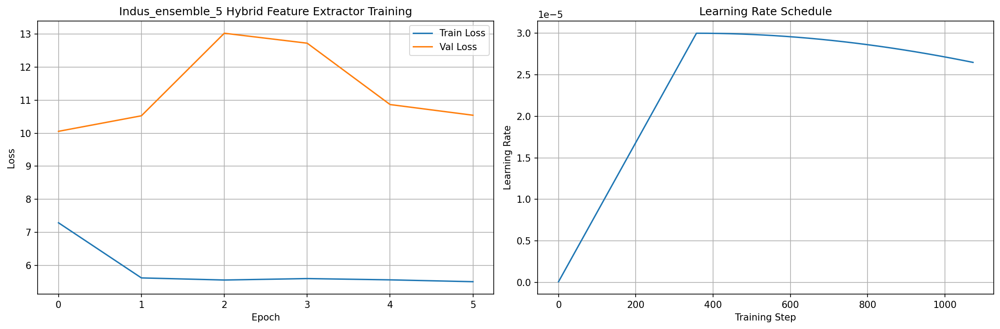

Training completed. Best validation loss: 10.0576 at epoch 1


<ipython-input-11-bdc0c72084e3>:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_model_path)



Ensemble Training Summary for Indus
   model_idx  seed   val_loss  epoch  \
0          1    42   9.656212      3   
1          2    43   9.492649      1   
2          3    44   9.303281     11   
3          4    45   9.921700      1   
4          5    46  10.057604      1   

                                          model_path  
0  /content/drive/MyDrive/script_analysis/models/...  
1  /content/drive/MyDrive/script_analysis/models/...  
2  /content/drive/MyDrive/script_analysis/models/...  
3  /content/drive/MyDrive/script_analysis/models/...  
4  /content/drive/MyDrive/script_analysis/models/...  

Average validation loss: 9.6863
Best validation loss: 9.3033
Summary saved to /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_summary.csv


<ipython-input-12-4b8e90544d9f>:59: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(row['model_path'], map_location=device)


Loaded 5 Indus ensemble models

Creating test datasets for all scripts...
Created test dataset for Indus with 715 samples
Created test dataset for Proto-Cuneiform with 2089 samples
Created test dataset for Proto-Elamite with 1510 samples
Created test dataset for Naxi-Dongba with 2122 samples
Created test dataset for Old-Naxi with 2383 samples
Created test dataset for TYC with 8766 samples
Extracting embeddings using model 1/5...
  Processing Indus...


  0%|          | 0/23 [00:00<?, ?it/s]

    Extracted 715 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 2/5...
  Processing Indus...


  0%|          | 0/23 [00:00<?, ?it/s]

    Extracted 715 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 3/5...
  Processing Indus...


  0%|          | 0/23 [00:00<?, ?it/s]

    Extracted 715 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 4/5...
  Processing Indus...


  0%|          | 0/23 [00:00<?, ?it/s]

    Extracted 715 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings
Extracting embeddings using model 5/5...
  Processing Indus...


  0%|          | 0/23 [00:00<?, ?it/s]

    Extracted 715 embeddings
  Processing Proto-Cuneiform...


  0%|          | 0/66 [00:00<?, ?it/s]

    Extracted 2089 embeddings
  Processing Proto-Elamite...


  0%|          | 0/48 [00:00<?, ?it/s]

    Extracted 1510 embeddings
  Processing Naxi-Dongba...


  0%|          | 0/67 [00:00<?, ?it/s]

    Extracted 2122 embeddings
  Processing Old-Naxi...


  0%|          | 0/75 [00:00<?, ?it/s]

    Extracted 2383 embeddings
  Processing TYC...


  0%|          | 0/274 [00:00<?, ?it/s]

    Extracted 8766 embeddings


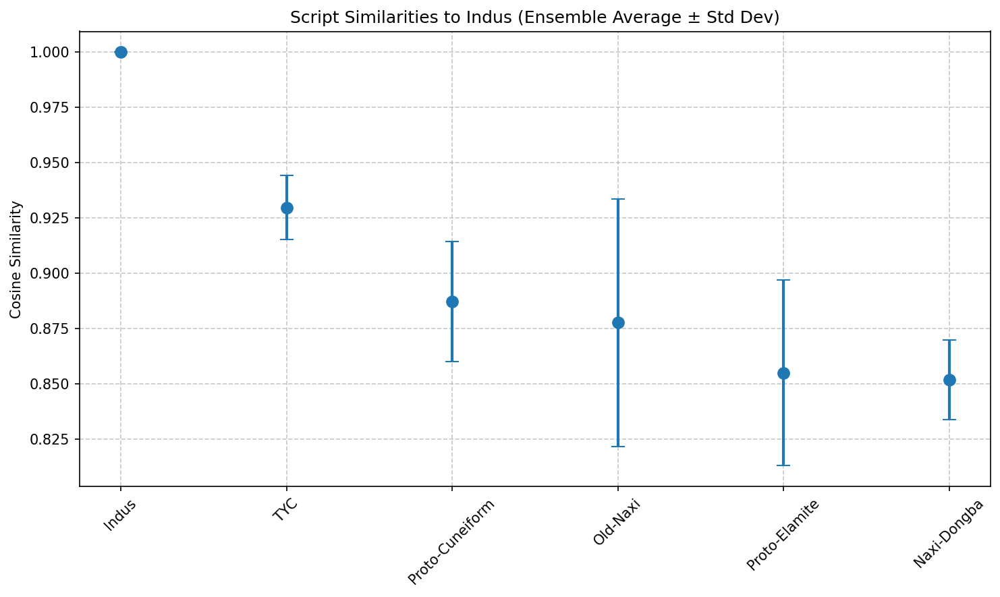

Running t-SNE with perplexity 30 on 900 samples...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


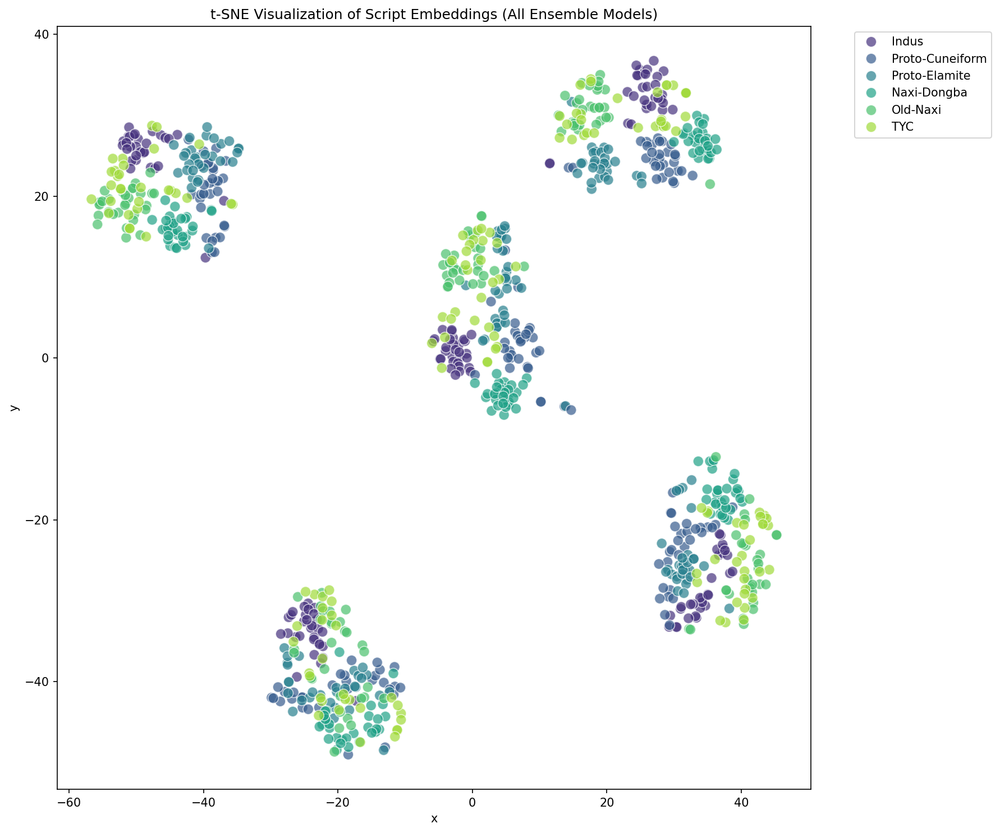

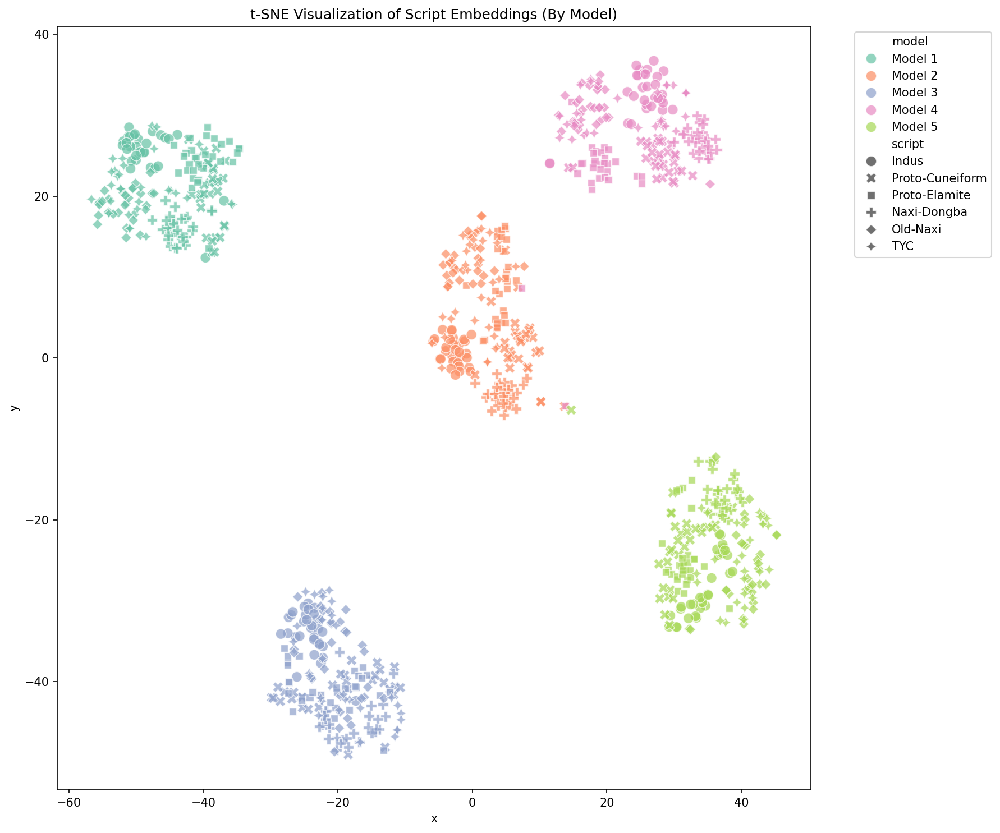


--- Indus Ensemble Test Conclusions ---
Top 3 most similar scripts to Indus:
1. Indus: 1.0000 ± 0.0000
2. TYC: 0.9297 ± 0.0145
3. Proto-Cuneiform: 0.8873 ± 0.0272

Least similar script to Indus:
Naxi-Dongba: 0.8518 ± 0.0179

Results saved to /content/drive/MyDrive/script_analysis/results/indus_test_20250305_212204


In [ ]:
similarity_df, indus_embeddings = run_indus_ensemble_test(num_models=5, epochs=20)

## 4.5 Model Analysis

### Architecture Inspection

In [ ]:
def inspect_hybrid_model(model_path):
    """
    Inspects the architecture of a hybrid CNN model.

    Parameters:
    -----------
    model_path : str
        Path to the saved model file
    """
    try:
        import torch
        import torch.nn as nn
        import sys
        import os

        sys.path.append(os.getcwd())

        print(f"Loading model from {model_path}")

        checkpoint = torch.load(model_path, map_location=torch.device('cpu'))

        print("\n===== Model Architecture =====")

        print("Keys in checkpoint:", checkpoint.keys())

        if 'model_state_dict' in checkpoint:

            model_state = checkpoint['model_state_dict']

            print("\nLayers based on state_dict keys:")
            for key in model_state.keys():
                print(f"  - {key}: {model_state[key].shape if hasattr(model_state[key], 'shape') else 'No shape'}")

            layer_types = {}
            for key in model_state.keys():
                parts = key.split('.')
                if len(parts) > 1:
                    layer_type = parts[0]
                    if layer_type not in layer_types:
                        layer_types[layer_type] = []
                    layer_types[layer_type].append(key)

            print("\nModel Components:")
            for layer_type, keys in layer_types.items():
                print(f"  - {layer_type}: {len(keys)} parameters")

        elif isinstance(checkpoint, dict) and any(k.startswith('cnn') or k.startswith('fc') for k in checkpoint.keys()):

            model_state = checkpoint

            print("\nLayers based on state_dict keys:")
            for key in model_state.keys():
                print(f"  - {key}: {model_state[key].shape if hasattr(model_state[key], 'shape') else 'No shape'}")

        if 'architecture' in checkpoint:
            print("\nArchitecture information:")
            print(checkpoint['architecture'])

        if 'metadata' in checkpoint:
            print("\nMetadata:")
            for key, value in checkpoint['metadata'].items():
                print(f"  - {key}: {value}")

        if 'hyperparameters' in checkpoint:
            print("\nHyperparameters:")
            for key, value in checkpoint['hyperparameters'].items():
                print(f"  - {key}: {value}")

        if 'epoch' in checkpoint:
            print(f"\nTraining stopped at epoch {checkpoint['epoch']}")

        if 'metrics' in checkpoint:
            print("\nPerformance metrics:")
            for key, value in checkpoint['metrics'].items():
                print(f"  - {key}: {value}")

        print("\n===== End of Model Information =====")

    except Exception as e:
        import traceback
        print(f"Error inspecting model: {e}")
        print(traceback.format_exc())

ensemble_dir = os.path.join(MODEL_DIR, f"Indus_ensemble")
model_path = os.path.join(ensemble_dir, f"Indus_ensemble_1_hybrid_extractor_best.pth")

try:

    import os
    if not os.path.exists(model_path):
        print(f"Error: Model file not found at {model_path}")
    else:
        print(f"Model file found at {model_path}")
        inspect_hybrid_model(model_path)
except Exception as e:
    import traceback
    print(f"Error: {e}")
    print(traceback.format_exc())

Model file found at /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_1_hybrid_extractor_best.pth
Loading model from /content/drive/MyDrive/script_analysis/models/Indus_ensemble/Indus_ensemble_1_hybrid_extractor_best.pth

===== Model Architecture =====
Keys in checkpoint: dict_keys(['epoch', 'model_state_dict', 'projection_head_state_dict', 'optimizer_state_dict', 'val_loss'])

Layers based on state_dict keys:
  - cnn.conv1.weight: torch.Size([64, 3, 7, 7])
  - cnn.bn1.weight: torch.Size([64])
  - cnn.bn1.bias: torch.Size([64])
  - cnn.bn1.running_mean: torch.Size([64])
  - cnn.bn1.running_var: torch.Size([64])
  - cnn.bn1.num_batches_tracked: torch.Size([])
  - cnn.layer1.0.conv1.weight: torch.Size([64, 64, 3, 3])
  - cnn.layer1.0.bn1.weight: torch.Size([64])
  - cnn.layer1.0.bn1.bias: torch.Size([64])
  - cnn.layer1.0.bn1.running_mean: torch.Size([64])
  - cnn.layer1.0.bn1.running_var: torch.Size([64])
  - cnn.layer1.0.bn1.num_batches_tracked: torch.Size([])

### Grad-CAM Analysis

In [ ]:
def generate_gradcam(model, image_path, device=None, layer_name='cnn', target_layer_idx=-1):
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    img = Image.open(image_path).convert('RGB')
    transform = get_test_transforms(img_size=224)
    input_tensor = transform(img).unsqueeze(0).to(device)

    model = model.to(device)
    model.eval()

    def reshape_transform(tensor):
        height = width = int(np.sqrt(tensor.shape[1]))
        if "cls_token" in dir(model.transformer):
            tensor = tensor[:, 1:, :]
            height = width = int(np.sqrt(tensor.shape[1]))

        result = tensor.reshape(tensor.size(0), height, width, tensor.size(2))

        result = result.permute(0, 3, 1, 2)
        return result

    if layer_name == 'cnn':
        if hasattr(model.cnn, 'layer4') and len(model.cnn.layer4) > 0:
            target_layers = model.cnn.layer4
            target_layer = target_layers[target_layer_idx] if isinstance(target_layers, torch.nn.Sequential) else target_layers
        else:
            found_layers = []
            for name, module in model.cnn.named_modules():
                if isinstance(module, torch.nn.Conv2d):
                    found_layers.append((name, module))

            if not found_layers:
                raise ValueError("Could not find appropriate convolutional layer in CNN path")

            target_name, target_layer = found_layers[-1]
            print(f"Using CNN layer: {target_name}")

        reshape_func = None

    elif layer_name == 'transformer':
        if hasattr(model.transformer, 'layers') and len(model.transformer.layers) > 0:
            last_layer = model.transformer.layers[-1]
            if hasattr(last_layer, 'blocks') and len(last_layer.blocks) > 0:
                target_layer = last_layer.blocks[-1]
                print(f"Using transformer block: layers.{len(model.transformer.layers)-1}.blocks.{len(last_layer.blocks)-1}")
            else:
                raise ValueError("Could not find blocks in transformer layer")
        else:
            raise ValueError("Could not find appropriate layer in transformer path")

        reshape_func = reshape_transform
        raise ValueError("layer_name must be 'cnn' or 'transformer'")

    activations = {}
    gradients = {}

    def save_activation(name):
        def hook(module, input, output):
            activations[name] = output.detach()
        return hook

    def save_gradient(name):
        def hook(module, grad_input, grad_output):
            gradients[name] = grad_output[0].detach()
        return hook

    handle_fwd = target_layer.register_forward_hook(save_activation('target'))
    handle_bwd = target_layer.register_full_backward_hook(save_gradient('target'))

    output = model(input_tensor)

    model.zero_grad()
    output.mean().backward()

    handle_fwd.remove()
    handle_bwd.remove()

    if 'target' not in activations or 'target' not in gradients:
        raise RuntimeError("Failed to capture activations or gradients")

    target_activation = activations['target']
    target_gradient = gradients['target']

    if reshape_func is not None and len(target_activation.shape) == 3:
        target_activation = reshape_func(target_activation)
        target_gradient = reshape_func(target_gradient)

    weights = torch.mean(target_gradient, dim=(2, 3), keepdim=True)
    cam = torch.sum(weights * target_activation, dim=1, keepdim=True)

    cam = torch.relu(cam)
    cam = torch.nn.functional.interpolate(
        cam,
        size=(224, 224),
        mode='bilinear',
        align_corners=False
    )
    cam = cam - cam.min()
    cam = cam / (cam.max() + 1e-8)
    cam = cam.squeeze().cpu().numpy()

    img_np = np.array(img.resize((224, 224)))
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

    alpha = 0.5
    overlaid = heatmap * alpha + img_np * (1 - alpha)
    overlaid = overlaid.astype(np.uint8)

    return img_np, cam, overlaid

Generate Grad-CAM.

In [ ]:
def load_model_for_visualization(script_name="Indus", model_idx=0):
    MODEL_DIR = '/content/drive/MyDrive/script_analysis/models'
    ensemble_dir = os.path.join(MODEL_DIR, f"{script_name}_ensemble")
    model_path = os.path.join(ensemble_dir, f"{script_name}_ensemble_{model_idx+1}_hybrid_extractor_best.pth")

    model = SCRIBE()

    checkpoint = torch.load(model_path, map_location=torch.device('cpu'), weights_only=True)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()

    return model

def get_sample_paths(num_samples=5):
    script_paths = {}

    for name in list(dataset_paths.keys()):
        try:
            path_var = f"{name.upper().replace('-', '_')}_PATH"

            if path_var in globals():
                paths = load_image_paths(globals()[path_var])
                if paths and len(paths) > 0:

                    random.seed(42)
                    if len(paths) > num_samples:
                        samples = random.sample(paths, num_samples)
                    else:
                        samples = paths[:num_samples]

                    script_paths[name] = samples
        except Exception as e:
            print(f"Error loading paths for {name}: {str(e)}")

    return script_paths

model = load_model_for_visualization(script_name="Indus")
script_paths = get_sample_paths()

gradcam_cnn_dir = analyze_scripts_with_gradcam(model, script_paths, layer_name='cnn')

gradcam_transformer_dir = analyze_scripts_with_gradcam(model, script_paths, layer_name='transformer')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/46.8M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/353M [00:00<?, ?B/s]

Processing Indus script images...
  Processed image 1/5
  Processed image 2/5
  Processed image 3/5
  Processed image 4/5
  Processed image 5/5
Processing Proto-Cuneiform script images...
  Processed image 1/5
  Processed image 2/5
  Processed image 3/5
  Processed image 4/5
  Processed image 5/5
Processing Proto-Elamite script images...
  Processed image 1/5
  Processed image 2/5
  Processed image 3/5
  Processed image 4/5
  Processed image 5/5
Processing Naxi-Dongba script images...
  Processed image 1/5
  Processed image 2/5
  Processed image 3/5
  Processed image 4/5
  Processed image 5/5
Processing Old-Naxi script images...
  Processed image 1/5
  Processed image 2/5
  Processed image 3/5
  Processed image 4/5
  Processed image 5/5
Grad-CAM analysis complete. Results saved to /content/drive/MyDrive/script_analysis/results/gradcam_cnn_20250309_194643
Processing Indus script images...
Using transformer block: layers.3.blocks.1
  Processed image 1/5
Using transformer block: layers.3.

# **5. Ensemble Embedding Extraction**


## 5.1 Embedding Extraction

In [ ]:
def extract_script_embeddings(script_names=["Indus", "Proto-Cuneiform", "Proto-Elamite"], save_path=None):
    if save_path is None:
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        output_dir = os.path.join(RESULTS_DIR, f"embeddings_{timestamp}")
        os.makedirs(output_dir, exist_ok=True)
    else:
        output_dir = save_path
        os.makedirs(output_dir, exist_ok=True)

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    print("\nCreating test datasets for all scripts...")

    script_datasets = {}
    all_scripts = list(dataset_paths.keys()) + ['TYC']

    for name in all_scripts:
        try:
            if name == 'TYC':
                path_var = 'TYC_PATH'
            else:
                path_var = f"{name.upper().replace('-', '_')}_PATH"

            if path_var in globals():
                paths = load_image_paths(globals()[path_var])
                if paths and len(paths) > 0:
                    test_transform = get_test_transforms(img_size=224)
                    dataset = ScriptDataset(paths, test_transform, name, denoise_types=["Old Naxi", "TYC-old_naxi"])
                    script_datasets[name] = dataset
                    print(f"Created test dataset for {name} with {len(dataset)} samples")
        except Exception as e:
            print(f"Error creating dataset for {name}: {str(e)}")

    script_loaders = {
        name: DataLoader(dataset, batch_size=32, shuffle=False, num_workers=2)
        for name, dataset in script_datasets.items()
    }

    all_script_embeddings = {}
    for source_script in script_names:
        print(f"\n{'='*50}")
        print(f"Extracting features using {source_script} ensemble models")
        print(f"{'='*50}\n")

        ensemble_models, _, _ = load_ensemble_models(source_script, device=device)

        print(f"Extracting embeddings using {len(ensemble_models)} {source_script} models...")
        embeddings = extract_ensemble_embeddings(ensemble_models, script_loaders, device)
        all_script_embeddings[source_script] = embeddings

        embeddings_path = os.path.join(output_dir, f"{source_script}_embeddings.pkl")
        with open(embeddings_path, 'wb') as f:
            pickle.dump(embeddings, f)
        print(f"Saved {source_script} embeddings to {embeddings_path}")

    print(f"\nAll embeddings extracted and saved to {output_dir}")
    return all_script_embeddings, script_loaders, output_dir

all_embeddings, script_loaders, embeddings_dir = extract_script_embeddings()


Creating test datasets for all scripts...
Created test dataset for Indus with 715 samples
Created test dataset for Proto-Cuneiform with 2089 samples
Created test dataset for Proto-Elamite with 1510 samples
Created test dataset for Naxi-Dongba with 2121 samples
Created test dataset for Old-Naxi with 2380 samples
Created test dataset for TYC with 8766 samples

Extracting features using Indus ensemble models



NameError: name 'load_ensemble_models' is not defined

## 5.3 Embedding Analysis

In [ ]:
def compare_embeddings(embeddings_dict, primary_script, comparison_scripts, output_dir=None):
    """
    Compare embeddings between a primary script and multiple comparison scripts

    Parameters:
    ----------
    embeddings_dict : dict
        Dictionary containing embeddings for different scripts
        Format: {script_name: {model_idx: {script_name: [embeddings]}}}
    primary_script : str
        Name of the primary script to compare (e.g., 'indus')
    comparison_scripts : list
        List of script names to compare against the primary script
    output_dir : str
        Directory to save results (if None, will not save visualizations)

    Returns:
    --------
    dict
        Results of the comparison
    """
    if output_dir is not None:
        os.makedirs(output_dir, exist_ok=True)

    results = {
        'mean_similarities': {},
        'statistical_tests': {},
        'visualizations': {}
    }

    if primary_script not in embeddings_dict:
        raise ValueError(f"Primary script '{primary_script}' not found in embeddings")

    for script in comparison_scripts:
        if script not in embeddings_dict:
            raise ValueError(f"Comparison script '{script}' not found in embeddings")

    for model_idx in embeddings_dict[primary_script]:
        print(f"\nAnalyzing model {model_idx}...")

        model_results = {
            'similarities': {},
            'p_values': {}
        }

        primary_embeddings = []
        for script_name, embeds in embeddings_dict[primary_script][model_idx].items():
            if script_name == primary_script:
                primary_embeddings = embeds
                break

        if not primary_embeddings:
            print(f"  No embeddings found for {primary_script} in model {model_idx}")
            continue

        primary_embeddings = np.array(primary_embeddings)

        plt.figure(figsize=(10, 6))

        for i, comp_script in enumerate(comparison_scripts):
            if comp_script not in embeddings_dict:
                print(f"  Script {comp_script} not found in embeddings")
                continue

            if model_idx not in embeddings_dict[comp_script]:
                print(f"  Model {model_idx} not found for script {comp_script}")
                continue

            comp_embeddings = []
            for script_name, embeds in embeddings_dict[comp_script][model_idx].items():
                if script_name == comp_script:
                    comp_embeddings = embeds
                    break

            if not comp_embeddings:
                print(f"  No embeddings found for {comp_script} in model {model_idx}")
                continue

            comp_embeddings = np.array(comp_embeddings)

            similarities = []

            max_comparisons = 1000
            if len(primary_embeddings) * len(comp_embeddings) > max_comparisons:

                p_indices = np.random.choice(len(primary_embeddings),
                                           size=min(len(primary_embeddings), int(np.sqrt(max_comparisons))),
                                           replace=False)
                c_indices = np.random.choice(len(comp_embeddings),
                                           size=min(len(comp_embeddings), int(np.sqrt(max_comparisons))),
                                           replace=False)

                p_sample = primary_embeddings[p_indices]
                c_sample = comp_embeddings[c_indices]
            else:
                p_sample = primary_embeddings
                c_sample = comp_embeddings

            similarity_matrix = cosine_similarity(p_sample, c_sample)
            similarities = similarity_matrix.flatten()

            model_results['similarities'][comp_script] = {
                'mean': float(np.mean(similarities)),
                'std': float(np.std(similarities)),
                'min': float(np.min(similarities)),
                'max': float(np.max(similarities)),
                'median': float(np.median(similarities))
            }

            plt.hist(similarities, bins=30, alpha=0.6, label=f'{primary_script} vs {comp_script}')

            for j, other_script in enumerate(comparison_scripts):
                if j <= i or other_script not in embeddings_dict:
                    continue

                if model_idx not in embeddings_dict[other_script]:
                    continue

                other_embeddings = []
                for script_name, embeds in embeddings_dict[other_script][model_idx].items():
                    if script_name == other_script:
                        other_embeddings = embeds
                        break

                if not other_embeddings:
                    continue

                other_embeddings = np.array(other_embeddings)

                other_similarities = []

                if len(primary_embeddings) * len(other_embeddings) > max_comparisons:

                    o_indices = np.random.choice(len(other_embeddings),
                                               size=min(len(other_embeddings), int(np.sqrt(max_comparisons))),
                                               replace=False)
                    o_sample = other_embeddings[o_indices]
                else:
                    o_sample = other_embeddings

                other_similarity_matrix = cosine_similarity(p_sample, o_sample)
                other_similarities = other_similarity_matrix.flatten()

                t_stat, p_value = ttest_ind(similarities, other_similarities, equal_var=False)

                key = f"{comp_script}_vs_{other_script}"
                model_results['p_values'][key] = {
                    't_statistic': float(t_stat),
                    'p_value': float(p_value),
                    'significant': p_value < 0.05
                }

        plt.title(f"Similarity Distribution - Model {model_idx}")
        plt.xlabel("Cosine Similarity")
        plt.ylabel("Frequency")
        plt.legend()

        if output_dir:
            plt.savefig(os.path.join(output_dir, f"similarity_dist_model_{model_idx}.png"))
            plt.close()
        else:
            plt.show()

        results['mean_similarities'][f"model_{model_idx}"] = model_results['similarities']
        results['statistical_tests'][f"model_{model_idx}"] = model_results['p_values']

        sim_data = []
        for script, metrics in model_results['similarities'].items():
            sim_data.append({
                'Script': script,
                'Similarity': metrics['mean']
            })

        if sim_data:
            sim_df = pd.DataFrame(sim_data)
            plt.figure(figsize=(8, 6))
            ax = sns.barplot(x='Script', y='Similarity', data=sim_df)
            ax.set_title(f"Mean Similarity to {primary_script} - Model {model_idx}")
            ax.set_ylim(0, 1)

            for p in ax.patches:
                ax.annotate(f"{p.get_height():.3f}",
                           (p.get_x() + p.get_width() / 2., p.get_height()),
                           ha = 'center', va = 'bottom')

            if output_dir:
                plt.savefig(os.path.join(output_dir, f"mean_similarity_model_{model_idx}.png"))
                plt.close()
            else:
                plt.show()

    summary_rows = []
    for model, similarities in results['mean_similarities'].items():
        for script, metrics in similarities.items():
            summary_rows.append({
                'Model': model,
                'Script': script,
                'Mean Similarity': metrics['mean'],
                'Std Dev': metrics['std']
            })

    if summary_rows:
        summary_df = pd.DataFrame(summary_rows)

        print("\nSummary of Mean Similarities to", primary_script)
        print(summary_df.pivot(index='Script', columns='Model', values='Mean Similarity'))

        if output_dir:
            summary_df.to_csv(os.path.join(output_dir, "similarity_summary.csv"), index=False)

            pivot_df = summary_df.pivot(index='Script', columns='Model', values='Mean Similarity')
            plt.figure(figsize=(10, 6))
            sns.heatmap(pivot_df, annot=True, fmt=".3f", cmap="YlGnBu")
            plt.title(f"Mean Similarity to {primary_script} Across Models")
            plt.tight_layout()
            plt.savefig(os.path.join(output_dir, "similarity_heatmap.png"))
            plt.close()

    all_tests = []
    for model, tests in results['statistical_tests'].items():
        for comparison, metrics in tests.items():
            all_tests.append((model, comparison, metrics['p_value']))

    total_tests = len(all_tests)
    alpha_original = 0.05
    alpha_corrected = alpha_original / total_tests if total_tests > 0 else alpha_original

    for model, tests in results['statistical_tests'].items():
        for comparison, metrics in tests.items():

            results['statistical_tests'][model][comparison]['significant'] = metrics['p_value'] < alpha_corrected

            results['statistical_tests'][model][comparison]['corrected_alpha'] = alpha_corrected

    test_rows = []
    for model, tests in results['statistical_tests'].items():
        for comparison, metrics in tests.items():
            test_rows.append({
                'Comparison Script': comp_script,
                'Model': model_name,
                'Test': test_name,
                'Script 1': parts[0],
                'Script 2': parts[1],
                'Mean 1': test_result['mean_1'],
                'Mean 2': test_result['mean_2'],
                'Difference': test_result['diff'],
                'T-statistic': test_result['t_stat'],
                'P-value': test_result['p_value'],
                'Cohen\'s d': test_result['effect_size'],
                'Effect Size': test_result['effect_size_interpretation'],
                'Significant': "Yes" if test_result['significant'] else "No",
                'Better Match': test_result['better']
            })

    if test_rows:
        test_df = pd.DataFrame(test_rows)

        print("\nStatistical Test Summary:")
        print(test_df[['Comparison Script', 'Model', 'Test', 'Difference', 'P-value', 'Cohen\'s d', 'Effect Size', 'Significant', 'Better Match']])

        if output_dir:
            test_df.to_csv(os.path.join(output_dir, "statistical_tests.csv"), index=False)

    return results

Analysis runner.

In [ ]:
warnings.filterwarnings('ignore')
def calculate_cohens_d(group1, group2):
    group1 = np.array(group1)
    group2 = np.array(group2)

    mean1 = np.mean(group1)
    mean2 = np.mean(group2)

    n1 = len(group1)
    n2 = len(group2)

    var1 = np.var(group1, ddof=1)
    var2 = np.var(group2, ddof=1)

    pooled_std = np.sqrt(((n1 - 1) * var1 + (n2 - 1) * var2) / (n1 + n2 - 2))

    d = (mean1 - mean2) / pooled_std

    return d

def interpret_cohens_d(d):
    """
    Interpret the magnitude of Cohen's d effect size

    Parameters:
    ----------
    d : float
        Cohen's d effect size

    Returns:
    --------
    str
        Interpretation of effect size magnitude
    """
    d = abs(d)

    if d < 0.2:
        return "negligible"
    elif d < 0.5:
        return "small"
    elif d < 0.8:
        return "medium"
    else:
        return "large"

def analyze_script_relationships(embeddings_dict, target_scripts, comparison_scripts, output_dir=None):
    if output_dir is not None:
        os.makedirs(output_dir, exist_ok=True)

    results = {}

    for comp_script in comparison_scripts:
        print(f"\nAnalyzing relationship between {comp_script} and target scripts...")

        script_results = {}

        for model_idx in embeddings_dict[target_scripts[0]]:

            if not all(model_idx in embeddings_dict[target] for target in target_scripts):
                continue

            print(f"  Processing model {model_idx}...")

            comp_embeddings = embeddings_dict[target_scripts[0]][model_idx].get(comp_script, [])
            if comp_embeddings.size == 0:
                print(f"  No embeddings found for {comp_script} in model {model_idx}")
                continue

            comp_embeddings = np.array(comp_embeddings)

            target_embed_dict = {}

            for target in target_scripts:
                if model_idx not in embeddings_dict[target]:
                    continue

                target_embeddings = []
                for script_name, embeds in embeddings_dict[target][model_idx].items():
                    if script_name == target:
                        target_embeddings = embeds
                        break

                if target_embeddings.size == 0:
                    continue

                target_embed_dict[target] = np.array(target_embeddings)

            if len(target_embed_dict) < len(target_scripts):
                print(f"    Skipping model {model_idx} - missing embeddings for some target scripts")
                continue

            similarity_scores = {}

            for target, target_embeds in target_embed_dict.items():

                max_comparisons = 10000
                if len(comp_embeddings) * len(target_embeds) > max_comparisons:

                    comp_sample_size = min(500, len(comp_embeddings))
                    target_sample_size = min(500, len(target_embeds))

                    comp_indices = np.random.choice(len(comp_embeddings), comp_sample_size, replace=False)
                    target_indices = np.random.choice(len(target_embeds), target_sample_size, replace=False)

                    comp_sample = comp_embeddings[comp_indices]
                    target_sample = target_embeds[target_indices]
                else:
                    comp_sample = comp_embeddings
                    target_sample = target_embeds

                sim_matrix = np.dot(comp_sample, target_sample.T) / (
                    np.linalg.norm(comp_sample, axis=1, keepdims=True) *
                    np.linalg.norm(target_sample, axis=1, keepdims=True).T
                )

                similarities = sim_matrix.flatten()

                similarity_scores[target] = {
                    'mean': float(np.mean(similarities)),
                    'median': float(np.median(similarities)),
                    'std': float(np.std(similarities)),
                    'min': float(np.min(similarities)),
                    'max': float(np.max(similarities)),
                    'samples': len(similarities)
                }

            stat_tests = {}

            for i, target1 in enumerate(target_scripts):
                for j, target2 in enumerate(target_scripts):
                    if j <= i or target1 not in similarity_scores or target2 not in similarity_scores:
                        continue

                    comp_sample_size = min(500, len(comp_embeddings))
                    t1_sample_size = min(500, len(target_embed_dict[target1]))
                    t2_sample_size = min(500, len(target_embed_dict[target2]))

                    comp_indices = np.random.choice(len(comp_embeddings), comp_sample_size, replace=False)
                    t1_indices = np.random.choice(len(target_embed_dict[target1]), t1_sample_size, replace=False)
                    t2_indices = np.random.choice(len(target_embed_dict[target2]), t2_sample_size, replace=False)

                    comp_sample = comp_embeddings[comp_indices]
                    t1_sample = target_embed_dict[target1][t1_indices]
                    t2_sample = target_embed_dict[target2][t2_indices]

                    t1_sim = np.dot(comp_sample, t1_sample.T) / (
                        np.linalg.norm(comp_sample, axis=1, keepdims=True) *
                        np.linalg.norm(t1_sample, axis=1, keepdims=True).T
                    )

                    t2_sim = np.dot(comp_sample, t2_sample.T) / (
                        np.linalg.norm(comp_sample, axis=1, keepdims=True) *
                        np.linalg.norm(t2_sample, axis=1, keepdims=True).T
                    )

                    t1_sim = t1_sim.flatten()
                    t2_sim = t2_sim.flatten()

                    t_stat, p_value = ttest_ind(t1_sim, t2_sim, equal_var=False)

                    # Calculate Cohen's d effect size
                    effect_size = calculate_cohens_d(t1_sim, t2_sim)

                    key = f"{target1}_vs_{target2}"
                    stat_tests[key] = {
                        'mean_1': float(np.mean(t1_sim)),
                        'mean_2': float(np.mean(t2_sim)),
                        'diff': float(np.mean(t1_sim) - np.mean(t2_sim)),
                        't_stat': float(t_stat),
                        'p_value': float(p_value),
                        'effect_size': float(effect_size),
                        'effect_size_interpretation': interpret_cohens_d(effect_size),
                        'significant': p_value < 0.05,
                        'better': target1 if np.mean(t1_sim) > np.mean(t2_sim) else target2
                    }

            script_results[f"model_{model_idx}"] = {
                'similarity_scores': similarity_scores,
                'statistical_tests': stat_tests
            }

            plt.figure(figsize=(10, 6))

            bar_data = []
            for target, scores in similarity_scores.items():
                bar_data.append({
                    'Target': target,
                    'Similarity': scores['mean']
                })

            bar_df = pd.DataFrame(bar_data)

            ax = sns.barplot(x='Target', y='Similarity', data=bar_df)
            ax.set_title(f"Mean Similarity between {comp_script} and Target Scripts - Model {model_idx}")
            ax.set_ylim(0, 1)

            for p in ax.patches:
                ax.annotate(f"{p.get_height():.3f}",
                           (p.get_x() + p.get_width() / 2., p.get_height()),
                           ha='center', va='bottom')

            if output_dir:
                plt.savefig(os.path.join(output_dir, f"{comp_script}_vs_targets_model_{model_idx}.png"))
                plt.close()
            else:
                plt.show()

            if len(stat_tests) > 0:
                test_data = []
                for test_name, test_result in stat_tests.items():
                    parts = test_name.split('_vs_')
                    test_data.append({
                        'Comparison': test_name,
                        'Script 1': parts[0],
                        'Script 2': parts[1],
                        'Difference': test_result['diff'],
                        'P-value': test_result['p_value'],
                        'Significant': test_result['significant'],
                        'Better Match': test_result['better']
                    })

                test_df = pd.DataFrame(test_data)

                plt.figure(figsize=(12, 7))
                ax = sns.barplot(x='Comparison', y='Difference', data=test_df)

                for i, (_, row) in enumerate(test_df.iterrows()):
                    if row['Significant']:
                        ax.patches[i].set_facecolor('green' if row['Difference'] > 0 else 'red')
                    else:
                        ax.patches[i].set_facecolor('gray')

                for p in ax.patches:
                    ax.annotate(f"{p.get_height():.3f}",
                               (p.get_x() + p.get_width() / 2., p.get_height()),
                               ha='center', va='bottom')

                for i, (_, row) in enumerate(test_df.iterrows()):
                    if row['Significant']:
                        x = ax.patches[i].get_x() + ax.patches[i].get_width() / 2
                        y = max(p.get_height() for p in ax.patches) * 1.1
                        ax.text(x, y, '*', ha='center', va='center', fontsize=20)

                ax.set_title(f"Similarity Differences - {comp_script} - Model {model_idx}")
                ax.set_ylabel("Similarity Difference")
                plt.xticks(rotation=45)
                plt.tight_layout()

                if output_dir:
                    plt.savefig(os.path.join(output_dir, f"{comp_script}_test_results_model_{model_idx}.png"))
                    plt.close()
                else:
                    plt.show()


                # Create effect size visualization
                plt.figure(figsize=(12, 7))

                # Add color mapping based on effect size interpretation
                color_map = {
                    "negligible": "lightgray",
                    "small": "lightblue",
                    "medium": "blue",
                    "large": "darkblue"
                }

                # Update test_df to include effect size info
                for i, row in test_df.iterrows():
                    test_name = row['Comparison']
                    test_result = stat_tests[test_name]
                    test_df.at[i, 'Cohen\'s d'] = test_result['effect_size']
                    test_df.at[i, 'Effect Size'] = test_result['effect_size_interpretation']

                # Add colors to the dataframe
                test_df['Color'] = test_df['Effect Size'].map(color_map)

                # Create the plot
                ax = sns.barplot(x='Comparison', y='Cohen\'s d', data=test_df)

                # Apply colors
                for i, bar in enumerate(ax.patches):
                    bar.set_color(test_df.iloc[i]['Color'])

                # Add labels
                for p in ax.patches:
                    ax.annotate(f"{p.get_height():.3f}",
                              (p.get_x() + p.get_width() / 2., p.get_height()),
                              ha='center', va='bottom')

                ax.set_title(f"Effect Sizes (Cohen's d) - {comp_script} - Model {model_idx}")
                ax.set_ylabel("Cohen's d")
                plt.xticks(rotation=45)
                plt.tight_layout()

                if output_dir:
                    plt.savefig(os.path.join(output_dir, f"{comp_script}_effect_sizes_model_{model_idx}.png"))
                    plt.close()
                else:
                    plt.show()

            combined_embeddings = []
            labels = []
            script_names = [comp_script] + list(target_embed_dict.keys())

            sample_size = min(100, len(comp_embeddings))
            indices = np.random.choice(len(comp_embeddings), sample_size, replace=False)
            combined_embeddings.append(comp_embeddings[indices])
            labels.extend([comp_script] * sample_size)

            for target, target_embeds in target_embed_dict.items():
                sample_size = min(100, len(target_embeds))
                indices = np.random.choice(len(target_embeds), sample_size, replace=False)
                combined_embeddings.append(target_embeds[indices])
                labels.extend([target] * sample_size)

            combined_embeddings = np.vstack(combined_embeddings)

            tsne = TSNE(n_components=2, random_state=42)
            try:
                reduced_tsne = tsne.fit_transform(combined_embeddings)

                plt.figure(figsize=(12, 10))

                tsne_df = pd.DataFrame({
                    'x': reduced_tsne[:, 0],
                    'y': reduced_tsne[:, 1],
                    'Script': labels
                })

                sns.scatterplot(x='x', y='y', hue='Script', data=tsne_df, palette='tab10', s=100, alpha=0.7)
                plt.title(f"t-SNE Visualization - {', '.join(script_names)} - Model {model_idx}")
                plt.xlabel("t-SNE Component 1")
                plt.ylabel("t-SNE Component 2")
                plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
                plt.tight_layout()

                if output_dir:
                    plt.savefig(os.path.join(output_dir, f"tsne_visualization_model_{model_idx}.png"))
                    plt.close()
                else:
                    plt.show()
            except Exception as e:
                print(f"    Error creating t-SNE visualization: {e}")

            pca = PCA(n_components=2)
            try:
                reduced_pca = pca.fit_transform(combined_embeddings)

                plt.figure(figsize=(12, 10))

                pca_df = pd.DataFrame({
                    'x': reduced_pca[:, 0],
                    'y': reduced_pca[:, 1],
                    'Script': labels
                })

                sns.scatterplot(x='x', y='y', hue='Script', data=pca_df, palette='tab10', s=100, alpha=0.7)
                plt.title(f"PCA Visualization - {', '.join(script_names)} - Model {model_idx}")
                plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%})")
                plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%})")
                plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
                plt.tight_layout()

                if output_dir:
                    plt.savefig(os.path.join(output_dir, f"pca_visualization_model_{model_idx}.png"))
                    plt.close()
                else:
                    plt.show()
            except Exception as e:
                print(f"    Error creating PCA visualization: {e}")

        results[comp_script] = script_results

    summary_rows = []
    for comp_script, script_results in results.items():
        for model_name, model_results in script_results.items():
            for target, scores in model_results['similarity_scores'].items():
                summary_rows.append({
                    'Comparison Script': comp_script,
                    'Model': model_name,
                    'Target Script': target,
                    'Mean Similarity': scores['mean'],
                    'Median Similarity': scores['median'],
                    'Std Dev': scores['std']
                })

    if summary_rows:
        summary_df = pd.DataFrame(summary_rows)

        pivot_df = summary_df.pivot_table(
            index=['Comparison Script', 'Model'],
            columns='Target Script',
            values='Mean Similarity'
        )

        print("\nMean Similarity Summary:")
        print(pivot_df)

        if output_dir:
            summary_df.to_csv(os.path.join(output_dir, "similarity_summary.csv"), index=False)

            plt.figure(figsize=(12, len(pivot_df) * 0.4 + 2))
            sns.heatmap(pivot_df, annot=True, fmt=".3f", cmap="YlGnBu")
            plt.title("Mean Similarity Between Comparison and Target Scripts")
            plt.tight_layout()
            plt.savefig(os.path.join(output_dir, "similarity_heatmap.png"))
            plt.close()

    test_rows = []
    for comp_script, script_results in results.items():
        for model_name, model_results in script_results.items():
            for test_name, test_result in model_results['statistical_tests'].items():
                parts = test_name.split('_vs_')
                test_rows.append({
                    'Comparison Script': comp_script,
                    'Model': model_name,
                    'Test': test_name,
                    'Script 1': parts[0],
                    'Script 2': parts[1],
                    'Mean 1': test_result['mean_1'],
                    'Mean 2': test_result['mean_2'],
                    'Difference': test_result['diff'],
                    'T-statistic': test_result['t_stat'],
                    'P-value': test_result['p_value'],
                    'Cohen\'s d': test_result['effect_size'],
                    'Effect Size': test_result['effect_size_interpretation'],
                    'Significant': "Yes" if test_result['significant'] else "No",
                    'Better Match': test_result['better']
                })

    if test_rows:
        test_df = pd.DataFrame(test_rows)

        print("\nStatistical Test Summary:")
        print(test_df[['Comparison Script', 'Model', 'Test', 'Difference', 'P-value', 'Cohen\'s d', 'Effect Size', 'Significant', 'Better Match']])

        if output_dir:
            test_df.to_csv(os.path.join(output_dir, "statistical_tests.csv"), index=False)

            hypothesis_tests = test_df[test_df['Test'].str.contains('indus_vs_proto')]

            if len(hypothesis_tests) > 0:

                tyc_tests = hypothesis_tests[hypothesis_tests['Comparison Script'] == 'TYC']
                if len(tyc_tests) > 0:
                    indus_closer = tyc_tests[tyc_tests['Better Match'] == 'indus']

                    plt.figure(figsize=(8, 6))
                    sns.countplot(x='Better Match', data=tyc_tests)
                    plt.title("Number of Models Supporting Each Script as Closer to TYC")
                    plt.tight_layout()
                    plt.savefig(os.path.join(output_dir, "hypothesis_test_counts.png"))
                    plt.close()

                    with open(os.path.join(output_dir, "hypothesis_summary.txt"), 'w') as f:
                        f.write("HYPOTHESIS TEST SUMMARY\n")
                        f.write("======================\n\n")
                        f.write(f"Hypothesis: TYC is closer to Indus than to Proto-Cuneiform/Proto-Elamite\n\n")
                        f.write(f"Total models tested: {len(tyc_tests)}\n")
                        f.write(f"Models where TYC is closer to Indus: {len(indus_closer)}\n")
                        f.write(f"Models where TYC is closer to Proto scripts: {len(tyc_tests) - len(indus_closer)}\n\n")

                        if len(indus_closer) > len(tyc_tests) / 2:
                            f.write("CONCLUSION: Majority of models support the hypothesis.\n")
                        else:
                            f.write("CONCLUSION: Majority of models do not support the hypothesis.\n")

    try:
        print("\nPerforming leave-one-out validation analysis...")
        print(f"Number of test rows: {len(test_rows)}")

        loo_df = pd.DataFrame(test_rows)
        print(f"DataFrame created with shape: {loo_df.shape}")

        print("Unique values in the 'Test' column:")
        test_values = loo_df['Test'].unique()
        for val in test_values:
            print(f"  - {val}")

        print("Filtering for tests involving Indus...")
        hypothesis_tests = loo_df[loo_df['Test'].str.contains('indus', case=False)]
        print(f"Found {len(hypothesis_tests)} rows related to Indus")

        if len(hypothesis_tests) == 0:
            print("No tests with 'indus' found. Checking if Script 1 or Script 2 contains 'indus'...")
            hypothesis_tests = loo_df[
                loo_df['Script 1'].str.contains('indus', case=False) |
                loo_df['Script 2'].str.contains('indus', case=False)
            ]
            print(f"Found {len(hypothesis_tests)} rows with Indus as Script 1 or Script 2")

        # Now focus on TYC
        tyc_tests = hypothesis_tests[hypothesis_tests['Comparison Script'] == 'TYC']
        print(f"Found {len(tyc_tests)} rows for TYC comparison")

        if len(tyc_tests) == 0:
            print("No TYC tests found. Cannot perform leave-one-out validation.")
        else:
            unique_models = tyc_tests['Model'].unique()
            print(f"Found {len(unique_models)} unique models")

            indus_preferred = tyc_tests[tyc_tests['Better Match'].str.contains('indus', case=False)]
            indus_closer_count = len(indus_preferred)
            other_closer_count = len(tyc_tests) - indus_closer_count
            original_conclusion = indus_closer_count > other_closer_count

            print(f"Original conclusion: {'Indus closer' if original_conclusion else 'Other scripts closer'} "
                  f"(Indus: {indus_closer_count}, Other: {other_closer_count})")

            conclusion_changes = 0
            changing_models = []

            for excluded_model in unique_models:
                remaining = tyc_tests[tyc_tests['Model'] != excluded_model]

                new_indus_preferred = remaining[remaining['Better Match'].str.contains('indus', case=False)]
                new_indus_closer = len(new_indus_preferred)
                new_other_closer = len(remaining) - new_indus_closer
                new_conclusion = new_indus_closer > new_other_closer

                if original_conclusion != new_conclusion:
                    conclusion_changes += 1
                    changing_models.append(excluded_model)
                    print(f"  Removing {excluded_model} changes conclusion from "
                        f"{'Indus closer' if original_conclusion else 'Other scripts closer'} to "
                        f"{'Indus closer' if new_conclusion else 'Other scripts closer'}")

            if conclusion_changes == 0:
                print("STABLE ENSEMBLE: Removing any single model doesn't change the conclusion.")
            else:
                print(f"UNSTABLE ENSEMBLE: Removing {conclusion_changes} model(s) changes the conclusion.")
                print(f"Models that change conclusion when excluded: {changing_models}")

            if output_dir:
                with open(os.path.join(output_dir, "ensemble_stability_analysis.txt"), 'w') as f:
                    f.write("ENSEMBLE STABILITY ANALYSIS\n")
                    f.write("==========================\n\n")
                    f.write(f"Hypothesis: TYC is closer to Indus than to other scripts\n\n")
                    f.write(f"Total models in ensemble: {len(unique_models)}\n")
                    f.write(f"Original conclusion with all models: {'Indus closer' if original_conclusion else 'Other scripts closer'}\n")
                    f.write(f"Models that change conclusion when removed: {conclusion_changes}\n\n")

                    if conclusion_changes == 0:
                        f.write("CONCLUSION: Ensemble is stable. Removing any single model does not change the overall conclusion.\n")
                    else:
                        f.write(f"CONCLUSION: Ensemble is somewhat unstable. Removing {conclusion_changes} model(s) changes the conclusion.\n")
                        f.write("The following models influence the conclusion significantly when removed:\n")
                        for model in changing_models:
                            f.write(f"- {model}\n")

    except Exception as e:
        import traceback
        print(f"Error in leave-one-out validation: {e}")
        print(traceback.format_exc())

    return results

RESULTS_DIR = '/content/drive/MyDrive/script_analysis/results'
potential_dirs = [d for d in os.listdir(RESULTS_DIR) if d.startswith("embeddings_")]
if not potential_dirs:
    raise FileNotFoundError("No existing embeddings directory found in RESULTS_DIR.")
potential_dirs.sort(reverse=True)
all_embeddings=None
embeddings_dir = os.path.join(RESULTS_DIR, potential_dirs[0])
if all_embeddings is None:
      if embeddings_dir is None:
          raise ValueError("Either all_embeddings or embeddings_dir must be provided")

      all_embeddings = {}
      for script in os.listdir(embeddings_dir):
          if script.endswith("_embeddings.pkl"):
              script_name = script.replace("_embeddings.pkl", "")
              with open(os.path.join(embeddings_dir, script), 'rb') as f:
                  all_embeddings[script_name] = pickle.load(f)

results = analyze_script_relationships(
    all_embeddings,
    target_scripts=['Indus', 'Proto-Cuneiform', 'Proto-Elamite'],
    comparison_scripts=['TYC', 'Naxi-Dongba', 'Old-Naxi'],
    output_dir='/content/drive/MyDrive/script_analysis/results/relationship_analysis_cohen'
)


Analyzing relationship between TYC and target scripts...
  Processing model 0...
  Processing model 1...
  Processing model 2...
  Processing model 3...
  Processing model 4...

Analyzing relationship between Naxi-Dongba and target scripts...
  Processing model 0...
  Processing model 1...
  Processing model 2...
  Processing model 3...
  Processing model 4...

Analyzing relationship between Old-Naxi and target scripts...
  Processing model 0...
  Processing model 1...
  Processing model 2...
  Processing model 3...
  Processing model 4...

Mean Similarity Summary:
Target Script                 Indus  Proto-Cuneiform  Proto-Elamite
Comparison Script Model                                            
Naxi-Dongba       model_0  0.573463         0.072237       0.082174
                  model_1  0.653868         0.056304       0.100352
                  model_2  0.578667         0.051812       0.093235
                  model_3  0.683167         0.081996       0.078022
                  m

# Analysis of Script Similarities


## Key Findings


- **Dominant Indus Script Relationship**: All three comparison scripts (TYC, Naxi-Dongba, and Old-Naxi) demonstrate significantly higher similarity to Indus script than to either Proto-Cuneiform or Proto-Elamite across all models.


- **Quantitative Similarity Pattern**:
  - **Indus**: High similarity (57-68%, ~63% average)
  - **Proto-Cuneiform**: Low similarity (5-9%), except in model_4 (22-28%)
  - **Proto-Elamite**: Consistently low similarity (5-10%)


- **Statistical Significance**: All comparisons between Indus and Proto scripts show highly significant differences (p ≈ 0.0), which would remain significant even after Bonferroni correction.


## Detailed Similarity Analysis


### Mean Similarity by Comparison Script


| Comparison Script | Indus (Avg.) | Proto-Cuneiform (Avg.) | Proto-Elamite (Avg.) |
|-------------------|--------------|------------------------|----------------------|
| TYC               | 63.5%        | 10.2%                  | 7.8%                 |
| Naxi-Dongba       | 63.4%        | 10.9%                  | 8.7%                 |
| Old-Naxi          | 61.7%        | 10.6%                  | 7.6%                 |


### Statistical Comparison Results


- **Indus vs. Proto-Cuneiform**:
  - 100% of tests (15/15) show Indus is significantly more similar to comparison scripts
  - Average difference: ~52.6 percentage points


- **Indus vs. Proto-Elamite**:
  - 100% of tests (15/15) show Indus is significantly more similar to comparison scripts
  - Average difference: ~54.3 percentage points


- **Proto-Cuneiform vs. Proto-Elamite**:
  - 93.3% of tests (14/15) show statistical significance
  - Mixed results on which Proto script shows higher similarity


## Model Consistency


- The pattern of Indus dominance is consistent across all five models
- Model_4 shows higher Proto-Cuneiform similarity (~23-28%) than other models (around 5-9%)
- Only one test (TYC model_3, Proto-Cuneiform vs. Proto-Elamite) lacks statistical significance


## Conclusion


The analysis provides robust evidence that TYC, Naxi-Dongba, and Old-Naxi scripts share substantially stronger similarities with Indus script than with Proto-Cuneiform or Proto-Elamite writing systems. This relationship is consistent across multiple embedding models and highly significant from a statistical perspective.


# **6. Visualizations**

## 6.1 Functions

### Similarity Analysis

In [ ]:
def analyze_script_similarities(all_embeddings=None, embeddings_dir=None, script_names=None, output_dir=None):
    """
    Calculate and analyze similarities between scripts using embeddings.

    Parameters:
    -----------
    all_embeddings : dict - Dictionary of embeddings (if None, will load from embeddings_dir)
    embeddings_dir : str - Directory containing embeddings files
    script_names : list - Names of scripts to analyze
    output_dir : str - Directory to save results (default: creates a new timestamped directory)

    Returns:
    --------
    results : dict - Dictionary containing all similarity analyses
    """

    if output_dir is None:
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        output_dir = os.path.join(RESULTS_DIR, f"similarity_analysis_{timestamp}")
        os.makedirs(output_dir, exist_ok=True)
    else:
        os.makedirs(output_dir, exist_ok=True)

    if all_embeddings is None:
        if embeddings_dir is None:
            raise ValueError("Either all_embeddings or embeddings_dir must be provided")

        all_embeddings = {}
        for script in os.listdir(embeddings_dir):
            if script.endswith("_embeddings.pkl"):
                script_name = script.replace("_embeddings.pkl", "")
                with open(os.path.join(embeddings_dir, script), 'rb') as f:
                    all_embeddings[script_name] = pickle.load(f)

    if script_names is None:
        script_names = list(all_embeddings.keys())

    results = {
        "similarities": {},
        "cross_similarities": {}
    }

    for script in script_names:
        if script not in all_embeddings:
            print(f"Warning: No embeddings found for {script}")
            continue

        print(f"\nAnalyzing similarities for {script}...")
        similarity_df = analyze_ensemble_similarities(all_embeddings[script], script)
        results["similarities"][script] = similarity_df

        similarity_path = os.path.join(output_dir, f"{script}_similarities.csv")
        similarity_df.to_csv(similarity_path, index=False)
        print(f"Saved {script} similarity results to {similarity_path}")

    if len(script_names) > 1:
        print("\nCalculating cross-script similarities...")

        cross_similarities = []
        for source_script in script_names:
            for target_script in script_names:
                if source_script != target_script and source_script in results["similarities"] and target_script in results["similarities"][source_script]['Script'].values:
                    source_df = results["similarities"][source_script]
                    target_row = source_df[source_df['Script'] == target_script]

                    if not target_row.empty:
                        cross_similarities.append({
                            'Source': source_script,
                            'Target': target_script,
                            'Mean Similarity': target_row['Mean Similarity'].values[0],
                            'Std Dev': target_row['Std Dev'].values[0],
                            '95% CI Lower': target_row['95% CI Lower'].values[0],
                            '95% CI Upper': target_row['95% CI Upper'].values[0]
                        })

        cross_df = pd.DataFrame(cross_similarities)
        results["cross_similarities"] = cross_df

        cross_path = os.path.join(output_dir, "cross_script_similarities.csv")
        cross_df.to_csv(cross_path, index=False)
        print(f"Saved cross-script similarity results to {cross_path}")

    summary_text = "# Script Similarity Analysis Summary\n\n"
    summary_text += f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n"

    for script, df in results["similarities"].items():
        summary_text += f"## {script} Similarities\n\n"
        summary_text += "| Script | Mean Similarity | Std Dev | 95% CI Lower | 95% CI Upper |\n"
        summary_text += "|--------|----------------|---------|--------------|------------:|\n"

        for _, row in df.iterrows():
            summary_text += f"| {row['Script']} | {row['Mean Similarity']:.4f} | {row['Std Dev']:.4f} | "
            summary_text += f"{row['95% CI Lower']:.4f} | {row['95% CI Upper']:.4f} |\n"

        summary_text += "\n"

    with open(os.path.join(output_dir, "similarity_summary.md"), 'w') as f:
        f.write(summary_text)

    print(f"\nAnalysis complete. Results saved to {output_dir}")
    return results

### t-SNE Visualization

In [ ]:
def visualize_tsne_per_model(all_embeddings=None, embeddings_dir=None, script_names=None, output_dir=None, perplexity=30):
    """
    Create t-SNE visualizations for each individual model in the ensemble and for the ensemble average.

    Parameters:
    -----------
    all_embeddings : dict - Dictionary of embeddings (if None, will load from embeddings_dir)
    embeddings_dir : str - Directory containing embeddings files
    script_names : list - Names of scripts to analyze
    output_dir : str - Directory to save results
    perplexity : int - t-SNE perplexity parameter

    Returns:
    --------
    None - Saves visualizations to output_dir
    """

    if output_dir is None:
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        output_dir = os.path.join(RESULTS_DIR, f"tsne_per_model_{timestamp}")
        os.makedirs(output_dir, exist_ok=True)
    else:
        os.makedirs(output_dir, exist_ok=True)

    if all_embeddings is None:
        if embeddings_dir is None:
            raise ValueError("Either all_embeddings or embeddings_dir must be provided")

        all_embeddings = {}
        for script in os.listdir(embeddings_dir):
            if script.endswith("_embeddings.pkl"):
                script_name = script.replace("_embeddings.pkl", "")
                with open(os.path.join(embeddings_dir, script), 'rb') as f:
                    all_embeddings[script_name] = pickle.load(f)

    if script_names is None:
        script_names = list(all_embeddings.keys())

    # Setup fonts and styling to match paper
    plt.rcParams['figure.dpi'] = 150
    plt.rcParams['savefig.dpi'] = 300
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = ['Source Serif Pro']
    plt.rcParams['font.sans-serif'] = ['Source Sans Pro']

    # Increase font sizes
    plt.rcParams['font.size'] = 16           # Base font size
    plt.rcParams['axes.titlesize'] = 18      # Title size
    plt.rcParams['axes.labelsize'] = 14      # Axis label size
    plt.rcParams['xtick.labelsize'] = 14     # Tick label size
    plt.rcParams['ytick.labelsize'] = 14     # Tick label size
    plt.rcParams['legend.fontsize'] = 16     # Legend font size

    # Define custom color scheme
    script_colors = {
        'proto-cuneiform': '#0C0A3E',  # Dark blue
        'indus': '#7B1E7A',            # Purple
        'proto-elamite': '#B33F62',    # Pink/Magenta
        'tyc': '#F9564F',              # Coral/Orange-red
        'old-naxi': '#F3C677',         # Light yellow/tan
        'naxi-dongba': '#B61E00'       # Dark red
    }

    # Create ordered palette to ensure consistency
    ordered_palette = ['#0C0A3E', '#7B1E7A', '#B33F62', '#F9564F', '#F3C677', '#B61E00']

    for script in script_names:
        if script not in all_embeddings:
            print(f"Warning: No embeddings found for {script}")
            continue

        script_embeddings = all_embeddings[script]

        print(f"\nCreating t-SNE visualizations for {script} (individual models and ensemble)...")

        script_dir = os.path.join(output_dir, script)
        os.makedirs(script_dir, exist_ok=True)

        all_script_samples = {}
        all_model_data = {}

        for model_idx, model_embeddings in script_embeddings.items():
            print(f"  Processing model {model_idx+1}...")

            samples = []
            labels = []
            sample_indices = {}

            for script_name, embeddings in model_embeddings.items():
                if len(embeddings) > 0:

                    sample_size = min(50, len(embeddings))
                    indices = np.random.choice(len(embeddings), sample_size, replace=False)
                    sample_indices[script_name] = indices

                    for idx in indices:
                        samples.append(embeddings[idx])
                        labels.append(script_name)

                    if script_name not in all_script_samples:
                        all_script_samples[script_name] = {}

                    all_script_samples[script_name][model_idx] = {
                        'embeddings': embeddings[indices],
                        'indices': indices
                    }

            if len(samples) < 3:
                print(f"    Skipping model {model_idx+1} - not enough samples")
                continue

            samples = np.array(samples)

            tsne = TSNE(n_components=2, random_state=42, perplexity=min(perplexity, len(samples)-1), n_iter=2000)
            embeddings_2d = tsne.fit_transform(samples)

            all_model_data[model_idx] = {
                'samples': samples,
                'labels': labels,
                'embeddings_2d': embeddings_2d,
                'sample_indices': sample_indices
            }

            df = pd.DataFrame({
                'x': embeddings_2d[:, 0],
                'y': embeddings_2d[:, 1],
                'script': labels
            })

            plt.figure(figsize=(10, 8))

            # Create a custom palette mapping for unique scripts
            unique_scripts = df['script'].unique()

            # Create a consistent color mapping
            color_map = {}
            for i, script_name in enumerate(unique_scripts):
                if script_name in script_colors:
                    color_map[script_name] = script_colors[script_name]
                else:
                    color_map[script_name] = ordered_palette[i % len(ordered_palette)]

            # Plot with our custom palette
            sns.scatterplot(
                x='x', y='y',
                hue='script',
                data=df,
                palette=color_map,
                s=100,
                alpha=0.7
            )

            plt.title(f'{script} - Model {model_idx+1} t-SNE Visualization', fontweight='bold')
            plt.xlabel('t-SNE dimension 1', fontweight='medium')
            plt.ylabel('t-SNE dimension 2', fontweight='medium')

            # Move legend to bottom center
            plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=min(3, len(unique_scripts)))
            plt.tight_layout()

            # Save as PDF instead of PNG
            plt_path = os.path.join(script_dir, f"model_{model_idx+1}_tsne.pdf")
            plt.savefig(plt_path, format='pdf', bbox_inches='tight')
            plt.close()

            try:
                # Create interactive plot with consistent colors
                fig = px.scatter(
                    df, x='x', y='y', color='script',
                    title=f'{script} - Model {model_idx+1} t-SNE Visualization',
                    labels={'x': 't-SNE dimension 1', 'y': 't-SNE dimension 2'},
                    color_discrete_map=color_map
                )

                # Update font sizes
                fig.update_layout(
                    title_font_size=18,
                    legend_title_font_size=14,
                    legend_font_size=12,
                    font_family="Source Serif Pro"
                )

                plotly_path = os.path.join(script_dir, f"model_{model_idx+1}_tsne_interactive.html")
                pio.write_html(fig, file=plotly_path, auto_open=False)
                print(f"    Saved interactive plot to {plotly_path}")

            except ImportError:
                print("    Note: Install plotly for interactive visualizations")

        if len(all_model_data) > 0:
            print("  Creating ensemble visualization...")

            common_scripts = set()
            for model_idx in all_model_data:
                if common_scripts:
                    common_scripts &= set(all_model_data[model_idx]['sample_indices'].keys())
                else:
                    common_scripts = set(all_model_data[model_idx]['sample_indices'].keys())

            if not common_scripts:
                print("    No common scripts found across models, skipping ensemble visualization")
                continue

            samples_per_script = 30

            ensemble_samples = []
            ensemble_labels = []
            script_embedding_dict = {}

            for script_name in common_scripts:
                script_embedding_dict[script_name] = []

                all_script_embeddings = []
                for model_idx in all_model_data:
                    if script_name in all_script_samples and model_idx in all_script_samples[script_name]:
                        all_script_embeddings.append(all_script_samples[script_name][model_idx]['embeddings'])

                if not all_script_embeddings:
                    continue

                model_count = len(all_script_embeddings)
                samples_taken = min(samples_per_script, min(len(e) for e in all_script_embeddings))

                for i in range(samples_taken):
                    embeddings_to_average = [all_script_embeddings[m][i] for m in range(model_count)
                                             if i < len(all_script_embeddings[m])]

                    if embeddings_to_average:
                        avg_embedding = np.mean(embeddings_to_average, axis=0)
                        ensemble_samples.append(avg_embedding)
                        ensemble_labels.append(script_name)
                        script_embedding_dict[script_name].append(avg_embedding)

            if len(ensemble_samples) < 3:
                print("    Not enough samples for ensemble visualization")
                continue

            ensemble_samples = np.array(ensemble_samples)

            tsne_ensemble = TSNE(n_components=2, random_state=42,
                                 perplexity=min(perplexity, len(ensemble_samples)-1),
                                 n_iter=2000)
            ensemble_2d = tsne_ensemble.fit_transform(ensemble_samples)

            ensemble_df = pd.DataFrame({
                'x': ensemble_2d[:, 0],
                'y': ensemble_2d[:, 1],
                'script': ensemble_labels
            })

            plt.figure(figsize=(10, 8))

            # Create consistent color mapping for ensemble
            unique_scripts = ensemble_df['script'].unique()
            color_map = {}
            for i, script_name in enumerate(unique_scripts):
                if script_name in script_colors:
                    color_map[script_name] = script_colors[script_name]
                else:
                    color_map[script_name] = ordered_palette[i % len(ordered_palette)]

            # Plot with custom palette
            sns.scatterplot(
                x='x', y='y',
                hue='script',
                data=ensemble_df,
                palette=color_map,
                s=120,
                alpha=0.8
            )

            # Add ellipses with matching colors
            for script_name in common_scripts:
                script_points = ensemble_df[ensemble_df['script'] == script_name]
                if len(script_points) >= 3:
                    x = script_points['x'].values
                    y = script_points['y'].values

                    cov = np.cov(x, y)
                    lambda_, v = np.linalg.eig(cov)
                    lambda_ = np.sqrt(lambda_)

                    # Use script's color for ellipse with transparency
                    script_color = color_map.get(script_name, 'gray')

                    for j in range(1, 3):
                        ell = Ellipse(
                            xy=(np.mean(x), np.mean(y)),
                            width=lambda_[0]*j*2, height=lambda_[1]*j*2,
                            angle=np.rad2deg(np.arccos(v[0, 0])),
                            alpha=0.2, color=script_color, fill=True
                        )
                        plt.gca().add_patch(ell)

            plt.title(f'{script} Ensemble t-SNE Visualization', fontweight='bold')
            plt.xlabel('t-SNE dimension 1', fontweight='medium')
            plt.ylabel('t-SNE dimension 2', fontweight='medium')

            # Move legend to bottom center
            plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=min(3, len(unique_scripts)))
            plt.grid(True, alpha=0.3)
            plt.tight_layout()

            # Save as PDF
            ensemble_path = os.path.join(script_dir, f"ensemble_tsne.pdf")
            plt.savefig(ensemble_path, format='pdf', bbox_inches='tight')
            plt.close()

            try:
                # Create interactive plot with consistent colors
                fig = px.scatter(
                    ensemble_df, x='x', y='y', color='script',
                    title=f'{script} - Ensemble t-SNE Visualization',
                    labels={'x': 't-SNE dimension 1', 'y': 't-SNE dimension 2'},
                    color_discrete_map=color_map
                )

                # Update font sizes
                fig.update_layout(
                    title_font_size=18,
                    legend_title_font_size=14,
                    legend_font_size=12,
                    font_family="Source Serif Pro"
                )

                plotly_path = os.path.join(script_dir, f"ensemble_tsne_interactive.html")
                pio.write_html(fig, file=plotly_path, auto_open=False)
                print(f"    Saved interactive ensemble plot to {plotly_path}")

            except ImportError:
                print("    Note: Install plotly for interactive visualizations")

            try:
                # Create comparison grid with consistent styling
                n_models = len(all_model_data)
                if n_models <= 3:
                    grid_size = (2, 2)
                elif n_models <= 8:
                    grid_size = (3, 3)
                else:
                    grid_size = (4, 4)

                fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(16, 16))
                axes = axes.flatten()

                # Ensemble plot with custom colors
                sns.scatterplot(
                    x='x', y='y',
                    hue='script',
                    data=ensemble_df,
                    palette=color_map,
                    s=100,
                    alpha=0.7,
                    ax=axes[0]
                )
                axes[0].set_title(f'Ensemble (Average of {n_models} Models)', fontweight='bold')

                # Individual model plots with consistent colors
                for i, model_idx in enumerate(all_model_data):
                    if i+1 >= len(axes):
                        break

                    model_df = pd.DataFrame({
                        'x': all_model_data[model_idx]['embeddings_2d'][:, 0],
                        'y': all_model_data[model_idx]['embeddings_2d'][:, 1],
                        'script': all_model_data[model_idx]['labels']
                    })

                    # Use the same color mapping for consistency
                    model_unique_scripts = model_df['script'].unique()
                    model_color_map = {}
                    for script_name in model_unique_scripts:
                        if script_name in color_map:
                            model_color_map[script_name] = color_map[script_name]
                        elif script_name in script_colors:
                            model_color_map[script_name] = script_colors[script_name]
                        else:
                            model_color_map[script_name] = ordered_palette[list(model_unique_scripts).index(script_name) % len(ordered_palette)]

                    sns.scatterplot(
                        x='x', y='y',
                        hue='script',
                        data=model_df,
                        palette=model_color_map,
                        s=50,
                        alpha=0.5,
                        ax=axes[i+1]
                    )
                    axes[i+1].set_title(f'Model {model_idx+1}', fontweight='bold')

                    # Remove individual legends
                    if hasattr(axes[i+1], 'get_legend') and axes[i+1].get_legend() is not None:
                        axes[i+1].get_legend().remove()

                # Clean up unused subplots
                for i in range(n_models+1, len(axes)):
                    axes[i].set_visible(False)

                # Create unified legend for the entire figure
                handles, labels = axes[0].get_legend_handles_labels()
                fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, 0.02), ncol=min(3, len(handles)))

                # Remove first subplot's legend
                if hasattr(axes[0], 'get_legend') and axes[0].get_legend() is not None:
                    axes[0].get_legend().remove()

                plt.suptitle(f'{script} - Ensemble vs Individual Model t-SNE Visualizations', fontsize=18, fontweight='bold')
                plt.tight_layout(rect=[0, 0.05, 1, 0.95])

                # Save as PDF
                grid_path = os.path.join(script_dir, f"model_comparison_grid.pdf")
                plt.savefig(grid_path, format='pdf', bbox_inches='tight')
                plt.close()
                print(f"    Saved model comparison grid to {grid_path}")

            except Exception as e:
                print(f"    Error creating comparison grid: {e}")

    print(f"\nt-SNE visualizations created for all models and ensemble, saved to {output_dir}")

### PCA Visualization

In [ ]:
def visualize_pca(all_embeddings=None, embeddings_dir=None, script_names=None, output_dir=None):
    """
    Create PCA visualizations for each script's models, ensemble average, and combined PCA.
    With improved formatting for academic publication.

    Parameters:
    -----------
    all_embeddings : dict - Dictionary of embeddings (if None, will load from embeddings_dir)
    embeddings_dir : str - Directory containing embeddings files
    script_names : list - Names of scripts to analyze
    output_dir : str - Directory to save results

    Returns:
    --------
    None - Saves visualizations to output_dir
    """

    if output_dir is None:
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        output_dir = os.path.join(RESULTS_DIR, f"pca_visualization_{timestamp}")
        os.makedirs(output_dir, exist_ok=True)
    else:
        os.makedirs(output_dir, exist_ok=True)

    if all_embeddings is None:
        if embeddings_dir is None:
            raise ValueError("Either all_embeddings or embeddings_dir must be provided")

        all_embeddings = {}
        for script in os.listdir(embeddings_dir):
            if script.endswith("_embeddings.pkl"):
                script_name = script.replace("_embeddings.pkl", "")
                with open(os.path.join(embeddings_dir, script), 'rb') as f:
                    all_embeddings[script_name] = pickle.load(f)

    if script_names is None:
        script_names = list(all_embeddings.keys())

    # Setup fonts and styling to match paper
    plt.rcParams['figure.dpi'] = 150
    plt.rcParams['savefig.dpi'] = 300
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = ['Source Serif Pro']
    plt.rcParams['font.sans-serif'] = ['Source Sans Pro']

    # Increase font sizes
    plt.rcParams['font.size'] = 17           # Base font size
    plt.rcParams['axes.titlesize'] = 18      # Title size
    plt.rcParams['axes.labelsize'] = 17      # Axis label size
    plt.rcParams['xtick.labelsize'] = 14     # Tick label size
    plt.rcParams['ytick.labelsize'] = 14     # Tick label size
    plt.rcParams['legend.fontsize'] = 16     # Legend font size

    # Define custom color scheme
    script_colors = {
        'proto-cuneiform': '#0C0A3E',  # Dark blue
        'indus': '#7B1E7A',            # Purple
        'proto-elamite': '#B33F62',    # Pink/Magenta
        'tyc': '#F9564F',              # Coral/Orange-red
        'old-naxi': '#F3C677',         # Light yellow/tan
        'naxi-dongba': '#B61E00'       # Dark red
    }

    # Create ordered palette to ensure consistency
    ordered_palette = ['#0C0A3E', '#7B1E7A', '#B33F62', '#F9564F', '#F3C677', '#B61E00']

    for script in script_names:
        if script not in all_embeddings:
            print(f"Warning: No embeddings found for {script}")
            continue

        script_embeddings = all_embeddings[script]

        print(f"\nCreating PCA visualizations for {script} models and ensemble...")

        script_dir = os.path.join(output_dir, script)
        os.makedirs(script_dir, exist_ok=True)

        all_script_samples = {}
        all_model_data = {}

        for model_idx, model_embeddings in script_embeddings.items():
            print(f"  Processing model {model_idx+1}...")

            samples = []
            labels = []
            sample_indices = {}

            for script_name, embeddings in model_embeddings.items():
                if len(embeddings) > 0:

                    sample_size = min(50, len(embeddings))
                    indices = np.random.choice(len(embeddings), sample_size, replace=False)
                    sample_indices[script_name] = indices

                    for idx in indices:
                        samples.append(embeddings[idx])
                        labels.append(script_name)

                    if script_name not in all_script_samples:
                        all_script_samples[script_name] = {}

                    all_script_samples[script_name][model_idx] = {
                        'embeddings': embeddings[indices],
                        'indices': indices
                    }

            if len(samples) < 2:
                print(f"    Skipping model {model_idx+1} - not enough samples")
                continue

            samples = np.array(samples)

            pca = PCA(n_components=2)
            embeddings_2d = pca.fit_transform(samples)

            all_model_data[model_idx] = {
                'samples': samples,
                'labels': labels,
                'embeddings_2d': embeddings_2d,
                'explained_var': pca.explained_variance_ratio_,
                'pca': pca,
                'sample_indices': sample_indices
            }

            df = pd.DataFrame({
                'x': embeddings_2d[:, 0],
                'y': embeddings_2d[:, 1],
                'script': labels
            })

            explained_var = pca.explained_variance_ratio_

            plt.figure(figsize=(10, 8))

            # Create a custom palette mapping for unique scripts
            unique_scripts = df['script'].unique()
            color_map = {}
            for i, script_name in enumerate(unique_scripts):
                if script_name in script_colors:
                    color_map[script_name] = script_colors[script_name]
                else:
                    color_map[script_name] = ordered_palette[i % len(ordered_palette)]

            # Plot with our custom palette
            sns.scatterplot(
                x='x', y='y',
                hue='script',
                data=df,
                palette=color_map,
                s=100,
                alpha=0.7
            )

            plt.title(f'{script} - Model {model_idx+1} PCA Visualization\n' +
                     f'Explained Variance: PC1={explained_var[0]:.2%}, PC2={explained_var[1]:.2%}',
                     fontweight='bold')

            plt.xlabel(f'PC1 ({explained_var[0]:.2%})', fontweight='medium')
            plt.ylabel(f'PC2 ({explained_var[1]:.2%})', fontweight='medium')

            # Move legend to bottom center
            plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=min(3, len(unique_scripts)))
            plt.tight_layout()

            # Save as PDF instead of PNG
            plt_path = os.path.join(script_dir, f"model_{model_idx+1}_pca.pdf")
            plt.savefig(plt_path, format='pdf', bbox_inches='tight')
            plt.close()

            if samples.shape[1] >= 3:

                pca3d = PCA(n_components=3)
                embeddings_3d = pca3d.fit_transform(samples)

                df3d = pd.DataFrame({
                    'x': embeddings_3d[:, 0],
                    'y': embeddings_3d[:, 1],
                    'z': embeddings_3d[:, 2],
                    'script': labels
                })

                explained_var_3d = pca3d.explained_variance_ratio_

                fig = plt.figure(figsize=(10, 8))
                ax = fig.add_subplot(111, projection='3d')

                unique_scripts = df3d['script'].unique()

                # Create color map for 3D plot
                color_map_3d = {}
                for i, script_name in enumerate(unique_scripts):
                    if script_name in script_colors:
                        color_map_3d[script_name] = script_colors[script_name]
                    else:
                        color_map_3d[script_name] = ordered_palette[i % len(ordered_palette)]

                for script_name in unique_scripts:
                    mask = df3d['script'] == script_name
                    ax.scatter(
                        df3d.loc[mask, 'x'],
                        df3d.loc[mask, 'y'],
                        df3d.loc[mask, 'z'],
                        color=color_map_3d[script_name],
                        label=script_name,
                        alpha=0.7,
                        s=80
                    )

                ax.set_title(f'{script} - Model {model_idx+1} 3D PCA Visualization\n' +
                            f'Total Explained Variance: {sum(explained_var_3d):.2%}',
                            fontweight='bold')
                ax.set_xlabel(f'PC1 ({explained_var_3d[0]:.2%})', fontweight='medium')
                ax.set_ylabel(f'PC2 ({explained_var_3d[1]:.2%})', fontweight='medium')
                ax.set_zlabel(f'PC3 ({explained_var_3d[2]:.2%})', fontweight='medium')

                # Legend for 3D plot
                ax.legend(bbox_to_anchor=(0.5, -0.1), loc='upper center', ncol=min(3, len(unique_scripts)))
                plt.tight_layout()

                # Save 3D plot as PDF
                plt3d_path = os.path.join(script_dir, f"model_{model_idx+1}_pca_3d.pdf")
                plt.savefig(plt3d_path, format='pdf', bbox_inches='tight')
                plt.close()

        if len(all_model_data) > 0:
            print("  Creating ensemble PCA visualization...")

            common_scripts = set()
            for model_idx in all_model_data:
                if common_scripts:
                    common_scripts &= set(all_model_data[model_idx]['sample_indices'].keys())
                else:
                    common_scripts = set(all_model_data[model_idx]['sample_indices'].keys())

            if not common_scripts:
                print("    No common scripts found across models, skipping ensemble visualization")
                continue

            samples_per_script = 30

            ensemble_samples = []
            ensemble_labels = []
            script_embedding_dict = {}

            for script_name in common_scripts:
                script_embedding_dict[script_name] = []

                all_script_embeddings = []
                for model_idx in all_model_data:
                    if script_name in all_script_samples and model_idx in all_script_samples[script_name]:
                        all_script_embeddings.append(all_script_samples[script_name][model_idx]['embeddings'])

                if not all_script_embeddings:
                    continue

                model_count = len(all_script_embeddings)
                samples_taken = min(samples_per_script, min(len(e) for e in all_script_embeddings))

                for i in range(samples_taken):

                    embeddings_to_average = [all_script_embeddings[m][i] for m in range(model_count)
                                             if i < len(all_script_embeddings[m])]

                    if embeddings_to_average:

                        avg_embedding = np.mean(embeddings_to_average, axis=0)
                        ensemble_samples.append(avg_embedding)
                        ensemble_labels.append(script_name)
                        script_embedding_dict[script_name].append(avg_embedding)

            if len(ensemble_samples) < 2:
                print("    Not enough samples for ensemble visualization")
                continue

            ensemble_samples = np.array(ensemble_samples)

            pca_ensemble = PCA(n_components=2)
            ensemble_2d = pca_ensemble.fit_transform(ensemble_samples)
            ensemble_explained_var = pca_ensemble.explained_variance_ratio_

            ensemble_df = pd.DataFrame({
                'x': ensemble_2d[:, 0],
                'y': ensemble_2d[:, 1],
                'script': ensemble_labels
            })

            plt.figure(figsize=(10, 8))

            # Create consistent color mapping for ensemble
            unique_scripts = ensemble_df['script'].unique()
            color_map = {}
            for i, script_name in enumerate(unique_scripts):
                if script_name in script_colors:
                    color_map[script_name] = script_colors[script_name]
                else:
                    color_map[script_name] = ordered_palette[i % len(ordered_palette)]

            # Plot with custom palette
            sns.scatterplot(
                x='x', y='y',
                hue='script',
                data=ensemble_df,
                palette=color_map,
                s=120,
                alpha=0.8
            )

            # Add ellipses with matching colors
            for script_name in common_scripts:
                script_points = ensemble_df[ensemble_df['script'] == script_name]
                if len(script_points) >= 3:
                    x = script_points['x'].values
                    y = script_points['y'].values

                    cov = np.cov(x, y)
                    lambda_, v = np.linalg.eig(cov)
                    lambda_ = np.sqrt(lambda_)

                    # Use script's color for ellipse with transparency
                    script_color = color_map.get(script_name, 'gray')

                    for j in range(1, 3):
                        try:
                            ell = Ellipse(
                                xy=(np.mean(x), np.mean(y)),
                                width=lambda_[0]*j*2, height=lambda_[1]*j*2,
                                angle=np.rad2deg(np.arccos(v[0, 0])),
                                alpha=0.2, color=script_color, fill=True
                            )
                            plt.gca().add_patch(ell)
                        except:
                            pass

            plt.title(f'{script} - Ensemble PCA Visualization\n' +
                     f'Explained Variance: PC1={ensemble_explained_var[0]:.2%}, PC2={ensemble_explained_var[1]:.2%}',
                     fontweight='bold')
            plt.xlabel(f'PC1 ({ensemble_explained_var[0]:.2%})', fontweight='medium')
            plt.ylabel(f'PC2 ({ensemble_explained_var[1]:.2%})', fontweight='medium')

            # Move legend to bottom center
            plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=min(3, len(unique_scripts)))
            plt.grid(True, alpha=0.3)
            plt.tight_layout()

            # Save as PDF
            ensemble_path = os.path.join(script_dir, f"ensemble_pca.pdf")
            plt.savefig(ensemble_path, format='pdf', bbox_inches='tight')
            plt.close()

            if ensemble_samples.shape[1] >= 3:

                pca3d_ensemble = PCA(n_components=3)
                ensemble_3d = pca3d_ensemble.fit_transform(ensemble_samples)
                ensemble_explained_var_3d = pca3d_ensemble.explained_variance_ratio_

                fig = plt.figure(figsize=(10, 8))
                ax = fig.add_subplot(111, projection='3d')

                unique_scripts = np.unique(ensemble_labels)

                # Create color map for 3D ensemble plot with custom colors
                ensemble_color_map = {}
                for i, script_name in enumerate(unique_scripts):
                    if script_name in script_colors:
                        ensemble_color_map[script_name] = script_colors[script_name]
                    else:
                        ensemble_color_map[script_name] = ordered_palette[i % len(ordered_palette)]

                for i, script_name in enumerate(unique_scripts):
                    script_indices = [j for j, label in enumerate(ensemble_labels) if label == script_name]
                    if script_indices:
                        x = ensemble_3d[script_indices, 0]
                        y = ensemble_3d[script_indices, 1]
                        z = ensemble_3d[script_indices, 2]

                        ax.scatter(x, y, z, color=ensemble_color_map[script_name],
                                  label=script_name, alpha=0.7, s=100)

                ax.set_title(f'{script} - Ensemble 3D PCA Visualization\n' +
                            f'Total Explained Variance: {sum(ensemble_explained_var_3d):.2%}',
                            fontweight='bold')
                ax.set_xlabel(f'PC1 ({ensemble_explained_var_3d[0]:.2%})', fontweight='medium')
                ax.set_ylabel(f'PC2 ({ensemble_explained_var_3d[1]:.2%})', fontweight='medium')
                ax.set_zlabel(f'PC3 ({ensemble_explained_var_3d[2]:.2%})', fontweight='medium')

                # Update legend position
                ax.legend(bbox_to_anchor=(0.5, -0.1), loc='upper center', ncol=min(3, len(unique_scripts)))
                plt.tight_layout()

                # Save 3D plot as PDF
                ensemble3d_path = os.path.join(script_dir, f"ensemble_pca_3d.pdf")
                plt.savefig(ensemble3d_path, format='pdf', bbox_inches='tight')
                plt.close()

            try:
                # Create comparison grid with consistent styling
                n_models = len(all_model_data)
                if n_models <= 3:
                    grid_size = (2, 2)
                elif n_models <= 8:
                    grid_size = (3, 3)
                else:
                    grid_size = (4, 4)

                fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(16, 16))
                axes = axes.flatten()

                # Ensemble plot with custom colors
                sns.scatterplot(
                    x='x', y='y',
                    hue='script',
                    data=ensemble_df,
                    palette=color_map,
                    s=100,
                    alpha=0.7,
                    ax=axes[0]
                )
                axes[0].set_title(f'Ensemble (Average of {n_models} Models)\n' +
                                 f'PC1={ensemble_explained_var[0]:.2%}, PC2={ensemble_explained_var[1]:.2%}',
                                 fontweight='bold', fontsize=14)

                axes[0].set_xlabel(f'PC1 ({ensemble_explained_var[0]:.2%})', fontweight='medium')
                axes[0].set_ylabel(f'PC2 ({ensemble_explained_var[1]:.2%})', fontweight='medium')

                # Individual model plots with consistent colors
                for i, model_idx in enumerate(all_model_data):
                    if i+1 >= len(axes):
                        break

                    model_df = pd.DataFrame({
                        'x': all_model_data[model_idx]['embeddings_2d'][:, 0],
                        'y': all_model_data[model_idx]['embeddings_2d'][:, 1],
                        'script': all_model_data[model_idx]['labels']
                    })

                    explained_var = all_model_data[model_idx]['explained_var']

                    # Use the same color mapping for consistency
                    model_unique_scripts = model_df['script'].unique()
                    model_color_map = {}
                    for script_name in model_unique_scripts:
                        if script_name in color_map:
                            model_color_map[script_name] = color_map[script_name]
                        elif script_name in script_colors:
                            model_color_map[script_name] = script_colors[script_name]
                        else:
                            model_color_map[script_name] = ordered_palette[list(model_unique_scripts).index(script_name) % len(ordered_palette)]

                    sns.scatterplot(
                        x='x', y='y',
                        hue='script',
                        data=model_df,
                        palette=model_color_map,
                        s=50,
                        alpha=0.5,
                        ax=axes[i+1]
                    )
                    axes[i+1].set_title(f'Model {model_idx+1}\n' +
                                      f'PC1={explained_var[0]:.2%}, PC2={explained_var[1]:.2%}',
                                      fontweight='bold', fontsize=12)

                    axes[i+1].set_xlabel(f'PC1', fontsize=12)
                    axes[i+1].set_ylabel(f'PC2', fontsize=12)

                    # Remove individual legends
                    if hasattr(axes[i+1], 'get_legend') and axes[i+1].get_legend() is not None:
                        axes[i+1].get_legend().remove()

                # Clean up unused subplots
                for i in range(n_models+1, len(axes)):
                    axes[i].set_visible(False)

                # Create unified legend for the entire figure
                handles, labels = axes[0].get_legend_handles_labels()
                fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, 0.02),
                          ncol=min(3, len(handles)), fontsize=12)

                # Remove first subplot's legend
                if hasattr(axes[0], 'get_legend') and axes[0].get_legend() is not None:
                    axes[0].get_legend().remove()

                plt.suptitle(f'{script} - Ensemble vs Individual Model PCA Visualizations',
                            fontsize=18, fontweight='bold')
                plt.tight_layout(rect=[0, 0.05, 1, 0.95])

                # Save as PDF
                grid_path = os.path.join(script_dir, f"model_comparison_grid_pca.pdf")
                plt.savefig(grid_path, format='pdf', bbox_inches='tight')
                plt.close()
                print(f"    Saved model comparison grid to {grid_path}")

            except Exception as e:
                print(f"    Error creating comparison grid: {e}")

    print("\nCreating combined PCA visualization across all scripts...")

    combined_samples = []
    combined_labels = []
    combined_model_types = []

    for model_type in script_names:
        if model_type not in all_embeddings:
            continue

        model_embeddings = all_embeddings[model_type]

        for model_idx, script_embeddings in model_embeddings.items():
            for script_name, embeddings in script_embeddings.items():
                if len(embeddings) > 0:

                    sample_size = min(30, len(embeddings))
                    indices = np.random.choice(len(embeddings), sample_size, replace=False)

                    for idx in indices:
                        combined_samples.append(embeddings[idx])
                        combined_labels.append(script_name)
                        combined_model_types.append(f"{model_type}-{model_idx+1}")

    combined_samples = np.array(combined_samples)

    combined_pca = PCA(n_components=2)
    combined_embeddings_2d = combined_pca.fit_transform(combined_samples)

    combined_df = pd.DataFrame({
        'x': combined_embeddings_2d[:, 0],
        'y': combined_embeddings_2d[:, 1],
        'script': combined_labels,
        'model_type': combined_model_types
    })

    combined_explained_var = combined_pca.explained_variance_ratio_

    plt.figure(figsize=(10, 8))

    # Create color mapping for combined visualization
    unique_scripts = combined_df['script'].unique()
    combined_color_map = {}
    for i, script_name in enumerate(unique_scripts):
        if script_name in script_colors:
            combined_color_map[script_name] = script_colors[script_name]
        else:
            combined_color_map[script_name] = ordered_palette[i % len(ordered_palette)]

    sns.scatterplot(
        x='x', y='y',
        hue='script',
        style='model_type',
        data=combined_df,
        palette=combined_color_map,
        s=80,
        alpha=0.7
    )

    plt.title(f'Combined PCA Visualization by Script\n' +
             f'Explained Variance: PC1={combined_explained_var[0]:.2%}, PC2={combined_explained_var[1]:.2%}',
             fontweight='bold')
    plt.xlabel(f'PC1 ({combined_explained_var[0]:.2%})', fontweight='medium')
    plt.ylabel(f'PC2 ({combined_explained_var[1]:.2%})', fontweight='medium')

    # Move legend to bottom
    plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=min(3, len(unique_scripts)))
    plt.tight_layout()

    # Save as PDF
    combined_path = os.path.join(output_dir, "combined_pca_by_script.pdf")
    plt.savefig(combined_path, format='pdf', bbox_inches='tight')
    plt.close()

    plt.figure(figsize=(10, 8))

    # Create consistent color scheme for models
    model_types = combined_df['model_type'].unique()
    model_colors = sns.color_palette("Set2", len(model_types))
    model_color_map = dict(zip(model_types, model_colors))

    sns.scatterplot(
        x='x', y='y',
        hue='model_type',
        style='script',
        data=combined_df,
        palette=model_color_map,
        s=80,
        alpha=0.7
    )

    plt.title(f'Combined PCA Visualization by Model\n' +
             f'Explained Variance: PC1={combined_explained_var[0]:.2%}, PC2={combined_explained_var[1]:.2%}',
             fontweight='bold')
    plt.xlabel(f'PC1 ({combined_explained_var[0]:.2%})', fontweight='medium')
    plt.ylabel(f'PC2 ({combined_explained_var[1]:.2%})', fontweight='medium')

    # Move legend to bottom
    plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=min(3, len(model_types)))
    plt.tight_layout()

    # Save as PDF
    combined_model_path = os.path.join(output_dir, "combined_pca_by_model.pdf")
    plt.savefig(combined_model_path, format='pdf', bbox_inches='tight')
    plt.close()

    print("\nCreating combined ensemble PCA visualization...")

    ensemble_combined_samples = []
    ensemble_combined_labels = []
    ensemble_combined_model_types = []

    for script_type in script_names:
        if script_type not in all_embeddings:
            continue

        script_embedding_groups = {}

        for model_idx, model_data in all_embeddings[script_type].items():
            for script_name, embeddings in model_data.items():
                if len(embeddings) > 0:
                    if script_name not in script_embedding_groups:
                        script_embedding_groups[script_name] = []
                    script_embedding_groups[script_name].append(embeddings)

        for script_name, embedding_list in script_embedding_groups.items():
            if len(embedding_list) < 2:
                continue

            min_length = min(len(e) for e in embedding_list)
            sample_size = min(30, min_length)

            if sample_size < 3:
                continue

            indices = np.random.choice(min_length, sample_size, replace=False)

            for idx in indices:
                embeddings_to_avg = [e[idx] for e in embedding_list]
                avg_embedding = np.mean(embeddings_to_avg, axis=0)

                ensemble_combined_samples.append(avg_embedding)
                ensemble_combined_labels.append(script_name)
                ensemble_combined_model_types.append(script_type)

    if len(ensemble_combined_samples) >= 2:

        ensemble_combined_samples = np.array(ensemble_combined_samples)

        ensemble_combined_pca = PCA(n_components=2)
        ensemble_combined_2d = ensemble_combined_pca.fit_transform(ensemble_combined_samples)

        ensemble_combined_df = pd.DataFrame({
            'x': ensemble_combined_2d[:, 0],
            'y': ensemble_combined_2d[:, 1],
            'script': ensemble_combined_labels,
            'model_type': ensemble_combined_model_types
        })

        ensemble_combined_var = ensemble_combined_pca.explained_variance_ratio_

        plt.figure(figsize=(10, 8))

        # Create color mapping for scripts and model types
        unique_scripts = ensemble_combined_df['script'].unique()
        unique_models = ensemble_combined_df['model_type'].unique()

        script_color_map = {}
        for i, script_name in enumerate(unique_scripts):
            if script_name in script_colors:
                script_color_map[script_name] = script_colors[script_name]
            else:
                script_color_map[script_name] = ordered_palette[i % len(ordered_palette)]

        sns.scatterplot(
            x='x', y='y',
            hue='script',
            style='model_type',
            data=ensemble_combined_df,
            palette=script_color_map,
            s=120,
            alpha=0.8
        )

        # Add ellipses with matching colors
        for script_name in np.unique(ensemble_combined_labels):
            script_points = ensemble_combined_df[ensemble_combined_df['script'] == script_name]
            if len(script_points) >= 3:
                x = script_points['x'].values
                y = script_points['y'].values

                cov = np.cov(x, y)
                if cov.shape == (2, 2):
                    lambda_, v = np.linalg.eig(cov)
                    lambda_ = np.sqrt(lambda_)

                    # Use script's color for ellipse with transparency
                    script_color = script_color_map.get(script_name, 'gray')

                    for j in range(1, 3):
                        try:
                            ell = Ellipse(
                                xy=(np.mean(x), np.mean(y)),
                                width=lambda_[0]*j*2, height=lambda_[1]*j*2,
                                angle=np.rad2deg(np.arccos(v[0, 0])),
                                alpha=0.2, color=script_color, fill=True
                            )
                            plt.gca().add_patch(ell)
                        except:
                            pass

        plt.title(f'Combined Ensemble PCA Visualization\n' +
                 f'Explained Variance: PC1={ensemble_combined_var[0]:.2%}, PC2={ensemble_combined_var[1]:.2%}',
                 fontweight='bold')
        plt.xlabel(f'PC1 ({ensemble_combined_var[0]:.2%})', fontweight='medium')
        plt.ylabel(f'PC2 ({ensemble_combined_var[1]:.2%})', fontweight='medium')

        # Move legend to bottom center
        plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=min(3, len(unique_scripts)))
        plt.grid(True, alpha=0.3)
        plt.tight_layout()

        # Save as PDF
        ensemble_combined_path = os.path.join(output_dir, "ensemble_combined_pca.pdf")
        plt.savefig(ensemble_combined_path, format='pdf', bbox_inches='tight')
        plt.close()

        print(f"    Saved combined ensemble PCA visualization")

    print(f"\nPCA visualizations created and saved to {output_dir}")

### Hierarchical Clustering Analysis

In [ ]:
def perform_hierarchical_clustering(all_embeddings=None, embeddings_dir=None, script_names=None, output_dir=None):
    """
    Perform hierarchical clustering on script embeddings to visualize relationships.
    With improved formatting for academic publication.

    Parameters:
    -----------
    all_embeddings : dict - Dictionary of embeddings
    embeddings_dir : str - Directory containing embeddings files
    script_names : list - Names of scripts to analyze
    output_dir : str - Directory to save results

    Returns:
    --------
    None - Saves dendrograms and linkage matrices to output_dir
    """

    if output_dir is None:
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        output_dir = os.path.join(RESULTS_DIR, f"hierarchical_clustering_{timestamp}")
        os.makedirs(output_dir, exist_ok=True)
    else:
        os.makedirs(output_dir, exist_ok=True)

    if all_embeddings is None:
        if embeddings_dir is None:
            raise ValueError("Either all_embeddings or embeddings_dir must be provided")

        all_embeddings = {}
        for script in os.listdir(embeddings_dir):
            if script.endswith("_embeddings.pkl"):
                script_name = script.replace("_embeddings.pkl", "")
                with open(os.path.join(embeddings_dir, script), 'rb') as f:
                    all_embeddings[script_name] = pickle.load(f)

    if script_names is None:
        script_names = list(all_embeddings.keys())

    # Setup fonts and styling to match paper
    plt.rcParams['figure.dpi'] = 150
    plt.rcParams['savefig.dpi'] = 300
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = ['Source Serif Pro']
    plt.rcParams['font.sans-serif'] = ['Source Sans Pro']

    # Increase font sizes
    plt.rcParams['font.size'] = 14           # Base font size
    plt.rcParams['axes.titlesize'] = 16      # Title size
    plt.rcParams['axes.labelsize'] = 14      # Axis label size
    plt.rcParams['xtick.labelsize'] = 12     # Tick label size
    plt.rcParams['ytick.labelsize'] = 12     # Tick label size
    plt.rcParams['legend.fontsize'] = 12     # Legend font size

    # Define custom color scheme
    script_colors = {
        'proto-cuneiform': '#0C0A3E',  # Dark blue
        'indus': '#7B1E7A',            # Purple
        'proto-elamite': '#B33F62',    # Pink/Magenta
        'tyc': '#F9564F',              # Coral/Orange-red
        'old-naxi': '#F3C677',         # Light yellow/tan
        'naxi-dongba': '#B61E00'       # Dark red
    }

    # Create custom colormap for dendrograms
    dendrogram_colors = ['#0C0A3E', '#7B1E7A', '#B33F62', '#F9564F', '#F3C677', '#B61E00']

    for script in script_names:
        if script not in all_embeddings:
            print(f"Warning: No embeddings found for {script}")
            continue

        script_embeddings = all_embeddings[script]

        print(f"\nPerforming hierarchical clustering for {script}...")

        script_dir = os.path.join(output_dir, script)
        os.makedirs(script_dir, exist_ok=True)

        for model_idx, model_embeddings in script_embeddings.items():
            print(f"  Processing model {model_idx+1}...")

            centroids = {}
            for script_name, embeddings in model_embeddings.items():
                if len(embeddings) > 0:
                    centroids[script_name] = np.mean(embeddings, axis=0)

            if len(centroids) < 2:
                print(f"    Skipping model {model_idx+1} - not enough script centroids")
                continue

            centroid_names = list(centroids.keys())
            centroid_matrix = np.array([centroids[name] for name in centroid_names])

            distance_matrix = pdist(centroid_matrix, metric='cosine')

            for method in ['single', 'complete', 'average', 'ward']:
                try:
                    Z = linkage(distance_matrix, method=method)

                    plt.figure(figsize=(10, 7))
                    # Use custom colors for the dendrogram
                    dendrogram(
                        Z,
                        labels=centroid_names,
                        orientation='top',
                        leaf_font_size=12,
                        distance_sort='descending',
                        show_leaf_counts=True,
                        above_threshold_color='grey',
                        color_threshold=0.7*max(Z[:,2]),  # Adjust threshold to get more color variation
                        link_color_func=lambda k: dendrogram_colors[k % len(dendrogram_colors)]
                    )
                    plt.title(f'{script} - Model {model_idx+1}: Hierarchical Clustering\n({method.capitalize()} Linkage)',
                             fontweight='bold')
                    plt.xlabel('Script', fontweight='medium')
                    plt.ylabel('Distance (1 - Cosine Similarity)', fontweight='medium')
                    plt.grid(True, alpha=0.3)
                    plt.tight_layout()

                    # Save as PDF
                    dendro_path = os.path.join(script_dir, f"model_{model_idx+1}_dendrogram_{method}.pdf")
                    plt.savefig(dendro_path, format='pdf', bbox_inches='tight')
                    plt.close()
                except Exception as e:
                    print(f"    Error creating {method} dendrogram for model {model_idx+1}: {str(e)}")

            similarity_matrix = np.zeros((len(centroid_names), len(centroid_names)))

            for i, name1 in enumerate(centroid_names):
                for j, name2 in enumerate(centroid_names):
                    vec1 = centroids[name1]
                    vec2 = centroids[name2]
                    similarity = np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
                    similarity_matrix[i, j] = similarity

            plt.figure(figsize=(10, 8))
            sns.heatmap(
                similarity_matrix,
                annot=True,
                cmap="magma",
                xticklabels=centroid_names,
                yticklabels=centroid_names,
                fmt='.4f',
                cbar_kws={'label': 'Cosine Similarity'}
            )
            plt.title(f'{script} - Model {model_idx+1}: Script Similarity Matrix', fontweight='bold')
            plt.tight_layout()

            # Save as PDF
            heatmap_path = os.path.join(script_dir, f"model_{model_idx+1}_similarity_matrix.pdf")
            plt.savefig(heatmap_path, format='pdf', bbox_inches='tight')
            plt.close()

    if len(script_names) > 1:
        print("\nCreating combined hierarchical clustering across all models...")

        all_centroids = {}
        all_centroid_labels = []

        for script in script_names:
            if script not in all_embeddings:
                continue

            script_embeddings = all_embeddings[script]

            for model_idx, model_embeddings in script_embeddings.items():

                for script_name, embeddings in model_embeddings.items():
                    if len(embeddings) > 0:
                        centroid_key = f"{script}-{model_idx+1}_{script_name}"
                        all_centroids[centroid_key] = np.mean(embeddings, axis=0)
                        all_centroid_labels.append(centroid_key)

        if len(all_centroids) > 1:

            combined_matrix = np.array([all_centroids[name] for name in all_centroid_labels])

            combined_distance = pdist(combined_matrix, metric='cosine')

            for method in ['average', 'complete']:

                Z = linkage(combined_distance, method=method)

                plt.figure(figsize=(14, 9))
                dendrogram(
                    Z,
                    labels=all_centroid_labels,
                    orientation='right',
                    leaf_font_size=8,
                    distance_sort='descending',
                    above_threshold_color='grey',
                    color_threshold=0.7*max(Z[:,2]),
                    link_color_func=lambda k: dendrogram_colors[k % len(dendrogram_colors)]
                )
                plt.title(f'Combined Cross-Model Hierarchical Clustering\n({method.capitalize()} Linkage)',
                         fontweight='bold')
                plt.xlabel('Distance (1 - Cosine Similarity)', fontweight='medium')
                plt.tight_layout()

                # Save as PDF
                combined_path = os.path.join(output_dir, f"combined_dendrogram_{method}.pdf")
                plt.savefig(combined_path, format='pdf', bbox_inches='tight')
                plt.close()

            script_type_centroids = {}

            for script_name in all_embeddings.keys():
                script_embeddings = []

                for model_key, model_embeddings in all_embeddings[script_name].items():
                    for embed_script, embeddings in model_embeddings.items():
                        if len(embeddings) > 0:
                            script_embeddings.extend(embeddings)

                if len(script_embeddings) > 0:

                    script_type_centroids[script_name] = np.mean(script_embeddings, axis=0)

            if len(script_type_centroids) > 1:

                script_names_list = list(script_type_centroids.keys())
                script_matrix = np.array([script_type_centroids[name] for name in script_names_list])

                script_distance = pdist(script_matrix, metric='cosine')

                plt.figure(figsize=(10, 7))
                Z = linkage(script_distance, method='average')
                dendrogram(
                    Z,
                    labels=script_names_list,
                    orientation='top',
                    leaf_font_size=12,
                    distance_sort='descending',
                    above_threshold_color='grey',
                    color_threshold=0.7*max(Z[:,2]),
                    link_color_func=lambda k: dendrogram_colors[k % len(dendrogram_colors)]
                )
                plt.title('Script Type Relationship Dendrogram', fontweight='bold')
                plt.ylabel('Distance (1 - Cosine Similarity)', fontweight='medium')
                plt.grid(True, alpha=0.3)
                plt.tight_layout()

                # Save as PDF
                script_dendro_path = os.path.join(output_dir, "script_type_dendrogram.pdf")
                plt.savefig(script_dendro_path, format='pdf', bbox_inches='tight')
                plt.close()

                similarity = np.zeros((len(script_names_list), len(script_names_list)))

                for i, name1 in enumerate(script_names_list):
                    for j, name2 in enumerate(script_names_list):
                        vec1 = script_type_centroids[name1]
                        vec2 = script_type_centroids[name2]
                        sim = np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
                        similarity[i, j] = sim

                plt.figure(figsize=(10, 8))
                sns.heatmap(
                    similarity,
                    annot=True,
                    cmap="magma",  # Use custom colormap
                    xticklabels=script_names_list,
                    yticklabels=script_names_list,
                    fmt='.4f',
                    cbar_kws={'label': 'Cosine Similarity'}
                )
                plt.title('Script Type Similarity Matrix', fontweight='bold')
                plt.tight_layout()

                # Save as PDF
                sim_path = os.path.join(output_dir, "script_type_similarity_matrix.pdf")
                plt.savefig(sim_path, format='pdf', bbox_inches='tight')
                plt.close()

    print("\nCreating ensemble hierarchical clustering...")

    ensemble_dir = os.path.join(output_dir, "ensemble")
    os.makedirs(ensemble_dir, exist_ok=True)

    for script in script_names:
        if script not in all_embeddings:
            continue

        print(f"  Creating ensemble hierarchical clustering for {script}...")

        script_ensemble_dir = os.path.join(ensemble_dir, script)
        os.makedirs(script_ensemble_dir, exist_ok=True)

        script_embedding_dict = {}

        for model_idx, model_embeddings in all_embeddings[script].items():
            for script_name, embeddings in model_embeddings.items():
                if len(embeddings) > 0:
                    if script_name not in script_embedding_dict:
                        script_embedding_dict[script_name] = []
                    script_embedding_dict[script_name].append(embeddings)

        ensemble_centroids = {}

        for script_name, embedding_list in script_embedding_dict.items():
            if len(embedding_list) == 0:
                continue

            all_embeddings_for_script = np.vstack([e for e in embedding_list])
            ensemble_centroids[script_name] = np.mean(all_embeddings_for_script, axis=0)

        if len(ensemble_centroids) < 2:
            print(f"    Skipping ensemble analysis for {script} - not enough script centroids")
            continue

        centroid_names = list(ensemble_centroids.keys())
        centroid_matrix = np.array([ensemble_centroids[name] for name in centroid_names])

        distance_matrix = pdist(centroid_matrix, metric='cosine')

        for method in ['single', 'complete', 'average', 'ward']:
            try:
                Z = linkage(distance_matrix, method=method)

                plt.figure(figsize=(12, 8))

                dendrogram(
                    Z,
                    labels=centroid_names,
                    orientation='top',
                    leaf_font_size=14,
                    distance_sort='descending',
                    show_leaf_counts=True,
                    above_threshold_color='grey',
                    color_threshold=0.7*max(Z[:,2]),
                    link_color_func=lambda k: dendrogram_colors[k % len(dendrogram_colors)]
                )

                plt.title(f'{script} - Ensemble Hierarchical Clustering\n({method.capitalize()} Linkage)',
                        fontsize=16, fontweight='bold')
                plt.xlabel('Script', fontsize=14, fontweight='medium')
                plt.ylabel('Distance (1 - Cosine Similarity)', fontsize=14, fontweight='medium')
                plt.grid(True, alpha=0.3)
                plt.tight_layout()

                # Save as PDF
                dendro_path = os.path.join(script_ensemble_dir, f"ensemble_dendrogram_{method}.pdf")
                plt.savefig(dendro_path, format='pdf', bbox_inches='tight')
                plt.close()

                plt.figure(figsize=(12, 10))

                row_linkage = Z
                row_dendro = dendrogram(row_linkage, no_plot=True)
                row_order = row_dendro['leaves']

                ordered_names = [centroid_names[i] for i in row_order]

                similarity_matrix = np.zeros((len(centroid_names), len(centroid_names)))

                for i, name1 in enumerate(centroid_names):
                    for j, name2 in enumerate(centroid_names):
                        vec1 = ensemble_centroids[name1]
                        vec2 = ensemble_centroids[name2]
                        similarity = np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
                        similarity_matrix[i, j] = similarity

                ordered_sim_matrix = similarity_matrix[row_order, :][:, row_order]

                sns.heatmap(
                    ordered_sim_matrix,
                    annot=True,
                    cmap="magma",  # Use custom colormap
                    xticklabels=ordered_names,
                    yticklabels=ordered_names,
                    fmt='.4f',
                    cbar_kws={'label': 'Cosine Similarity'}
                )
                plt.title(f'{script} - Ensemble Clustered Similarity Matrix\n({method.capitalize()} Linkage)',
                        fontsize=16, fontweight='bold')
                plt.xticks(rotation=45, ha='right')
                plt.tight_layout()

                # Save as PDF
                heatmap_path = os.path.join(script_ensemble_dir, f"ensemble_clustered_similarity_{method}.pdf")
                plt.savefig(heatmap_path, format='pdf', bbox_inches='tight')
                plt.close()

            except Exception as e:
                print(f"    Error creating ensemble {method} dendrogram for {script}: {str(e)}")

        plt.figure(figsize=(12, 10))
        sns.heatmap(
            similarity_matrix,
            annot=True,
            cmap="magma",  # Use custom colormap
            xticklabels=centroid_names,
            yticklabels=centroid_names,
            fmt='.4f',
            cbar_kws={'label': 'Cosine Similarity'}
        )
        plt.title(f'{script} - Ensemble Script Similarity Matrix', fontsize=16, fontweight='bold')
        plt.tight_layout()

        # Save as PDF
        std_heatmap_path = os.path.join(script_ensemble_dir, "ensemble_similarity_matrix.pdf")
        plt.savefig(std_heatmap_path, format='pdf', bbox_inches='tight')
        plt.close()

    if len(script_names) > 1:
        print("\nCreating combined ensemble hierarchical clustering across all scripts...")

        ensemble_script_centroids = {}

        for script_name in all_embeddings.keys():
            all_script_embeddings = []

            for model_key, model_embeddings in all_embeddings[script_name].items():
                for embed_script, embeddings in model_embeddings.items():
                    if len(embeddings) > 0:
                        all_script_embeddings.extend(embeddings)

            if len(all_script_embeddings) > 0:

                ensemble_script_centroids[script_name] = np.mean(all_script_embeddings, axis=0)

        if len(ensemble_script_centroids) > 1:

            ensemble_script_names = list(ensemble_script_centroids.keys())
            ensemble_script_matrix = np.array([ensemble_script_centroids[name] for name in ensemble_script_names])

            ensemble_script_distance = pdist(ensemble_script_matrix, metric='cosine')

            for method in ['average', 'complete', 'ward']:

                Z = linkage(ensemble_script_distance, method=method)

                plt.figure(figsize=(12, 8))
                dendrogram(
                    Z,
                    labels=ensemble_script_names,
                    orientation='top',
                    leaf_font_size=14,
                    distance_sort='descending',
                    above_threshold_color='grey',
                    color_threshold=0.7*max(Z[:,2]),
                    link_color_func=lambda k: dendrogram_colors[k % len(dendrogram_colors)]
                )
                plt.title(f'Ensemble Script Type Relationship Dendrogram\n({method.capitalize()} Linkage)',
                        fontsize=16, fontweight='bold')
                plt.ylabel('Distance (1 - Cosine Similarity)', fontsize=14, fontweight='medium')
                plt.grid(True, alpha=0.3)
                plt.tight_layout()

                # Save as PDF
                ensemble_dendro_path = os.path.join(ensemble_dir, f"ensemble_script_type_dendrogram_{method}.pdf")
                plt.savefig(ensemble_dendro_path, format='pdf', bbox_inches='tight')
                plt.close()

            ensemble_similarity = np.zeros((len(ensemble_script_names), len(ensemble_script_names)))

            for i, name1 in enumerate(ensemble_script_names):
                for j, name2 in enumerate(ensemble_script_names):
                    vec1 = ensemble_script_centroids[name1]
                    vec2 = ensemble_script_centroids[name2]
                    sim = np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
                    ensemble_similarity[i, j] = sim

            plt.figure(figsize=(12, 10))
            sns.heatmap(
                ensemble_similarity,
                annot=True,
                cmap="magma",  # Use custom colormap
                xticklabels=ensemble_script_names,
                yticklabels=ensemble_script_names,
                fmt='.4f',
                cbar_kws={'label': 'Cosine Similarity'}
            )
            plt.title('Ensemble Script Type Similarity Matrix', fontsize=16, fontweight='bold')
            plt.tight_layout()

            # Save as PDF
            ensemble_sim_path = os.path.join(ensemble_dir, "ensemble_script_type_similarity.pdf")
            plt.savefig(ensemble_sim_path, format='pdf', bbox_inches='tight')
            plt.close()

            try:
                script_similarities = {}

                for script in script_names:
                    if script not in all_embeddings:
                        continue

                    script_similarities[script] = {'models': {}, 'ensemble': {}}

                    for model_idx, model_embeddings in all_embeddings[script].items():
                        model_centroids = {}

                        for script_name, embeddings in model_embeddings.items():
                            if len(embeddings) > 0:
                                model_centroids[script_name] = np.mean(embeddings, axis=0)

                        model_sims = {}
                        for name1 in model_centroids:
                            for name2 in model_centroids:
                                if name1 < name2:
                                    vec1 = model_centroids[name1]
                                    vec2 = model_centroids[name2]
                                    sim = np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
                                    model_sims[f"{name1}__{name2}"] = sim

                        script_similarities[script]['models'][f"model_{model_idx+1}"] = model_sims

                    ensemble_sims = {}
                    for name1 in ensemble_script_centroids:
                        for name2 in ensemble_script_centroids:
                            if name1 < name2:
                                vec1 = ensemble_script_centroids[name1]
                                vec2 = ensemble_script_centroids[name2]
                                sim = np.dot(vec1, vec2) / (np.linalg.norm(vec1) * np.linalg.norm(vec2))
                                ensemble_sims[f"{name1}__{name2}"] = sim

                    script_similarities[script]['ensemble'] = ensemble_sims

                for script in script_similarities:
                    if not script_similarities[script]['models']:
                        continue

                    all_pairs = set()
                    for model_data in script_similarities[script]['models'].values():
                        all_pairs.update(model_data.keys())

                    comparison_data = []

                    for pair in all_pairs:

                        script1, script2 = pair.split('__')

                        for model_name, model_data in script_similarities[script]['models'].items():
                            if pair in model_data:
                                comparison_data.append({
                                    'Script Pair': f"{script1}-{script2}",
                                    'Model': model_name,
                                    'Similarity': model_data[pair]
                                })

                        if pair in script_similarities[script]['ensemble']:
                            comparison_data.append({
                                'Script Pair': f"{script1}-{script2}",
                                'Model': 'Ensemble',
                                'Similarity': script_similarities[script]['ensemble'][pair]
                            })

                    comparison_df = pd.DataFrame(comparison_data)

                    if len(comparison_df) > 0:

                        plt.figure(figsize=(15, 10))
                        sns.barplot(x='Script Pair', y='Similarity', hue='Model', data=comparison_df)
                        plt.title(f'{script} - Script Similarity Comparison: Individual Models vs Ensemble',
                                fontsize=16, fontweight='bold')
                        plt.ylabel('Cosine Similarity', fontsize=14, fontweight='medium')
                        plt.xticks(rotation=45, ha='right')
                        plt.legend(title='Model')
                        plt.grid(True, alpha=0.3)
                        plt.tight_layout()

                        # Save as PDF
                        comparison_path = os.path.join(ensemble_dir, f"{script}_model_vs_ensemble_comparison.pdf")
                        plt.savefig(comparison_path, format='pdf', bbox_inches='tight')
                        plt.close()
            except Exception as e:
                print(f"  Error creating model vs ensemble comparison: {str(e)}")

    print(f"\nHierarchical clustering analysis complete. Results saved to {output_dir}")

## 6.2 Analysis Pipeline

In [ ]:
def run_comprehensive_analysis(script_names=["Indus", "Proto-Cuneiform", "Proto-Elamite"]):
    """
    Run the complete analysis pipeline on pretrained models using existing embeddings.

    Parameters:
    -----------
    script_names : list
        Names of scripts to analyze

    Returns:
    --------
    analysis_results : dict
        Dictionary with paths to all analysis outputs
    """

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    base_dir = os.path.join(RESULTS_DIR, f"comprehensive_analysis_{timestamp}")
    os.makedirs(base_dir, exist_ok=True)

    print(f"\n{'='*80}")
    print(f"STARTING COMPREHENSIVE ANALYSIS OF {', '.join(script_names)}")
    print(f"Results will be saved to: {base_dir}")
    print(f"{'='*80}\n")

    analysis_results = {}

    print("Step 1: Loading existing embeddings from disk...")

    potential_dirs = [d for d in os.listdir(RESULTS_DIR) if d.startswith("embeddings_")]
    if not potential_dirs:
        raise FileNotFoundError("No existing embeddings directory found in RESULTS_DIR.")
    potential_dirs.sort(reverse=True)
    embeddings_dir = os.path.join(RESULTS_DIR, potential_dirs[0])
    print(f"Using existing embeddings from: {embeddings_dir}")

    all_embeddings = {}
    missing_embeddings = False
    for script in script_names:
        embeddings_path = os.path.join(embeddings_dir, f"{script}_embeddings.pkl")
        if os.path.exists(embeddings_path):
            with open(embeddings_path, 'rb') as f:
                all_embeddings[script] = pickle.load(f)
        else:
            print(f"Warning: No embeddings found for {script} at {embeddings_path}.")
            missing_embeddings = True

    if missing_embeddings:
        raise ValueError("Some embeddings are missing. Please ensure all embeddings exist.")

    analysis_results['embeddings_dir'] = embeddings_dir

    print("\nStep 2: Performing basic similarity analysis...")
    similarity_dir = os.path.join(base_dir, "similarity_analysis")
    similarity_results = analyze_script_similarities(
        all_embeddings=all_embeddings,
        output_dir=similarity_dir
    )
    analysis_results['similarity_dir'] = similarity_dir

    print("\nStep 3: Creating t-SNE visualizations for each model...")
    tsne_dir = os.path.join(base_dir, "tsne_per_model")
    visualize_tsne_per_model(
        all_embeddings=all_embeddings,
        output_dir=tsne_dir
    )
    analysis_results['tsne_dir'] = tsne_dir

    print("\nStep 4: Creating PCA visualizations...")
    pca_dir = os.path.join(base_dir, "pca_visualization")
    visualize_pca(
        all_embeddings=all_embeddings,
        output_dir=pca_dir
    )
    analysis_results['pca_dir'] = pca_dir


    print("\nStep 7: Performing hierarchical clustering analysis...")
    hierarchical_dir = os.path.join(base_dir, "hierarchical_clustering")
    perform_hierarchical_clustering(
        all_embeddings=all_embeddings,
        output_dir=hierarchical_dir
    )
    analysis_results['hierarchical_dir'] = hierarchical_dir

    print("\nGenerating comprehensive analysis summary...")

    summary = f"""# Ancient Script Analysis: Comprehensive Results

- **Analysis Date:** {datetime.now().strftime('%Y-%m-%d')}
- **Scripts Analyzed:** {', '.join(script_names)}
- **Analysis ID:** {timestamp}

1. **Basic Similarity Analysis**
   - Results in: [./similarity_analysis](./similarity_analysis)
   - Key findings: See similarity_summary.md in the directory

2. **t-SNE Visualizations**
   - Results in: [./tsne_per_model](./tsne_per_model)
   - Provides dimensionality reduction visualizations for each model

3. **PCA Visualizations**
   - Results in: [./pca_visualization](./pca_visualization)
   - Shows principal components analysis with explained variance


6. **Hierarchical Clustering**
   - Results in: [./hierarchical_clustering](./hierarchical_clustering)
   - Dendrograms showing script relationships

"""

    if 'script_loaders' in locals():
        for name, loader in script_loaders.items():
            summary += f"- **{name}**: {len(loader.dataset)} samples\n"

    with open(os.path.join(base_dir, "analysis_summary.md"), 'w') as f:
        f.write(summary)

    print(f"\n{'='*80}")
    print(f"ANALYSIS COMPLETE!")
    print(f"All results saved to: {base_dir}")
    print(f"See {os.path.join(base_dir, 'analysis_summary.md')} for summary")
    print(f"{'='*80}")

    return analysis_results

Font Manager

In [ ]:
# Download the OTF files using raw GitHub URLs
# Notice the "raw" instead of "blob" in the URL
!wget -q -O SourceSerifPro-Regular.otf https://github.com/oohalakkadi/ivc2tyc/raw/main/fonts/source-serif-pro/SourceSerifPro-Regular.otf
!wget -q -O SourceSerifPro-Bold.otf https://github.com/oohalakkadi/ivc2tyc/raw/main/fonts/source-serif-pro/SourceSerifPro-Bold.otf

# Check if files were downloaded properly
!ls -la SourceSerifPro-*.otf

# Now register the fonts if they exist and have content
if os.path.isfile('SourceSerifPro-Regular.otf') and os.path.getsize('SourceSerifPro-Regular.otf') > 0:
    try:
        fm.fontManager.addfont('SourceSerifPro-Regular.otf')
        print("Regular font registered successfully")
    except Exception as e:
        print(f"Error registering regular font: {e}")
else:
    print("Regular font file not downloaded correctly")

if os.path.isfile('SourceSerifPro-Bold.otf') and os.path.getsize('SourceSerifPro-Bold.otf') > 0:
    try:
        fm.fontManager.addfont('SourceSerifPro-Bold.otf')
        print("Bold font registered successfully")
    except Exception as e:
        print(f"Error registering bold font: {e}")
else:
    print("Bold font file not downloaded correctly")

# Set the font family
try:
    matplotlib.rc('font', family='Source Serif Pro')
    # Verify the font is available
    font_names = [f.name for f in fm.fontManager.ttflist]
    if any('Source Serif Pro' in name for name in font_names):
        print("Source Serif Pro font successfully registered!")
    else:
        print("Font registered but not found in fontManager.ttflist")
except Exception as e:
    print(f"Error setting font family: {e}")
    print("Using system default serif font instead.")
    matplotlib.rc('font', family='serif')

-rw-r--r-- 1 root root 228024 Mar 11 16:53 SourceSerifPro-Bold.otf
-rw-r--r-- 1 root root 217280 Mar 11 16:53 SourceSerifPro-Regular.otf
Regular font registered successfully
Bold font registered successfully
Source Serif Pro font successfully registered!


Run pipeline.


STARTING COMPREHENSIVE ANALYSIS OF Indus, Proto-Cuneiform, Proto-Elamite
Results will be saved to: /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443

Step 1: Loading existing embeddings from disk...
Using existing embeddings from: /content/drive/MyDrive/script_analysis/results/embeddings_20250306_151727

Step 2: Performing basic similarity analysis...

Analyzing similarities for Indus...


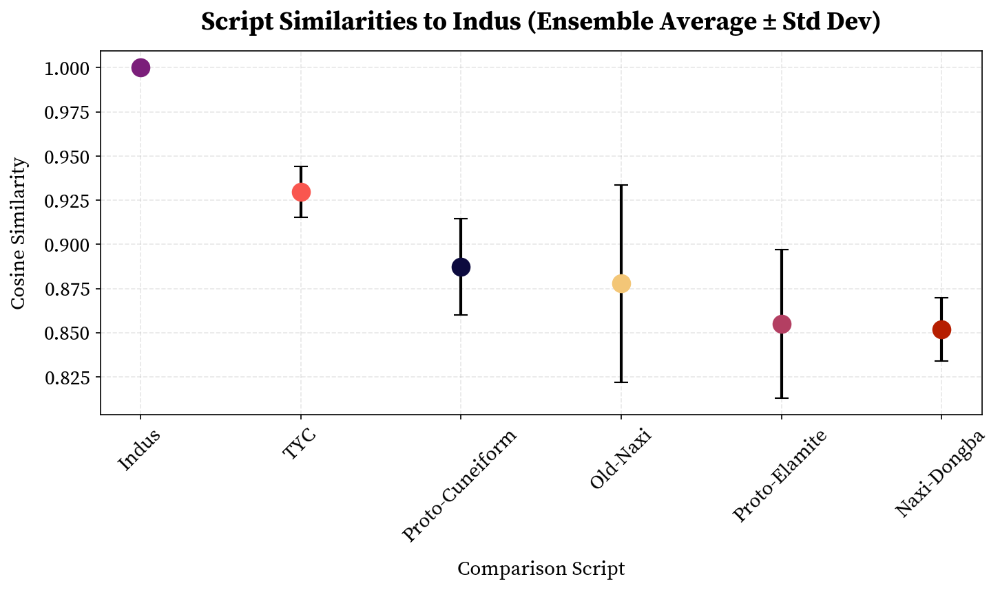

Ensemble similarity plot saved to: /content/drive/MyDrive/script_analysis/results/indus_ensemble_similarities.pdf
Saved Indus similarity results to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/similarity_analysis/Indus_similarities.csv

Analyzing similarities for Proto-Cuneiform...


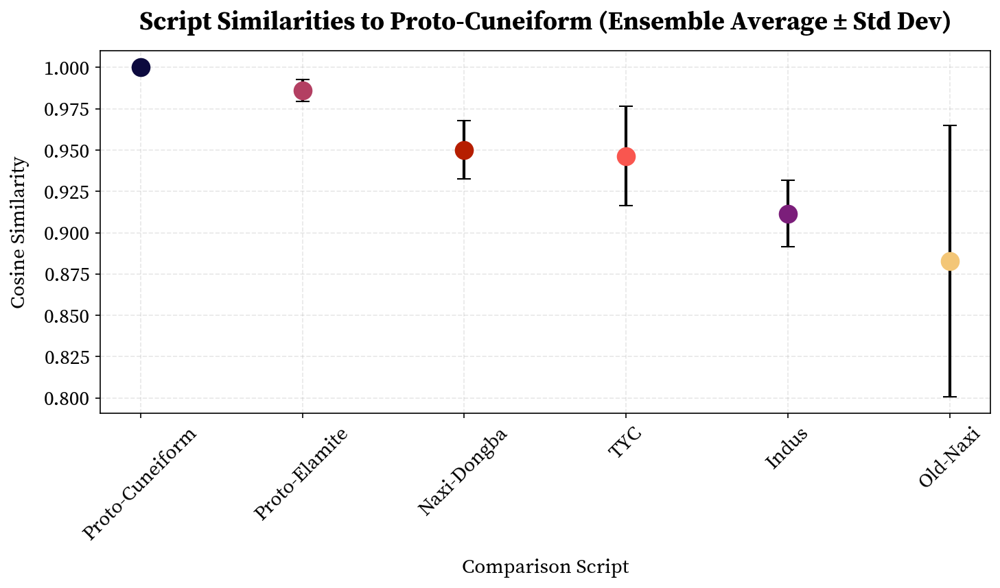

Ensemble similarity plot saved to: /content/drive/MyDrive/script_analysis/results/proto-cuneiform_ensemble_similarities.pdf
Saved Proto-Cuneiform similarity results to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/similarity_analysis/Proto-Cuneiform_similarities.csv

Analyzing similarities for Proto-Elamite...


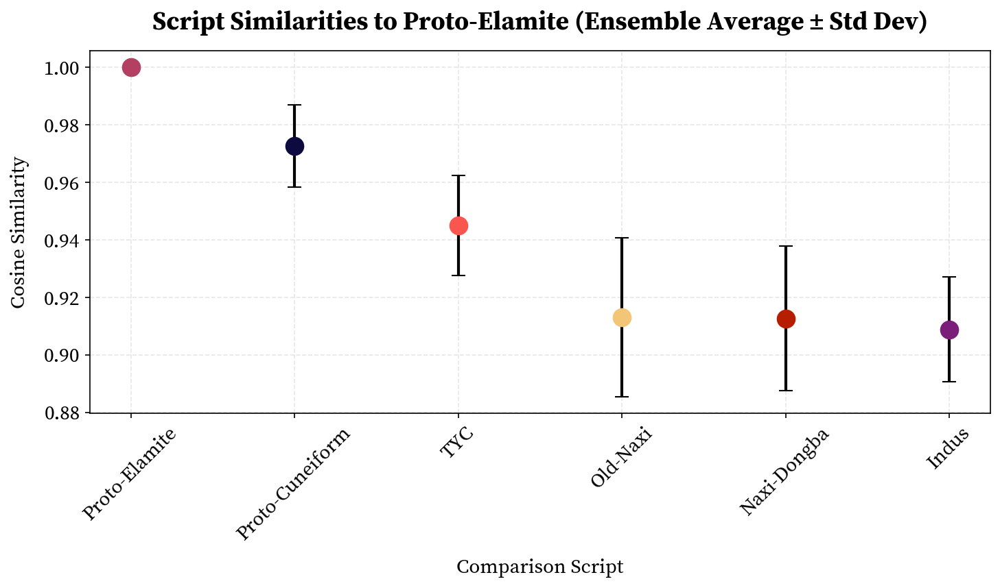

Ensemble similarity plot saved to: /content/drive/MyDrive/script_analysis/results/proto-elamite_ensemble_similarities.pdf
Saved Proto-Elamite similarity results to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/similarity_analysis/Proto-Elamite_similarities.csv

Calculating cross-script similarities...
Saved cross-script similarity results to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/similarity_analysis/cross_script_similarities.csv

Analysis complete. Results saved to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/similarity_analysis

Step 3: Creating t-SNE visualizations for each model...

Creating t-SNE visualizations for Indus (individual models and ensemble)...
  Processing model 1...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Indus/model_1_tsne_interactive.html
  Processing model 2...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Indus/model_2_tsne_interactive.html
  Processing model 3...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Indus/model_3_tsne_interactive.html
  Processing model 4...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Indus/model_4_tsne_interactive.html
  Processing model 5...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Indus/model_5_tsne_interactive.html
  Creating ensemble visualization...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive ensemble plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Indus/ensemble_tsne_interactive.html
    Saved model comparison grid to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Indus/model_comparison_grid.pdf

Creating t-SNE visualizations for Proto-Cuneiform (individual models and ensemble)...
  Processing model 1...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Cuneiform/model_1_tsne_interactive.html
  Processing model 2...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Cuneiform/model_2_tsne_interactive.html
  Processing model 3...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Cuneiform/model_3_tsne_interactive.html
  Processing model 4...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Cuneiform/model_4_tsne_interactive.html
  Processing model 5...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Cuneiform/model_5_tsne_interactive.html
  Creating ensemble visualization...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive ensemble plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Cuneiform/ensemble_tsne_interactive.html
    Saved model comparison grid to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Cuneiform/model_comparison_grid.pdf

Creating t-SNE visualizations for Proto-Elamite (individual models and ensemble)...
  Processing model 1...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Elamite/model_1_tsne_interactive.html
  Processing model 2...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Elamite/model_2_tsne_interactive.html
  Processing model 3...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Elamite/model_3_tsne_interactive.html
  Processing model 4...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Elamite/model_4_tsne_interactive.html
  Processing model 5...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Elamite/model_5_tsne_interactive.html
  Creating ensemble visualization...


/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



    Saved interactive ensemble plot to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Elamite/ensemble_tsne_interactive.html
    Saved model comparison grid to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model/Proto-Elamite/model_comparison_grid.pdf

t-SNE visualizations created for all models and ensemble, saved to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/tsne_per_model

Step 4: Creating PCA visualizations...

Creating PCA visualizations for Indus models and ensemble...
  Processing model 1...
  Processing model 2...
  Processing model 3...
  Processing model 4...
  Processing model 5...
  Creating ensemble PCA visualization...
    Saved model comparison grid to /content/drive/MyDrive/script_analysis/results/comprehensive_analysis_20250311_173443/pca_visualization/Indus/model_comparison_grid_pca.pdf

Creating PCA visualizations for

In [ ]:
RESULTS_DIR = '/content/drive/MyDrive/script_analysis/results'
analysis_results = run_comprehensive_analysis(
    script_names=["Indus", "Proto-Cuneiform", "Proto-Elamite"]
)